# Lab2 PID Control
5EL272 - Alexander Nilsson 

## Given code

Below is PIDControl Straightline Twiddle.py

Final twiddle error = 6.486248420974659e-16


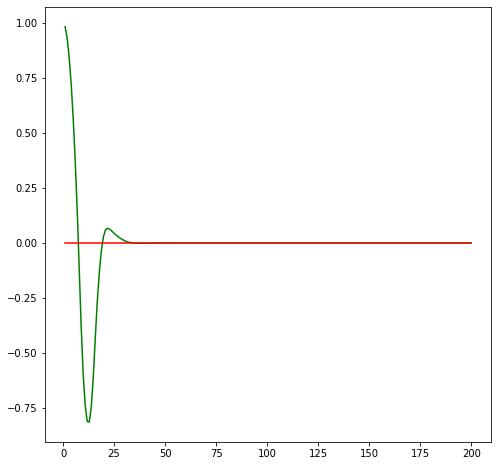

In [ ]:
# PIDControl Straightline Twiddle.py from Udacity--------------
# User Instructions
#
# Implement twiddle as shown in the previous two videos.
# Your accumulated error should be very small!
#
# Your twiddle function should RETURN the accumulated
# error. Try adjusting the parameters p and dp to make
# this error as small as possible.
#
# Try to get your error below 1.0e-10 with as few iterations
# as possible (too many iterations will cause a timeout).
# No cheating!
# ------------

import random
import numpy as np
import matplotlib.pyplot as plt
# ------------------------------------------------
# 
# this is the Robot class
#

class Robot(object):
    def __init__(self, length=20.0):
        """
        Creates robot and initializes location/orientation to 0, 0, 0.
        """
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    def set(self, x, y, orientation):
        """
        Sets a robot coordinate.
        """
        self.x = x
        self.y = y
        self.orientation = orientation % (2.0 * np.pi)

    def set_noise(self, steering_noise, distance_noise):
        """
        Sets the noise parameters.
        """
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = steering_noise
        self.distance_noise = distance_noise

    def set_steering_drift(self, drift):
        """
        Sets the systematical steering drift parameter
        """
        self.steering_drift = drift

    def move(self, steering, distance, tolerance=0.001, max_steering_angle=np.pi / 4.0):
        """
        steering = front wheel steering angle, limited by max_steering_angle
        distance = total distance driven, most be non-negative
        """
        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0

        # make a new copy
        # res = Robot()
        # res.length = self.length
        # res.steering_noise = self.steering_noise
        # res.distance_noise = self.distance_noise
        # res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = np.tan(steering2) * distance2 / self.length

        if abs(turn) < tolerance:
            # approximate by straight line motion
            self.x += distance2 * np.cos(self.orientation)
            self.y += distance2 * np.sin(self.orientation)
            self.orientation = (self.orientation + turn) % (2.0 * np.pi)
        else:
            # approximate bicycle model for motion
            radius = distance2 / turn
            cx = self.x - (np.sin(self.orientation) * radius)
            cy = self.y + (np.cos(self.orientation) * radius)
            self.orientation = (self.orientation + turn) % (2.0 * np.pi)
            self.x = cx + (np.sin(self.orientation) * radius)
            self.y = cy - (np.cos(self.orientation) * radius)

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]' % (self.x, self.y, self.orientation)

############## ADD / MODIFY CODE BELOW ####################
# ------------------------------------------------------------------------
#
# run - does a single control run


def make_robot():
    """
    Resets the robot back to the initial position and drift.
    You'll want to call this after you call `run`.
    """
    robot = Robot()
    robot.set(0.0, 1.0, 0.0)
    robot.set_steering_drift(10.0 / 180.0 * np.pi)
    return robot

# NOTE: We use params instead of tau_p, tau_d, tau_i
def run(robot, params, n=100, speed=1.0):
    x_trajectory = []
    y_trajectory = []
    err = 0
    prev_cte = robot.y
    int_cte = 0
    for i in range(2 * n):
        cte = robot.y
        diff_cte = cte - prev_cte
        int_cte += cte
        prev_cte = cte
        steer = -params[0] * cte - params[1] * diff_cte - params[2] * int_cte
        robot.move(steer, speed)
        x_trajectory.append(robot.x)
        y_trajectory.append(robot.y)
        if i >= n:
            err += cte ** 2
    return x_trajectory, y_trajectory, err / n


# Make this tolerance bigger if you are timing out!
def twiddle(tol=0.2): 
    # Don't forget to call `make_robot` before you call `run`!
    p = [0.0, 0.0, 0.0]
    dp = [1.0, 1.0, 1.0]
    robot = make_robot()
    x_trajectory, y_trajectory, best_err = run(robot, p)

    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            robot = make_robot()
            x_trajectory, y_trajectory, err = run(robot, p)

            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                robot = make_robot()
                x_trajectory, y_trajectory, err = run(robot, p)

                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

params, err = twiddle()
print("Final twiddle error = {}".format(err))
robot = make_robot()
x_trajectory, y_trajectory, err = run(robot, params)
n = len(x_trajectory)

fig, (ax1) = plt.subplots(1, 1, figsize=(8, 8))
ax1.plot(x_trajectory, y_trajectory, 'g', label='Twiddle PID controller')
ax1.plot(x_trajectory, np.zeros(n), 'r', label='reference')

Below is PIDControl Racetrack.py

[x=0.00000 y=26.00000 orient=1.57080]
[x=0.01365 y=26.99988 orient=1.54349]
[x=0.06592 y=27.99840 orient=1.49349]
[x=0.16804 y=28.99307 orient=1.44349]
[x=0.31973 y=29.98139 orient=1.39349]
[x=0.52064 y=30.96090 orient=1.34349]
[x=0.77025 y=31.92914 orient=1.29349]
[x=1.06793 y=32.88369 orient=1.24349]
[x=1.41296 y=33.82218 orient=1.19349]
[x=1.80445 y=34.74224 orient=1.14349]
[x=2.24145 y=35.64159 orient=1.09349]
[x=2.71993 y=36.51960 orient=1.05016]
[x=3.22162 y=37.38464 orient=1.04034]
[x=3.72989 y=38.24584 orient=1.03489]
[x=4.25610 y=39.09613 orient=0.99837]
[x=4.81855 y=39.92283 orient=0.94837]
[x=5.42162 y=40.72039 orient=0.89837]
[x=6.06380 y=41.48681 orient=0.84837]
[x=6.74348 y=42.22017 orient=0.79837]
[x=7.45896 y=42.91865 orient=0.74837]
[x=8.19955 y=43.59058 orient=0.72529]
[x=8.95301 y=44.24807 orient=0.70967]
[x=9.72345 y=44.88548 orient=0.67270]
[x=10.52084 y=45.48877 orient=0.62270]
[x=11.34739 y=46.05146 orient=0.57270]
[x=12.20102 y=46.57213 orient=0.52270]
[x=13.078

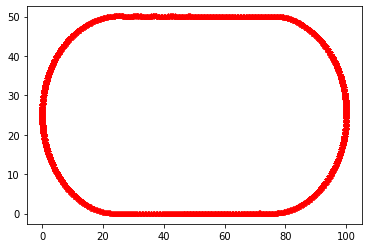

**********************************************************************************

Final parameters:  [10.0, 15.0, 0]

Error:  4.610631668693693


In [ ]:
# --------------
# User Instructions
# 
# Finish the PID in the run function 
#
#
# --------------
 
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#

class robot:

    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
    def cte(self, radius):           
        center1 = [radius, radius] #y,x
        center2 = [radius, 3*radius]
        if self.x > radius and self.x < 3*radius:
            if self.y > radius:
                cte = self.y - (2*radius)
            else:
                cte = -1.0 * self.y
        else:
            if self.x < 2*radius:
                cte = ((self.x - center1[1])**2 + (self.y - center1[0])**2)**0.5 - radius
            else:
                cte = ((self.x - center2[1])**2 + (self.y - center2[0])**2)**0.5 - radius                
        
       
        return cte
# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 1.0 # motion distance is equal to speed (we assume time = 1)
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []
    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error += crosstrack_error
        int_crosstrack_error += crosstrack_error
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)
    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  
    

radius = 25.0
params = [10.0, 15.0, 0]

 
err = run(params, radius,True)

Below is PIDControl RaceTrack Twiddle.py

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  350095.9328173046
**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  394200.73702662915
**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  938022.3248256881
**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  1155.4756425080072
**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 1.0]

Error:  986694.126725234
**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, -1.0]

Error:  704971.7344445905
************************************************************

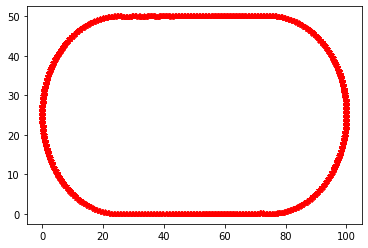

**********************************************************************************

Final parameters:  [10.444513227614667, 20.611089139854176, 1.514601808790187]

Error:  0.5487410829956119


In [ ]:
# --------------
# User Instructions
# 
# Finish the PID in the run function 
#
#
# --------------
 
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#

class robot:

    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
    def cte(self, radius):#Refer to L6 Control, p 28. 
        center1 = [radius, radius] 
        center2 = [radius, 3*radius]
        if self.x > radius and self.x < 3*radius: #If x lies in the center straight line segment
            if self.y > radius: #If y is above the center line, then compute vertical distance from (x,y) to the top edge of the track
                cte = self.y - (2*radius)
            else: #If y is below the center line, then compute vertical distance from the bottom edge of the track to (x,y)
                cte = -1.0 * self.y
        else:
            if self.x < 2*radius: #If x lies in the left semi-circle segment (self.x <= radius), then compute Euclidian distance from (x,y) to the perimeter of the left semi-circle 
                cte = ((self.x - center1[1])**2 + (self.y - center1[0])**2)**0.5 - radius
            else: #If x lies in the right semi-circle part (self.x >= 3*radius), then compute Euclidian distance from (x,y) to the perimeter of the right semi-circle
                cte = ((self.x - center2[1])**2 + (self.y - center2[0])**2)**0.5 - radius                
        
       
        return cte
# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 1.0 # motion distance is equal to speed (we assume time = 1)
    err = 0.0
    int_crosstrack_error = 0.0
    N =1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []
    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error += crosstrack_error
        int_crosstrack_error += crosstrack_error
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)
    if printflag:
      plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
      plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    dp = [1.0, 1.0, 1.0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err


radius = 25.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,True)

## Task 1

Start from PIDControl Racetrack
Twiddle.py, change the track shape to a round circle with radius 50 (so you need to modify the
function cte() for computing cross-track error), and modify twiddle() to tune:

1. P controller, with 𝐾𝑖 = 𝐾𝑑 = 0;
2. PI controller, with 𝐾𝑑 = 0;
3. PD controller, with 𝐾𝑖 = 0;
4. PID controller.

### 1. P controller, with 𝐾𝑖 = 𝐾𝑑 = 0;

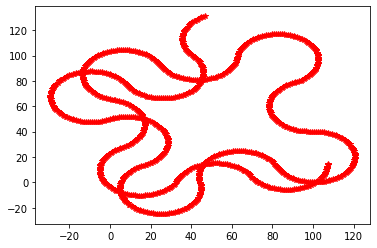

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  317122.8860246721


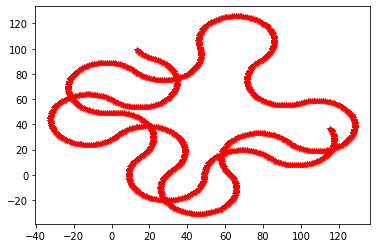

**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  329648.4439749039


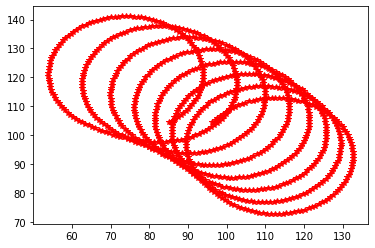

**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  918695.6580140312


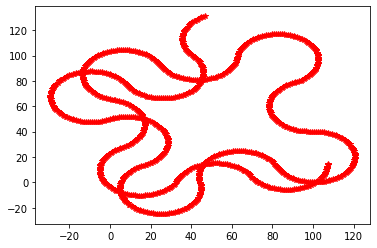

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.0, 0.0]

Error:  317122.88082760473


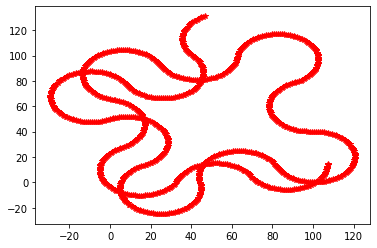

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.0, 0.0]

Error:  317122.88082760473


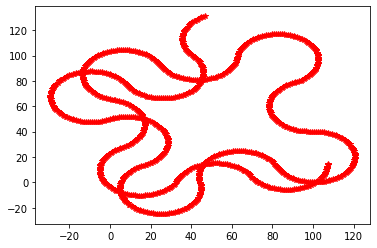

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.0, 0.0]

Error:  317122.88082760473


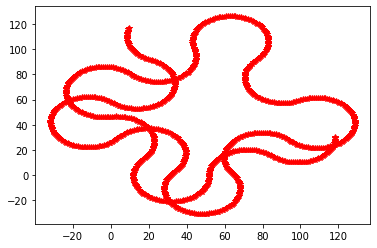

**********************************************************************************

Final parameters:  [1.7999999999999998, 0.0, 0.0]

Error:  323959.1453129223


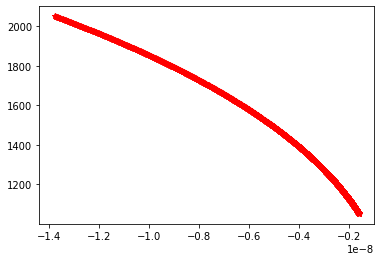

**********************************************************************************

Final parameters:  [-2.220446049250313e-16, 0.0, 0.0]

Error:  2186796854.6533947


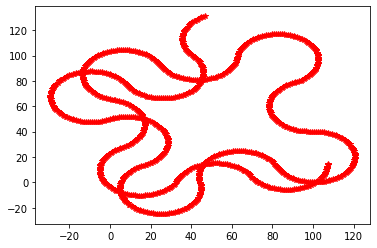

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.0]

Error:  317122.8834228675


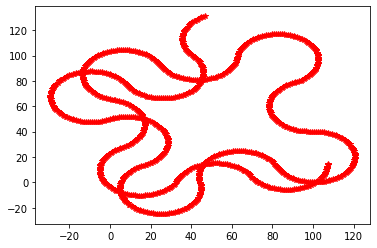

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.0]

Error:  317122.8834228675


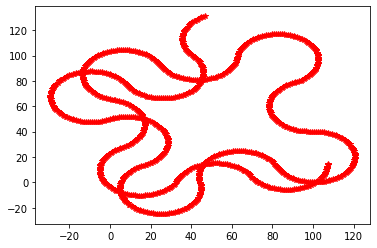

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.0]

Error:  317122.8834228675


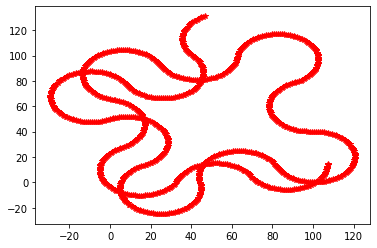

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.0]

Error:  317122.8834228675


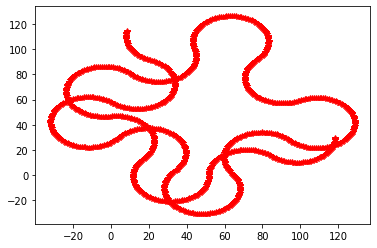

**********************************************************************************

Final parameters:  [1.71, 0.0, 0.0]

Error:  324851.01543821185


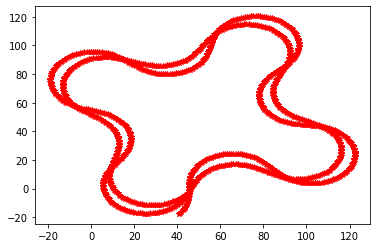

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


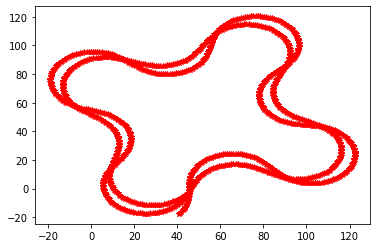

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


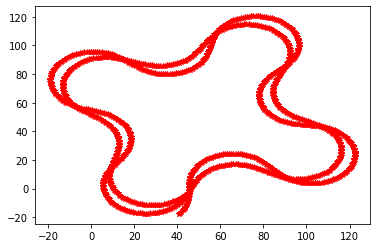

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


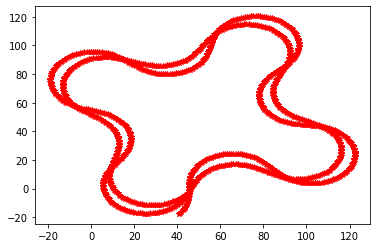

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


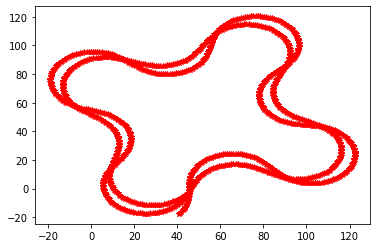

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


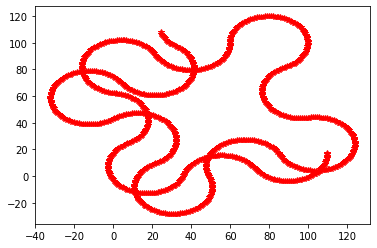

**********************************************************************************

Final parameters:  [0.981, 0.0, 0.0]

Error:  331009.0744319134


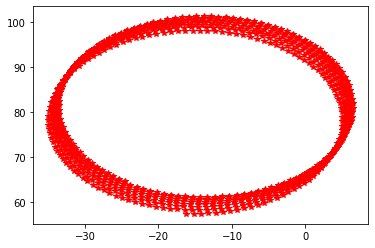

**********************************************************************************

Final parameters:  [-0.8010000000000003, 0.0, 0.0]

Error:  692941.6962328958


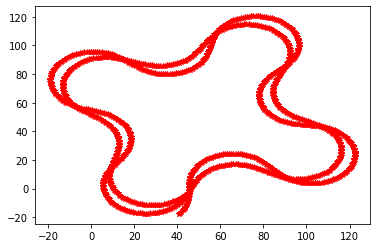

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


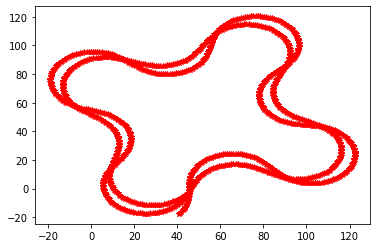

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


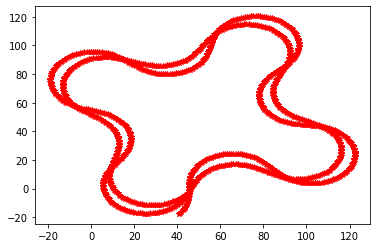

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


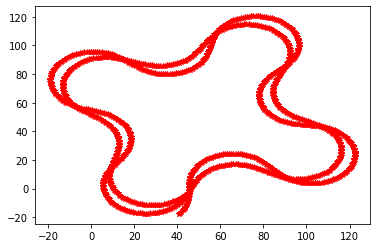

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


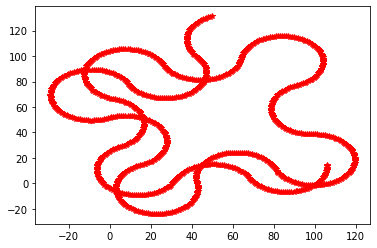

**********************************************************************************

Final parameters:  [0.8919, 0.0, 0.0]

Error:  315925.7198855896


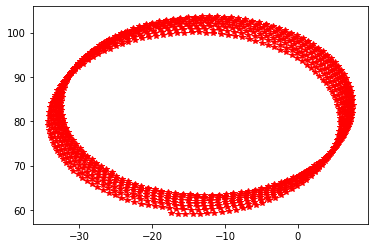

**********************************************************************************

Final parameters:  [-0.7119000000000003, 0.0, 0.0]

Error:  696298.2798133792


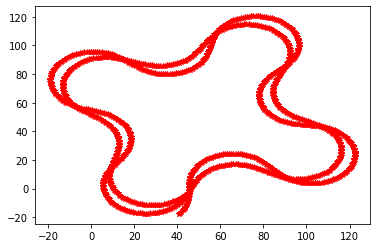

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


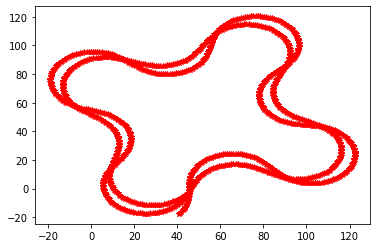

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


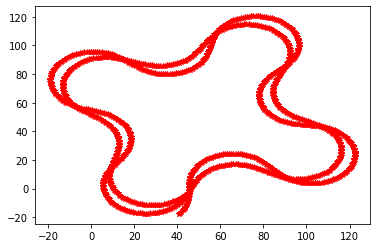

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


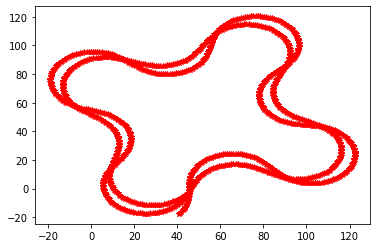

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


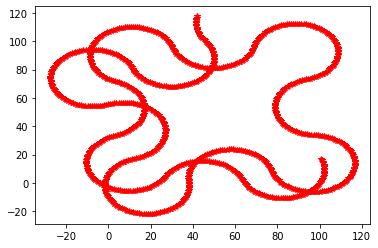

**********************************************************************************

Final parameters:  [0.81171, 0.0, 0.0]

Error:  316282.48098976567


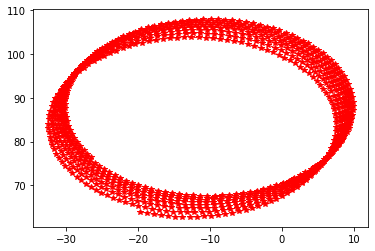

**********************************************************************************

Final parameters:  [-0.6317100000000003, 0.0, 0.0]

Error:  699600.3049700265


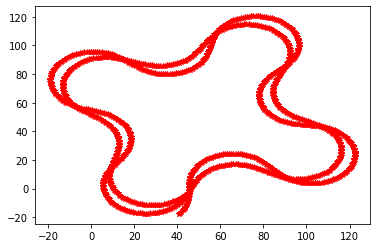

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


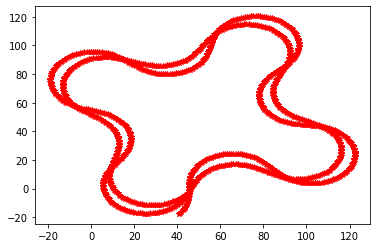

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


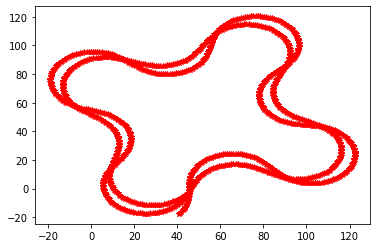

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


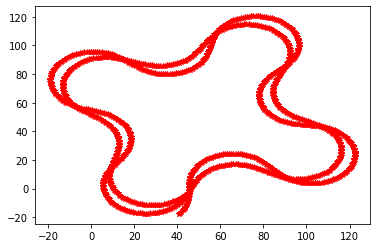

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


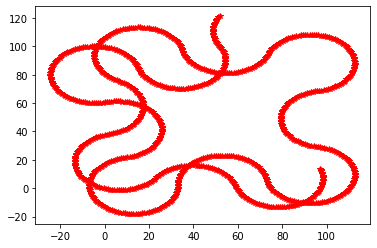

**********************************************************************************

Final parameters:  [0.7395390000000001, 0.0, 0.0]

Error:  312263.0754365807


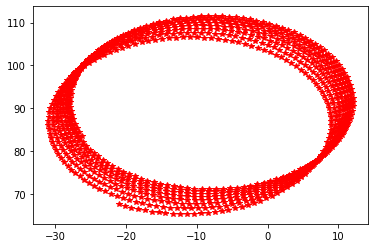

**********************************************************************************

Final parameters:  [-0.5595390000000003, 0.0, 0.0]

Error:  702868.9018530126


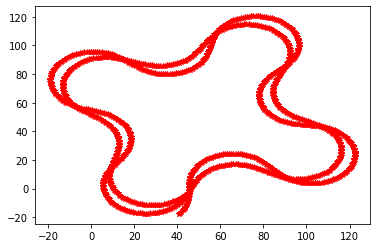

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


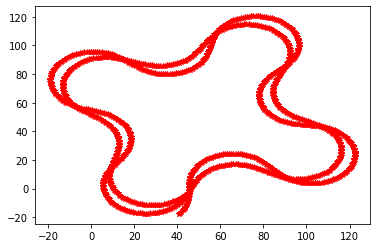

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


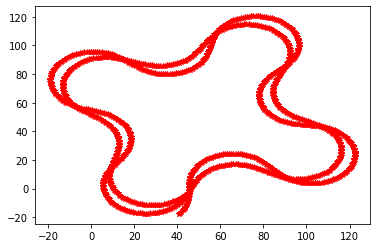

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


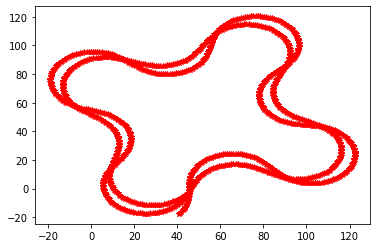

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


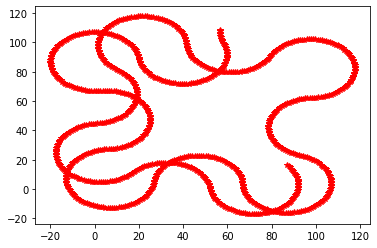

**********************************************************************************

Final parameters:  [0.6745851, 0.0, 0.0]

Error:  312524.936477726


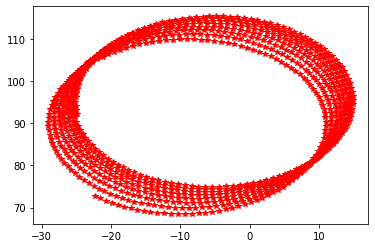

**********************************************************************************

Final parameters:  [-0.49458510000000033, 0.0, 0.0]

Error:  706701.7897803335


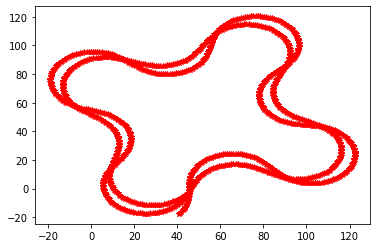

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


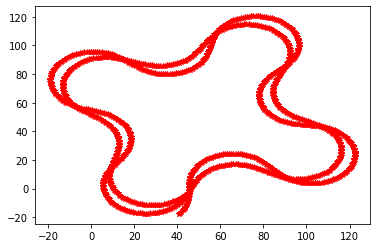

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


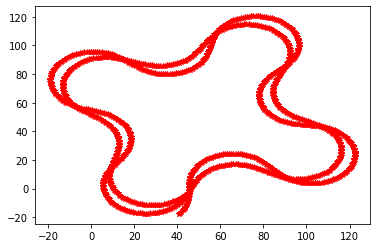

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


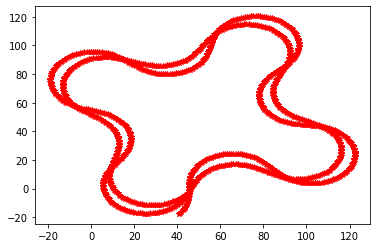

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


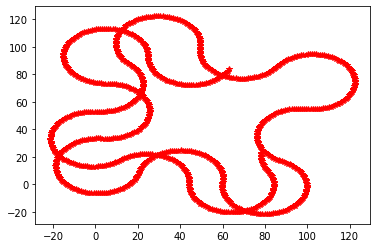

**********************************************************************************

Final parameters:  [0.61612659, 0.0, 0.0]

Error:  325376.5560616138


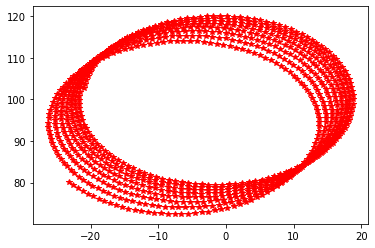

**********************************************************************************

Final parameters:  [-0.4361265900000003, 0.0, 0.0]

Error:  710733.7331810186


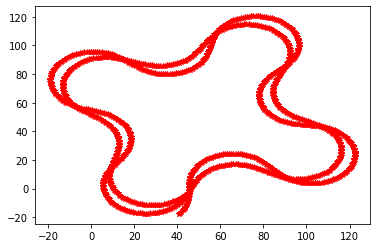

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


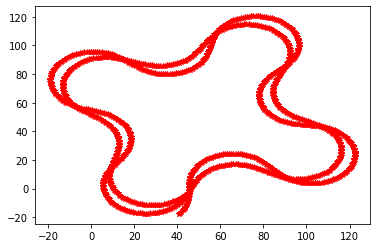

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


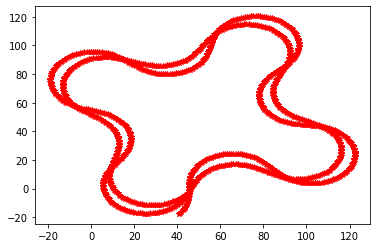

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


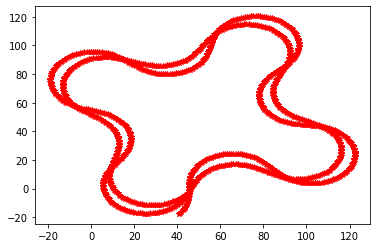

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


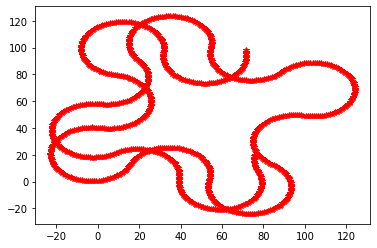

**********************************************************************************

Final parameters:  [0.563513931, 0.0, 0.0]

Error:  307728.8387012499


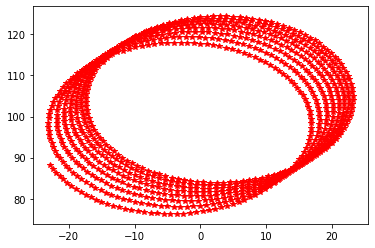

**********************************************************************************

Final parameters:  [-0.3835139310000003, 0.0, 0.0]

Error:  715401.0916304153


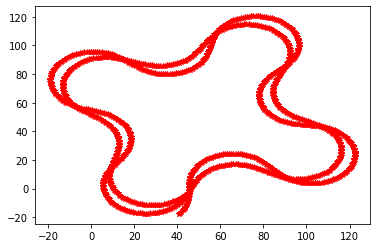

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


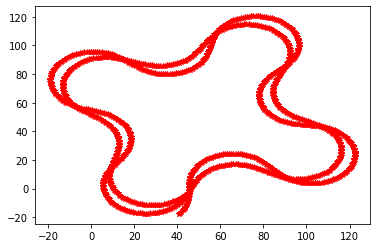

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


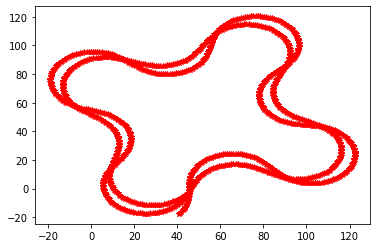

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


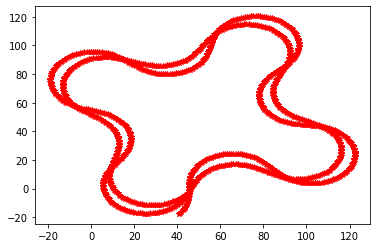

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


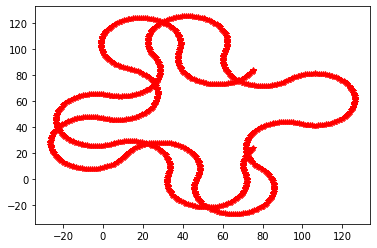

**********************************************************************************

Final parameters:  [0.5161625379, 0.0, 0.0]

Error:  311529.3471922113


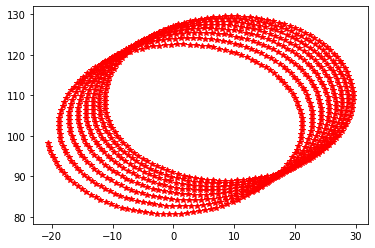

**********************************************************************************

Final parameters:  [-0.3361625379000003, 0.0, 0.0]

Error:  719767.2063991356


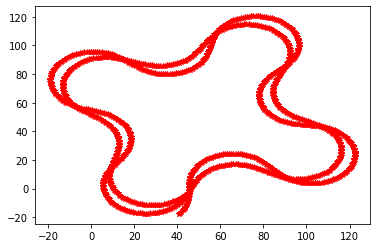

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


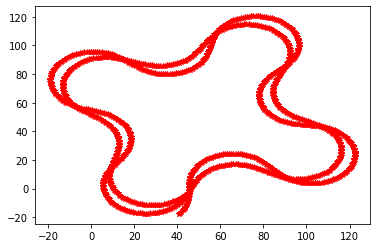

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


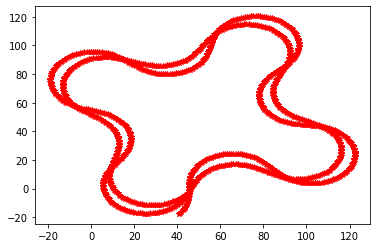

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


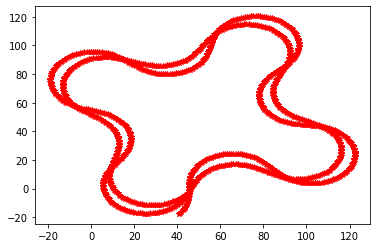

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


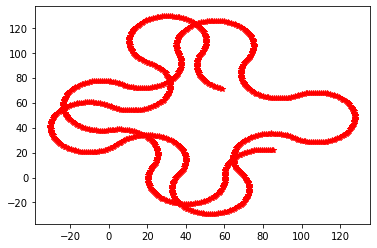

**********************************************************************************

Final parameters:  [0.47354628411, 0.0, 0.0]

Error:  311334.09809646674


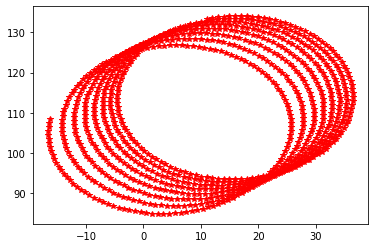

**********************************************************************************

Final parameters:  [-0.2935462841100003, 0.0, 0.0]

Error:  726065.4263194851


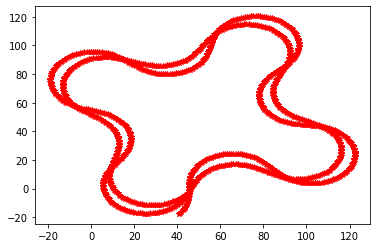

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


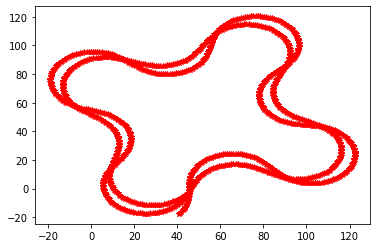

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


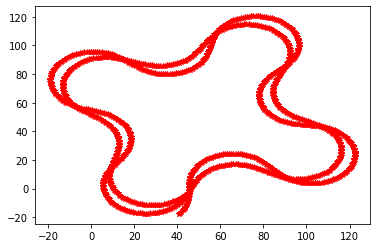

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


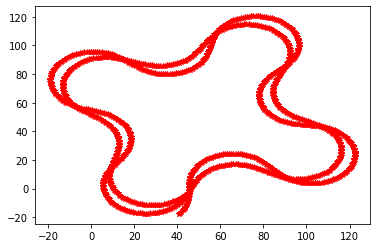

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


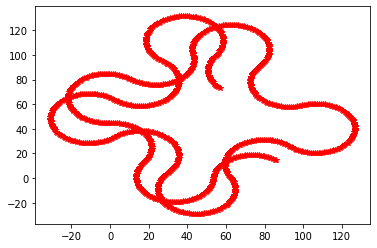

**********************************************************************************

Final parameters:  [0.435191655699, 0.0, 0.0]

Error:  307746.3139332095


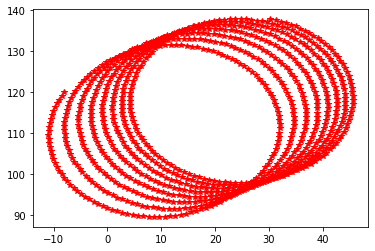

**********************************************************************************

Final parameters:  [-0.25519165569900026, 0.0, 0.0]

Error:  735310.6095109946


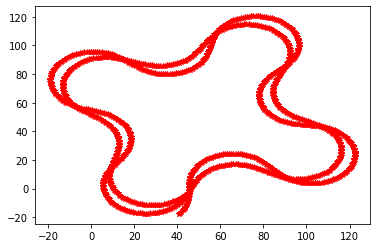

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


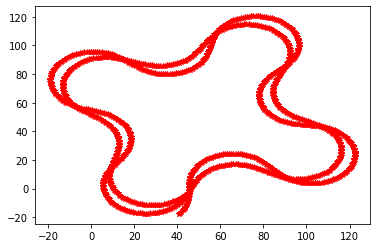

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


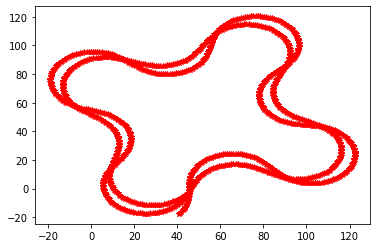

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


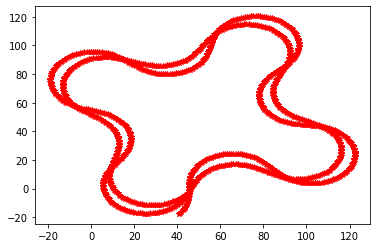

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


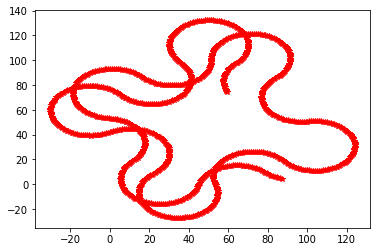

**********************************************************************************

Final parameters:  [0.4006724901291, 0.0, 0.0]

Error:  300254.73402698204


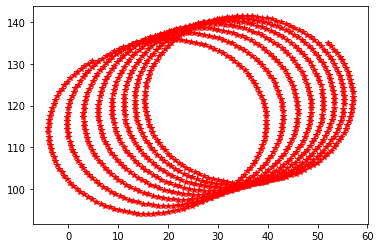

**********************************************************************************

Final parameters:  [-0.22067249012910028, 0.0, 0.0]

Error:  748877.3458055448


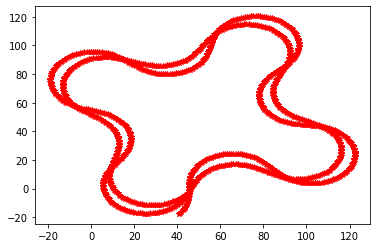

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


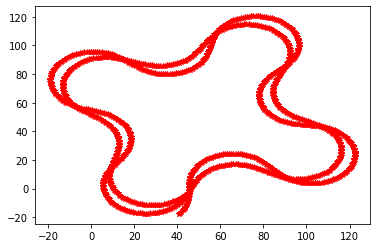

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


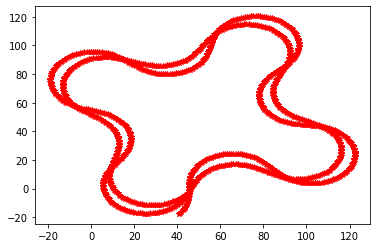

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


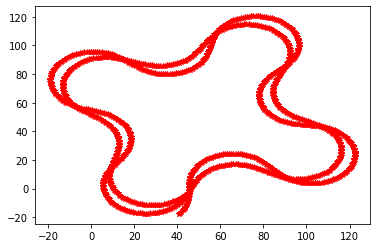

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


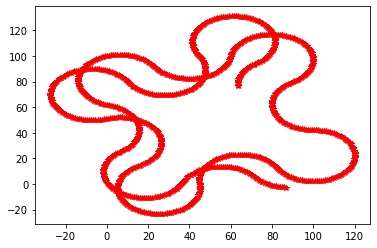

**********************************************************************************

Final parameters:  [0.36960524111619, 0.0, 0.0]

Error:  295998.0931135849


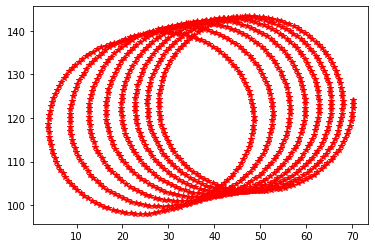

**********************************************************************************

Final parameters:  [-0.18960524111619026, 0.0, 0.0]

Error:  770015.1408751424


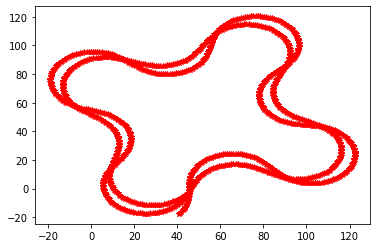

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


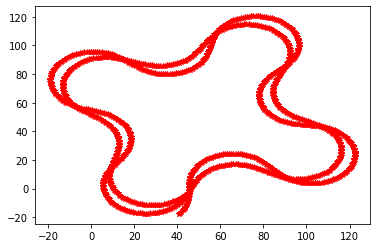

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


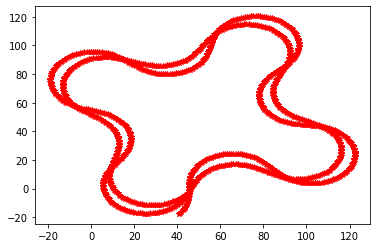

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


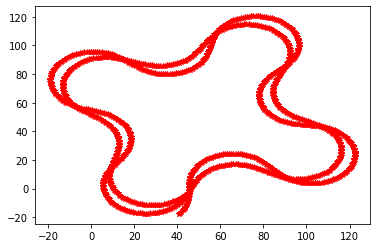

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


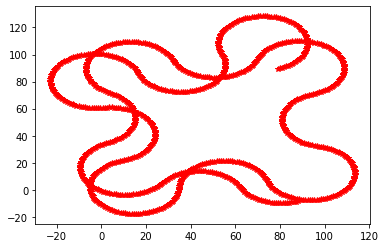

**********************************************************************************

Final parameters:  [0.341644717004571, 0.0, 0.0]

Error:  305663.29266520863


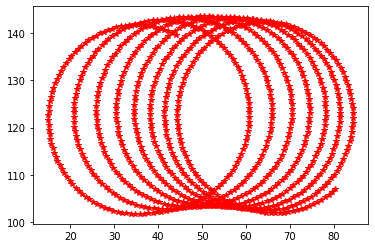

**********************************************************************************

Final parameters:  [-0.16164471700457128, 0.0, 0.0]

Error:  802080.3527278233


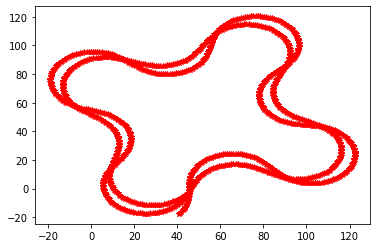

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


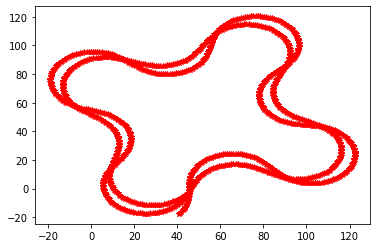

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


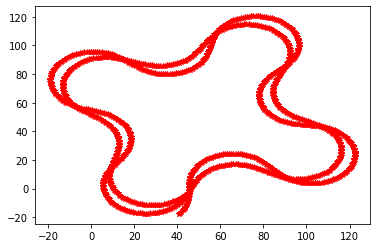

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


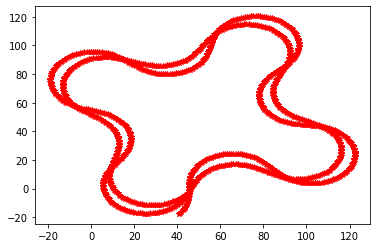

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


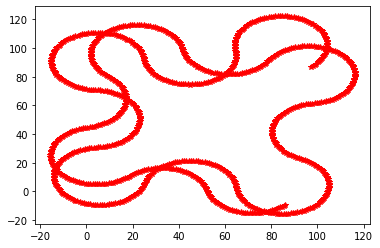

**********************************************************************************

Final parameters:  [0.3164802453041139, 0.0, 0.0]

Error:  309184.95097219135


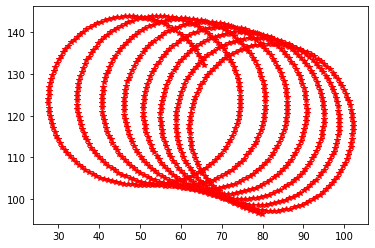

**********************************************************************************

Final parameters:  [-0.13648024530411418, 0.0, 0.0]

Error:  842124.4425880198


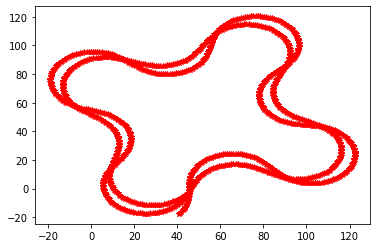

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


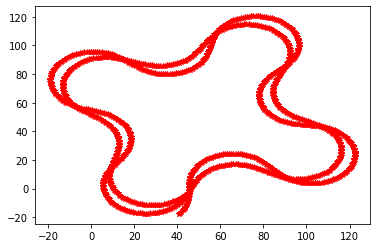

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


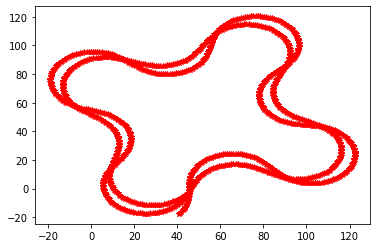

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


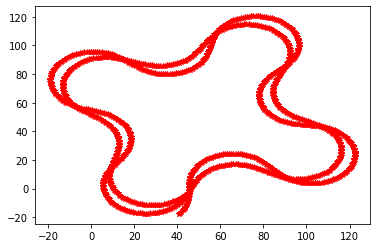

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


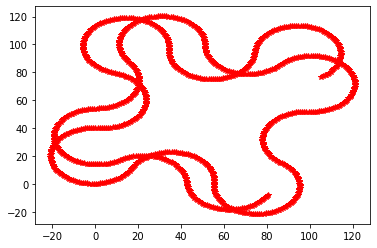

**********************************************************************************

Final parameters:  [0.2938322207737025, 0.0, 0.0]

Error:  302828.94014753186


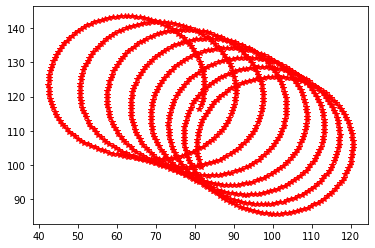

**********************************************************************************

Final parameters:  [-0.11383222077370275, 0.0, 0.0]

Error:  888008.7475104333


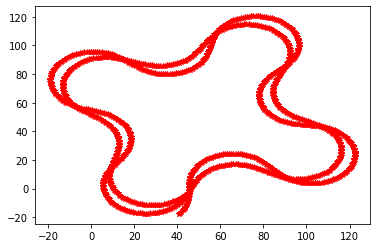

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.0]

Error:  217934.60353584934


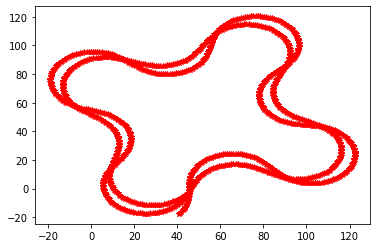

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.0]

Error:  217934.60353584934


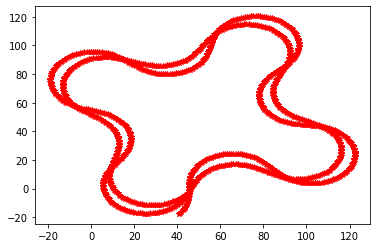

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.0]

Error:  217934.60353584934


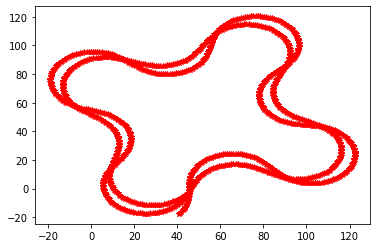

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.0]

Error:  217934.60353584934
[x=0.00000 y=51.00000 orient=1.57080]
[x=0.00000 y=52.00000 orient=1.57075]
[x=0.00004 y=53.00000 orient=1.57057]
[x=0.00027 y=54.00000 orient=1.57017]
[x=0.00090 y=55.00000 orient=1.56945]
[x=0.00281 y=56.00000 orient=1.56833]
[x=0.00607 y=56.99999 orient=1.56673]
[x=0.01122 y=57.99998 orient=1.56456]
[x=0.01887 y=58.99995 orient=1.56175]
[x=0.02969 y=59.99989 orient=1.55821]
[x=0.04444 y=60.99978 orient=1.55387]
[x=0.06397 y=61.99959 orient=1.54867]
[x=0.08917 y=62.99927 orient=1.54253]
[x=0.12100 y=63.99876 orient=1.53539]
[x=0.16050 y=64.99798 orient=1.52719]
[x=0.20874 y=65.99681 orient=1.51787]
[x=0.26688 y=66.99511 orient=1.50738]
[x=0.33610 y=67.99271 orient=1.49567]
[x=0.41763 y=68.98937 orient=1.48268]
[x=0.51274 y=69.98483 orient=1.46839]
[x=0.62275 y=70.97875 orient=1.45274]
[x=0.74899 y=71.97074 orient=1.43570]
[

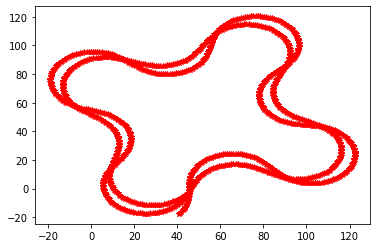

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.0]

Error:  217934.60353584934


In [ ]:
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#
class robot:
    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
   # modify CTE to a circle with r= 50
    def cte(self, radius):           
         #center = [50, 50] # y, x coordinates of the center of the circle
         center = [radius, radius]
         cte = ((self.x - center[1])**2 + (self.y - center[0])**2)**0.5 - radius
         return cte

# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 1.0 # motion distance is equal to speed (we assume time = 1)
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []
    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error += crosstrack_error
        int_crosstrack_error += crosstrack_error                                
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error 
        myrobot = myrobot.move(steer, speed)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)
    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

########twiddle

def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    # PID -> dp [1.0, 1.0, 1.0]
    dp = [1.0, 0, 0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

    
## changed r to 50
radius = 50.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,True)

### 2. PI controller, with 𝐾𝑑 = 0;

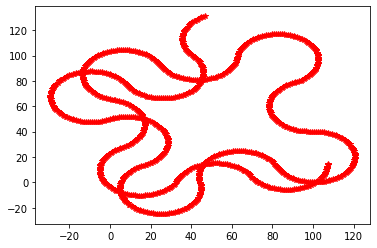

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  317122.8860246721


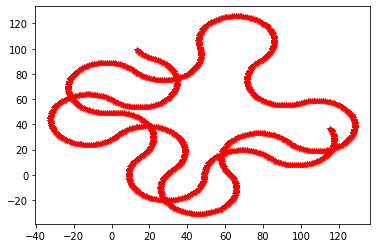

**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  329648.4439749039


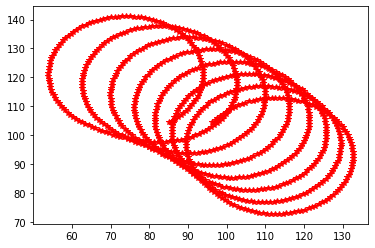

**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  918695.6580140312


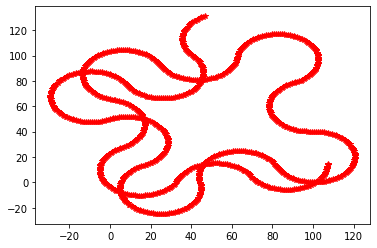

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.0, 0.0]

Error:  317122.88082760473


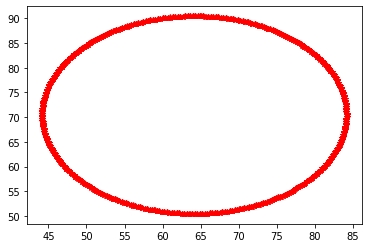

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.0, 1.0]

Error:  604649.1713495865


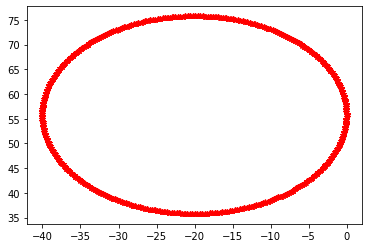

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.0, -1.0]

Error:  671271.6875369493


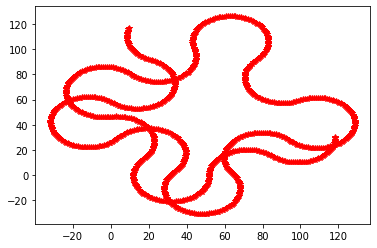

**********************************************************************************

Final parameters:  [1.7999999999999998, 0.0, 0.0]

Error:  323959.1453129223


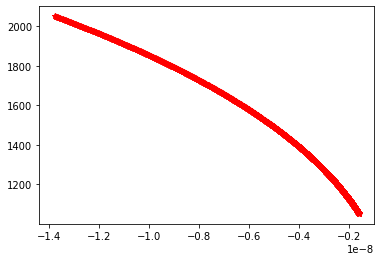

**********************************************************************************

Final parameters:  [-2.220446049250313e-16, 0.0, 0.0]

Error:  2186796854.6533947


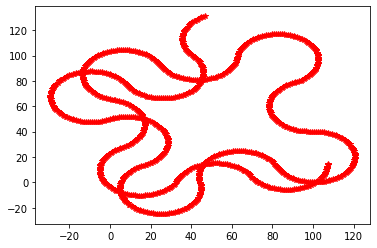

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.0]

Error:  317122.8834228675


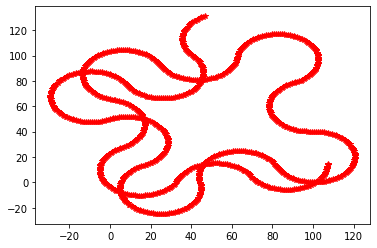

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.0]

Error:  317122.8834228675


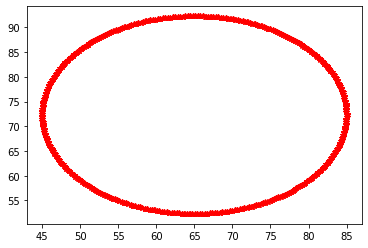

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, 0.9]

Error:  542897.0483774986


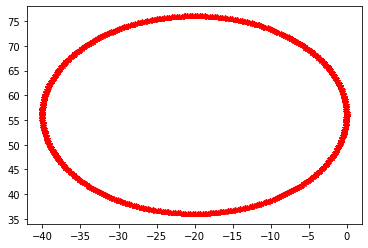

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.0, -0.9]

Error:  672084.1539265822


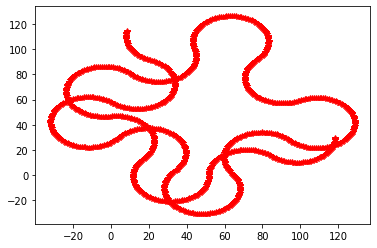

**********************************************************************************

Final parameters:  [1.71, 0.0, 0.0]

Error:  324851.01543821185


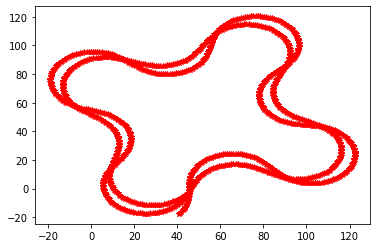

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


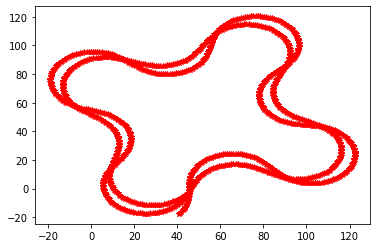

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


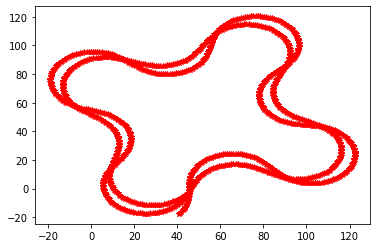

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


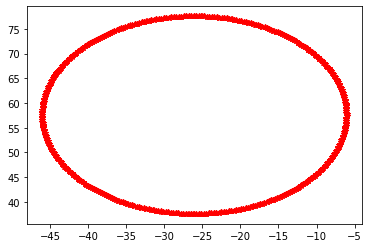

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.81]

Error:  961102.351157064


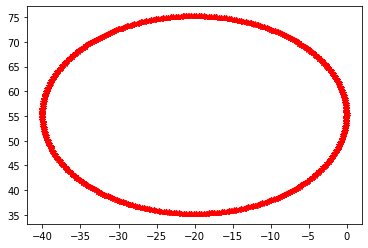

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, -0.81]

Error:  669397.8186580428


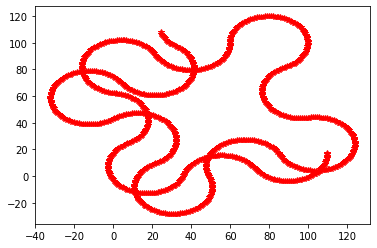

**********************************************************************************

Final parameters:  [0.981, 0.0, 0.0]

Error:  331009.0744319134


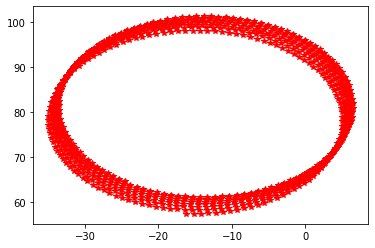

**********************************************************************************

Final parameters:  [-0.8010000000000003, 0.0, 0.0]

Error:  692941.6962328958


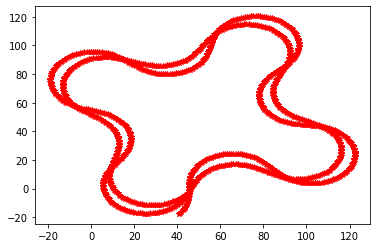

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


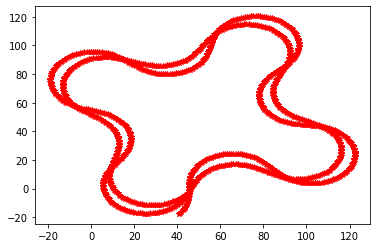

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


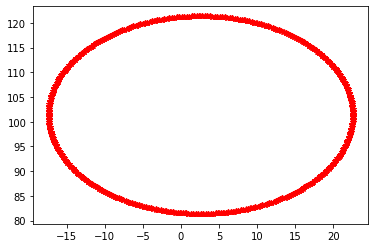

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.7290000000000001]

Error:  650661.3428210054


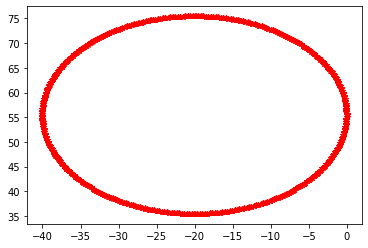

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, -0.7290000000000001]

Error:  670491.5235449983


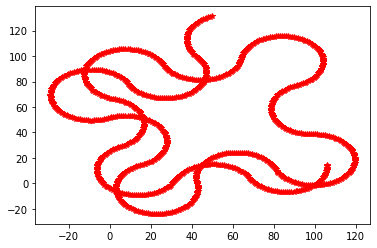

**********************************************************************************

Final parameters:  [0.8919, 0.0, 0.0]

Error:  315925.7198855896


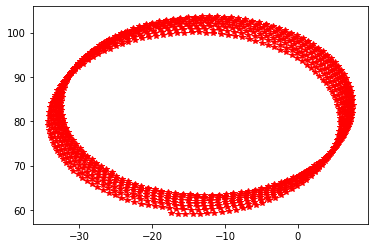

**********************************************************************************

Final parameters:  [-0.7119000000000003, 0.0, 0.0]

Error:  696298.2798133792


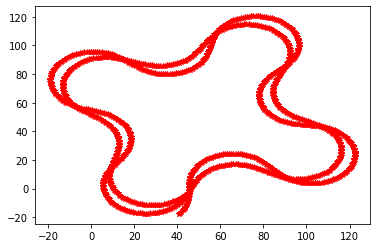

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


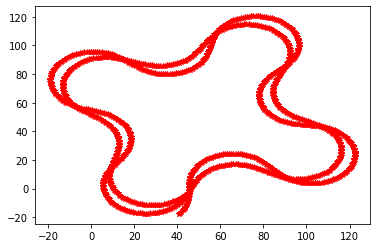

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.0]

Error:  217934.6035358247


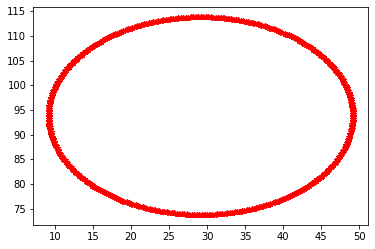

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


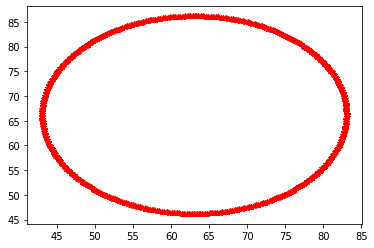

**********************************************************************************

Final parameters:  [0.81171, 0.0, 0.6561000000000001]

Error:  731674.1832597208


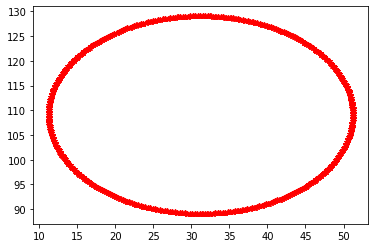

**********************************************************************************

Final parameters:  [-0.6317100000000003, 0.0, 0.6561000000000001]

Error:  380203.29556113563


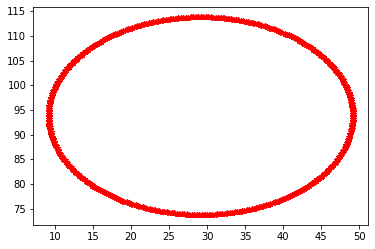

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


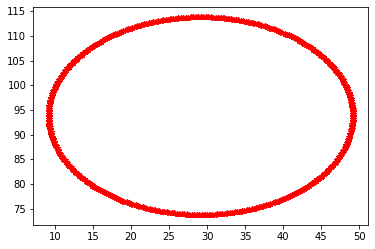

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


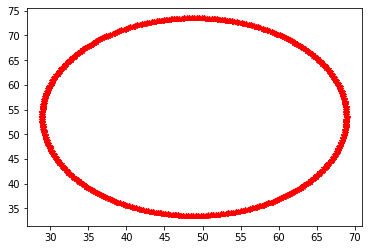

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.3778100000000002]

Error:  897715.8576151575


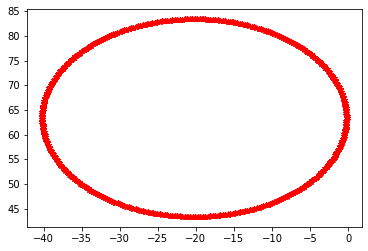

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, -0.06561000000000017]

Error:  722745.6578854478


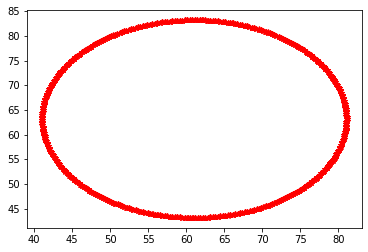

**********************************************************************************

Final parameters:  [0.7395390000000001, 0.0, 0.6561]

Error:  803652.8145069184


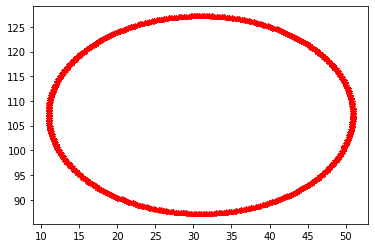

**********************************************************************************

Final parameters:  [-0.5595390000000003, 0.0, 0.6561]

Error:  337894.8453885179


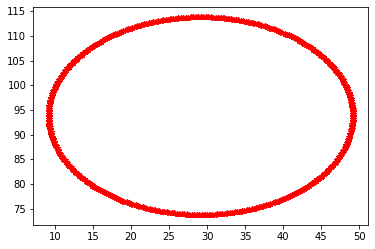

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


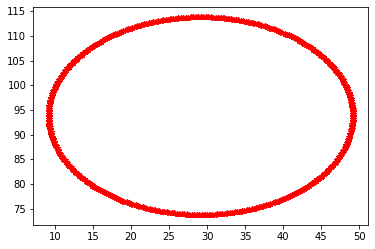

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


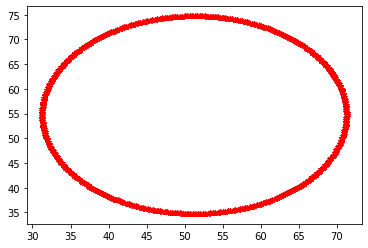

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.3056390000000002]

Error:  894946.6279407372


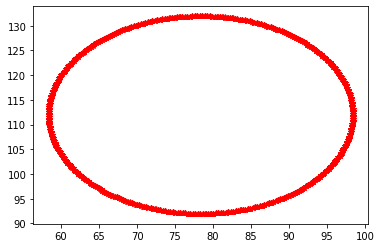

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.006560999999999817]

Error:  580523.9584129667


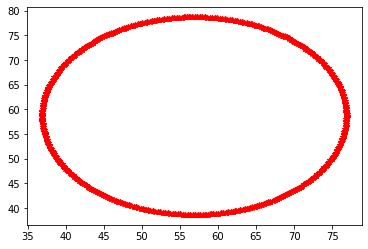

**********************************************************************************

Final parameters:  [0.6745851, 0.0, 0.6561]

Error:  866866.7125533564


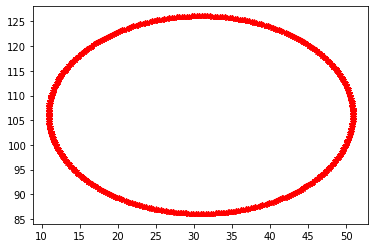

**********************************************************************************

Final parameters:  [-0.49458510000000033, 0.0, 0.6561]

Error:  315406.8780073277


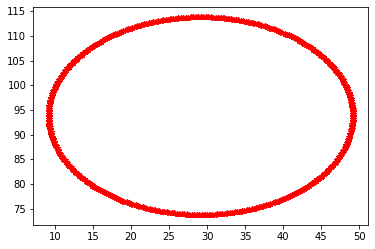

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


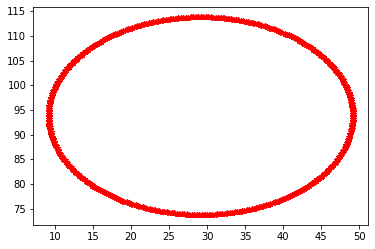

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


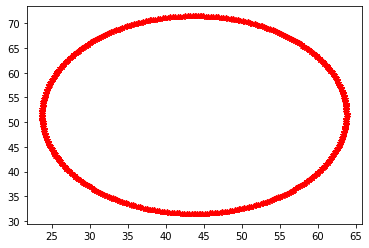

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.2406851000000003]

Error:  890282.291889691


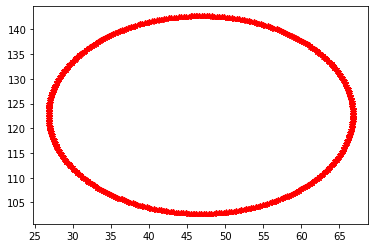

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.07151489999999994]

Error:  773804.6996965825


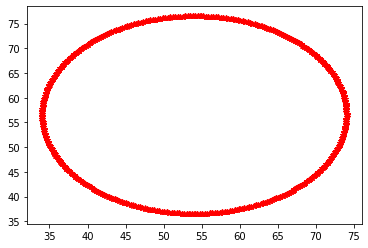

**********************************************************************************

Final parameters:  [0.61612659, 0.0, 0.6561000000000001]

Error:  885720.4056577594


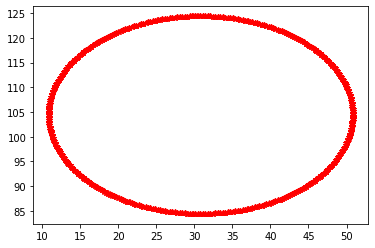

**********************************************************************************

Final parameters:  [-0.4361265900000003, 0.0, 0.6561000000000001]

Error:  284984.17677634954


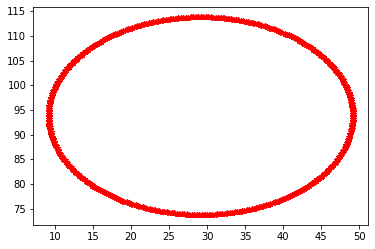

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


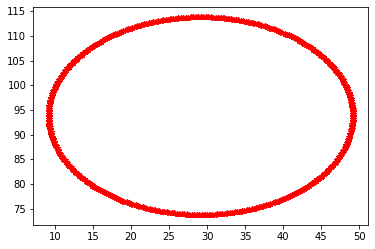

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


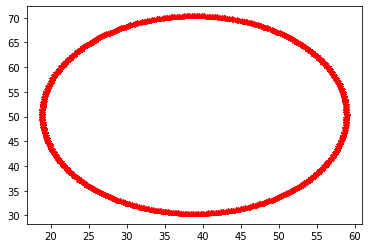

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.1822265900000004]

Error:  865924.8520162532


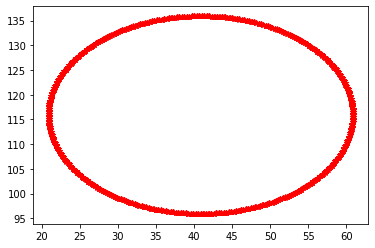

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.12997341000000007]

Error:  517932.78526628297


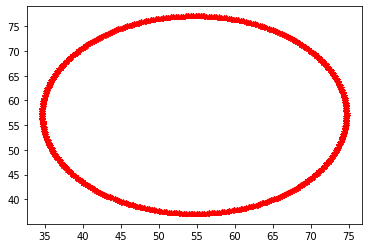

**********************************************************************************

Final parameters:  [0.563513931, 0.0, 0.6561000000000002]

Error:  882098.3237128016


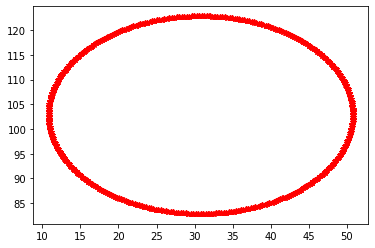

**********************************************************************************

Final parameters:  [-0.3835139310000003, 0.0, 0.6561000000000002]

Error:  260194.86568958915


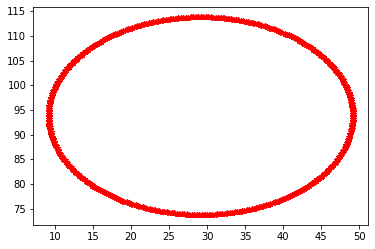

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000002]

Error:  193772.89849760596


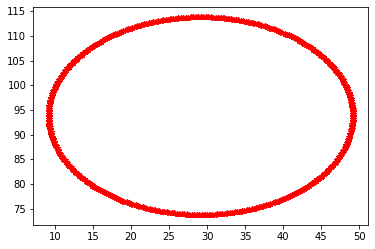

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000002]

Error:  193772.89849760596


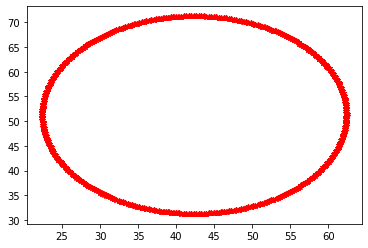

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.1296139310000004]

Error:  885015.9263109022


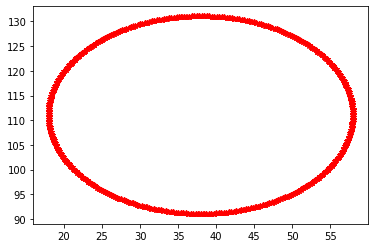

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.18258606900000007]

Error:  386196.8091276226


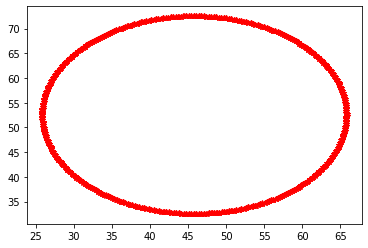

**********************************************************************************

Final parameters:  [0.5161625379, 0.0, 0.6561000000000002]

Error:  894905.7327592052


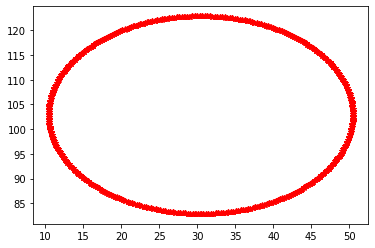

**********************************************************************************

Final parameters:  [-0.3361625379000003, 0.0, 0.6561000000000002]

Error:  262550.0742378224


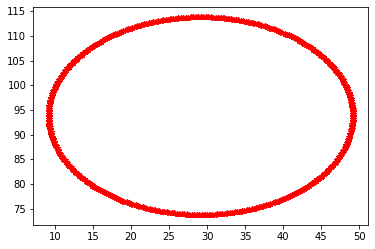

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000002]

Error:  193772.89849760596


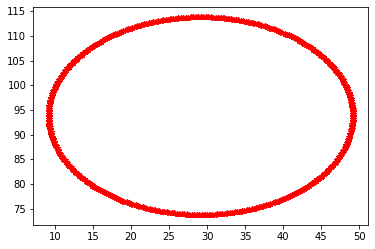

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000002]

Error:  193772.89849760596


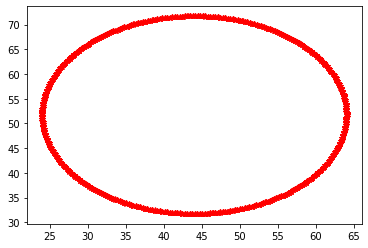

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.0822625379000004]

Error:  890864.7016445248


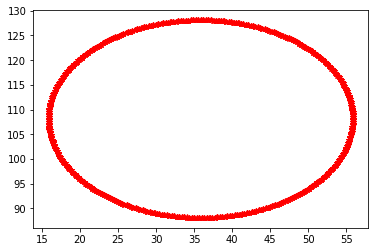

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.2299374621000001]

Error:  326656.22781911114


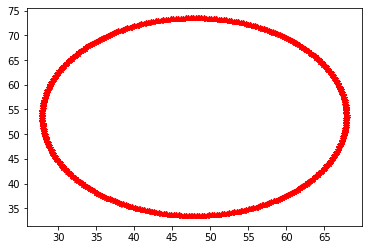

**********************************************************************************

Final parameters:  [0.47354628411, 0.0, 0.6561000000000002]

Error:  896992.9276805934


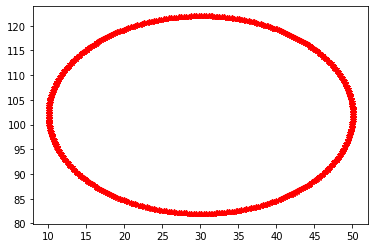

**********************************************************************************

Final parameters:  [-0.2935462841100003, 0.0, 0.6561000000000002]

Error:  251430.41735752


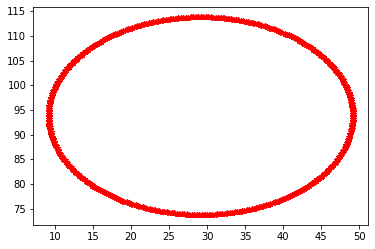

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000002]

Error:  193772.89849760596


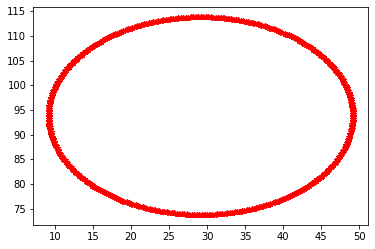

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000002]

Error:  193772.89849760596


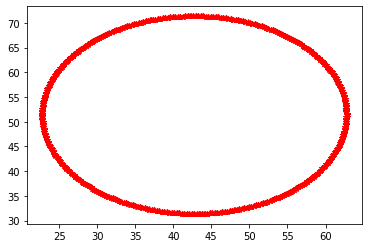

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.0396462841100003]

Error:  886492.5300573827


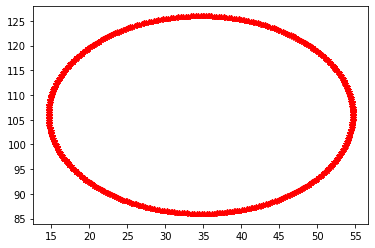

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.27255371589]

Error:  290977.18114904955


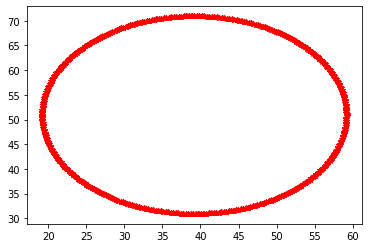

**********************************************************************************

Final parameters:  [0.435191655699, 0.0, 0.6561000000000001]

Error:  867515.4552053779


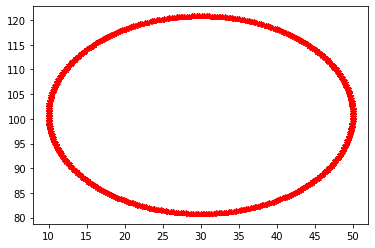

**********************************************************************************

Final parameters:  [-0.25519165569900026, 0.0, 0.6561000000000001]

Error:  237058.2120135407


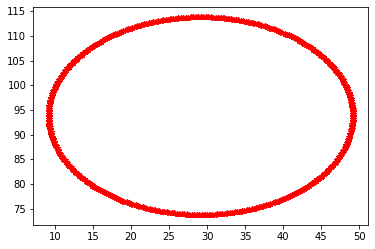

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


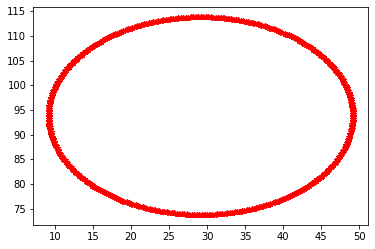

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561000000000001]

Error:  193772.89849760596


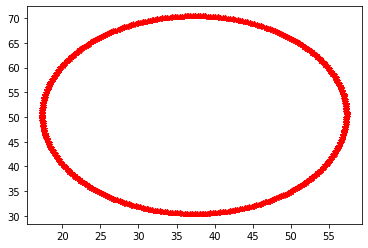

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 1.0012916556990001]

Error:  853951.2107702248


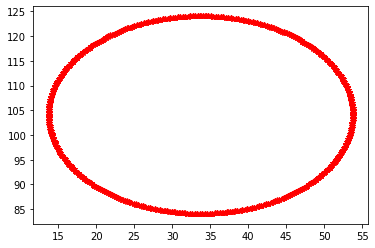

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.3109083443009999]

Error:  263377.797689149


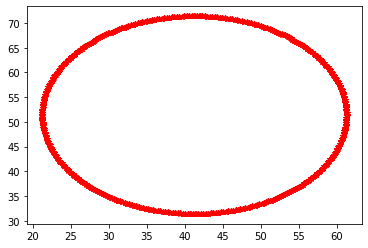

**********************************************************************************

Final parameters:  [0.4006724901291, 0.0, 0.6561]

Error:  879341.1678926097


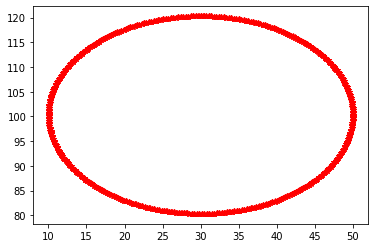

**********************************************************************************

Final parameters:  [-0.22067249012910028, 0.0, 0.6561]

Error:  231616.06075531355


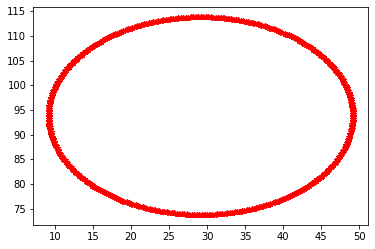

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


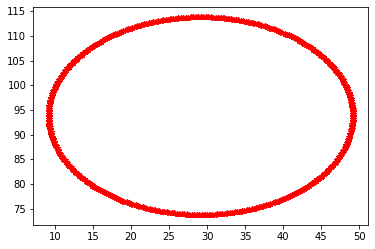

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


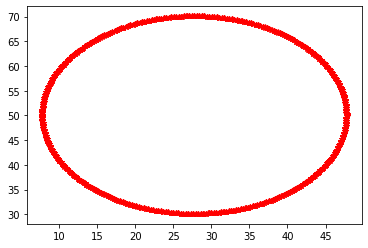

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.9667724901291002]

Error:  687718.1573266033


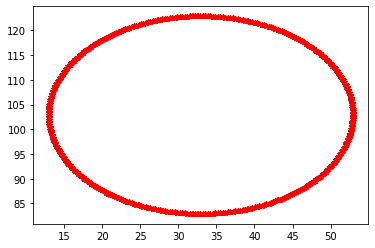

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.3454275098708999]

Error:  250610.21589498644


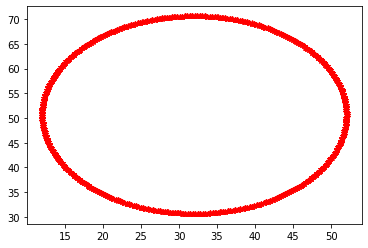

**********************************************************************************

Final parameters:  [0.36960524111619, 0.0, 0.6561]

Error:  789794.6276458618


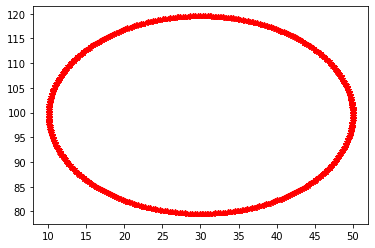

**********************************************************************************

Final parameters:  [-0.18960524111619026, 0.0, 0.6561]

Error:  223448.5506621075


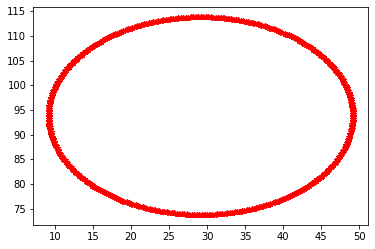

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


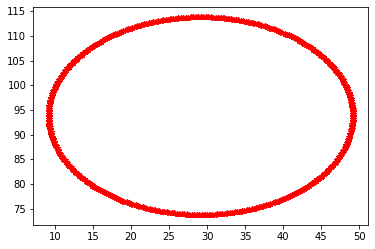

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


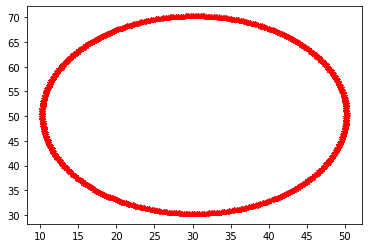

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.9357052411161901]

Error:  756375.4134255092


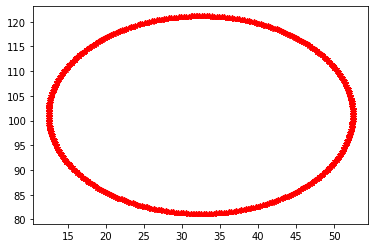

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.3764947588838099]

Error:  230800.53609639924


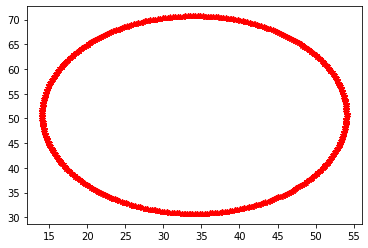

**********************************************************************************

Final parameters:  [0.341644717004571, 0.0, 0.6561]

Error:  819379.5701855576


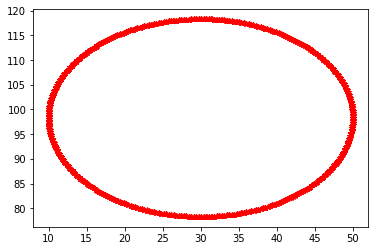

**********************************************************************************

Final parameters:  [-0.16164471700457128, 0.0, 0.6561]

Error:  212649.6165402886


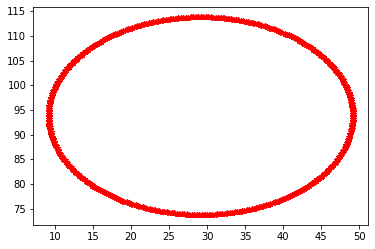

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


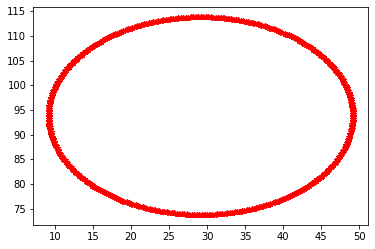

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


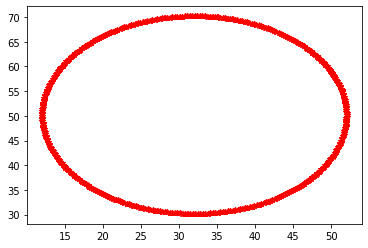

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.9077447170045712]

Error:  790230.6771712988


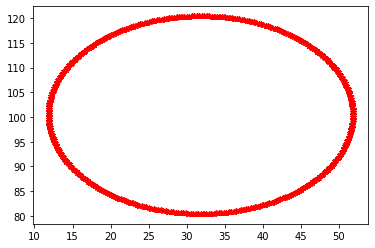

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.4044552829954289]

Error:  225484.4946981086


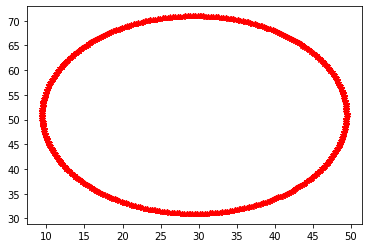

**********************************************************************************

Final parameters:  [0.3164802453041139, 0.0, 0.6561]

Error:  735328.0136476657


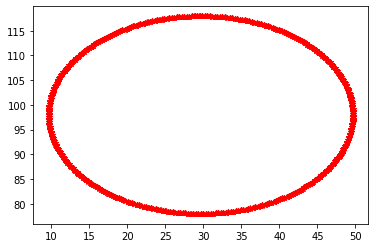

**********************************************************************************

Final parameters:  [-0.13648024530411418, 0.0, 0.6561]

Error:  211405.41865041966


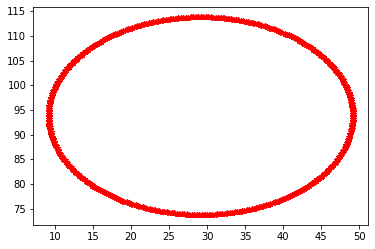

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


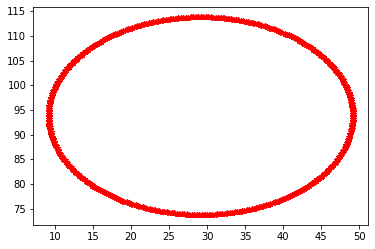

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.6561]

Error:  193772.89849760596


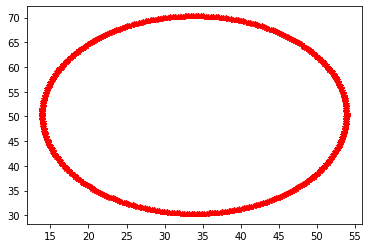

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.882580245304114]

Error:  817847.2392413074


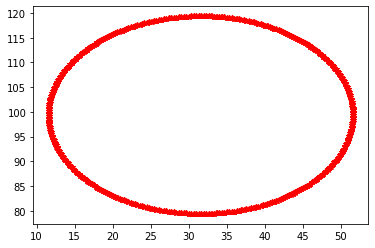

**********************************************************************************

Final parameters:  [0.08999999999999986, 0.0, 0.429619754695886]

Error:  216682.58882863863


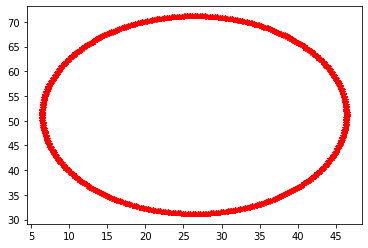

**********************************************************************************

Final parameters:  [0.2938322207737025, 0.0, 0.6561]

Error:  644711.1005518442


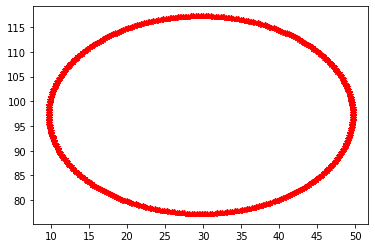

**********************************************************************************

Final parameters:  [-0.11383222077370275, 0.0, 0.6561]

Error:  206309.03670766464


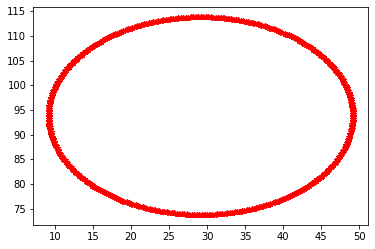

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


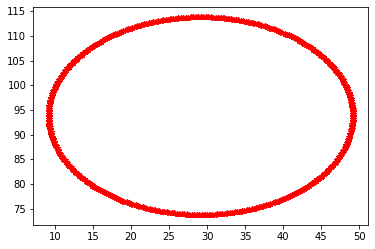

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


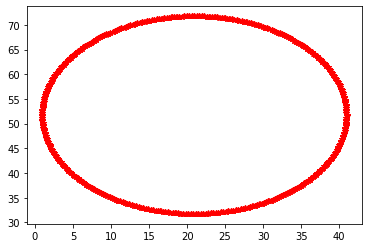

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.8599322207737027]

Error:  476294.8910706598


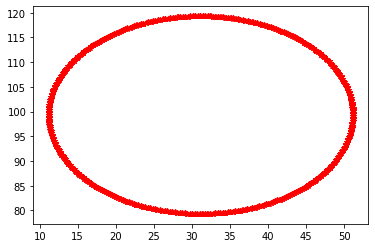

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.4522677792262974]

Error:  217516.8282503539


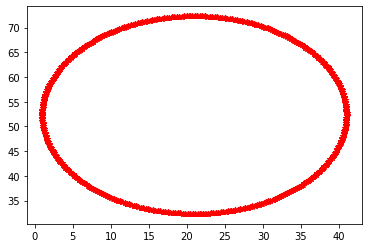

**********************************************************************************

Final parameters:  [0.27344899869633227, 0.0, 0.6561]

Error:  475389.48641535954


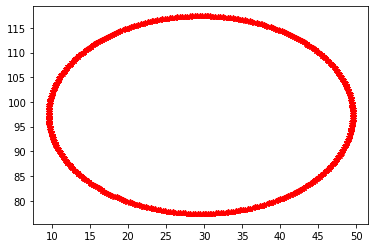

**********************************************************************************

Final parameters:  [-0.0934489986963325, 0.0, 0.6561]

Error:  207532.55079338956


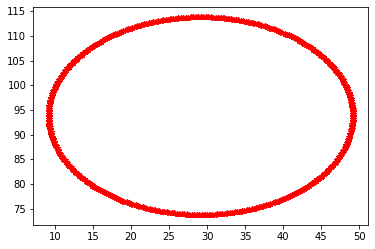

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


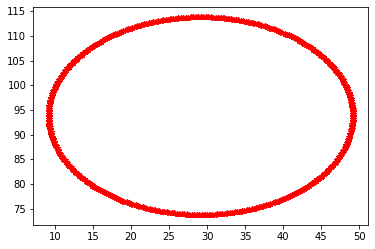

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


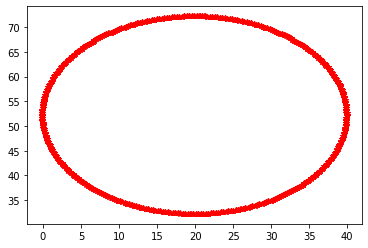

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.8395489986963324]

Error:  445671.0797255082


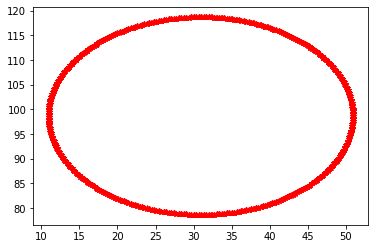

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.4726510013036676]

Error:  212830.01972196292


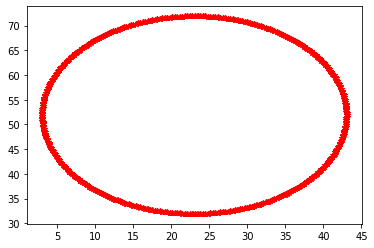

**********************************************************************************

Final parameters:  [0.25510409882669904, 0.0, 0.6561]

Error:  537153.6292421529


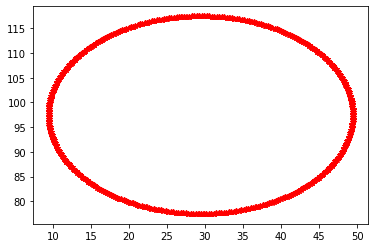

**********************************************************************************

Final parameters:  [-0.07510409882669927, 0.0, 0.6561]

Error:  208478.4617366871


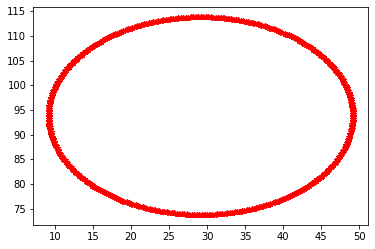

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


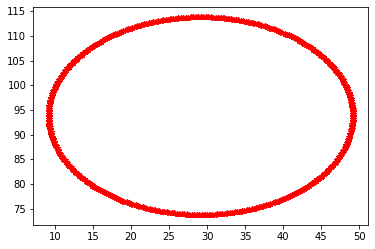

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


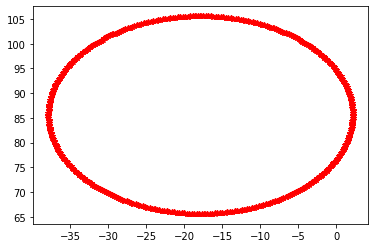

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.8212040988266992]

Error:  971224.6147062703


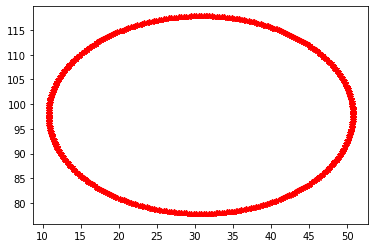

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.4909959011733009]

Error:  207245.39279822473


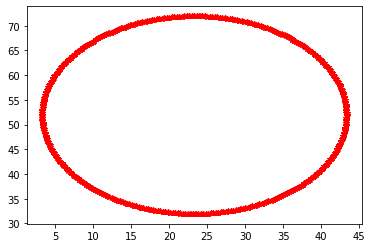

**********************************************************************************

Final parameters:  [0.23859368894402913, 0.0, 0.6561]

Error:  545822.474894549


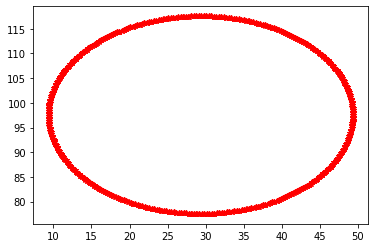

**********************************************************************************

Final parameters:  [-0.05859368894402936, 0.0, 0.6561]

Error:  209303.44688461313


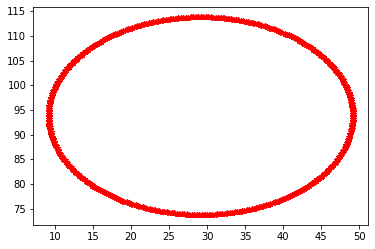

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


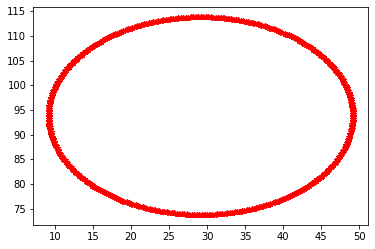

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


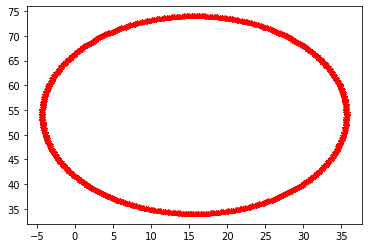

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.8046936889440293]

Error:  338228.53215149837


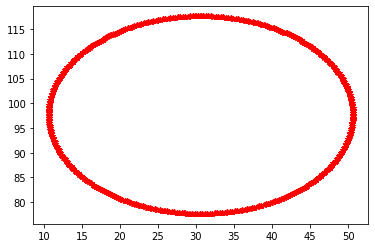

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.5075063110559708]

Error:  206534.9916941102


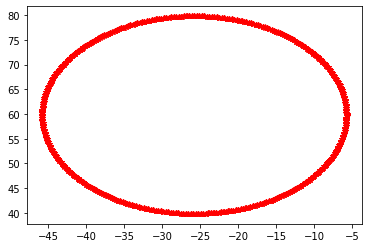

**********************************************************************************

Final parameters:  [0.2237343200496262, 0.0, 0.6561]

Error:  958587.2933402057


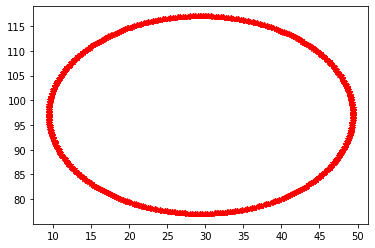

**********************************************************************************

Final parameters:  [-0.043734320049626435, 0.0, 0.6561]

Error:  205880.06357527073


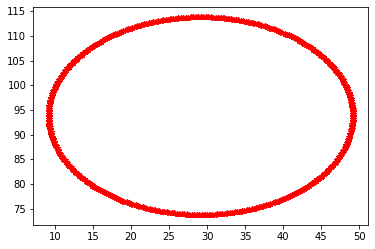

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


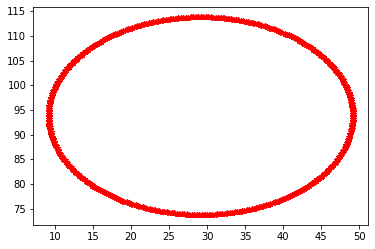

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6561]

Error:  193772.89849760596


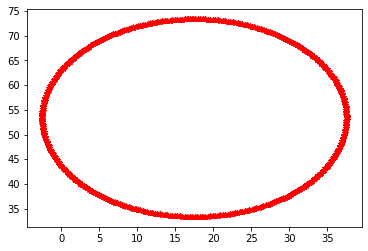

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.7898343200496263]

Error:  381426.7332097638


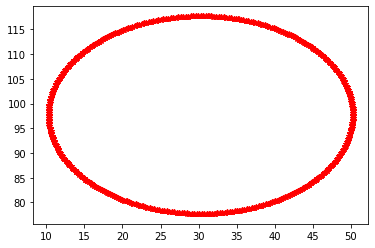

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.5223656799503736]

Error:  207750.1789679214


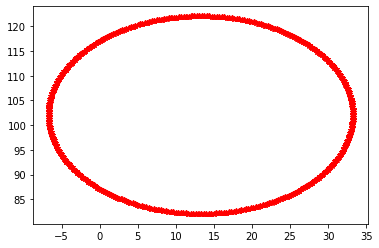

**********************************************************************************

Final parameters:  [0.21036088804466357, 0.0, 0.6560999999999999]

Error:  430925.00615585624


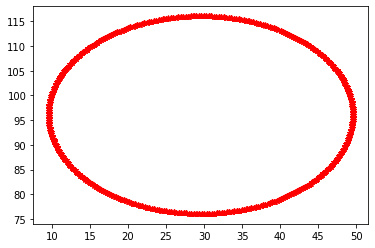

**********************************************************************************

Final parameters:  [-0.030360888044663803, 0.0, 0.6560999999999999]

Error:  200090.81745647127


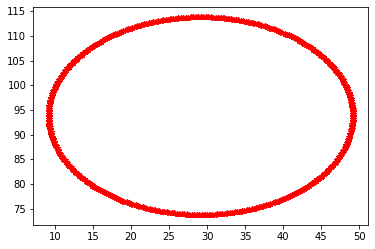

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6560999999999999]

Error:  193772.89849760596


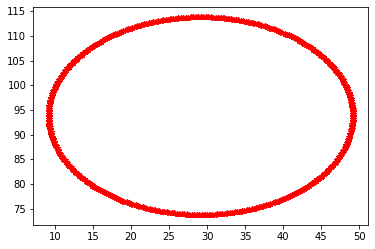

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.6560999999999999]

Error:  193772.89849760596


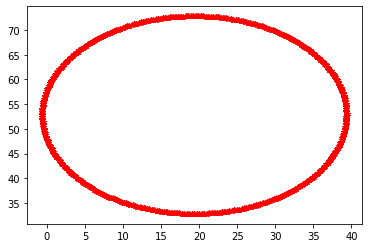

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.7764608880446636]

Error:  429962.05733707215


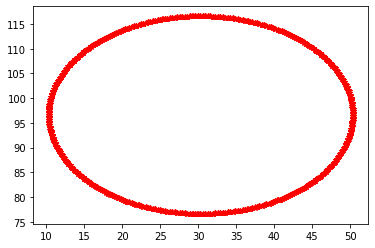

**********************************************************************************

Final parameters:  [0.08999999999999989, 0.0, 0.5357391119553363]

Error:  201237.07110928855


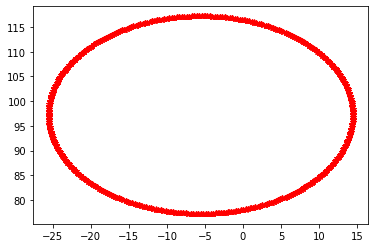

**********************************************************************************

Final parameters:  [0.1983247992401972, 0.0, 0.6561]

Error:  783930.2723869547


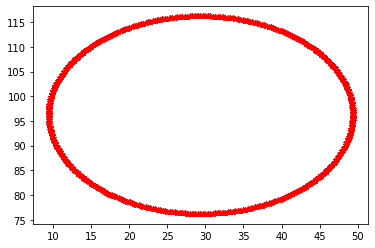

**********************************************************************************

Final parameters:  [-0.018324799240197448, 0.0, 0.6561]

Error:  201276.47868773012


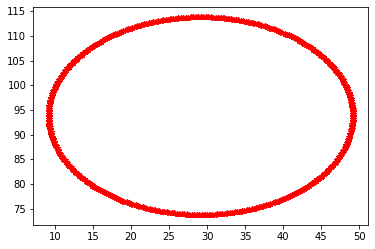

**********************************************************************************

Final parameters:  [0.08999999999999987, 0.0, 0.6561]

Error:  193772.89849760596


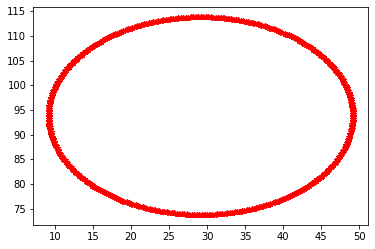

**********************************************************************************

Final parameters:  [0.08999999999999987, 0.0, 0.6561]

Error:  193772.89849760596


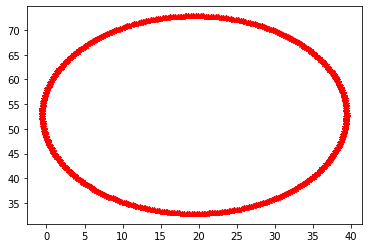

**********************************************************************************

Final parameters:  [0.08999999999999987, 0.0, 0.7644247992401974]

Error:  431627.19953136874


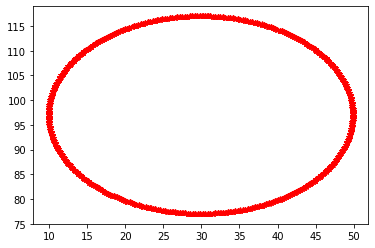

**********************************************************************************

Final parameters:  [0.08999999999999987, 0.0, 0.5477752007598027]

Error:  204370.30358872435


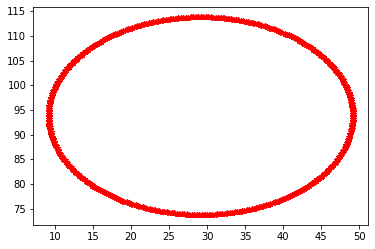

**********************************************************************************

Final parameters:  [0.08999999999999987, 0.0, 0.6561]

Error:  193772.89849760596


In [ ]:
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#
class robot:
    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
   # modify CTE to a circle with r= 50
    def cte(self, radius):           
         #center = [50, 50] # y, x coordinates of the center of the circle
         center = [radius, radius]
         cte = ((self.x - center[1])**2 + (self.y - center[0])**2)**0.5 - radius
         return cte

# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 1.0 # motion distance is equal to speed (we assume time = 1)
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []
    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error += crosstrack_error
        int_crosstrack_error += crosstrack_error
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)
    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

########twiddle
def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    # PI -> dp [1.0, 0, 1.0]
    dp = [1.0, 0, 1.0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

    
## changed r to 50
radius = 50.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,False)

### 3. PD controller, with 𝐾𝑖 = 0;


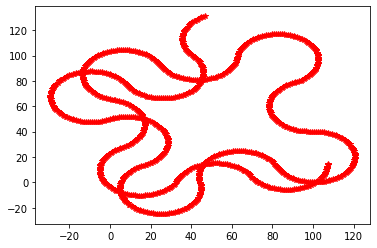

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  317122.8860246721


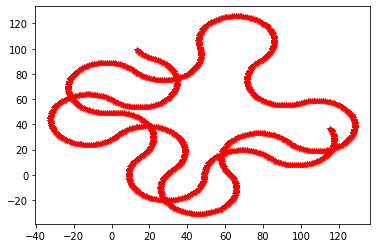

**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  329648.4439749039


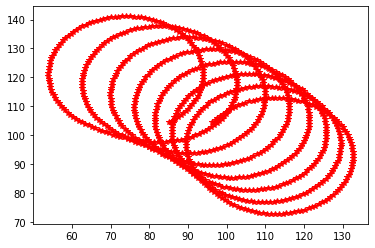

**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  918695.6580140312


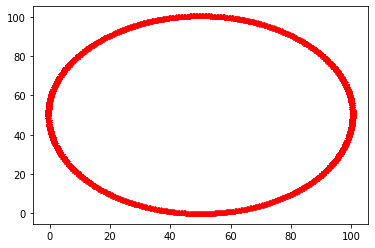

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  176.0580306249186


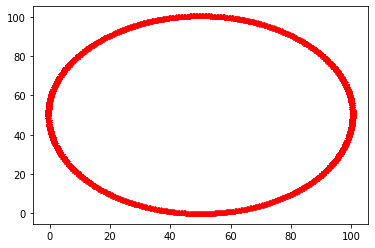

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  176.0580306249186


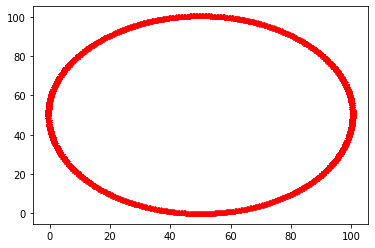

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  176.0580306249186


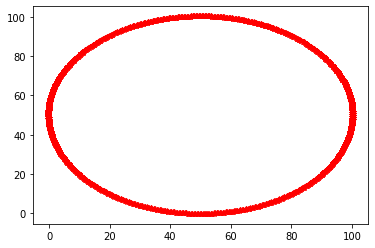

**********************************************************************************

Final parameters:  [1.7999999999999998, 1.0, 0.0]

Error:  44.5822137615573


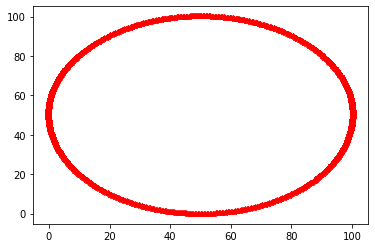

**********************************************************************************

Final parameters:  [1.7999999999999998, 2.1, 0.0]

Error:  44.3475158081214


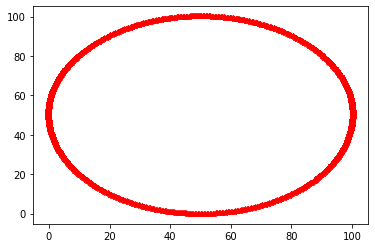

**********************************************************************************

Final parameters:  [1.7999999999999998, 2.1, 0.0]

Error:  44.3475158081214


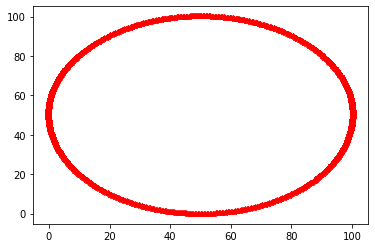

**********************************************************************************

Final parameters:  [1.7999999999999998, 2.1, 0.0]

Error:  44.3475158081214


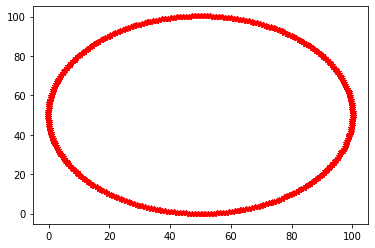

**********************************************************************************

Final parameters:  [2.79, 2.1, 0.0]

Error:  18.508707207109502


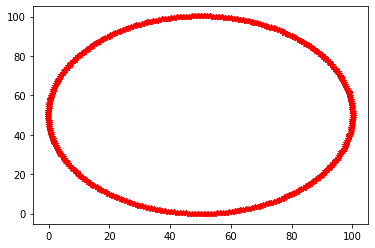

**********************************************************************************

Final parameters:  [2.79, 3.3100000000000005, 0.0]

Error:  18.50870720071552


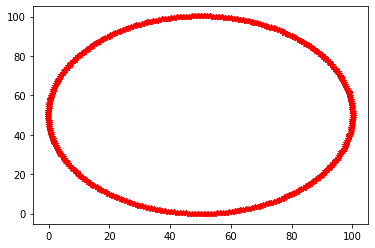

**********************************************************************************

Final parameters:  [2.79, 3.3100000000000005, 0.0]

Error:  18.50870720071552


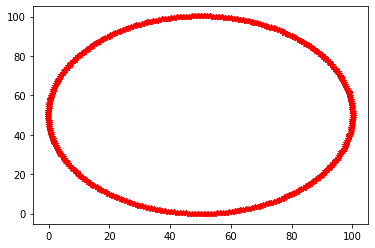

**********************************************************************************

Final parameters:  [2.79, 3.3100000000000005, 0.0]

Error:  18.50870720071552


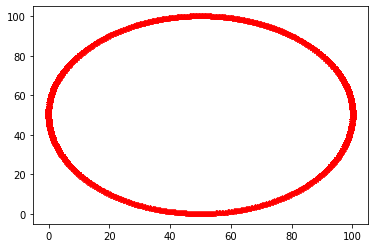

**********************************************************************************

Final parameters:  [3.8790000000000004, 3.3100000000000005, 0.0]

Error:  9.5883528618712


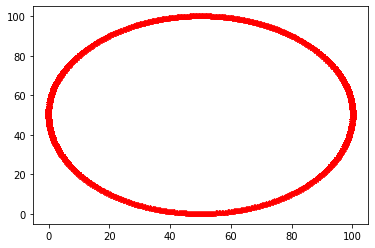

**********************************************************************************

Final parameters:  [3.8790000000000004, 4.641000000000001, 0.0]

Error:  9.588352861871225


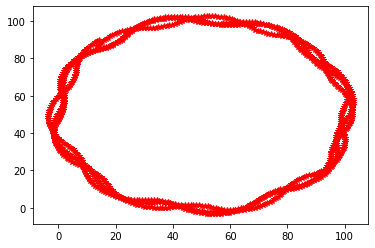

**********************************************************************************

Final parameters:  [3.8790000000000004, 1.979, 0.0]

Error:  3988.0610940822567


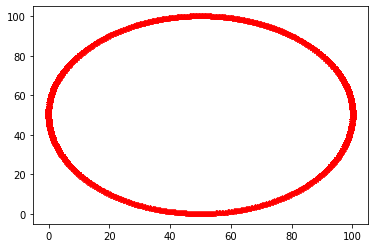

**********************************************************************************

Final parameters:  [3.8790000000000004, 3.3100000000000005, 0.0]

Error:  9.5883528618712


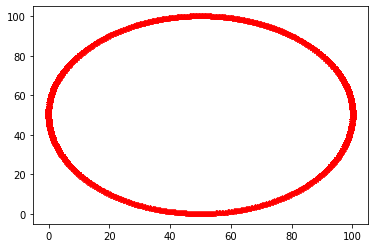

**********************************************************************************

Final parameters:  [3.8790000000000004, 3.3100000000000005, 0.0]

Error:  9.5883528618712


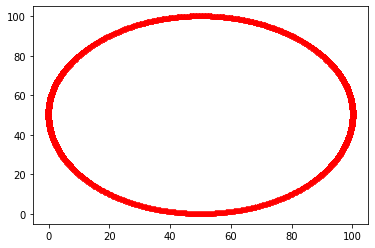

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.0]

Error:  5.6020644768905505


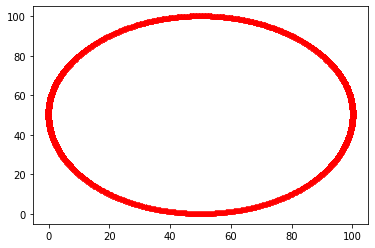

**********************************************************************************

Final parameters:  [5.076900000000001, 4.507900000000001, 0.0]

Error:  5.602076998784143


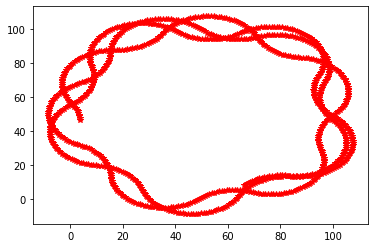

**********************************************************************************

Final parameters:  [5.076900000000001, 2.1121000000000003, 0.0]

Error:  33169.06125643906


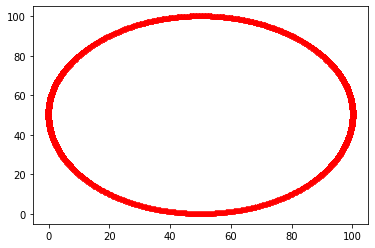

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.0]

Error:  5.6020644768905505


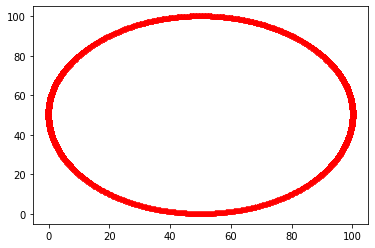

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.0]

Error:  5.6020644768905505


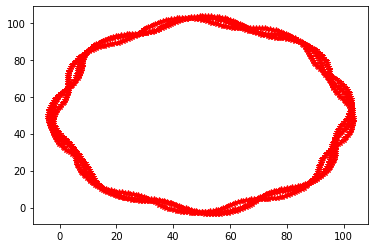

**********************************************************************************

Final parameters:  [6.394590000000002, 3.3100000000000005, 0.0]

Error:  4071.0639787996715


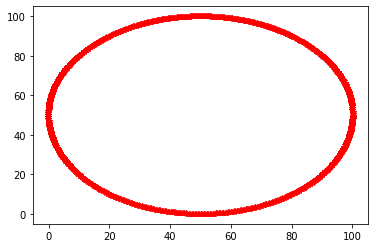

**********************************************************************************

Final parameters:  [3.759210000000001, 3.3100000000000005, 0.0]

Error:  10.208018292148479


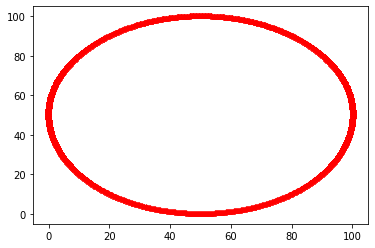

**********************************************************************************

Final parameters:  [5.076900000000001, 4.388110000000001, 0.0]

Error:  5.602076998784162


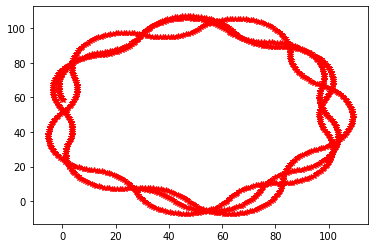

**********************************************************************************

Final parameters:  [5.076900000000001, 2.2318900000000004, 0.0]

Error:  21194.01039828338


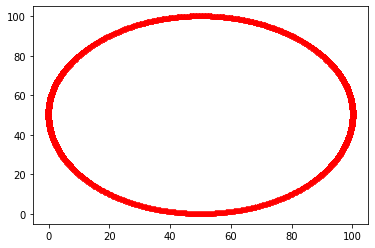

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.0]

Error:  5.6020644768905505


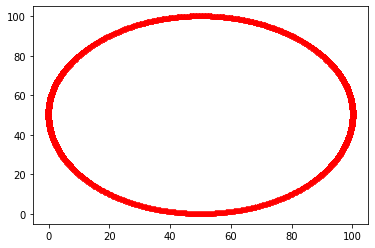

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.0]

Error:  5.6020644768905505


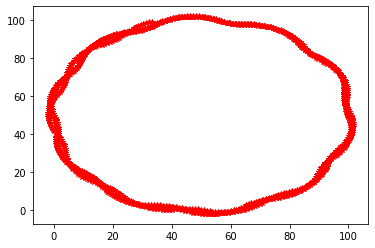

**********************************************************************************

Final parameters:  [6.2628210000000015, 3.3100000000000005, 0.0]

Error:  1446.0969602034584


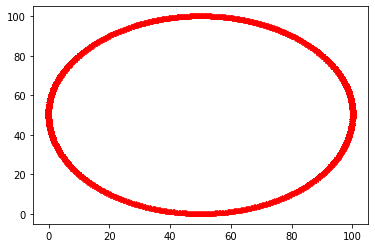

**********************************************************************************

Final parameters:  [3.8909790000000006, 3.3100000000000005, 0.0]

Error:  9.529508978357272


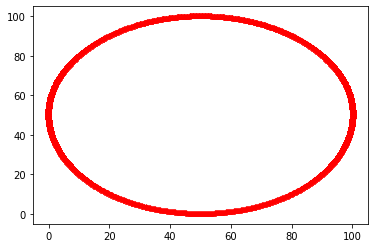

**********************************************************************************

Final parameters:  [5.076900000000001, 4.280299000000001, 0.0]

Error:  5.602076998784131


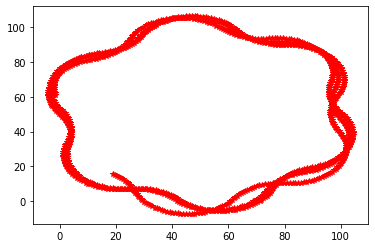

**********************************************************************************

Final parameters:  [5.076900000000001, 2.3397010000000007, 0.0]

Error:  16798.76941330433


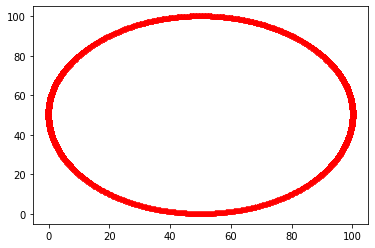

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.0]

Error:  5.602064476890548


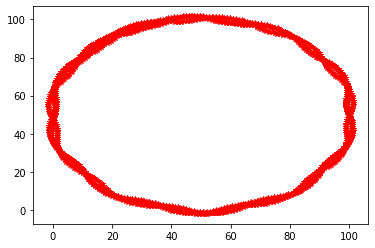

**********************************************************************************

Final parameters:  [6.144228900000002, 3.310000000000001, 0.0]

Error:  1533.5513986645026


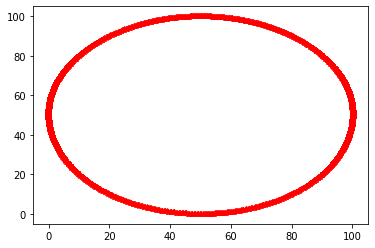

**********************************************************************************

Final parameters:  [4.0095711000000005, 3.310000000000001, 0.0]

Error:  8.975068351632626


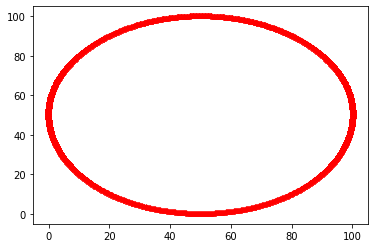

**********************************************************************************

Final parameters:  [5.076900000000001, 4.183269100000001, 0.0]

Error:  5.602076998784151


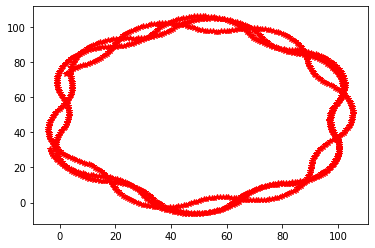

**********************************************************************************

Final parameters:  [5.076900000000001, 2.4367309000000006, 0.0]

Error:  13149.068052995735


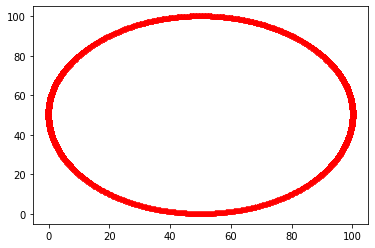

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.0]

Error:  5.602064476890548


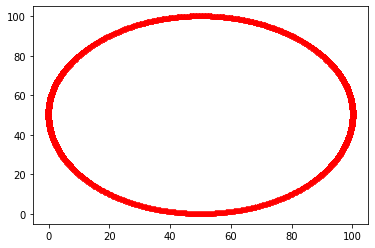

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.0]

Error:  5.602064476890548


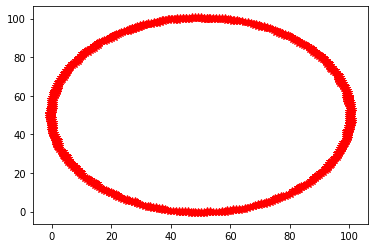

**********************************************************************************

Final parameters:  [6.037496010000002, 3.310000000000001, 0.0]

Error:  617.6125446836581


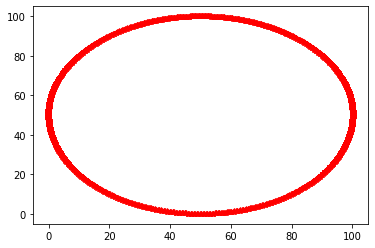

**********************************************************************************

Final parameters:  [4.1163039900000005, 3.310000000000001, 0.0]

Error:  8.516423920061849


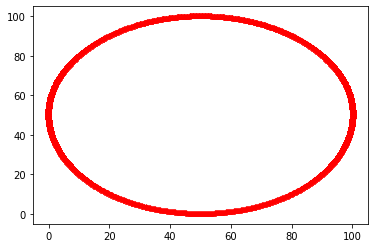

**********************************************************************************

Final parameters:  [5.076900000000001, 4.0959421900000015, 0.0]

Error:  5.602076998784142


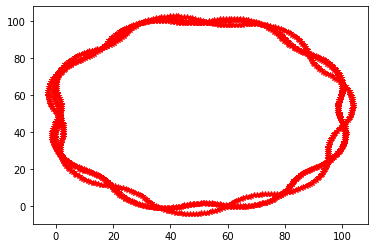

**********************************************************************************

Final parameters:  [5.076900000000001, 2.524057810000001, 0.0]

Error:  4935.391276333584


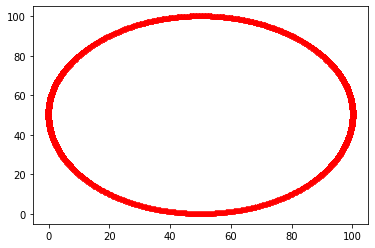

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000014, 0.0]

Error:  5.602064476890556


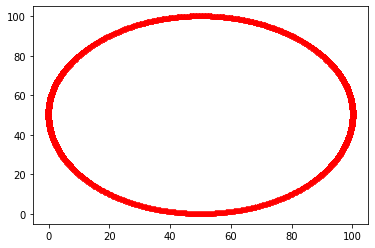

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000014, 0.0]

Error:  5.602064476890556


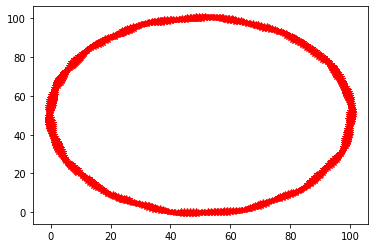

**********************************************************************************

Final parameters:  [5.941436409000001, 3.3100000000000014, 0.0]

Error:  406.52309545232686


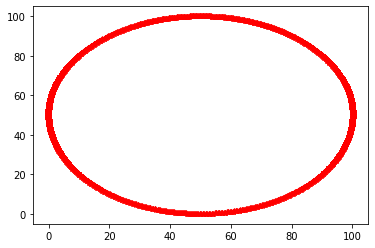

**********************************************************************************

Final parameters:  [4.212363591000001, 3.3100000000000014, 0.0]

Error:  8.133050662971026


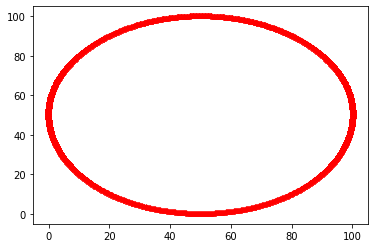

**********************************************************************************

Final parameters:  [5.076900000000001, 4.017347971000001, 0.0]

Error:  5.602076998784046


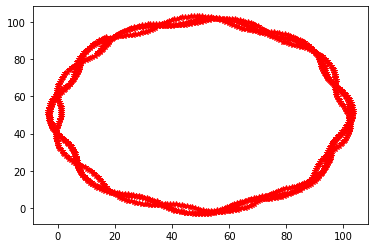

**********************************************************************************

Final parameters:  [5.076900000000001, 2.6026520290000006, 0.0]

Error:  3296.423616367606


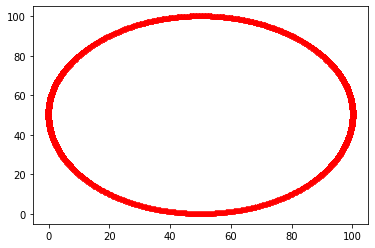

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.0]

Error:  5.602064476890548


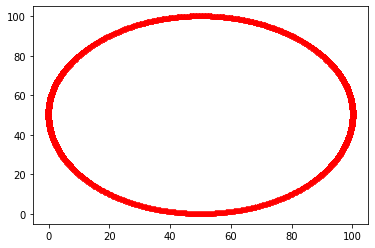

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.0]

Error:  5.602064476890548


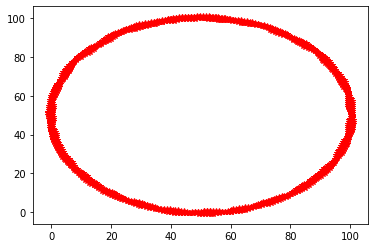

**********************************************************************************

Final parameters:  [5.854982768100001, 3.310000000000001, 0.0]

Error:  358.327455064019


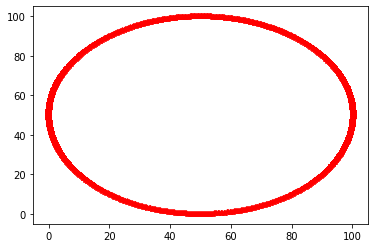

**********************************************************************************

Final parameters:  [4.2988172319, 3.310000000000001, 0.0]

Error:  7.809723921522308


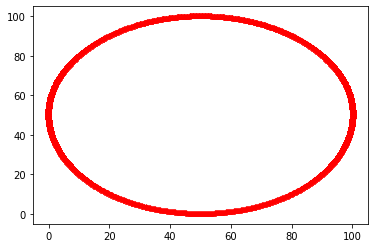

**********************************************************************************

Final parameters:  [5.0769, 3.946613173900001, 0.0]

Error:  5.602076998784096


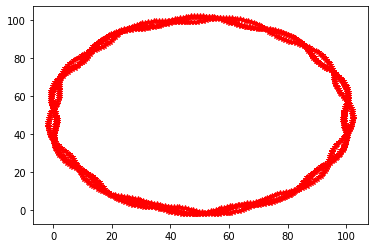

**********************************************************************************

Final parameters:  [5.0769, 2.6733868261000007, 0.0]

Error:  1781.5246742554361


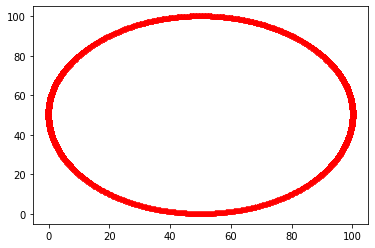

**********************************************************************************

Final parameters:  [5.0769, 3.310000000000001, 0.0]

Error:  5.602064476890552


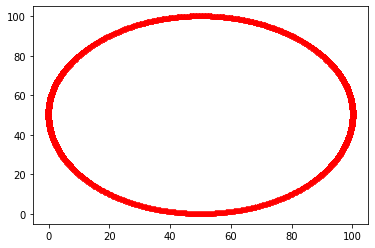

**********************************************************************************

Final parameters:  [5.0769, 3.310000000000001, 0.0]

Error:  5.602064476890552


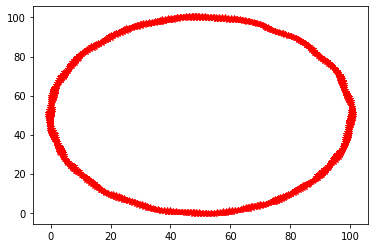

**********************************************************************************

Final parameters:  [5.77717449129, 3.310000000000001, 0.0]

Error:  207.58865430289418


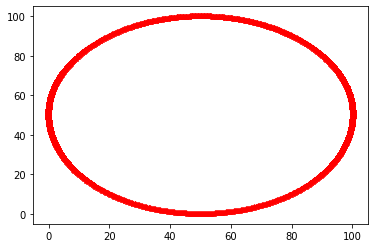

**********************************************************************************

Final parameters:  [4.376625508709999, 3.310000000000001, 0.0]

Error:  7.5349353213814


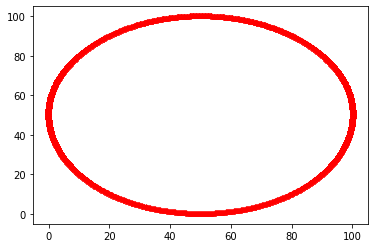

**********************************************************************************

Final parameters:  [5.076899999999999, 3.8829518565100014, 0.0]

Error:  5.602076998787347


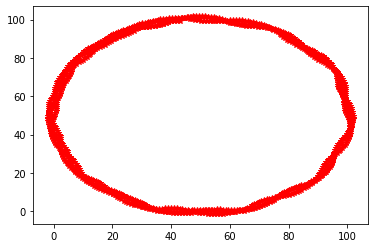

**********************************************************************************

Final parameters:  [5.076899999999999, 2.737048143490001, 0.0]

Error:  1222.9207732239888


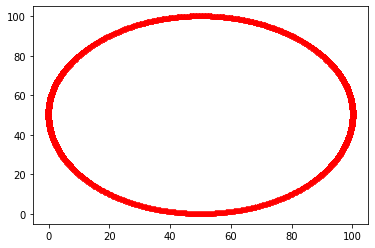

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, 0.0]

Error:  5.602064476890533


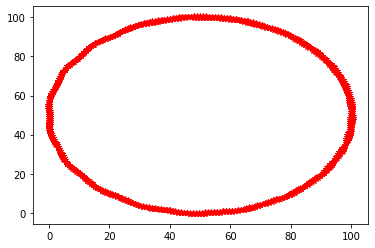

**********************************************************************************

Final parameters:  [5.707147042160999, 3.3100000000000014, 0.0]

Error:  108.35575077779912


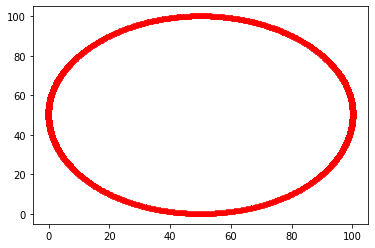

**********************************************************************************

Final parameters:  [4.446652957838999, 3.3100000000000014, 0.0]

Error:  7.299839118064569


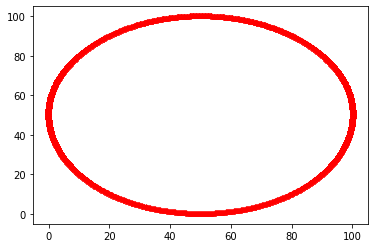

**********************************************************************************

Final parameters:  [5.076899999999998, 3.8256566708590016, 0.0]

Error:  5.602076998796676


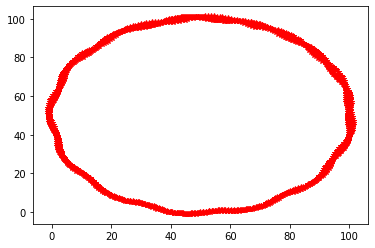

**********************************************************************************

Final parameters:  [5.076899999999998, 2.794343329141001, 0.0]

Error:  567.1501974877892


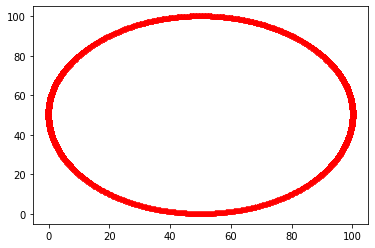

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000014, 0.0]

Error:  5.602064476890526


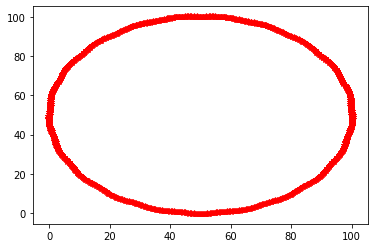

**********************************************************************************

Final parameters:  [5.644122337944899, 3.3100000000000014, 0.0]

Error:  65.88242136424033


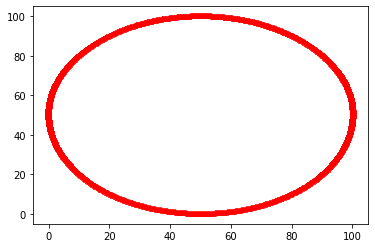

**********************************************************************************

Final parameters:  [4.509677662055099, 3.3100000000000014, 0.0]

Error:  7.097534330811893


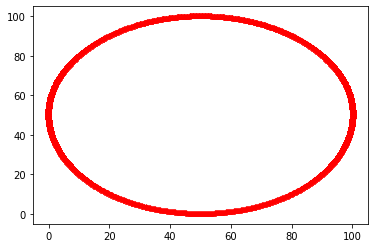

**********************************************************************************

Final parameters:  [5.076899999999999, 3.7740910037731017, 0.0]

Error:  5.602076998775972


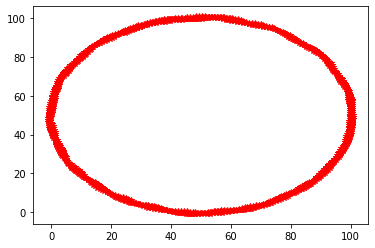

**********************************************************************************

Final parameters:  [5.076899999999999, 2.845908996226901, 0.0]

Error:  313.4663607770743


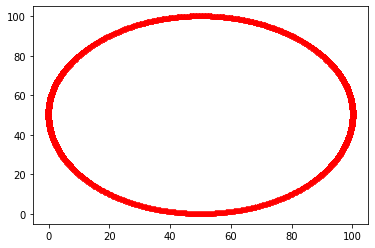

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, 0.0]

Error:  5.602064476890533


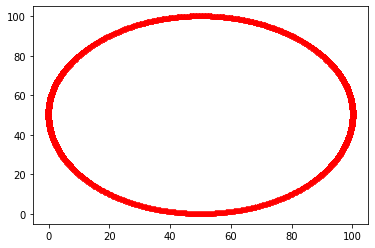

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, 0.0]

Error:  5.602064476890533


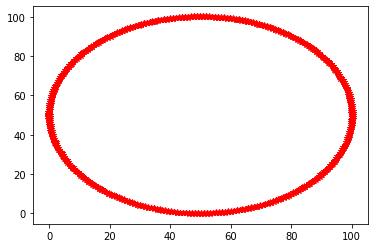

**********************************************************************************

Final parameters:  [5.58740010415041, 3.3100000000000014, 0.0]

Error:  47.254175058624476


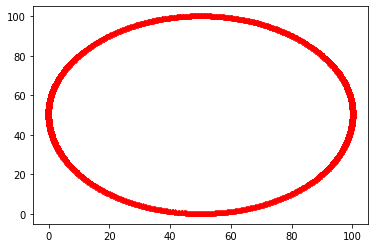

**********************************************************************************

Final parameters:  [4.566399895849589, 3.3100000000000014, 0.0]

Error:  6.92256509459181


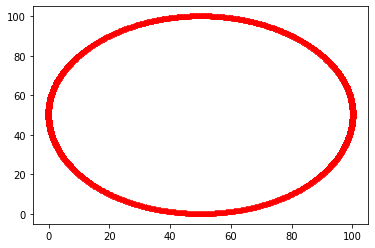

**********************************************************************************

Final parameters:  [5.076899999999999, 3.7276819033957915, 0.0]

Error:  5.602076998591579


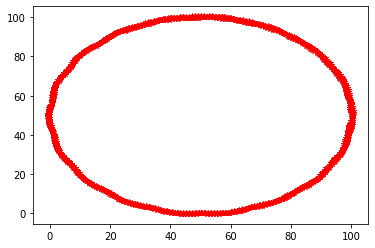

**********************************************************************************

Final parameters:  [5.076899999999999, 2.892318096604211, 0.0]

Error:  120.31528965061122


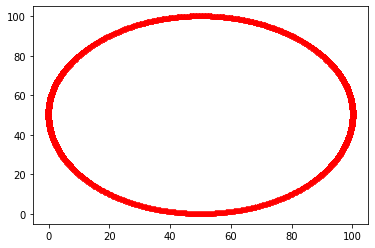

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, 0.0]

Error:  5.602064476890547


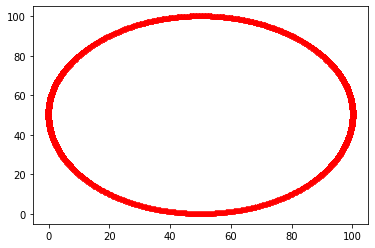

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, 0.0]

Error:  5.602064476890547


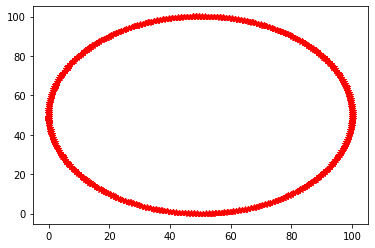

**********************************************************************************

Final parameters:  [5.5363500937353685, 3.310000000000001, 0.0]

Error:  12.866714825756628


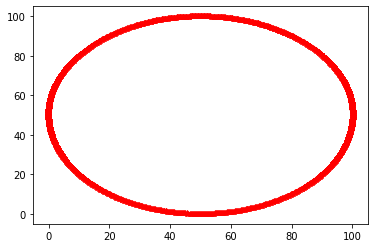

**********************************************************************************

Final parameters:  [4.61744990626463, 3.310000000000001, 0.0]

Error:  6.770566161220485


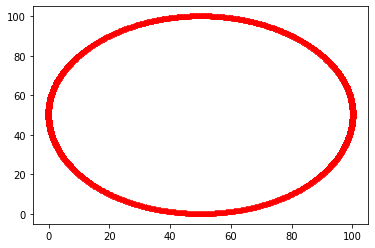

**********************************************************************************

Final parameters:  [5.076899999999999, 3.685913713056212, 0.0]

Error:  5.602076998102455


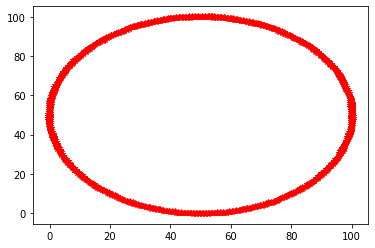

**********************************************************************************

Final parameters:  [5.076899999999999, 2.9340862869437894, 0.0]

Error:  74.06356253557291


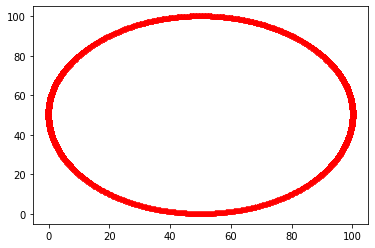

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.0]

Error:  5.602064476890539


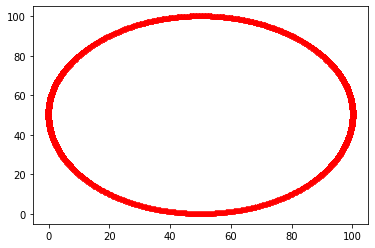

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.0]

Error:  5.602064476890539


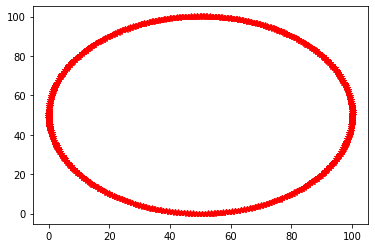

**********************************************************************************

Final parameters:  [5.490405084361831, 3.3100000000000005, 0.0]

Error:  10.699269499725307


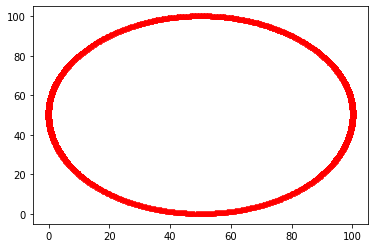

**********************************************************************************

Final parameters:  [4.663394915638166, 3.3100000000000005, 0.0]

Error:  6.6380070374470055


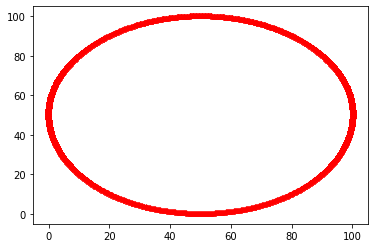

**********************************************************************************

Final parameters:  [5.076899999999998, 3.648322341750591, 0.0]

Error:  5.602076997631729


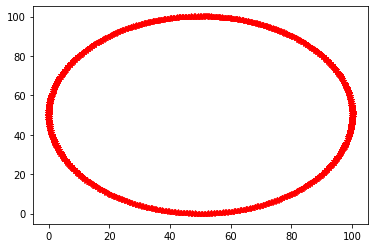

**********************************************************************************

Final parameters:  [5.076899999999998, 2.97167765824941, 0.0]

Error:  9.415264071220198


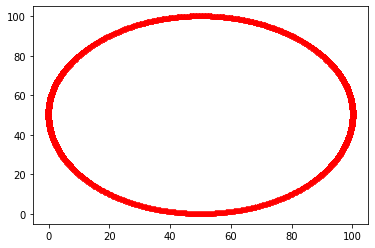

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000005, 0.0]

Error:  5.6020644768905425


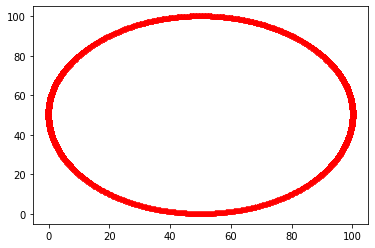

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000005, 0.0]

Error:  5.6020644768905425


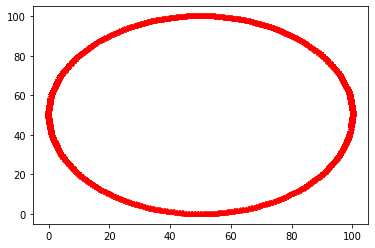

**********************************************************************************

Final parameters:  [5.449054575925648, 3.3100000000000005, 0.0]

Error:  7.798638550210212


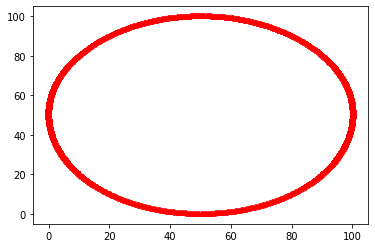

**********************************************************************************

Final parameters:  [4.70474542407435, 3.3100000000000005, 0.0]

Error:  6.522004339110099


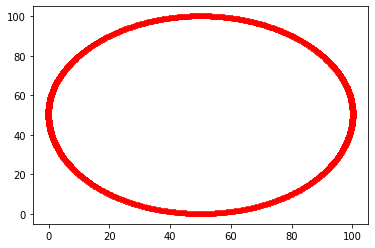

**********************************************************************************

Final parameters:  [5.076899999999999, 3.6144901075755316, 0.0]

Error:  5.602076998680952


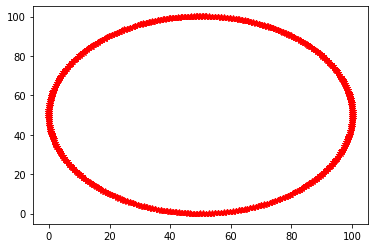

**********************************************************************************

Final parameters:  [5.076899999999999, 3.0055098924244694, 0.0]

Error:  11.782289488361956


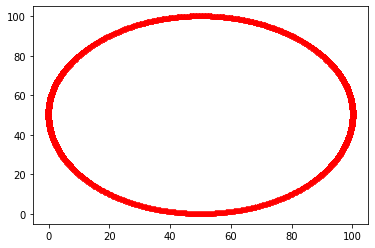

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.0]

Error:  5.602064476890539


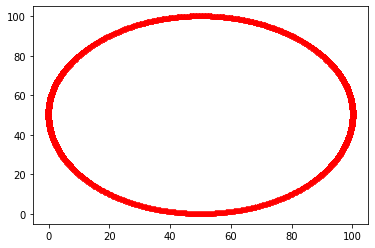

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.0]

Error:  5.602064476890539


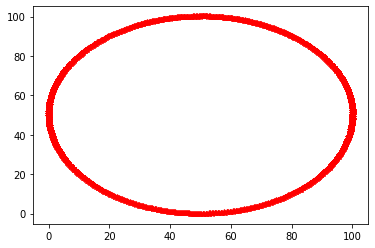

**********************************************************************************

Final parameters:  [5.411839118333083, 3.3100000000000005, 0.0]

Error:  6.939667604688452


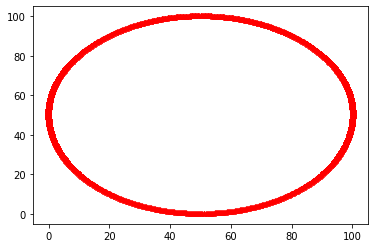

**********************************************************************************

Final parameters:  [4.741960881666915, 3.3100000000000005, 0.0]

Error:  6.420182221978451


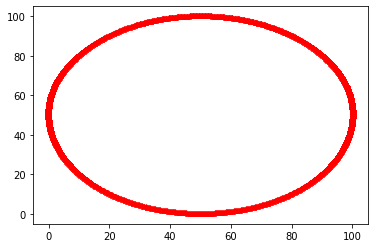

**********************************************************************************

Final parameters:  [5.076899999999999, 3.5840410968179786, 0.0]

Error:  5.6020770041975965


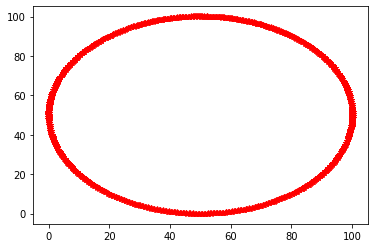

**********************************************************************************

Final parameters:  [5.076899999999999, 3.0359589031820224, 0.0]

Error:  9.42231109619489


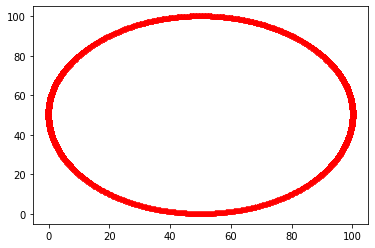

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.0]

Error:  5.602064476890539


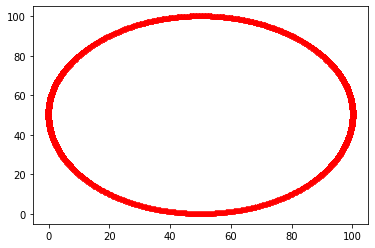

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.0]

Error:  5.602064476890539


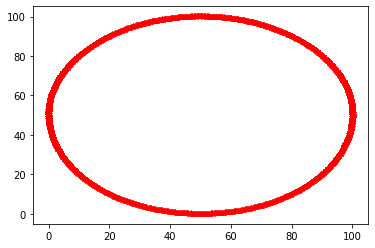

**********************************************************************************

Final parameters:  [5.378345206499775, 3.3100000000000005, 0.0]

Error:  6.586434022694782


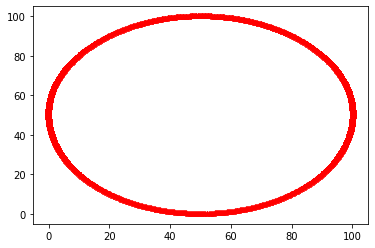

**********************************************************************************

Final parameters:  [4.775454793500224, 3.3100000000000005, 0.0]

Error:  6.330567409582729


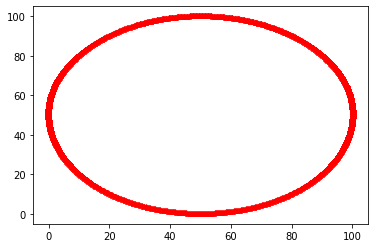

**********************************************************************************

Final parameters:  [5.076899999999999, 3.556636987136181, 0.0]

Error:  5.602077017637808


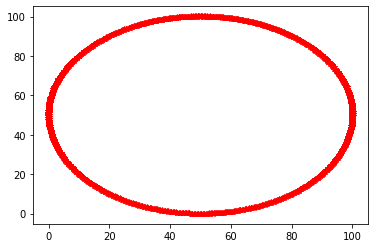

**********************************************************************************

Final parameters:  [5.076899999999999, 3.0633630128638205, 0.0]

Error:  7.869812274598297


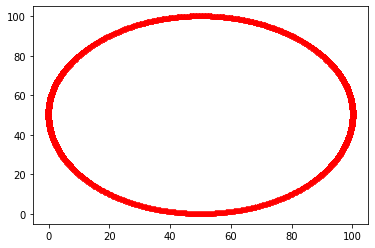

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, 0.0]

Error:  5.602064476890547


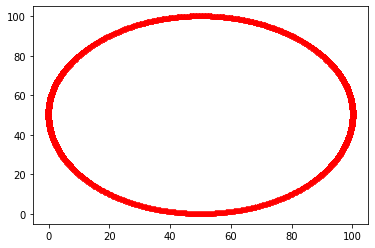

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, 0.0]

Error:  5.602064476890547


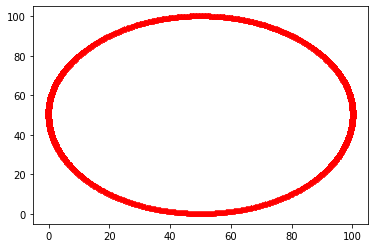

**********************************************************************************

Final parameters:  [5.348200685849798, 3.310000000000001, 0.0]

Error:  5.060959422834369


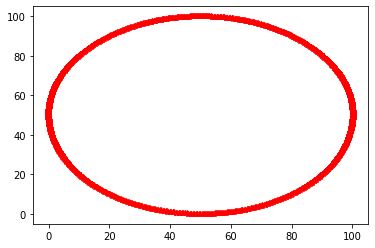

**********************************************************************************

Final parameters:  [5.348200685849798, 3.531973288422563, 0.0]

Error:  5.04882431802826


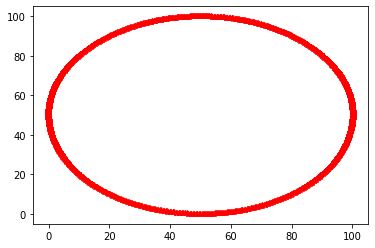

**********************************************************************************

Final parameters:  [5.348200685849798, 3.531973288422563, 0.0]

Error:  5.04882431802826


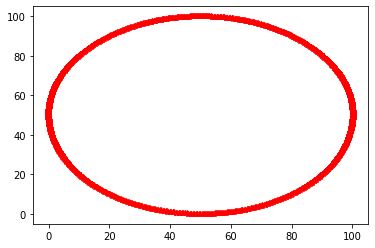

**********************************************************************************

Final parameters:  [5.348200685849798, 3.531973288422563, 0.0]

Error:  5.04882431802826


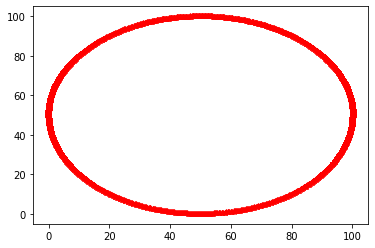

**********************************************************************************

Final parameters:  [5.646631440284576, 3.531973288422563, 0.0]

Error:  4.749352611920668


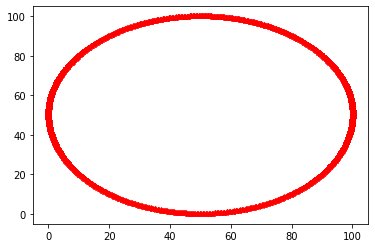

**********************************************************************************

Final parameters:  [5.646631440284576, 3.7761439056873813, 0.0]

Error:  4.529868189309819


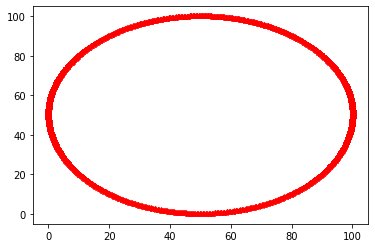

**********************************************************************************

Final parameters:  [5.646631440284576, 3.7761439056873813, 0.0]

Error:  4.529868189309819


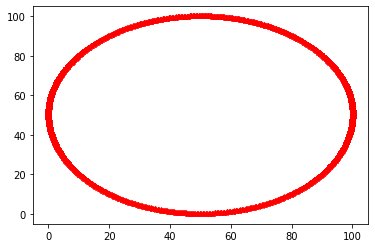

**********************************************************************************

Final parameters:  [5.646631440284576, 3.7761439056873813, 0.0]

Error:  4.529868189309819


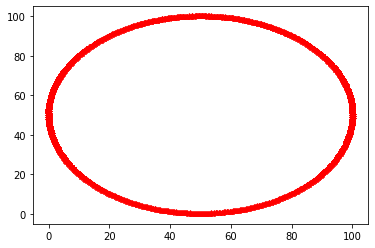

**********************************************************************************

Final parameters:  [5.974905270162832, 3.7761439056873813, 0.0]

Error:  5.3894636355603325


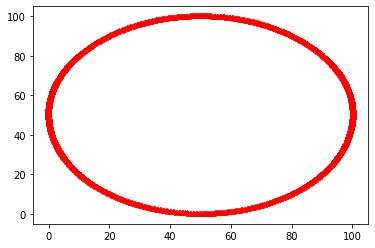

**********************************************************************************

Final parameters:  [5.318357610406321, 3.7761439056873813, 0.0]

Error:  5.105574088442477


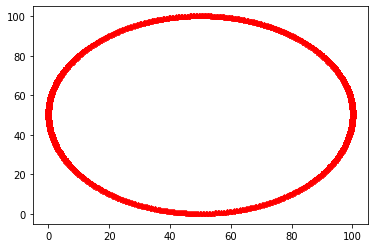

**********************************************************************************

Final parameters:  [5.646631440284577, 4.044731584678682, 0.0]

Error:  4.52987287253305


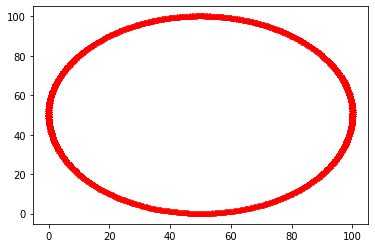

**********************************************************************************

Final parameters:  [5.646631440284577, 3.507556226696081, 0.0]

Error:  6.095633679627737


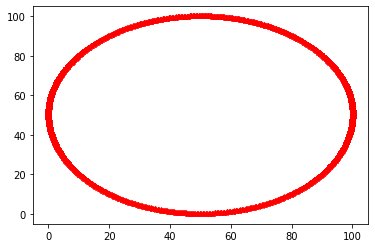

**********************************************************************************

Final parameters:  [5.646631440284577, 3.7761439056873813, 0.0]

Error:  4.5298681893098305


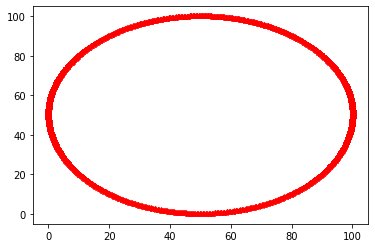

**********************************************************************************

Final parameters:  [5.646631440284577, 3.7761439056873813, 0.0]

Error:  4.5298681893098305


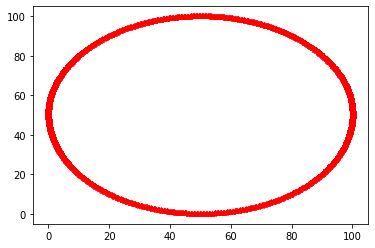

**********************************************************************************

Final parameters:  [5.9420778871750075, 3.7761439056873813, 0.0]

Error:  4.115259184167445


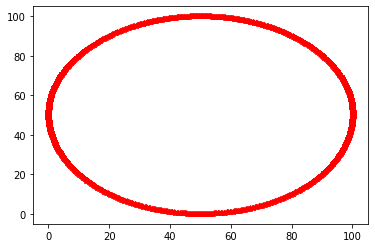

**********************************************************************************

Final parameters:  [5.9420778871750075, 4.017872816779552, 0.0]

Error:  4.091102887425864


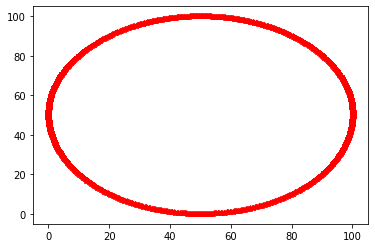

**********************************************************************************

Final parameters:  [5.9420778871750075, 4.017872816779552, 0.0]

Error:  4.091102887425864


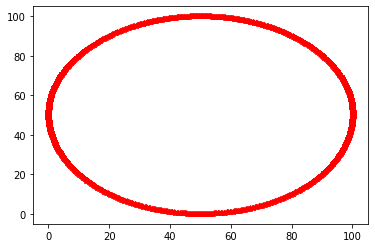

**********************************************************************************

Final parameters:  [5.9420778871750075, 4.017872816779552, 0.0]

Error:  4.091102887425864


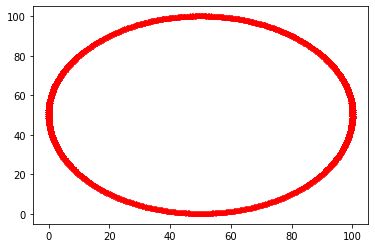

**********************************************************************************

Final parameters:  [6.267068978754481, 4.017872816779552, 0.0]

Error:  4.849726969741496


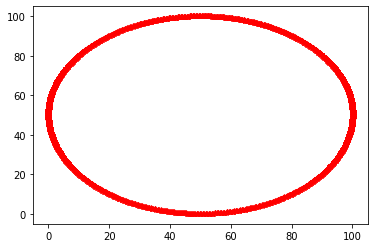

**********************************************************************************

Final parameters:  [5.617086795595535, 4.017872816779552, 0.0]

Error:  4.577591868076517


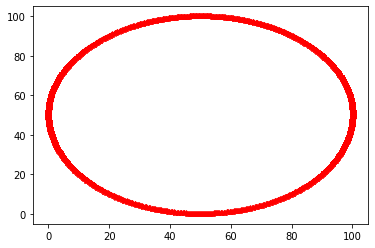

**********************************************************************************

Final parameters:  [5.942077887175008, 4.28377461898094, 0.0]

Error:  4.091106476267314


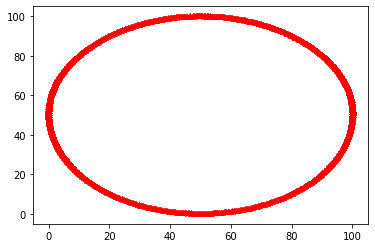

**********************************************************************************

Final parameters:  [5.942077887175008, 3.7519710145781646, 0.0]

Error:  5.404555290273911


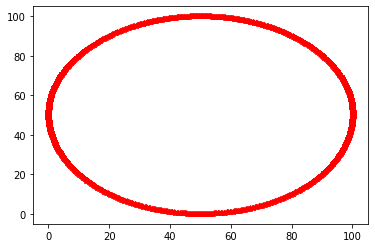

**********************************************************************************

Final parameters:  [5.942077887175008, 4.017872816779552, 0.0]

Error:  4.091102887425855


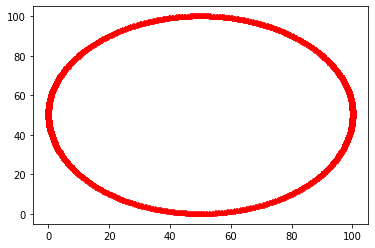

**********************************************************************************

Final parameters:  [6.234569869596535, 4.017872816779552, 0.0]

Error:  3.738074000748846


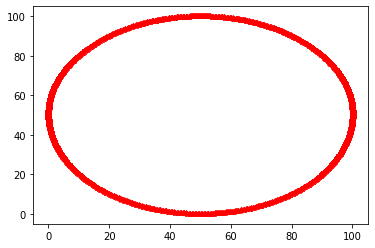

**********************************************************************************

Final parameters:  [6.234569869596535, 4.257184438760801, 0.0]

Error:  3.7166461750661495


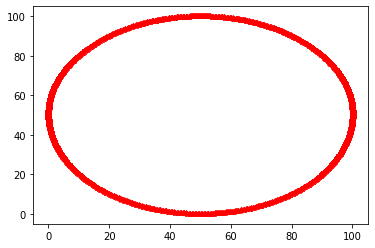

**********************************************************************************

Final parameters:  [6.234569869596535, 4.257184438760801, 0.0]

Error:  3.7166461750661495


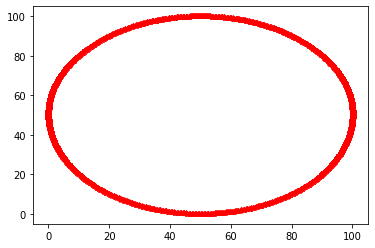

**********************************************************************************

Final parameters:  [6.234569869596535, 4.257184438760801, 0.0]

Error:  3.7166461750661495


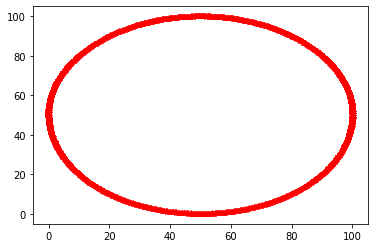

**********************************************************************************

Final parameters:  [6.556311050260214, 4.257184438760801, 0.0]

Error:  4.493038569765814


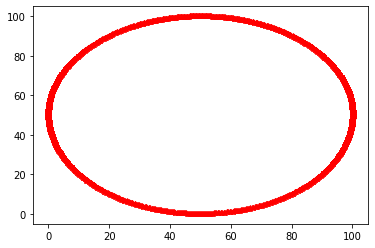

**********************************************************************************

Final parameters:  [5.912828688932857, 4.257184438760801, 0.0]

Error:  4.131634552601207


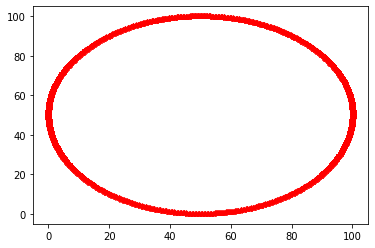

**********************************************************************************

Final parameters:  [6.234569869596536, 4.5204272229401745, 0.0]

Error:  3.716649528938272


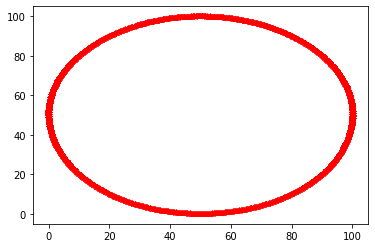

**********************************************************************************

Final parameters:  [6.234569869596536, 3.9939416545814272, 0.0]

Error:  4.8842509276106325


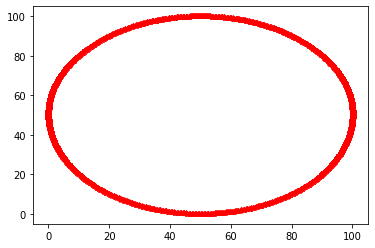

**********************************************************************************

Final parameters:  [6.234569869596536, 4.257184438760801, 0.0]

Error:  3.7166461750661473


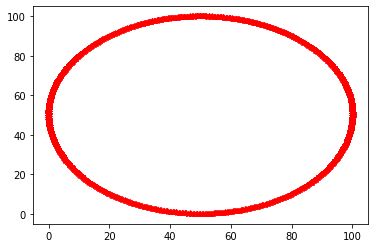

**********************************************************************************

Final parameters:  [6.524136932193846, 4.257184438760801, 0.0]

Error:  4.364253099487573


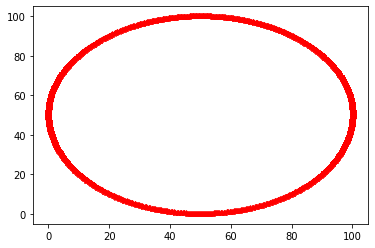

**********************************************************************************

Final parameters:  [5.9450028069992245, 4.257184438760801, 0.0]

Error:  4.087086499932363


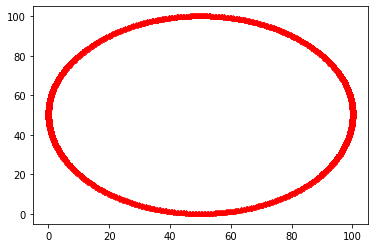

**********************************************************************************

Final parameters:  [6.234569869596536, 4.494102944522237, 0.0]

Error:  3.716649530376683


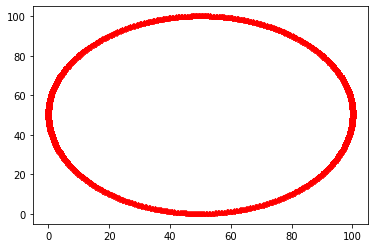

**********************************************************************************

Final parameters:  [6.234569869596536, 4.020265932999365, 0.0]

Error:  3.734279782608625


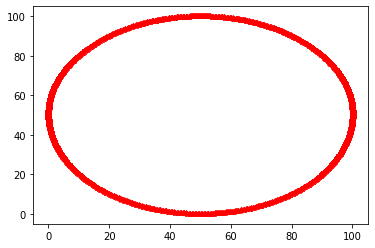

**********************************************************************************

Final parameters:  [6.234569869596536, 4.2571844387608015, 0.0]

Error:  3.7166461750661544


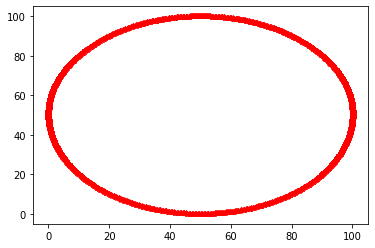

**********************************************************************************

Final parameters:  [6.234569869596536, 4.2571844387608015, 0.0]

Error:  3.7166461750661544


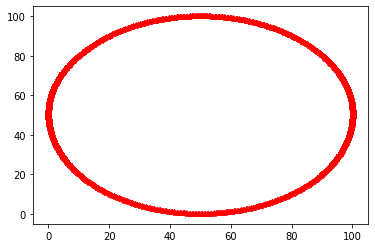

**********************************************************************************

Final parameters:  [6.495180225934115, 4.2571844387608015, 0.0]

Error:  3.4271468134935463


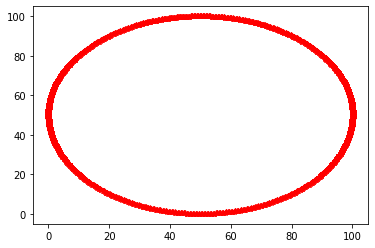

**********************************************************************************

Final parameters:  [6.495180225934115, 4.470411093946094, 0.0]

Error:  3.4246863775388916


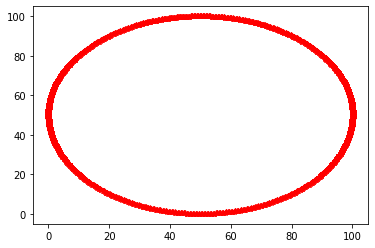

**********************************************************************************

Final parameters:  [6.495180225934115, 4.470411093946094, 0.0]

Error:  3.4246863775388916


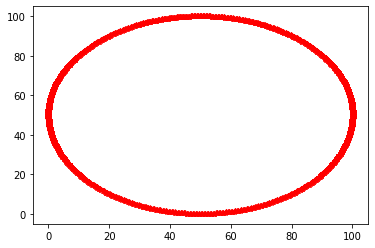

**********************************************************************************

Final parameters:  [6.495180225934115, 4.470411093946094, 0.0]

Error:  3.4246863775388916


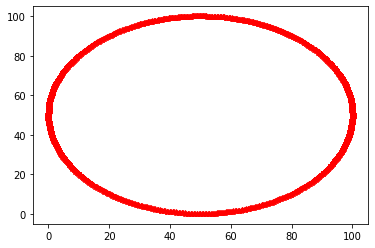

**********************************************************************************

Final parameters:  [6.781851617905453, 4.470411093946094, 0.0]

Error:  4.223874306485035


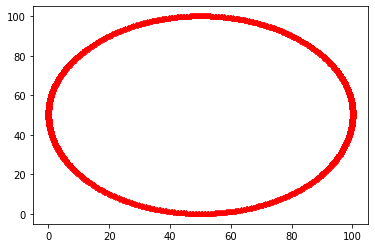

**********************************************************************************

Final parameters:  [6.208508833962777, 4.470411093946094, 0.0]

Error:  3.7478825912551312


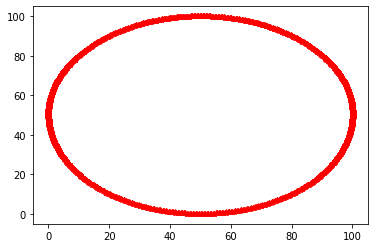

**********************************************************************************

Final parameters:  [6.495180225934115, 4.704960414649916, 0.0]

Error:  3.4246849314985846


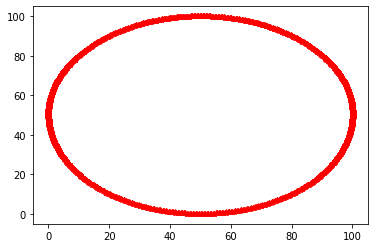

**********************************************************************************

Final parameters:  [6.495180225934115, 4.704960414649916, 0.0]

Error:  3.4246849314985846


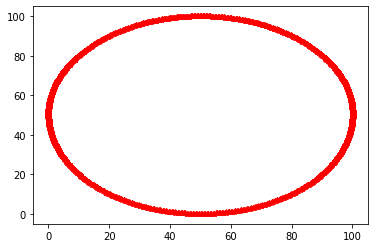

**********************************************************************************

Final parameters:  [6.495180225934115, 4.704960414649916, 0.0]

Error:  3.4246849314985846


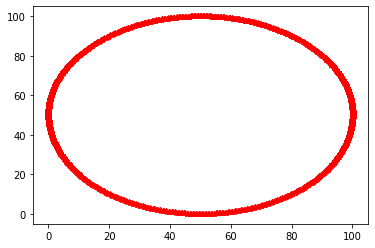

**********************************************************************************

Final parameters:  [6.753184478708319, 4.704960414649916, 0.0]

Error:  3.1682627987765826


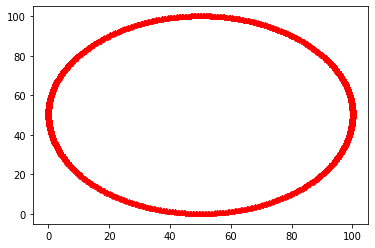

**********************************************************************************

Final parameters:  [6.753184478708319, 4.96296466742412, 0.0]

Error:  3.168260881331602


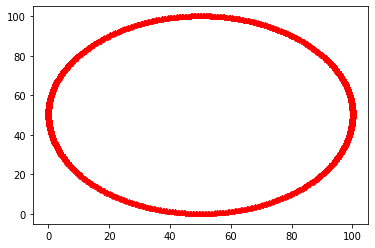

**********************************************************************************

Final parameters:  [6.753184478708319, 4.96296466742412, 0.0]

Error:  3.168260881331602


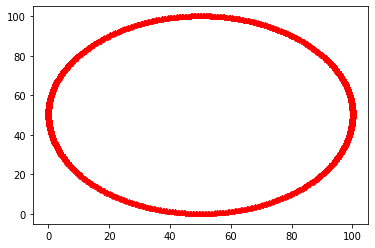

**********************************************************************************

Final parameters:  [6.753184478708319, 4.96296466742412, 0.0]

Error:  3.168260881331602


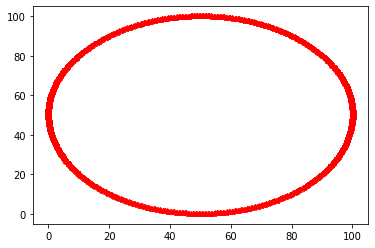

**********************************************************************************

Final parameters:  [7.036989156759944, 4.96296466742412, 0.0]

Error:  2.9180996262300276


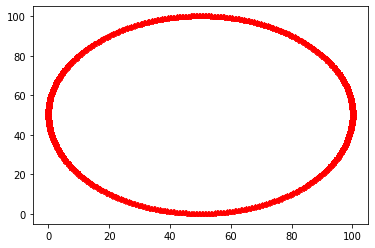

**********************************************************************************

Final parameters:  [7.036989156759944, 5.2467693454757445, 0.0]

Error:  2.9180993211539743


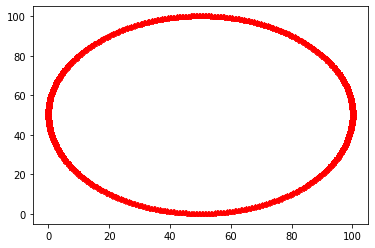

**********************************************************************************

Final parameters:  [7.036989156759944, 5.2467693454757445, 0.0]

Error:  2.9180993211539743


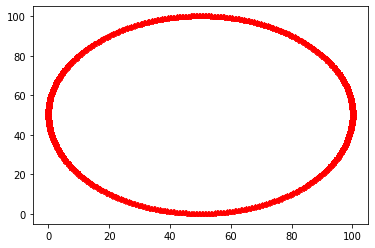

**********************************************************************************

Final parameters:  [7.036989156759944, 5.2467693454757445, 0.0]

Error:  2.9180993211539743


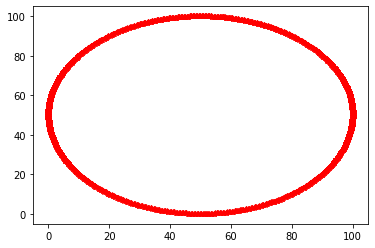

**********************************************************************************

Final parameters:  [7.34917430261673, 5.2467693454757445, 0.0]

Error:  2.675674943831639


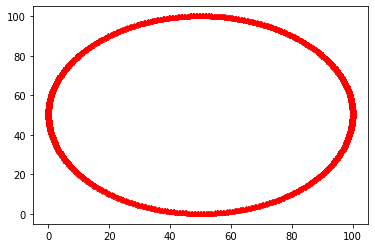

**********************************************************************************

Final parameters:  [7.34917430261673, 5.558954491332531, 0.0]

Error:  2.6756715324998286


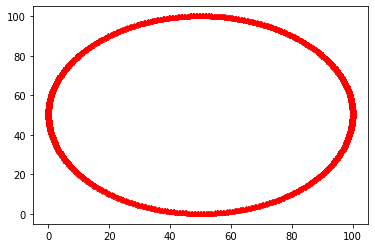

**********************************************************************************

Final parameters:  [7.34917430261673, 5.558954491332531, 0.0]

Error:  2.6756715324998286


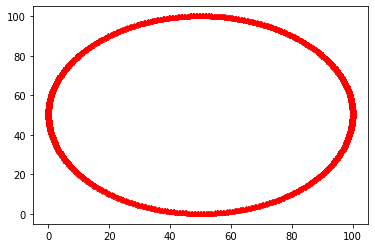

**********************************************************************************

Final parameters:  [7.34917430261673, 5.558954491332531, 0.0]

Error:  2.6756715324998286


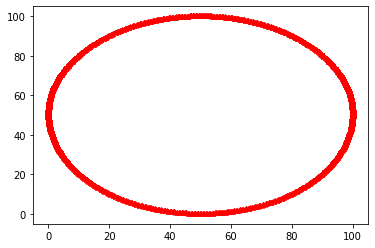

**********************************************************************************

Final parameters:  [7.692577963059196, 5.558954491332531, 0.0]

Error:  2.44231280912383


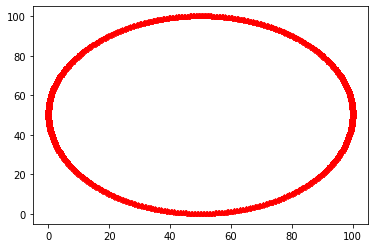

**********************************************************************************

Final parameters:  [7.692577963059196, 5.902358151774997, 0.0]

Error:  2.4423188986766062


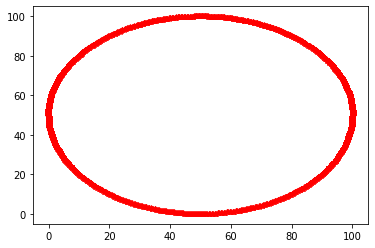

**********************************************************************************

Final parameters:  [7.692577963059196, 5.2155508308900655, 0.0]

Error:  3.5783869124464545


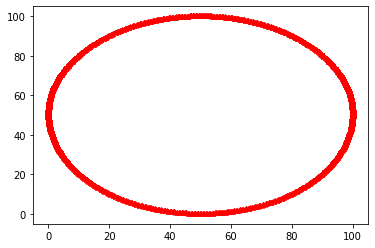

**********************************************************************************

Final parameters:  [7.692577963059196, 5.558954491332531, 0.0]

Error:  2.44231280912383


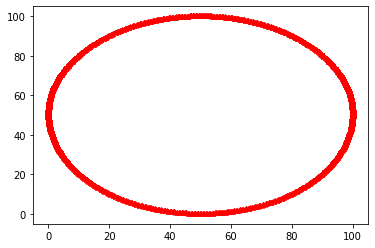

**********************************************************************************

Final parameters:  [7.692577963059196, 5.558954491332531, 0.0]

Error:  2.44231280912383


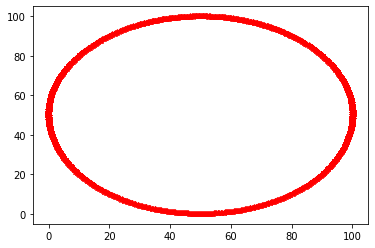

**********************************************************************************

Final parameters:  [8.070321989545908, 5.558954491332531, 0.0]

Error:  3.439240868252565


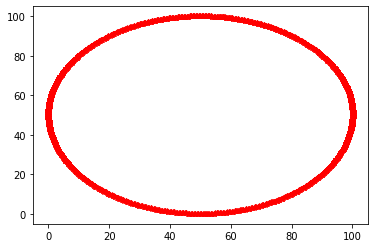

**********************************************************************************

Final parameters:  [7.314833936572484, 5.558954491332531, 0.0]

Error:  2.700829291130528


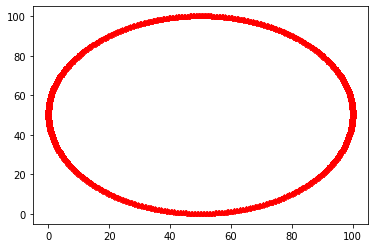

**********************************************************************************

Final parameters:  [7.692577963059196, 5.86801778573075, 0.0]

Error:  2.4423188936065836


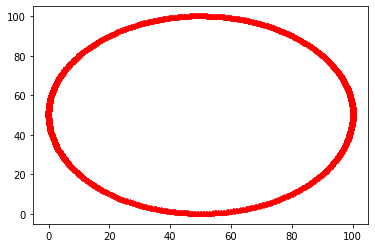

**********************************************************************************

Final parameters:  [7.692577963059196, 5.249891196934311, 0.0]

Error:  3.613211438138726


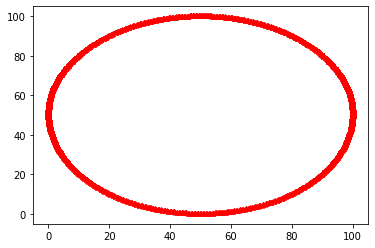

**********************************************************************************

Final parameters:  [7.692577963059196, 5.55895449133253, 0.0]

Error:  2.4423128091238406


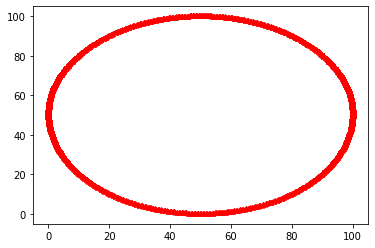

**********************************************************************************

Final parameters:  [7.692577963059196, 5.55895449133253, 0.0]

Error:  2.4423128091238406


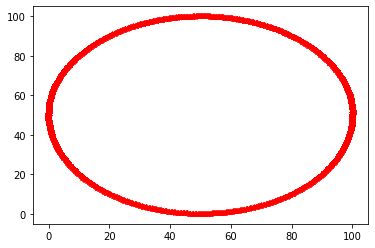

**********************************************************************************

Final parameters:  [8.032547586897238, 5.55895449133253, 0.0]

Error:  3.2382937764353477


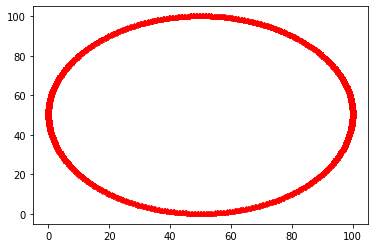

**********************************************************************************

Final parameters:  [7.352608339221156, 5.55895449133253, 0.0]

Error:  2.6731751075929853


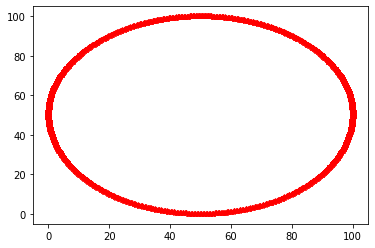

**********************************************************************************

Final parameters:  [7.692577963059197, 5.837111456290927, 0.0]

Error:  2.442318887757102


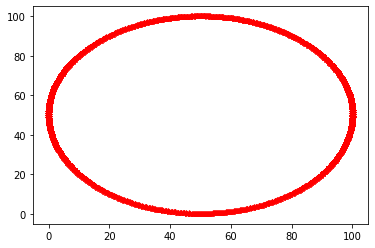

**********************************************************************************

Final parameters:  [7.692577963059197, 5.2807975263741325, 0.0]

Error:  3.320795900342223


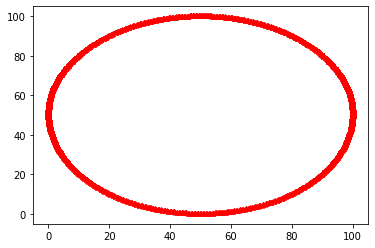

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


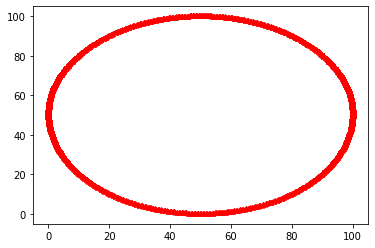

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


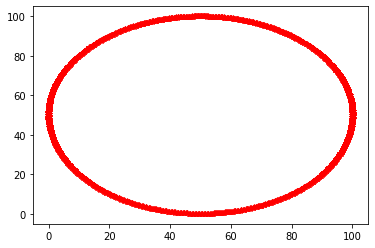

**********************************************************************************

Final parameters:  [7.998550624513434, 5.558954491332529, 0.0]

Error:  3.1269796373358845


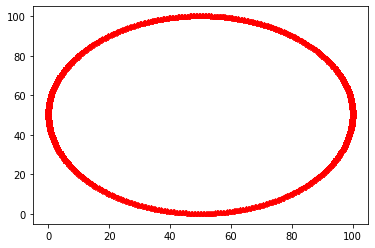

**********************************************************************************

Final parameters:  [7.38660530160496, 5.558954491332529, 0.0]

Error:  2.648647877451581


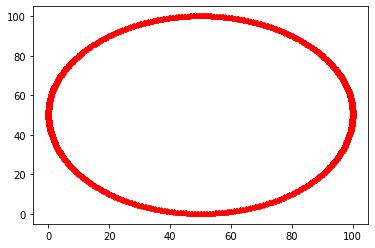

**********************************************************************************

Final parameters:  [7.692577963059197, 5.809295759795087, 0.0]

Error:  2.4423188879180766


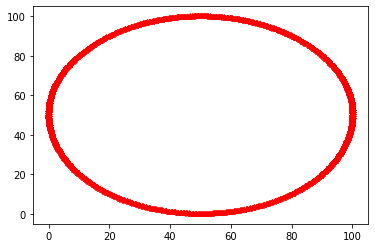

**********************************************************************************

Final parameters:  [7.692577963059197, 5.308613222869972, 0.0]

Error:  3.2531700571384823


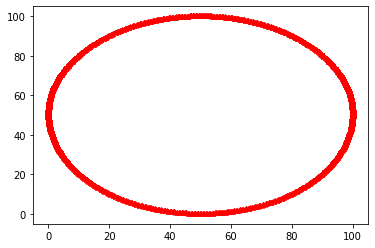

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


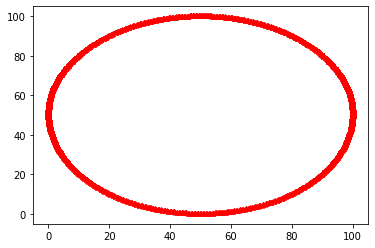

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


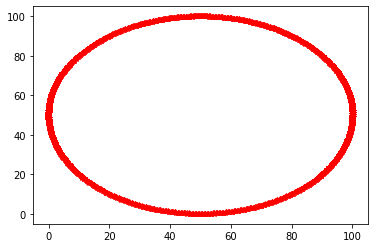

**********************************************************************************

Final parameters:  [7.96795335836801, 5.558954491332529, 0.0]

Error:  3.066433296072751


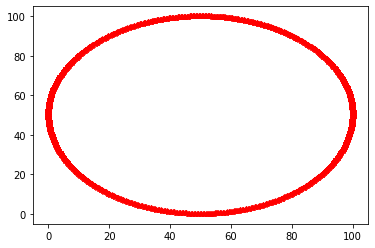

**********************************************************************************

Final parameters:  [7.417202567750384, 5.558954491332529, 0.0]

Error:  2.6268608425652062


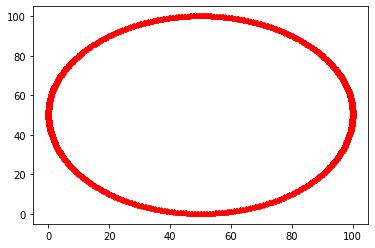

**********************************************************************************

Final parameters:  [7.692577963059197, 5.784261632948831, 0.0]

Error:  2.4423189042599915


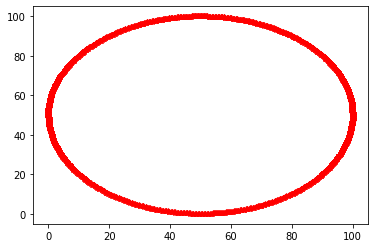

**********************************************************************************

Final parameters:  [7.692577963059197, 5.333647349716228, 0.0]

Error:  3.141837251694478


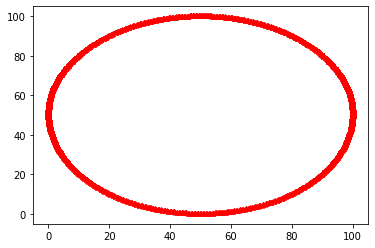

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


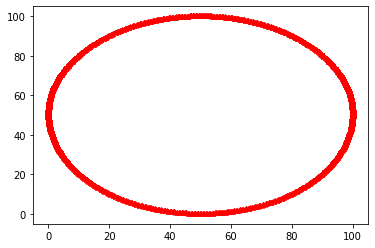

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


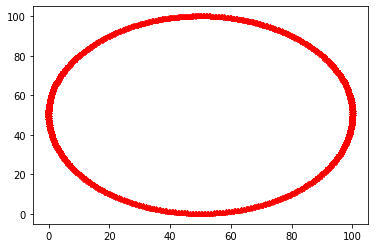

**********************************************************************************

Final parameters:  [7.9404158188371285, 5.558954491332529, 0.0]

Error:  3.00469073190519


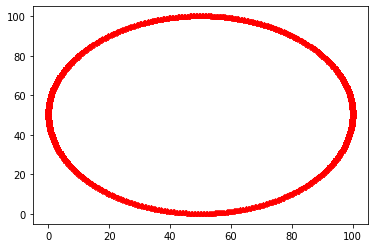

**********************************************************************************

Final parameters:  [7.444740107281265, 5.558954491332529, 0.0]

Error:  2.607481553528374


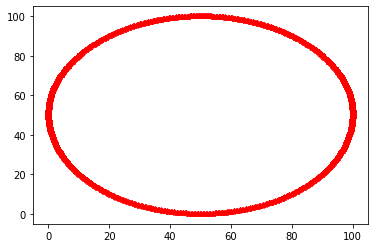

**********************************************************************************

Final parameters:  [7.692577963059197, 5.761730918787201, 0.0]

Error:  2.442318940259245


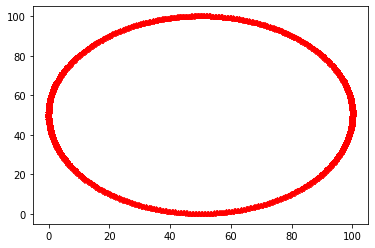

**********************************************************************************

Final parameters:  [7.692577963059197, 5.3561780638778576, 0.0]

Error:  3.09299666124204


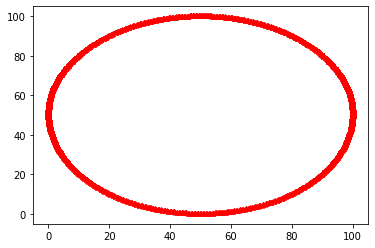

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


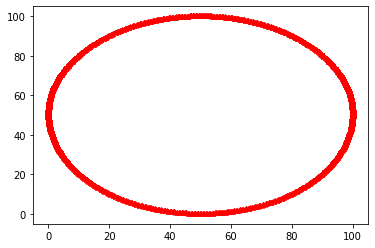

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332529, 0.0]

Error:  2.442312809123835


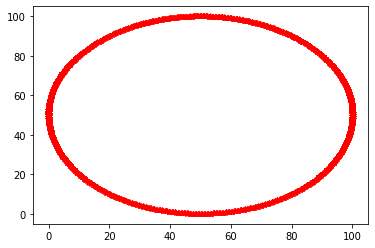

**********************************************************************************

Final parameters:  [7.915632033259335, 5.558954491332529, 0.0]

Error:  2.9734780054564043


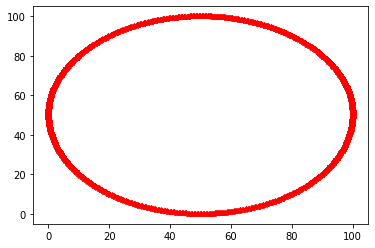

**********************************************************************************

Final parameters:  [7.469523892859058, 5.558954491332529, 0.0]

Error:  2.5902229949897624


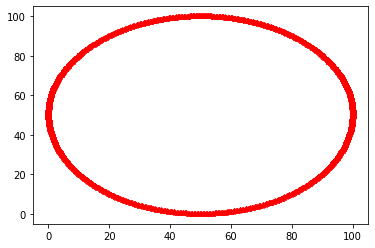

**********************************************************************************

Final parameters:  [7.692577963059197, 5.741453276041733, 0.0]

Error:  2.442318995566737


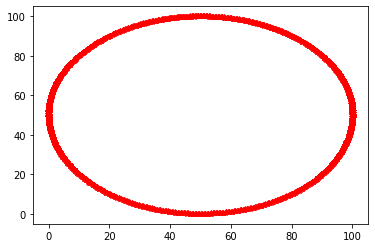

**********************************************************************************

Final parameters:  [7.692577963059197, 5.376455706623324, 0.0]

Error:  3.0280050026995866


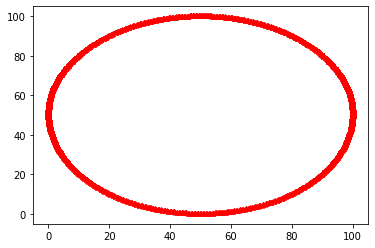

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332528, 0.0]

Error:  2.442312809123835


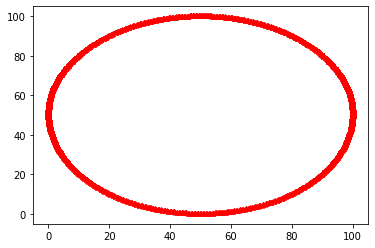

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332528, 0.0]

Error:  2.442312809123835


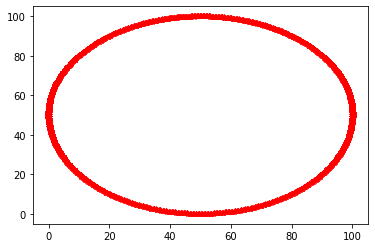

**********************************************************************************

Final parameters:  [7.893326626239322, 5.558954491332528, 0.0]

Error:  2.942437660813566


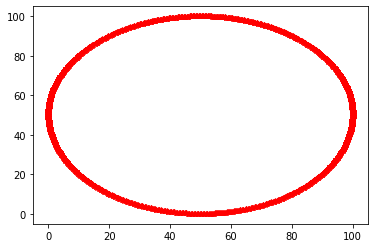

**********************************************************************************

Final parameters:  [7.491829299879072, 5.558954491332528, 0.0]

Error:  2.5748363771869562


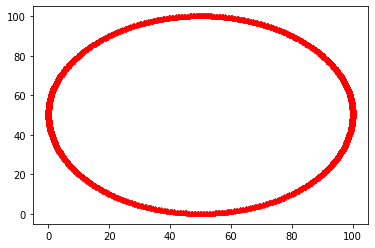

**********************************************************************************

Final parameters:  [7.692577963059197, 5.7232033975708125, 0.0]

Error:  2.4423190589207135


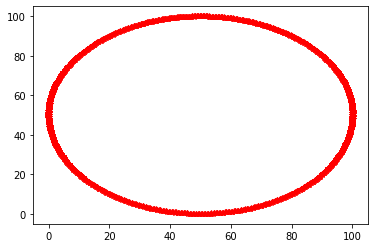

**********************************************************************************

Final parameters:  [7.692577963059197, 5.394705585094244, 0.0]

Error:  2.983690744593236


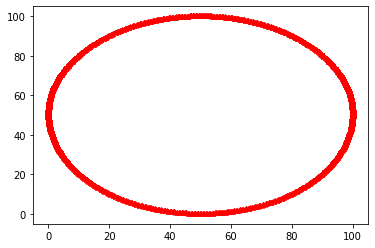

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332528, 0.0]

Error:  2.442312809123835


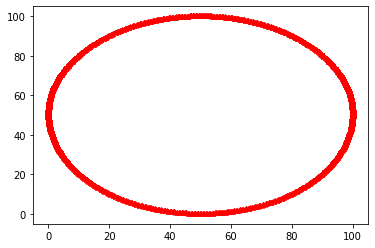

**********************************************************************************

Final parameters:  [7.692577963059197, 5.558954491332528, 0.0]

Error:  2.442312809123835


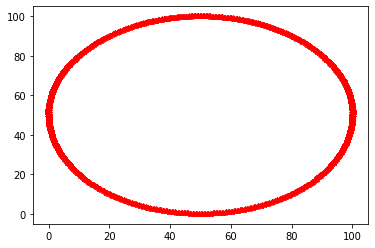

**********************************************************************************

Final parameters:  [7.873251759921309, 5.558954491332528, 0.0]

Error:  2.908679915104683


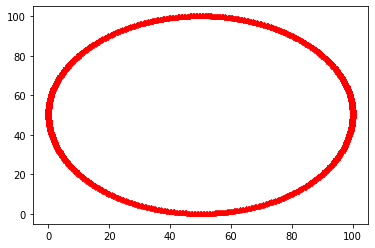

**********************************************************************************

Final parameters:  [7.511904166197084, 5.558954491332528, 0.0]

Error:  2.561105296610689


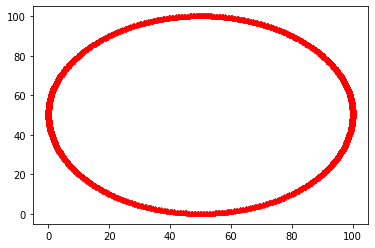

**********************************************************************************

Final parameters:  [7.692577963059196, 5.706778506946984, 0.0]

Error:  2.442319119724462


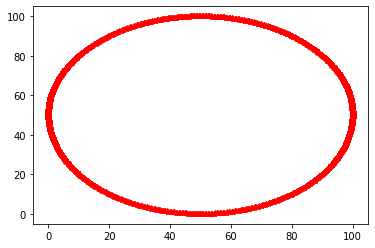

**********************************************************************************

Final parameters:  [7.692577963059196, 5.411130475718073, 0.0]

Error:  2.448145034504878


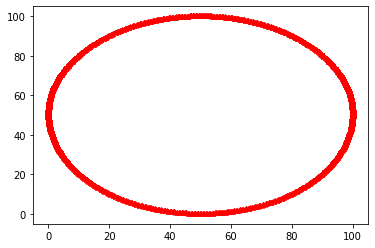

**********************************************************************************

Final parameters:  [7.692577963059196, 5.558954491332528, 0.0]

Error:  2.4423128091238318


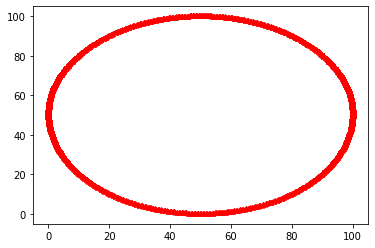

**********************************************************************************

Final parameters:  [7.692577963059196, 5.558954491332528, 0.0]

Error:  2.4423128091238318


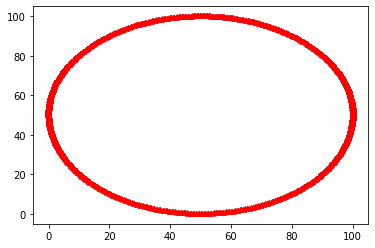

**********************************************************************************

Final parameters:  [7.855184380235097, 5.558954491332528, 0.0]

Error:  2.8677501391815325


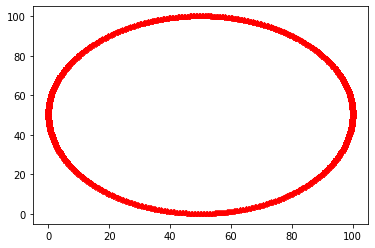

**********************************************************************************

Final parameters:  [7.529971545883295, 5.558954491332528, 0.0]

Error:  2.5488409390760887


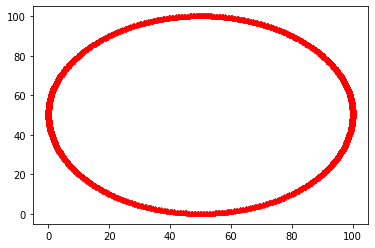

**********************************************************************************

Final parameters:  [7.692577963059196, 5.691996105385538, 0.0]

Error:  2.442319161463684


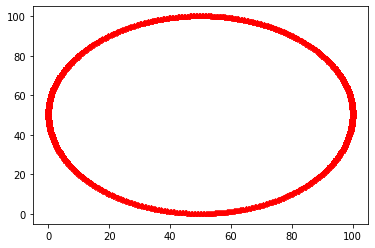

**********************************************************************************

Final parameters:  [7.692577963059196, 5.425912877279518, 0.0]

Error:  2.442396924172299


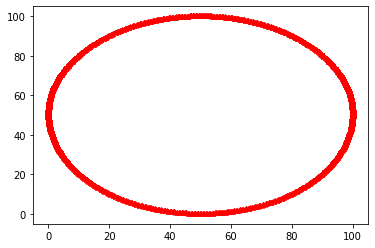

**********************************************************************************

Final parameters:  [7.692577963059196, 5.5589544913325275, 0.0]

Error:  2.442312809123832


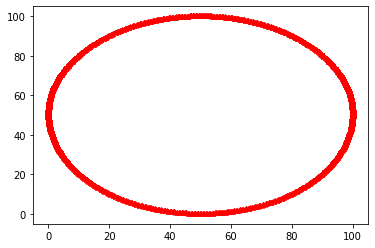

**********************************************************************************

Final parameters:  [7.692577963059196, 5.5589544913325275, 0.0]

Error:  2.442312809123832


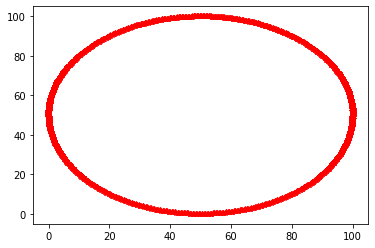

**********************************************************************************

Final parameters:  [7.838923738517507, 5.5589544913325275, 0.0]

Error:  2.8299493802702815


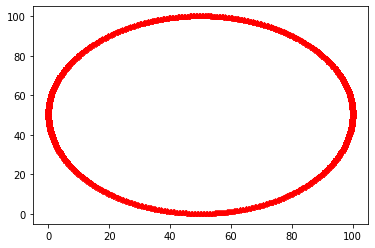

**********************************************************************************

Final parameters:  [7.546232187600885, 5.5589544913325275, 0.0]

Error:  2.5378781191013187


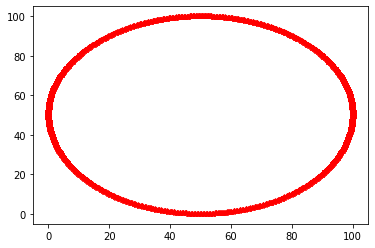

**********************************************************************************

Final parameters:  [7.692577963059196, 5.678691943980237, 0.0]

Error:  2.442319169827764


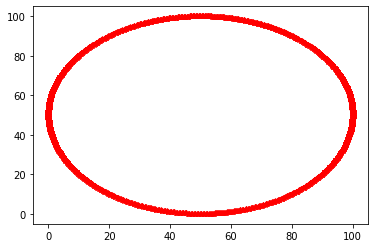

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


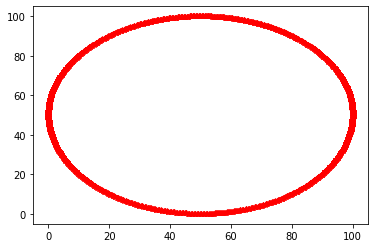

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


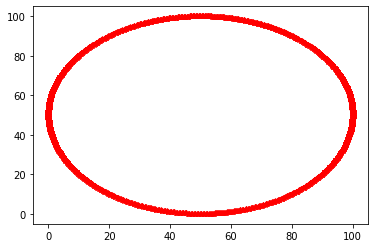

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


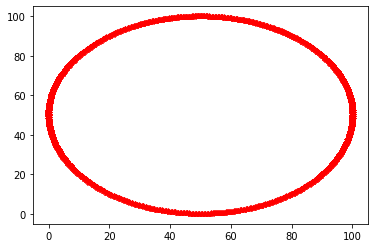

**********************************************************************************

Final parameters:  [7.824289160971676, 5.439217038684819, 0.0]

Error:  3.103678319335155


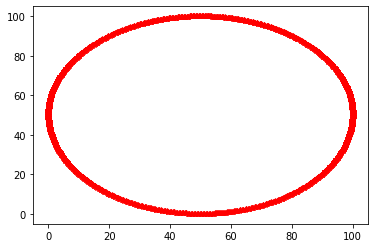

**********************************************************************************

Final parameters:  [7.5608667651467165, 5.439217038684819, 0.0]

Error:  2.528075641989043


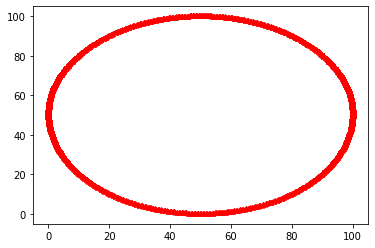

**********************************************************************************

Final parameters:  [7.692577963059197, 5.570928236597299, 0.0]

Error:  2.44231415442548


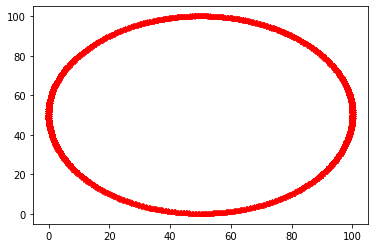

**********************************************************************************

Final parameters:  [7.692577963059197, 5.30750584077234, 0.0]

Error:  3.2527176037338887


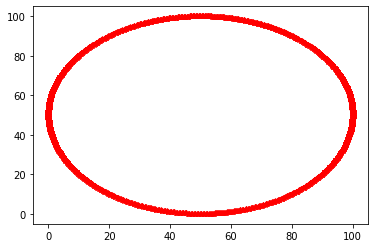

**********************************************************************************

Final parameters:  [7.692577963059197, 5.43921703868482, 0.0]

Error:  2.442205273850039


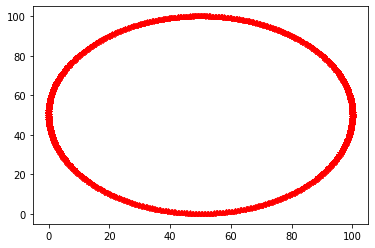

**********************************************************************************

Final parameters:  [7.811118041180428, 5.43921703868482, 0.0]

Error:  3.070930606738916


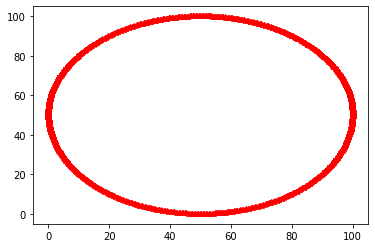

**********************************************************************************

Final parameters:  [7.574037884937964, 5.43921703868482, 0.0]

Error:  2.519296722746566


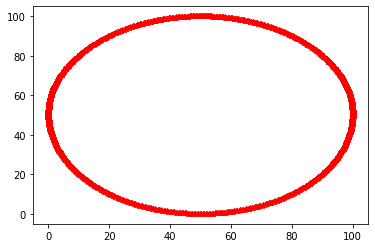

**********************************************************************************

Final parameters:  [7.692577963059196, 5.557757116806052, 0.0]

Error:  2.44231264391485


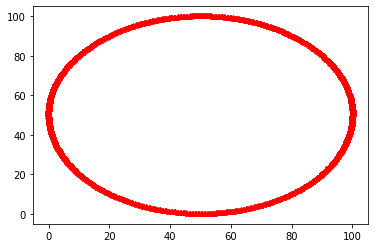

**********************************************************************************

Final parameters:  [7.692577963059196, 5.3206769605635875, 0.0]

Error:  3.1978414627876197


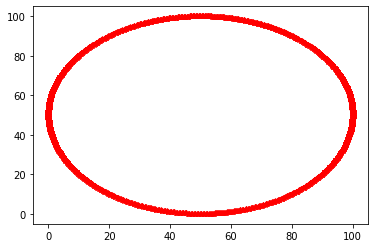

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


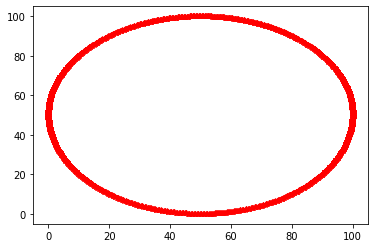

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


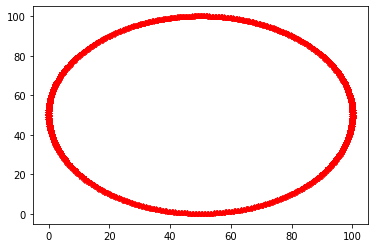

**********************************************************************************

Final parameters:  [7.7992640333683045, 5.439217038684819, 0.0]

Error:  3.060175177245486


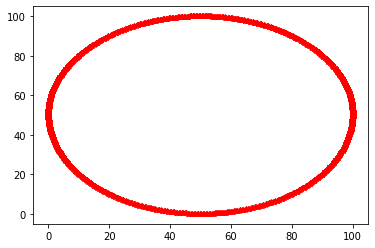

**********************************************************************************

Final parameters:  [7.585891892750087, 5.439217038684819, 0.0]

Error:  2.511431460149793


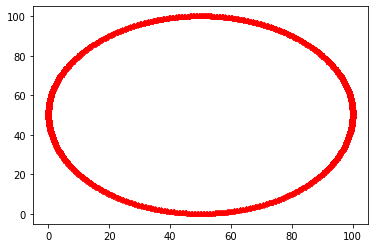

**********************************************************************************

Final parameters:  [7.692577963059196, 5.545903108993928, 0.0]

Error:  2.4423109668195164


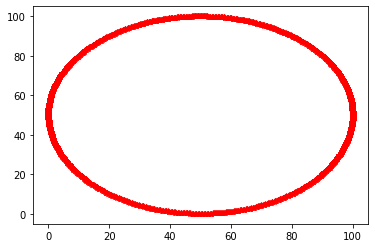

**********************************************************************************

Final parameters:  [7.692577963059196, 5.3325309683757105, 0.0]

Error:  3.145392643630808


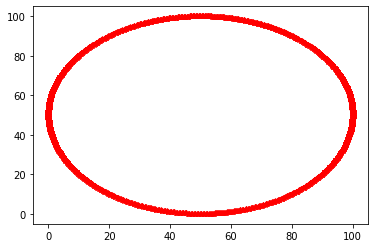

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


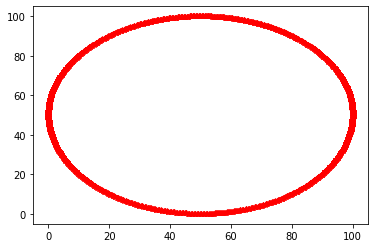

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


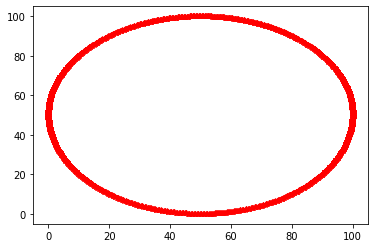

**********************************************************************************

Final parameters:  [7.692577963059196, 5.439217038684819, 0.0]

Error:  2.4422052738500555


In [ ]:
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#
class robot:
    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
   # modify CTE to a circle with r= 50
    def cte(self, radius):           
         #center = [50, 50] # y, x coordinates of the center of the circle
         center = [radius, radius]
         cte = ((self.x - center[1])**2 + (self.y - center[0])**2)**0.5 - radius
         return cte

# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 1.0 # motion distance is equal to speed (we assume time = 1)
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []
    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error += crosstrack_error
        int_crosstrack_error += crosstrack_error
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)
    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

########twiddle
def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    # PD -> dp [1.0, 1.0, 0]
    dp = [1.0, 1.0, 0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

    
## changed r to 50
radius = 50.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,False)

### 4. PID controller.

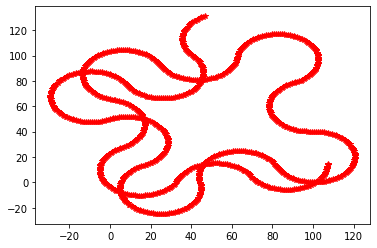

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  317122.8860246721


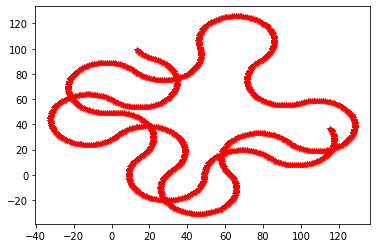

**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  329648.4439749039


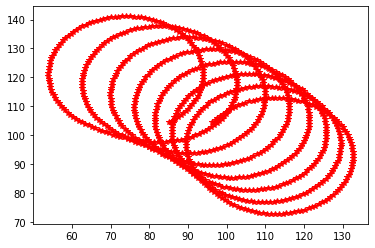

**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  918695.6580140312


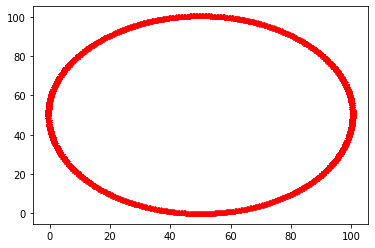

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  176.0580306249186


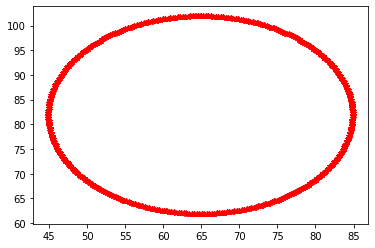

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 1.0]

Error:  325242.6327576461


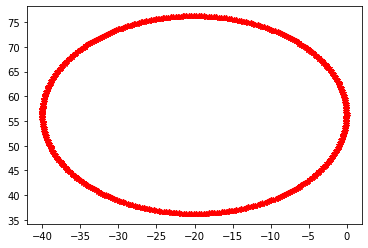

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, -1.0]

Error:  672222.1113947029


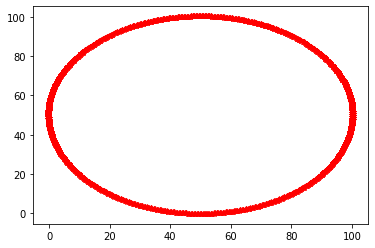

**********************************************************************************

Final parameters:  [1.7999999999999998, 1.0, 0.0]

Error:  44.5822137615573


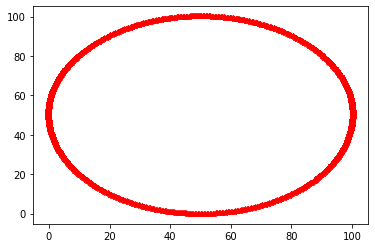

**********************************************************************************

Final parameters:  [1.7999999999999998, 2.1, 0.0]

Error:  44.3475158081214


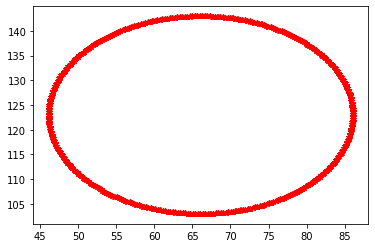

**********************************************************************************

Final parameters:  [1.7999999999999998, 2.1, 0.9]

Error:  873961.2616608735


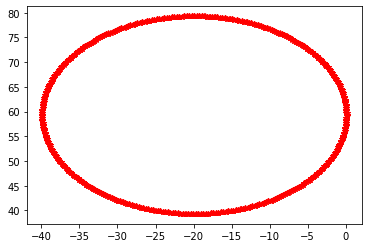

**********************************************************************************

Final parameters:  [1.7999999999999998, 2.1, -0.9]

Error:  681497.8042695415


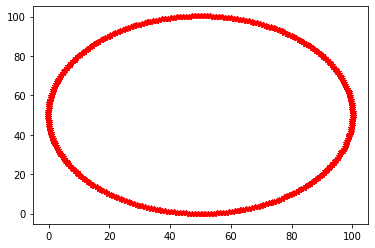

**********************************************************************************

Final parameters:  [2.79, 2.1, 0.0]

Error:  18.508707207109502


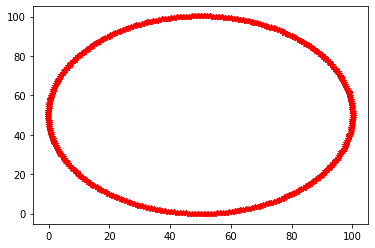

**********************************************************************************

Final parameters:  [2.79, 3.3100000000000005, 0.0]

Error:  18.50870720071552


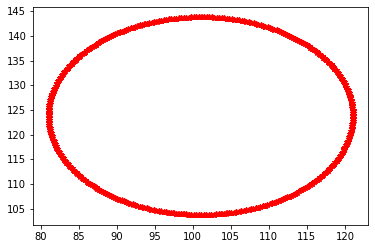

**********************************************************************************

Final parameters:  [2.79, 3.3100000000000005, 0.81]

Error:  1866832.0553790731


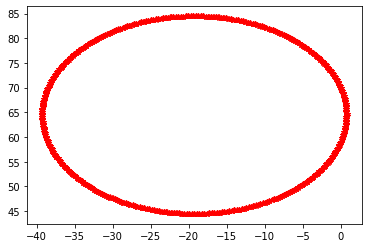

**********************************************************************************

Final parameters:  [2.79, 3.3100000000000005, -0.81]

Error:  691324.53862054


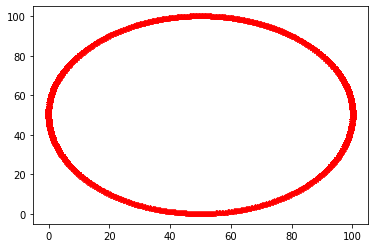

**********************************************************************************

Final parameters:  [3.8790000000000004, 3.3100000000000005, 0.0]

Error:  9.5883528618712


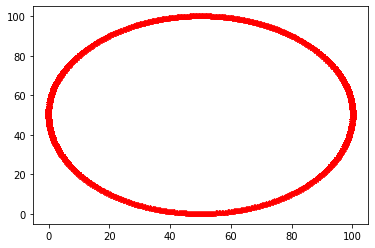

**********************************************************************************

Final parameters:  [3.8790000000000004, 4.641000000000001, 0.0]

Error:  9.588352861871225


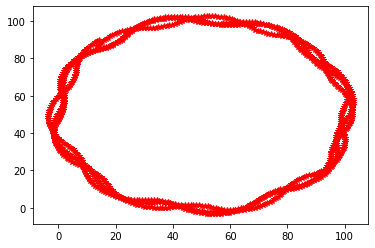

**********************************************************************************

Final parameters:  [3.8790000000000004, 1.979, 0.0]

Error:  3988.0610940822567


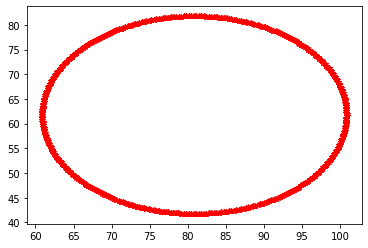

**********************************************************************************

Final parameters:  [3.8790000000000004, 3.3100000000000005, 0.7290000000000001]

Error:  379317.89619045996


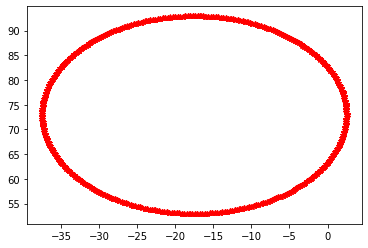

**********************************************************************************

Final parameters:  [3.8790000000000004, 3.3100000000000005, -0.7290000000000001]

Error:  714067.4544277042


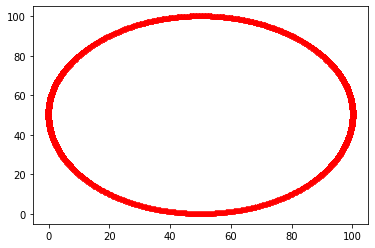

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.0]

Error:  5.6020644768905505


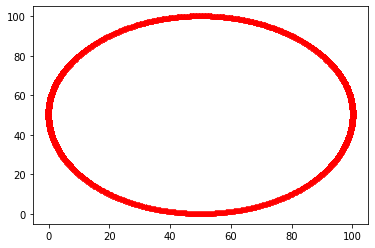

**********************************************************************************

Final parameters:  [5.076900000000001, 4.507900000000001, 0.0]

Error:  5.602076998784143


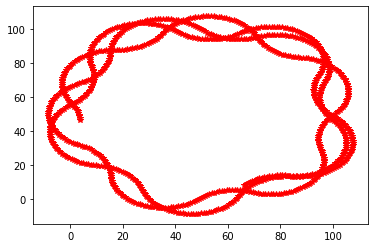

**********************************************************************************

Final parameters:  [5.076900000000001, 2.1121000000000003, 0.0]

Error:  33169.06125643906


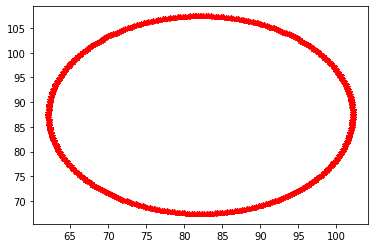

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.6561000000000001]

Error:  195130.18949219948


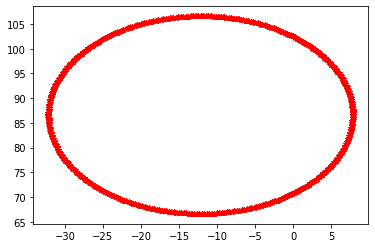

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, -0.6561000000000001]

Error:  749729.7723267578


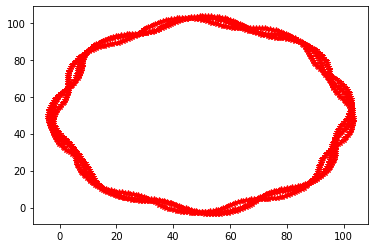

**********************************************************************************

Final parameters:  [6.394590000000002, 3.3100000000000005, 0.0]

Error:  4071.0639787996715


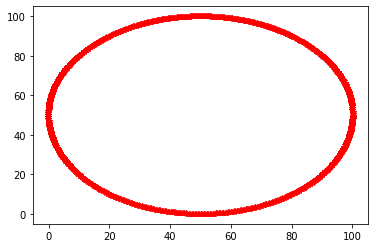

**********************************************************************************

Final parameters:  [3.759210000000001, 3.3100000000000005, 0.0]

Error:  10.208018292148479


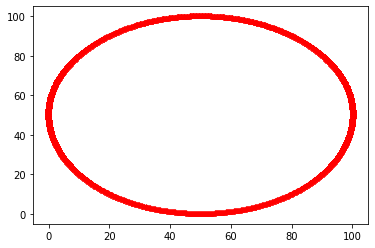

**********************************************************************************

Final parameters:  [5.076900000000001, 4.388110000000001, 0.0]

Error:  5.602076998784162


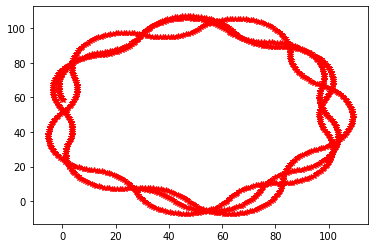

**********************************************************************************

Final parameters:  [5.076900000000001, 2.2318900000000004, 0.0]

Error:  21194.01039828338


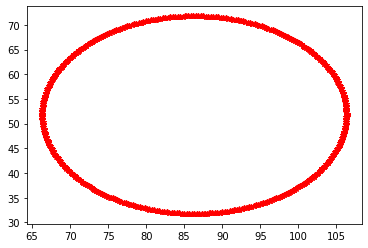

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, 0.5904900000000002]

Error:  306499.25024864613


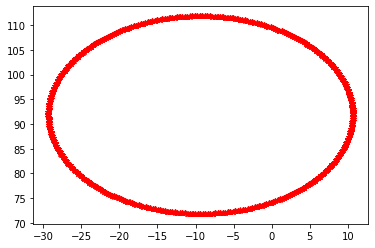

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000005, -0.5904900000000002]

Error:  769859.1190566063


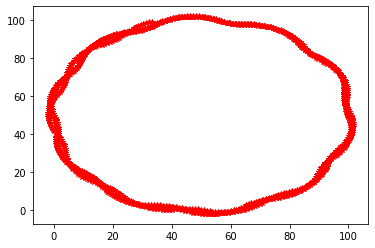

**********************************************************************************

Final parameters:  [6.2628210000000015, 3.3100000000000005, 0.0]

Error:  1446.0969602034584


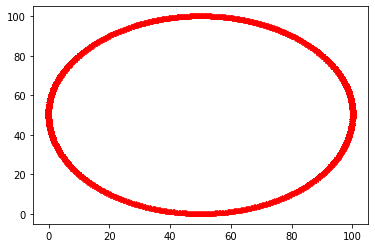

**********************************************************************************

Final parameters:  [3.8909790000000006, 3.3100000000000005, 0.0]

Error:  9.529508978357272


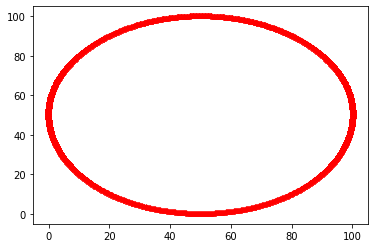

**********************************************************************************

Final parameters:  [5.076900000000001, 4.280299000000001, 0.0]

Error:  5.602076998784131


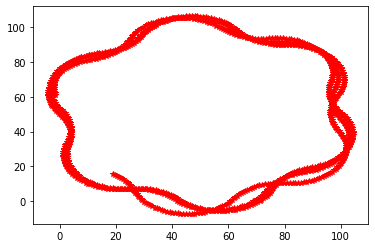

**********************************************************************************

Final parameters:  [5.076900000000001, 2.3397010000000007, 0.0]

Error:  16798.76941330433


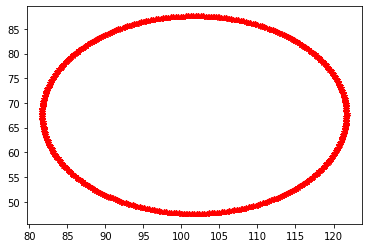

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.5314410000000002]

Error:  237483.0832068074


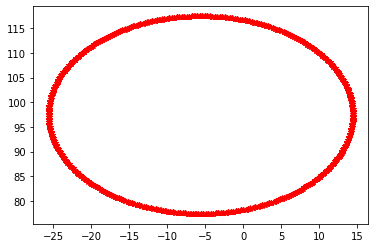

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, -0.5314410000000002]

Error:  790831.7199091444


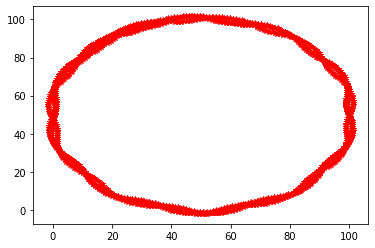

**********************************************************************************

Final parameters:  [6.144228900000002, 3.310000000000001, 0.0]

Error:  1533.5513986645026


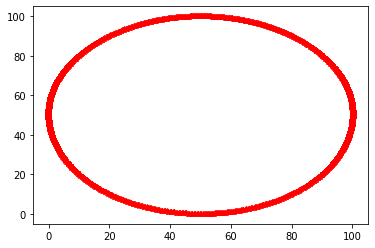

**********************************************************************************

Final parameters:  [4.0095711000000005, 3.310000000000001, 0.0]

Error:  8.975068351632626


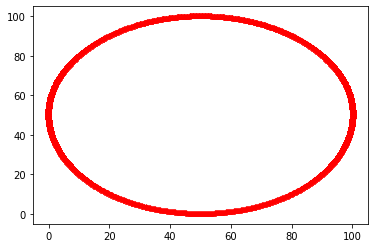

**********************************************************************************

Final parameters:  [5.076900000000001, 4.183269100000001, 0.0]

Error:  5.602076998784151


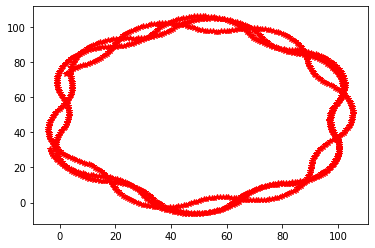

**********************************************************************************

Final parameters:  [5.076900000000001, 2.4367309000000006, 0.0]

Error:  13149.068052995735


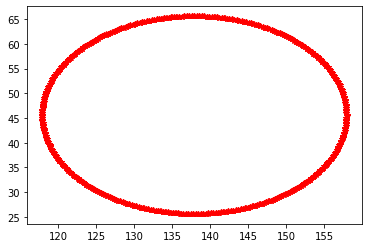

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.47829690000000014]

Error:  1739477.7636647043


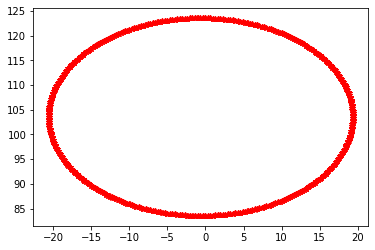

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, -0.47829690000000014]

Error:  819623.8588221802


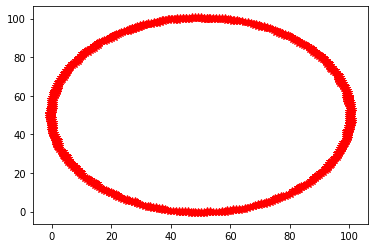

**********************************************************************************

Final parameters:  [6.037496010000002, 3.310000000000001, 0.0]

Error:  617.6125446836581


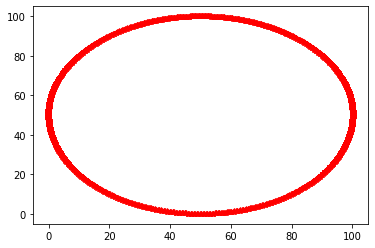

**********************************************************************************

Final parameters:  [4.1163039900000005, 3.310000000000001, 0.0]

Error:  8.516423920061849


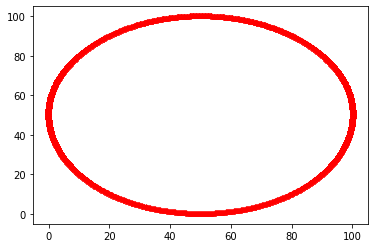

**********************************************************************************

Final parameters:  [5.076900000000001, 4.0959421900000015, 0.0]

Error:  5.602076998784142


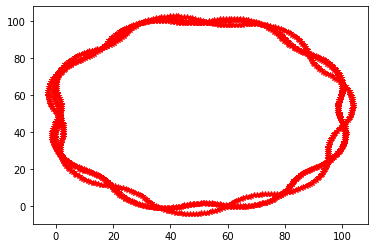

**********************************************************************************

Final parameters:  [5.076900000000001, 2.524057810000001, 0.0]

Error:  4935.391276333584


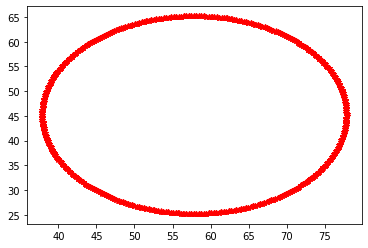

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000014, 0.43046721000000016]

Error:  876472.2825908246


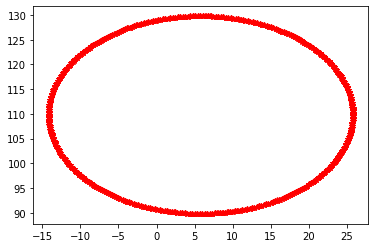

**********************************************************************************

Final parameters:  [5.076900000000001, 3.3100000000000014, -0.43046721000000016]

Error:  850602.0536496369


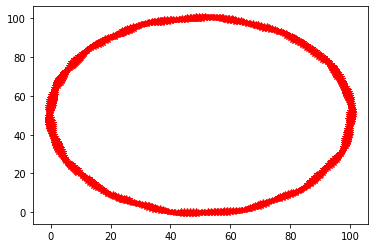

**********************************************************************************

Final parameters:  [5.941436409000001, 3.3100000000000014, 0.0]

Error:  406.52309545232686


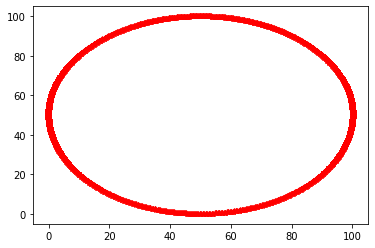

**********************************************************************************

Final parameters:  [4.212363591000001, 3.3100000000000014, 0.0]

Error:  8.133050662971026


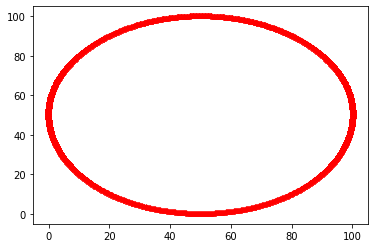

**********************************************************************************

Final parameters:  [5.076900000000001, 4.017347971000001, 0.0]

Error:  5.602076998784046


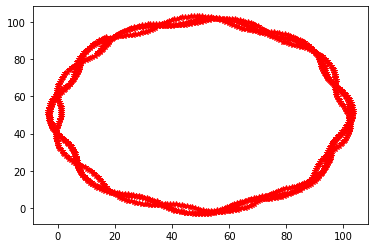

**********************************************************************************

Final parameters:  [5.076900000000001, 2.6026520290000006, 0.0]

Error:  3296.423616367606


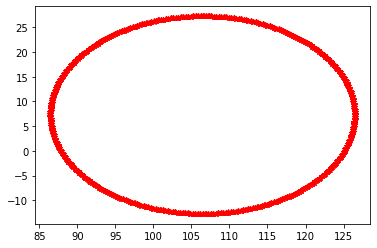

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, 0.38742048900000015]

Error:  687044.6350664903


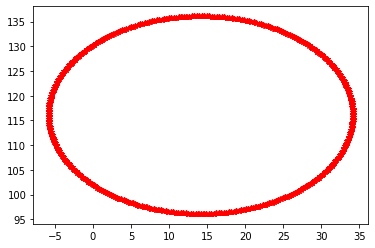

**********************************************************************************

Final parameters:  [5.076900000000001, 3.310000000000001, -0.38742048900000015]

Error:  893697.3569530451


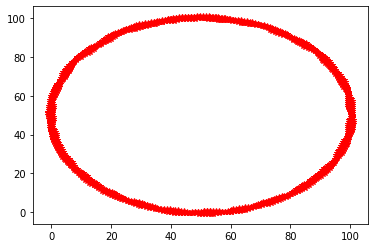

**********************************************************************************

Final parameters:  [5.854982768100001, 3.310000000000001, 0.0]

Error:  358.327455064019


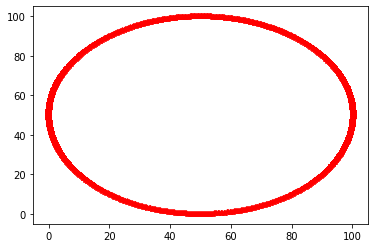

**********************************************************************************

Final parameters:  [4.2988172319, 3.310000000000001, 0.0]

Error:  7.809723921522308


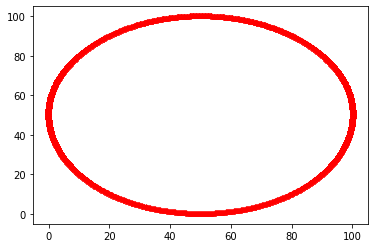

**********************************************************************************

Final parameters:  [5.0769, 3.946613173900001, 0.0]

Error:  5.602076998784096


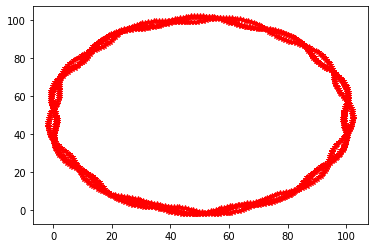

**********************************************************************************

Final parameters:  [5.0769, 2.6733868261000007, 0.0]

Error:  1781.5246742554361


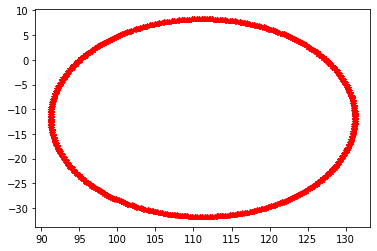

**********************************************************************************

Final parameters:  [5.0769, 3.310000000000001, 0.34867844010000015]

Error:  1653997.5429172986


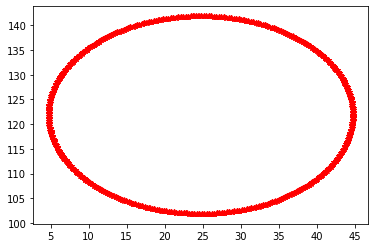

**********************************************************************************

Final parameters:  [5.0769, 3.310000000000001, -0.34867844010000015]

Error:  946454.4871617997


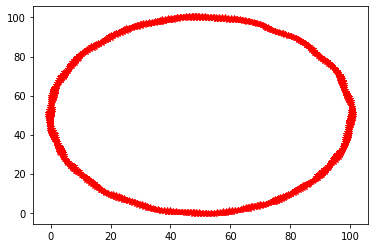

**********************************************************************************

Final parameters:  [5.77717449129, 3.310000000000001, 0.0]

Error:  207.58865430289418


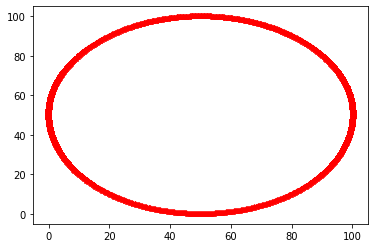

**********************************************************************************

Final parameters:  [4.376625508709999, 3.310000000000001, 0.0]

Error:  7.5349353213814


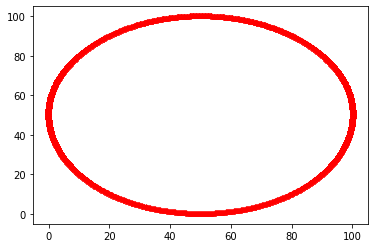

**********************************************************************************

Final parameters:  [5.076899999999999, 3.8829518565100014, 0.0]

Error:  5.602076998787347


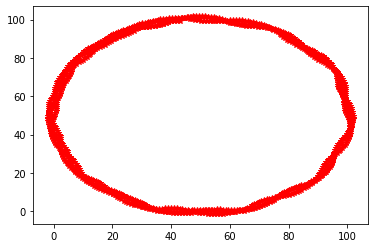

**********************************************************************************

Final parameters:  [5.076899999999999, 2.737048143490001, 0.0]

Error:  1222.9207732239888


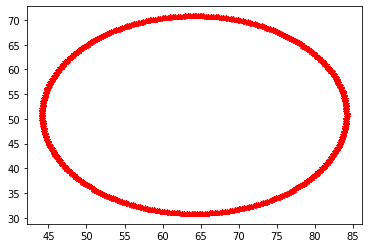

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, 0.31381059609000017]

Error:  835358.9263135766


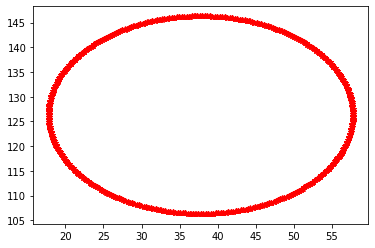

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, -0.31381059609000017]

Error:  1009509.1465105198


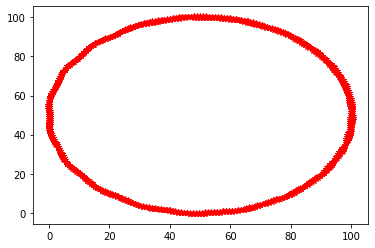

**********************************************************************************

Final parameters:  [5.707147042160999, 3.3100000000000014, 0.0]

Error:  108.35575077779912


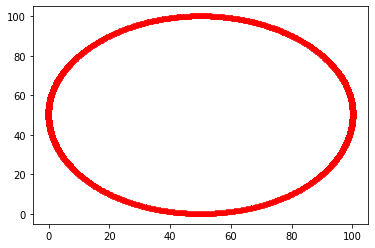

**********************************************************************************

Final parameters:  [4.446652957838999, 3.3100000000000014, 0.0]

Error:  7.299839118064569


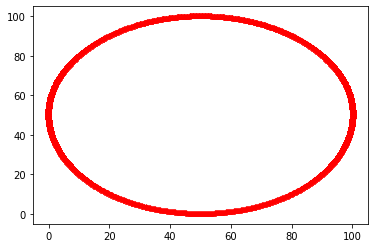

**********************************************************************************

Final parameters:  [5.076899999999998, 3.8256566708590016, 0.0]

Error:  5.602076998796676


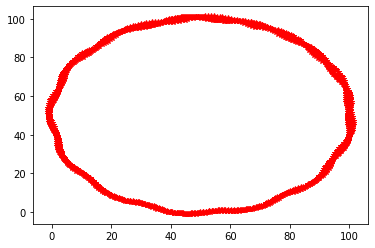

**********************************************************************************

Final parameters:  [5.076899999999998, 2.794343329141001, 0.0]

Error:  567.1501974877892


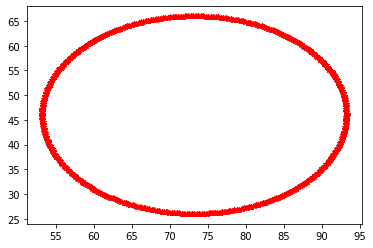

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000014, 0.28242953648100017]

Error:  650926.1987938954


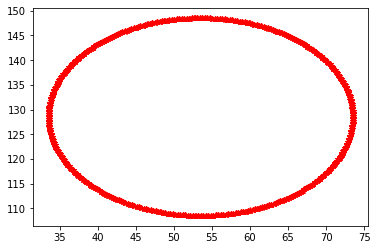

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000014, -0.28242953648100017]

Error:  1088014.2295611203


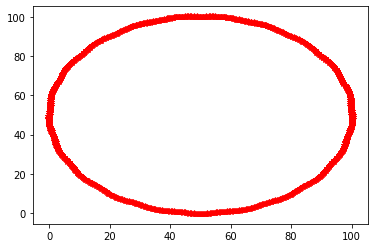

**********************************************************************************

Final parameters:  [5.644122337944899, 3.3100000000000014, 0.0]

Error:  65.88242136424033


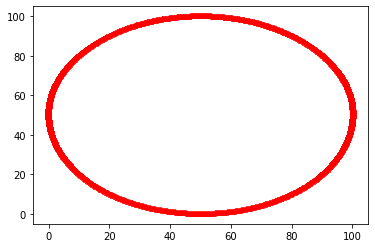

**********************************************************************************

Final parameters:  [4.509677662055099, 3.3100000000000014, 0.0]

Error:  7.097534330811893


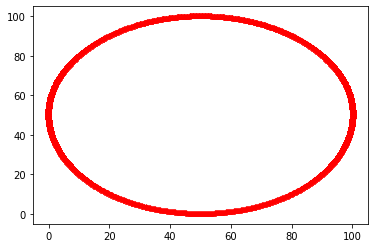

**********************************************************************************

Final parameters:  [5.076899999999999, 3.7740910037731017, 0.0]

Error:  5.602076998775972


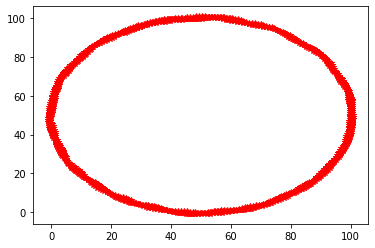

**********************************************************************************

Final parameters:  [5.076899999999999, 2.845908996226901, 0.0]

Error:  313.4663607770743


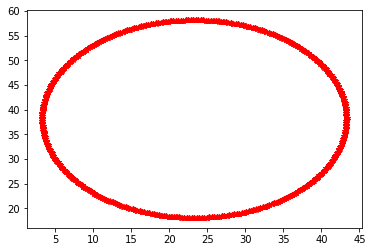

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, 0.25418658283290013]

Error:  479840.9154945079


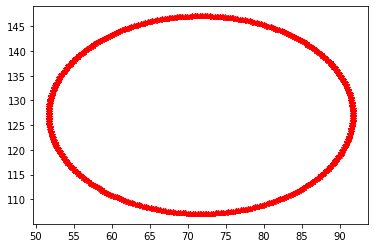

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000014, -0.25418658283290013]

Error:  1181021.1158513732


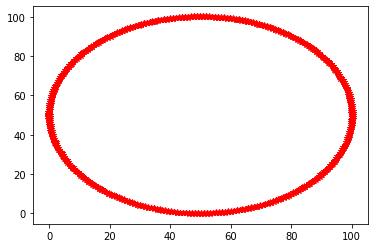

**********************************************************************************

Final parameters:  [5.58740010415041, 3.3100000000000014, 0.0]

Error:  47.254175058624476


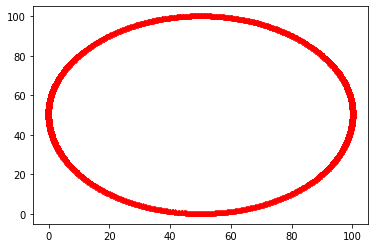

**********************************************************************************

Final parameters:  [4.566399895849589, 3.3100000000000014, 0.0]

Error:  6.92256509459181


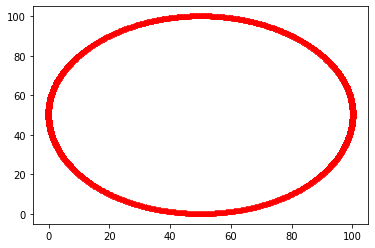

**********************************************************************************

Final parameters:  [5.076899999999999, 3.7276819033957915, 0.0]

Error:  5.602076998591579


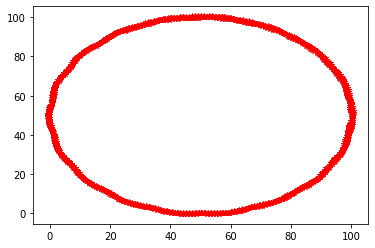

**********************************************************************************

Final parameters:  [5.076899999999999, 2.892318096604211, 0.0]

Error:  120.31528965061122


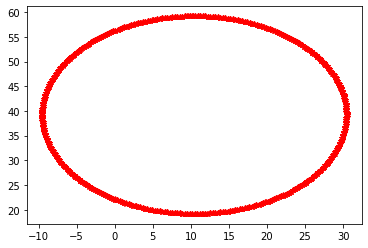

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, 0.22876792454961012]

Error:  234378.94044373976


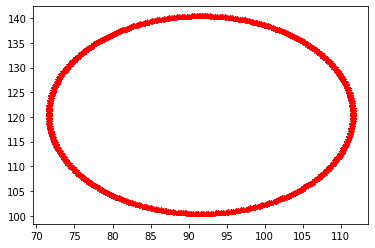

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, -0.22876792454961012]

Error:  1291190.100591438


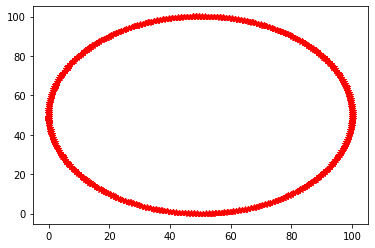

**********************************************************************************

Final parameters:  [5.5363500937353685, 3.310000000000001, 0.0]

Error:  12.866714825756628


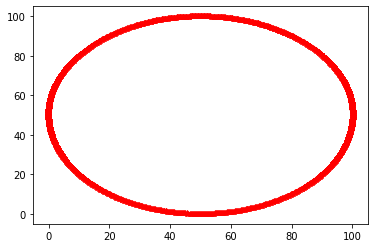

**********************************************************************************

Final parameters:  [4.61744990626463, 3.310000000000001, 0.0]

Error:  6.770566161220485


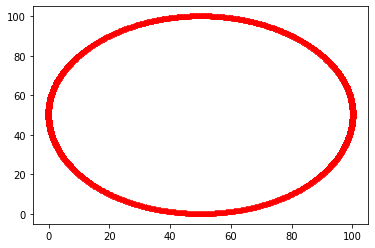

**********************************************************************************

Final parameters:  [5.076899999999999, 3.685913713056212, 0.0]

Error:  5.602076998102455


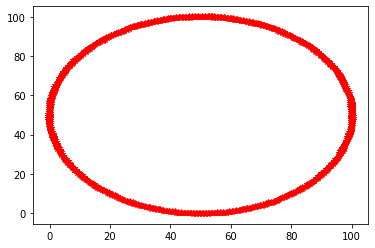

**********************************************************************************

Final parameters:  [5.076899999999999, 2.9340862869437894, 0.0]

Error:  74.06356253557291


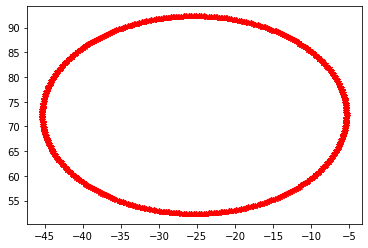

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.2058911320946491]

Error:  1093330.6171055275


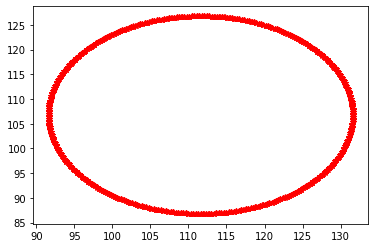

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, -0.2058911320946491]

Error:  1426329.1862744987


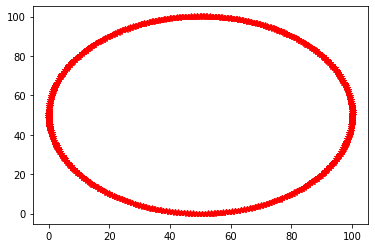

**********************************************************************************

Final parameters:  [5.490405084361831, 3.3100000000000005, 0.0]

Error:  10.699269499725307


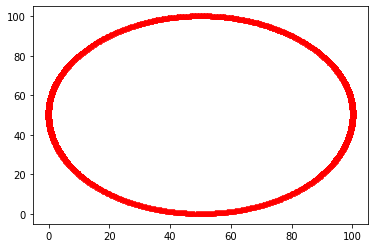

**********************************************************************************

Final parameters:  [4.663394915638166, 3.3100000000000005, 0.0]

Error:  6.6380070374470055


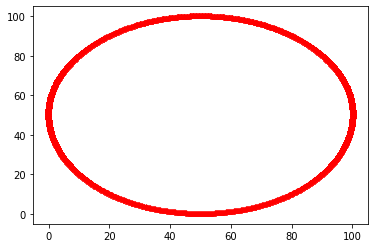

**********************************************************************************

Final parameters:  [5.076899999999998, 3.648322341750591, 0.0]

Error:  5.602076997631729


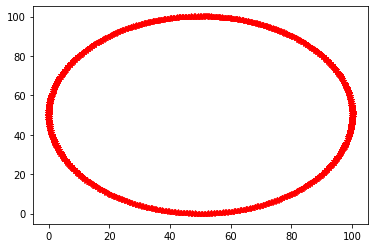

**********************************************************************************

Final parameters:  [5.076899999999998, 2.97167765824941, 0.0]

Error:  9.415264071220198


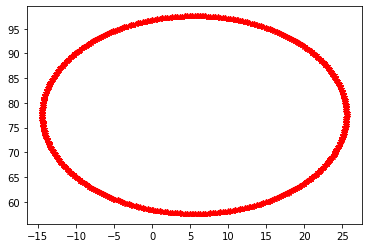

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000005, 0.1853020188851842]

Error:  210595.50179957403


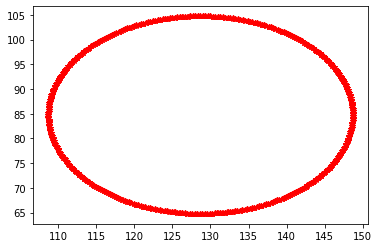

**********************************************************************************

Final parameters:  [5.076899999999998, 3.3100000000000005, -0.1853020188851842]

Error:  1583480.3655698884


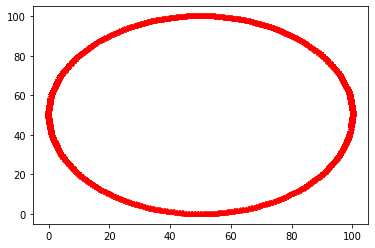

**********************************************************************************

Final parameters:  [5.449054575925648, 3.3100000000000005, 0.0]

Error:  7.798638550210212


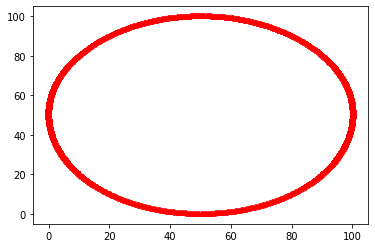

**********************************************************************************

Final parameters:  [4.70474542407435, 3.3100000000000005, 0.0]

Error:  6.522004339110099


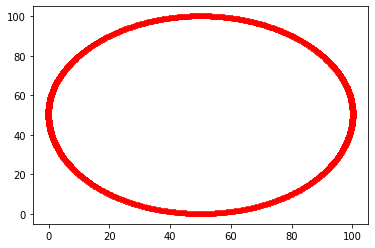

**********************************************************************************

Final parameters:  [5.076899999999999, 3.6144901075755316, 0.0]

Error:  5.602076998680952


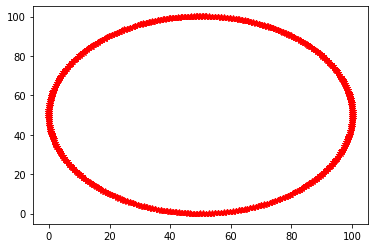

**********************************************************************************

Final parameters:  [5.076899999999999, 3.0055098924244694, 0.0]

Error:  11.782289488361956


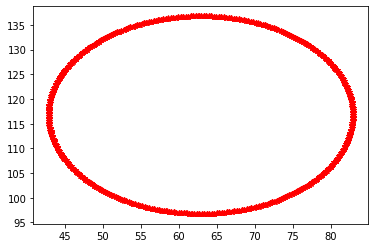

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.16677181699666577]

Error:  575061.7227860185


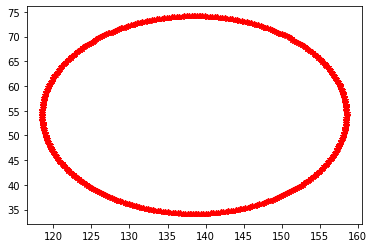

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, -0.16677181699666577]

Error:  1772074.376161975


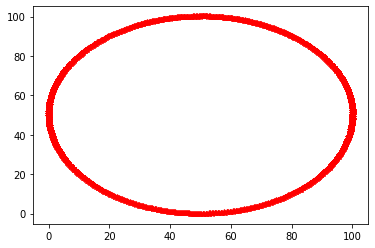

**********************************************************************************

Final parameters:  [5.411839118333083, 3.3100000000000005, 0.0]

Error:  6.939667604688452


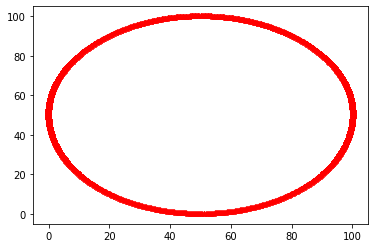

**********************************************************************************

Final parameters:  [4.741960881666915, 3.3100000000000005, 0.0]

Error:  6.420182221978451


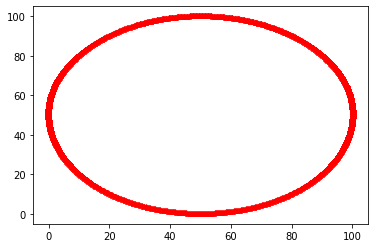

**********************************************************************************

Final parameters:  [5.076899999999999, 3.5840410968179786, 0.0]

Error:  5.6020770041975965


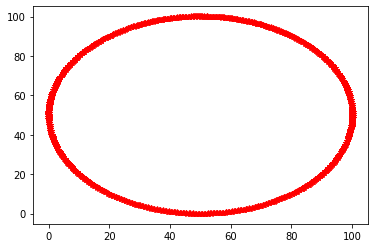

**********************************************************************************

Final parameters:  [5.076899999999999, 3.0359589031820224, 0.0]

Error:  9.42231109619489


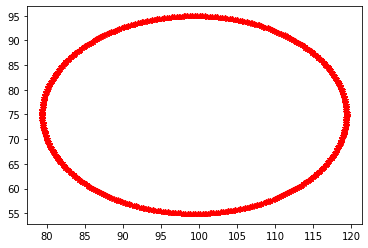

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, 0.1500946352969992]

Error:  243796.77327169947


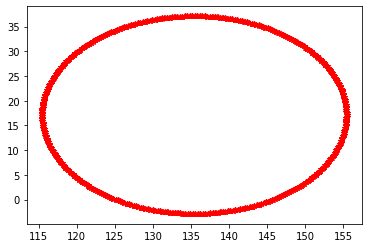

**********************************************************************************

Final parameters:  [5.076899999999999, 3.3100000000000005, -0.1500946352969992]

Error:  2010116.2788320738


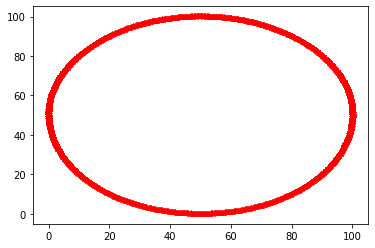

**********************************************************************************

Final parameters:  [5.378345206499775, 3.3100000000000005, 0.0]

Error:  6.586434022694782


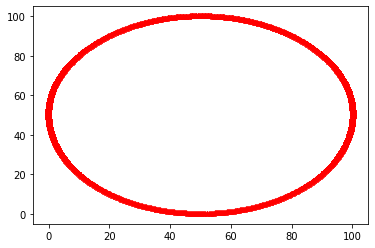

**********************************************************************************

Final parameters:  [4.775454793500224, 3.3100000000000005, 0.0]

Error:  6.330567409582729


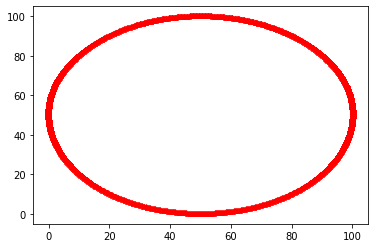

**********************************************************************************

Final parameters:  [5.076899999999999, 3.556636987136181, 0.0]

Error:  5.602077017637808


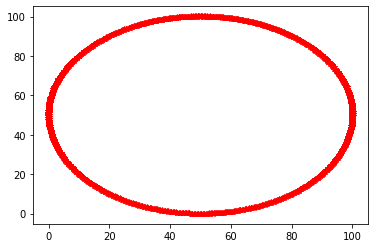

**********************************************************************************

Final parameters:  [5.076899999999999, 3.0633630128638205, 0.0]

Error:  7.869812274598297


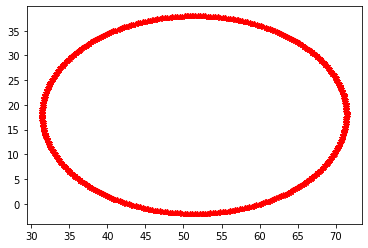

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, 0.13508517176729928]

Error:  399583.4867376978


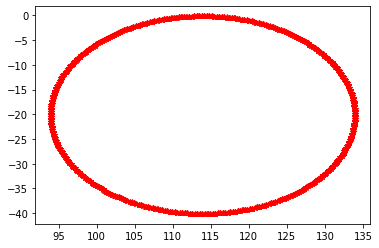

**********************************************************************************

Final parameters:  [5.076899999999999, 3.310000000000001, -0.13508517176729928]

Error:  2315633.1699578622


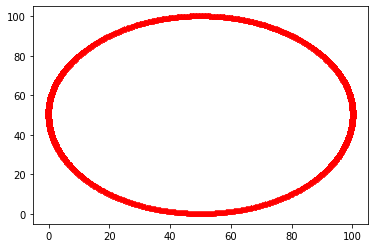

**********************************************************************************

Final parameters:  [5.348200685849798, 3.310000000000001, 0.0]

Error:  5.060959422834369


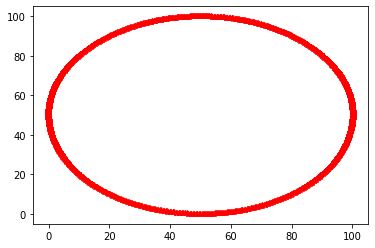

**********************************************************************************

Final parameters:  [5.348200685849798, 3.531973288422563, 0.0]

Error:  5.04882431802826


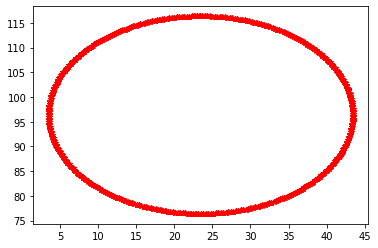

**********************************************************************************

Final parameters:  [5.348200685849798, 3.531973288422563, 0.12157665459056936]

Error:  222705.01045055274


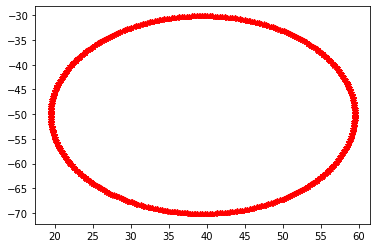

**********************************************************************************

Final parameters:  [5.348200685849798, 3.531973288422563, -0.12157665459056936]

Error:  2879711.527045522


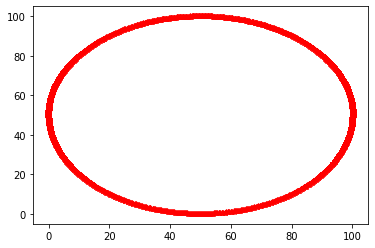

**********************************************************************************

Final parameters:  [5.646631440284576, 3.531973288422563, 0.0]

Error:  4.749352611920668


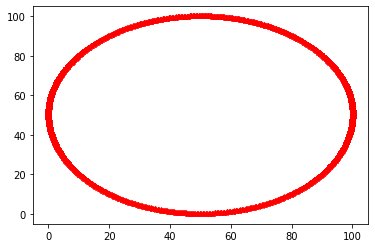

**********************************************************************************

Final parameters:  [5.646631440284576, 3.7761439056873813, 0.0]

Error:  4.529868189309819


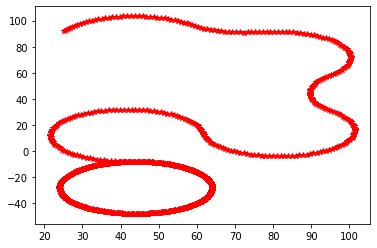

**********************************************************************************

Final parameters:  [5.646631440284576, 3.7761439056873813, 0.10941898913151243]

Error:  778596.5284466206


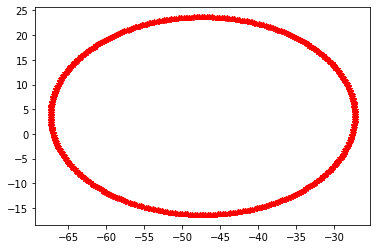

**********************************************************************************

Final parameters:  [5.646631440284576, 3.7761439056873813, -0.10941898913151243]

Error:  3638934.8649770734


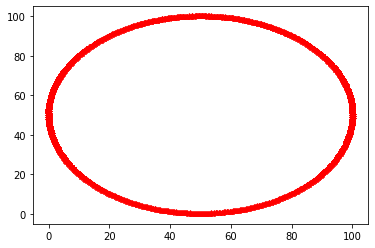

**********************************************************************************

Final parameters:  [5.974905270162832, 3.7761439056873813, 0.0]

Error:  5.3894636355603325


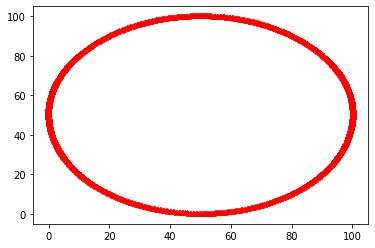

**********************************************************************************

Final parameters:  [5.318357610406321, 3.7761439056873813, 0.0]

Error:  5.105574088442477


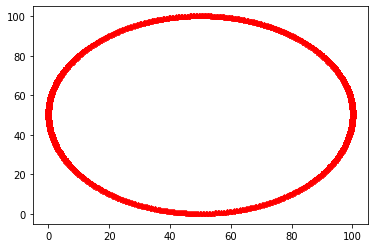

**********************************************************************************

Final parameters:  [5.646631440284577, 4.044731584678682, 0.0]

Error:  4.52987287253305


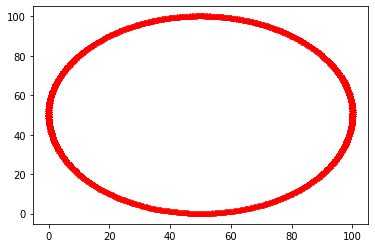

**********************************************************************************

Final parameters:  [5.646631440284577, 3.507556226696081, 0.0]

Error:  6.095633679627737


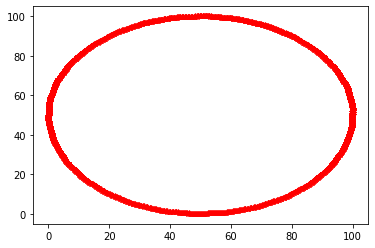

**********************************************************************************

Final parameters:  [5.646631440284577, 3.7761439056873813, 0.0984770902183612]

Error:  4.510882301128982


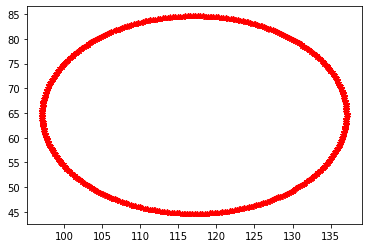

**********************************************************************************

Final parameters:  [5.9420778871750075, 3.7761439056873813, 0.0984770902183612]

Error:  597782.0048618773


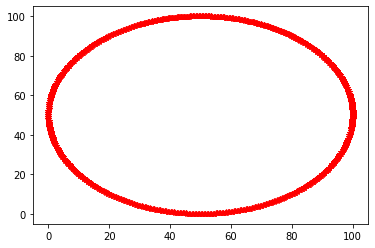

**********************************************************************************

Final parameters:  [5.351184993394147, 3.7761439056873813, 0.0984770902183612]

Error:  1.3699103730043427e-05


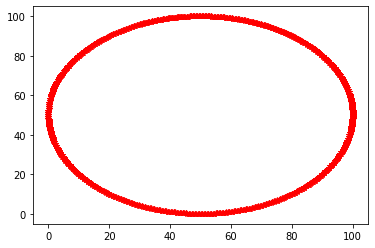

**********************************************************************************

Final parameters:  [5.351184993394147, 4.017872816779552, 0.0984770902183612]

Error:  1.502292493430726e-11


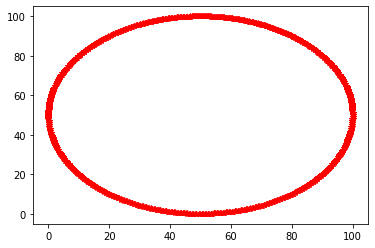

**********************************************************************************

Final parameters:  [5.351184993394147, 4.017872816779552, 0.2068018894585585]

Error:  0.11618674579353862


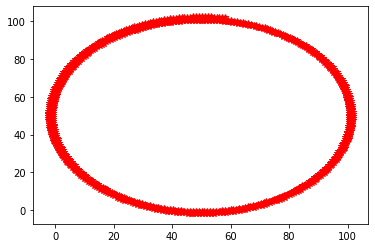

**********************************************************************************

Final parameters:  [5.351184993394147, 4.017872816779552, -0.009847709021836126]

Error:  2053.9044529606126


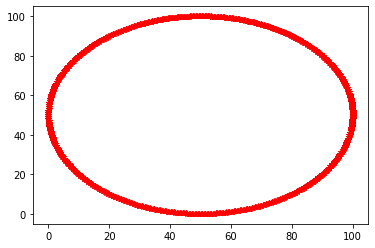

**********************************************************************************

Final parameters:  [5.676176084973621, 4.017872816779552, 0.0984770902183612]

Error:  8.485786704825915e-06


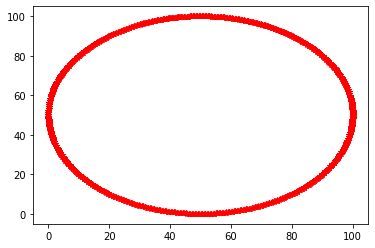

**********************************************************************************

Final parameters:  [5.026193901814674, 4.017872816779552, 0.0984770902183612]

Error:  4.009243269641787e-17


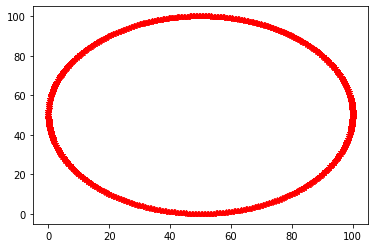

**********************************************************************************

Final parameters:  [5.026193901814674, 4.28377461898094, 0.0984770902183612]

Error:  1.3811089131885319e-18


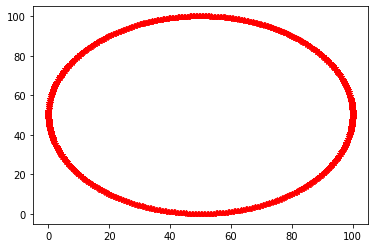

**********************************************************************************

Final parameters:  [5.026193901814674, 4.28377461898094, 0.19596940953453879]

Error:  2.5636574916159027e-15


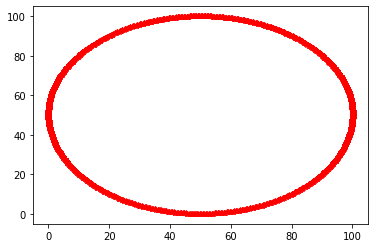

**********************************************************************************

Final parameters:  [5.026193901814674, 4.28377461898094, 0.0009847709021836015]

Error:  3.2013743541978466


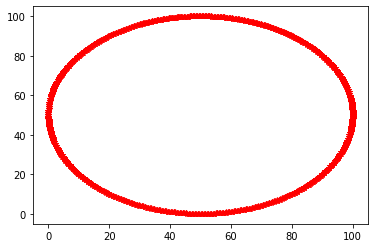

**********************************************************************************

Final parameters:  [5.3836841025520945, 4.28377461898094, 0.0984770902183612]

Error:  4.0617799117840377e-17


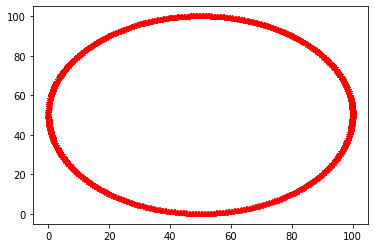

**********************************************************************************

Final parameters:  [4.668703701077253, 4.28377461898094, 0.0984770902183612]

Error:  6.662806320984151e-20


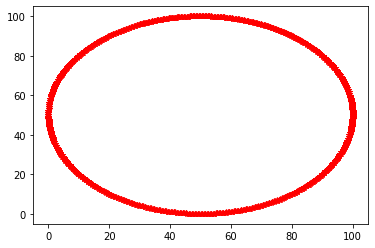

**********************************************************************************

Final parameters:  [4.668703701077253, 4.576266601402466, 0.0984770902183612]

Error:  6.154406394471303e-20


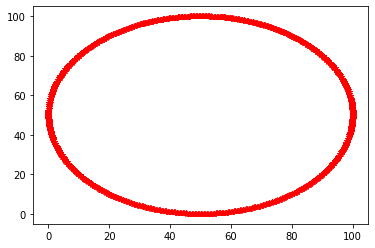

**********************************************************************************

Final parameters:  [4.668703701077253, 4.576266601402466, 0.18622017760292103]

Error:  2.5728225107240167e-25


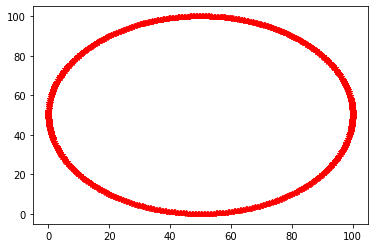

**********************************************************************************

Final parameters:  [5.0619429218884155, 4.576266601402466, 0.18622017760292103]

Error:  4.73208500743028e-23


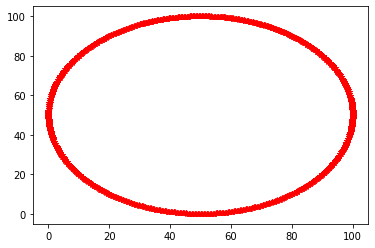

**********************************************************************************

Final parameters:  [4.2754644802660895, 4.576266601402466, 0.18622017760292103]

Error:  3.0418476505322215e-25


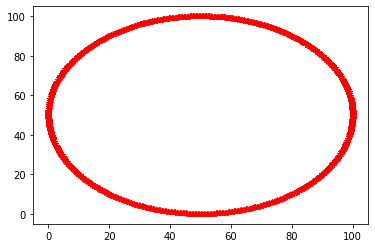

**********************************************************************************

Final parameters:  [4.668703701077252, 4.898007782066145, 0.18622017760292103]

Error:  2.4955772508847753e-25


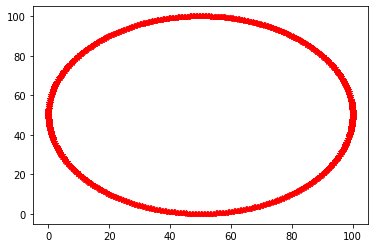

**********************************************************************************

Final parameters:  [4.668703701077252, 4.898007782066145, 0.2827375737259369]

Error:  2.942892938581298e-25


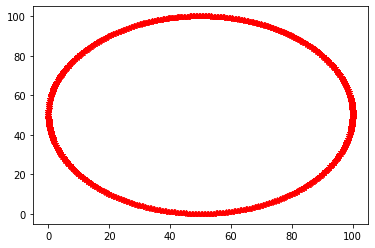

**********************************************************************************

Final parameters:  [4.668703701077252, 4.898007782066145, 0.08970278147990524]

Error:  2.8397232384064597e-18


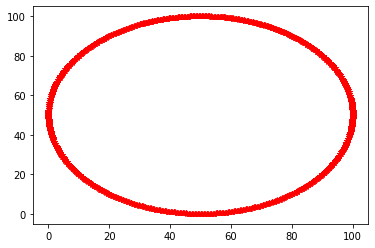

**********************************************************************************

Final parameters:  [5.022618999807299, 4.898007782066145, 0.18622017760292106]

Error:  2.8096070000351556e-25


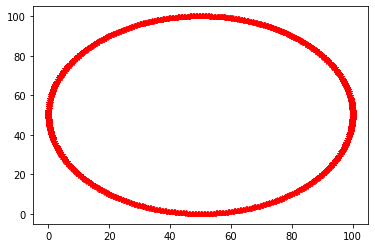

**********************************************************************************

Final parameters:  [4.314788402347205, 4.898007782066145, 0.18622017760292106]

Error:  2.1653916303954686e-25


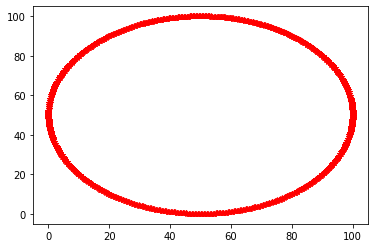

**********************************************************************************

Final parameters:  [4.314788402347205, 5.251923080796192, 0.18622017760292106]

Error:  1.7241343944510434e-25


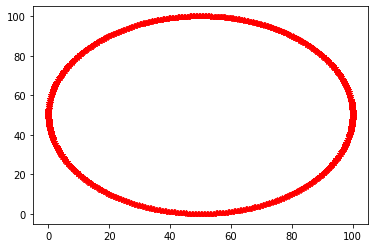

**********************************************************************************

Final parameters:  [4.314788402347205, 5.251923080796192, 0.2730858341136353]

Error:  2.329474698681439e-25


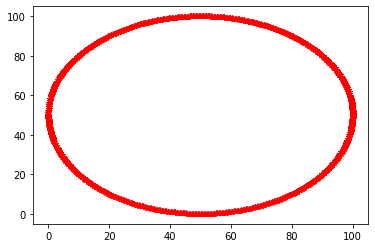

**********************************************************************************

Final parameters:  [4.314788402347205, 5.251923080796192, 0.0993545210922068]

Error:  9.993011258559181e-22


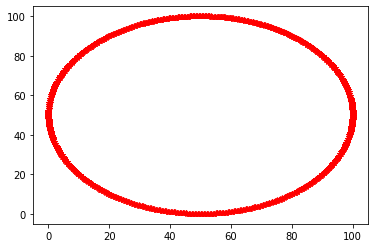

**********************************************************************************

Final parameters:  [4.704095230950257, 5.251923080796192, 0.18622017760292103]

Error:  2.2274907608544666e-25


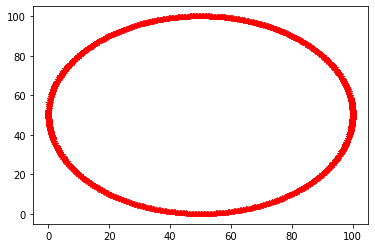

**********************************************************************************

Final parameters:  [3.9254815737441544, 5.251923080796192, 0.18622017760292103]

Error:  1.4802817114291242e-25


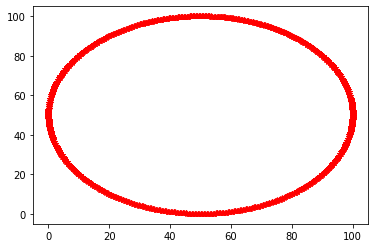

**********************************************************************************

Final parameters:  [3.9254815737441544, 5.641229909399243, 0.18622017760292103]

Error:  1.7059590391947513e-25


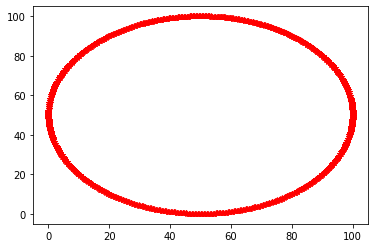

**********************************************************************************

Final parameters:  [3.9254815737441544, 4.86261625219314, 0.18622017760292103]

Error:  1.9361802057744514e-25


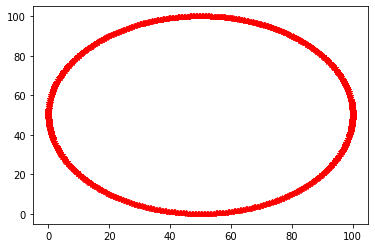

**********************************************************************************

Final parameters:  [3.9254815737441544, 5.251923080796192, 0.26439926846256384]

Error:  1.688793425897142e-25


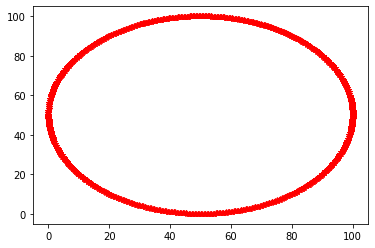

**********************************************************************************

Final parameters:  [3.9254815737441544, 5.251923080796192, 0.1080410867432782]

Error:  2.27747298780927e-25


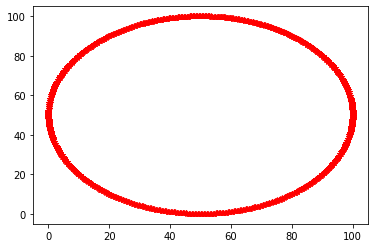

**********************************************************************************

Final parameters:  [4.353719085207511, 5.251923080796192, 0.18622017760292103]

Error:  1.5812559072974137e-25


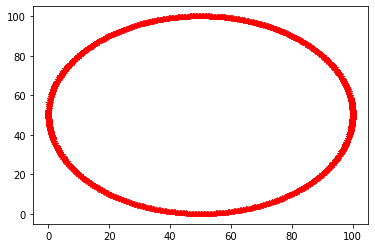

**********************************************************************************

Final parameters:  [3.4972440622807985, 5.251923080796192, 0.18622017760292103]

Error:  1.4636209691108565e-25


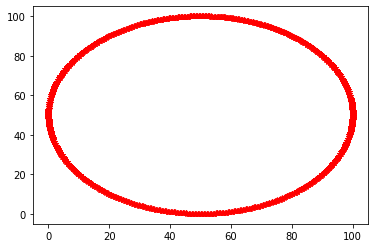

**********************************************************************************

Final parameters:  [3.4972440622807985, 5.602299226538938, 0.18622017760292103]

Error:  1.3419470630895676e-25


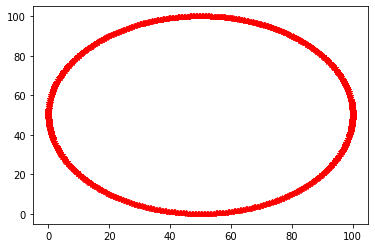

**********************************************************************************

Final parameters:  [3.4972440622807985, 5.602299226538938, 0.2565813593765996]

Error:  1.4565527754000762e-25


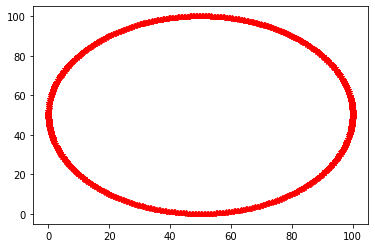

**********************************************************************************

Final parameters:  [3.4972440622807985, 5.602299226538938, 0.1158589958292425]

Error:  1.183417575576353e-25


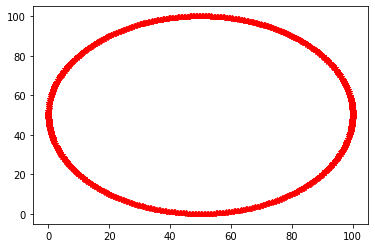

**********************************************************************************

Final parameters:  [3.9683053248904905, 5.602299226538938, 0.1158589958292425]

Error:  1.33235451448208e-25


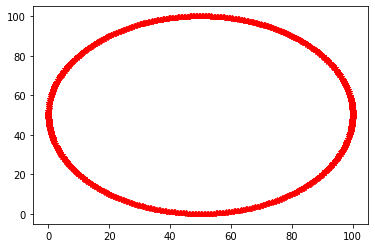

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.602299226538938, 0.1158589958292425]

Error:  9.380502796164096e-26


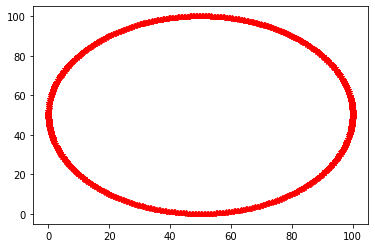

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.987712986855959, 0.1158589958292425]

Error:  1.2086611245434254e-25


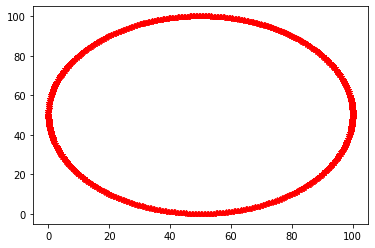

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.216885466221917, 0.1158589958292425]

Error:  1.1869516724317432e-25


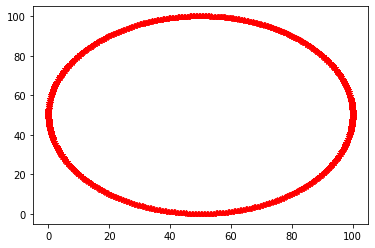

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.602299226538937, 0.1932562957802889]

Error:  1.4434261299371986e-25


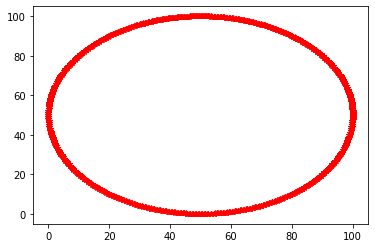

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.602299226538937, 0.03846169587819609]

Error:  4.205644284089168e-12


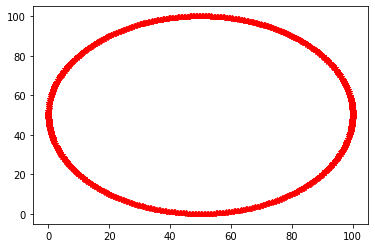

**********************************************************************************

Final parameters:  [3.5443501885417676, 5.602299226538937, 0.1158589958292425]

Error:  1.2147195762955228e-25


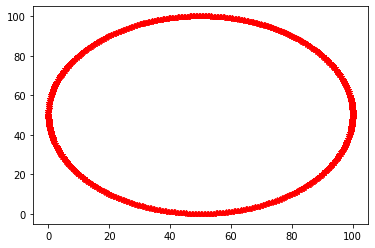

**********************************************************************************

Final parameters:  [2.508015410800445, 5.602299226538937, 0.1158589958292425]

Error:  9.446136023478484e-26


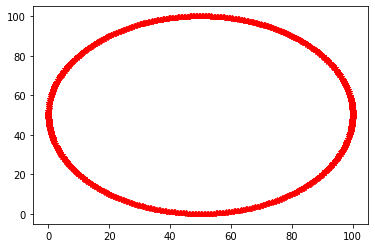

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.949171610824256, 0.1158589958292425]

Error:  8.80999858950826e-26


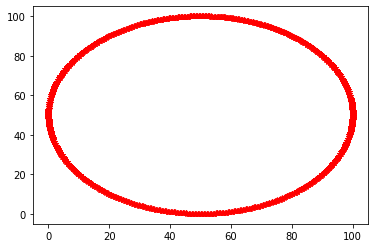

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.949171610824256, 0.18551656578518427]

Error:  1.1097064125925017e-25


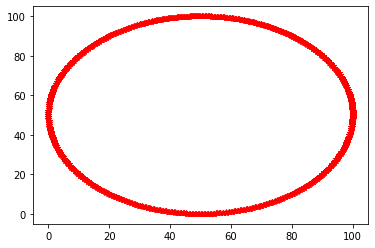

**********************************************************************************

Final parameters:  [3.0261827996711066, 5.949171610824256, 0.04620142587330073]

Error:  1.6919274491215592e-14


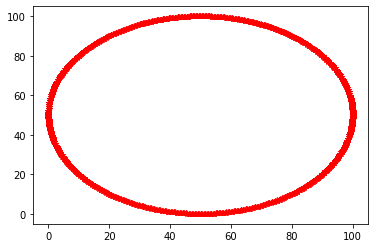

**********************************************************************************

Final parameters:  [3.492533449654702, 5.949171610824256, 0.1158589958292425]

Error:  9.738961191496523e-26


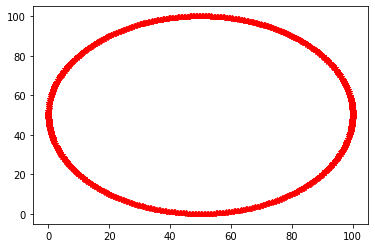

**********************************************************************************

Final parameters:  [2.5598321496875114, 5.949171610824256, 0.1158589958292425]

Error:  7.971912763801457e-26


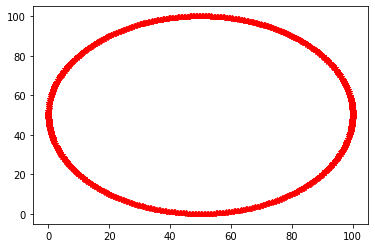

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.330731233538106, 0.1158589958292425]

Error:  8.456588903969247e-26


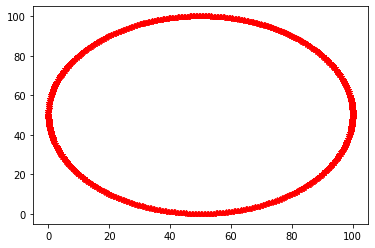

**********************************************************************************

Final parameters:  [2.5598321496875114, 5.5676119881104045, 0.1158589958292425]

Error:  1.0814336377493807e-25


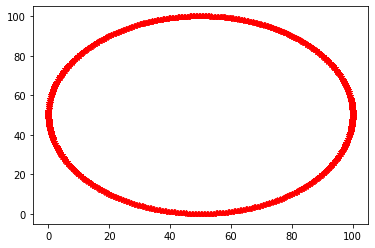

**********************************************************************************

Final parameters:  [2.5598321496875114, 5.949171610824255, 0.1785508087895901]

Error:  9.925763453852859e-26


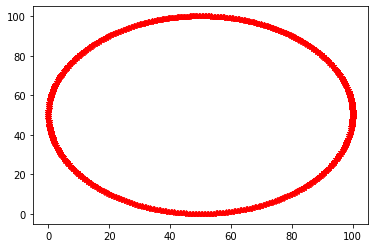

**********************************************************************************

Final parameters:  [2.5598321496875114, 5.949171610824255, 0.05316718286889491]

Error:  1.2788216324183772e-19


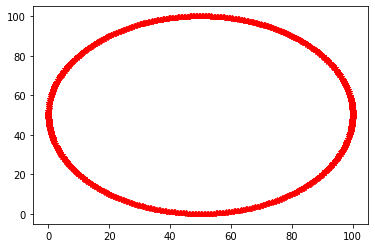

**********************************************************************************

Final parameters:  [3.072817864669466, 5.949171610824255, 0.1158589958292425]

Error:  8.355614708100957e-26


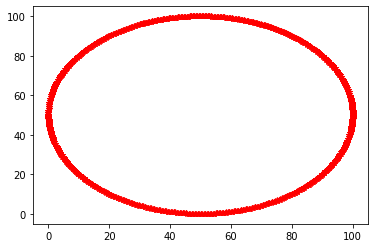

**********************************************************************************

Final parameters:  [2.0468464347055564, 5.949171610824255, 0.1158589958292425]

Error:  9.53196408996653e-26


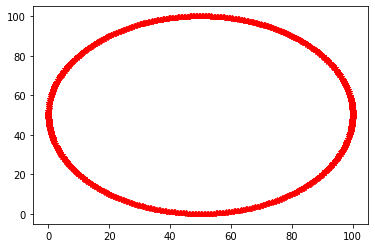

**********************************************************************************

Final parameters:  [2.559832149687511, 6.2925752712667204, 0.1158589958292425]

Error:  7.89618211690024e-26


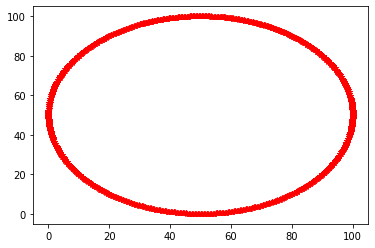

**********************************************************************************

Final parameters:  [2.559832149687511, 6.2925752712667204, 0.17228162749355533]

Error:  7.386262427765378e-26


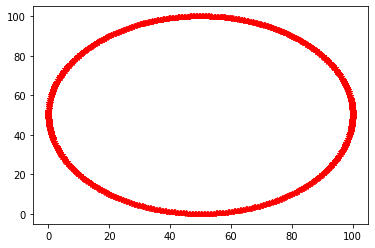

**********************************************************************************

Final parameters:  [3.02151929317127, 6.2925752712667204, 0.17228162749355533]

Error:  9.38555150595751e-26


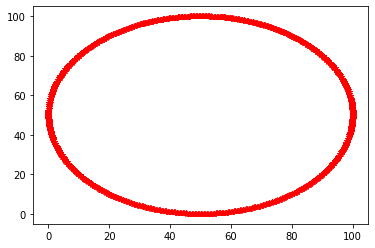

**********************************************************************************

Final parameters:  [2.0981450062037514, 6.2925752712667204, 0.17228162749355533]

Error:  8.163763735951207e-26


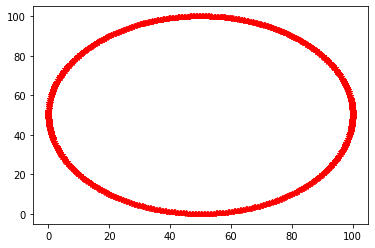

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.670319297753433, 0.17228162749355533]

Error:  8.305127610166812e-26


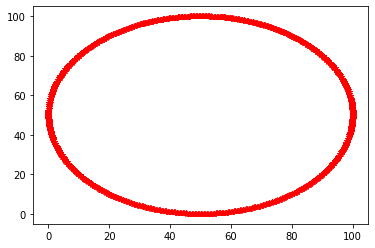

**********************************************************************************

Final parameters:  [2.5598321496875105, 5.914831244780008, 0.17228162749355533]

Error:  9.865178936331885e-26


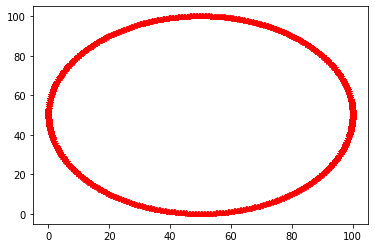

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.2925752712667204, 0.23434652232429945]

Error:  9.708668932736036e-26


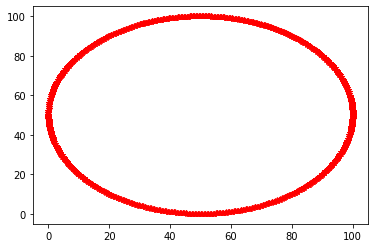

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.2925752712667204, 0.1102167326628112]

Error:  8.936216334343622e-26


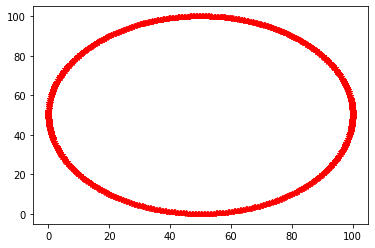

**********************************************************************************

Final parameters:  [2.9753505788228938, 6.2925752712667204, 0.17228162749355533]

Error:  1.0723459601212346e-25


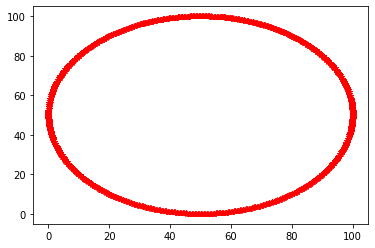

**********************************************************************************

Final parameters:  [2.144313720552127, 6.2925752712667204, 0.17228162749355533]

Error:  8.582806648804608e-26


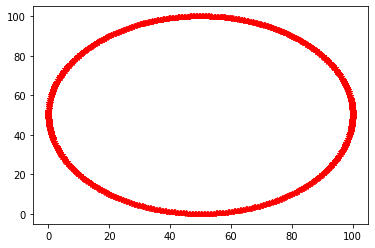

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.632544895104761, 0.17228162749355533]

Error:  9.552158929140188e-26


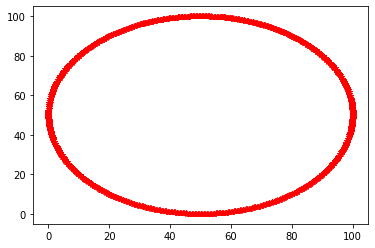

**********************************************************************************

Final parameters:  [2.5598321496875105, 5.952605647428679, 0.17228162749355533]

Error:  9.804594418810912e-26


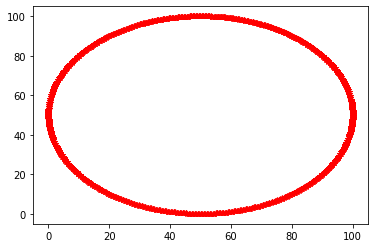

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.2925752712667204, 0.22814003284122503]

Error:  1.0067127328068464e-25


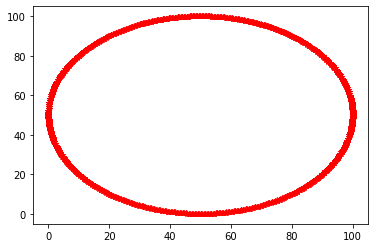

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.2925752712667204, 0.1164232221458856]

Error:  9.476428282238971e-26


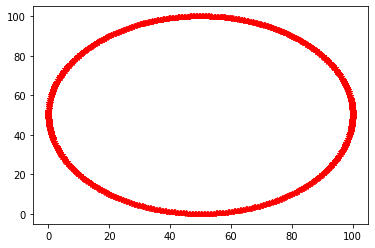

**********************************************************************************

Final parameters:  [2.9337987359093556, 6.2925752712667204, 0.1722816274935553]

Error:  9.875276355918714e-26


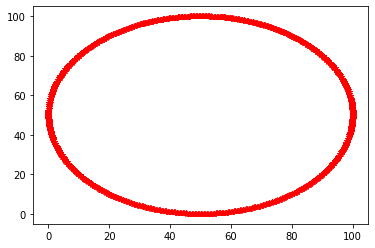

**********************************************************************************

Final parameters:  [2.185865563465666, 6.2925752712667204, 0.1722816274935553]

Error:  8.507076001903391e-26


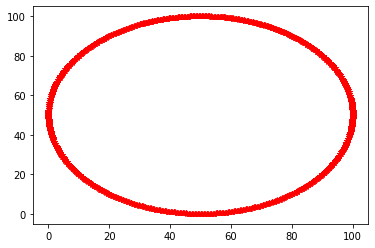

**********************************************************************************

Final parameters:  [2.559832149687511, 6.598547932720957, 0.1722816274935553]

Error:  9.213895372981418e-26


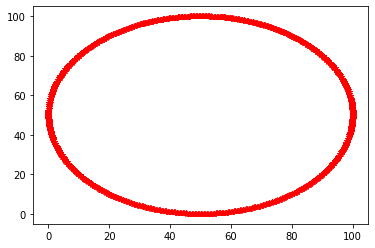

**********************************************************************************

Final parameters:  [2.559832149687511, 5.986602609812483, 0.1722816274935553]

Error:  8.421247935415345e-26


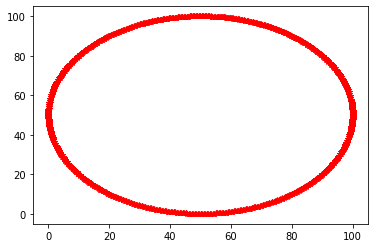

**********************************************************************************

Final parameters:  [2.559832149687511, 6.29257527126672, 0.22255419230645804]

Error:  9.653133125008477e-26


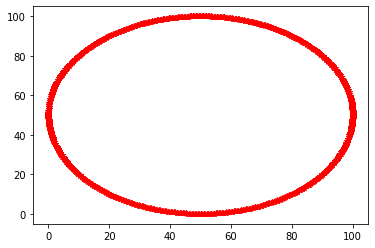

**********************************************************************************

Final parameters:  [2.559832149687511, 6.29257527126672, 0.12200906268065255]

Error:  8.587855358598023e-26


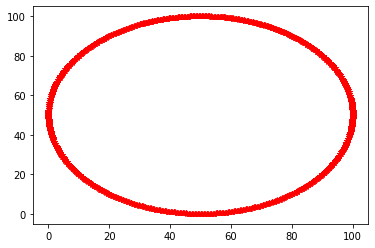

**********************************************************************************

Final parameters:  [2.8964020772871715, 6.29257527126672, 0.1722816274935553]

Error:  1.0127711845589438e-25


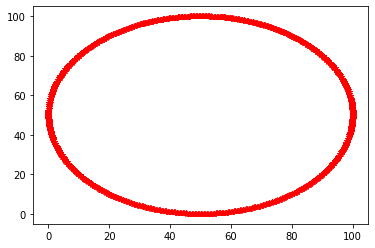

**********************************************************************************

Final parameters:  [2.2232622220878504, 6.29257527126672, 0.1722816274935553]

Error:  9.441087313685069e-26


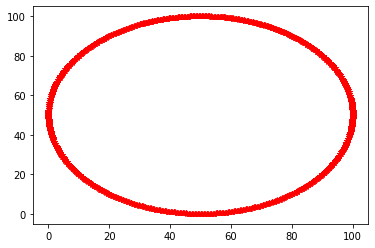

**********************************************************************************

Final parameters:  [2.559832149687511, 6.567950666575533, 0.1722816274935553]

Error:  8.80999858950826e-26


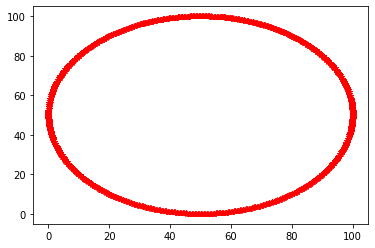

**********************************************************************************

Final parameters:  [2.559832149687511, 6.017199875957907, 0.1722816274935553]

Error:  1.0319562817739188e-25


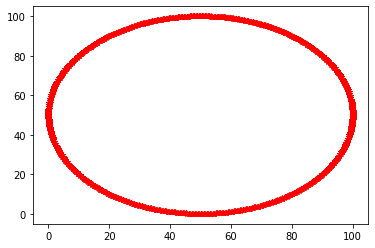

**********************************************************************************

Final parameters:  [2.559832149687511, 6.2925752712667204, 0.21752693582516777]

Error:  1.0198393782697241e-25


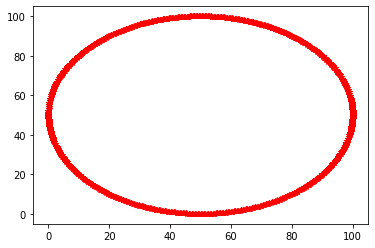

**********************************************************************************

Final parameters:  [2.559832149687511, 6.2925752712667204, 0.12703631916194283]

Error:  9.29467472967605e-26


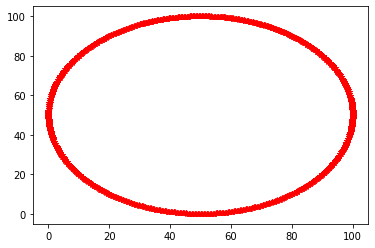

**********************************************************************************

Final parameters:  [2.8627450845272056, 6.2925752712667204, 0.1722816274935553]

Error:  9.324966988436536e-26


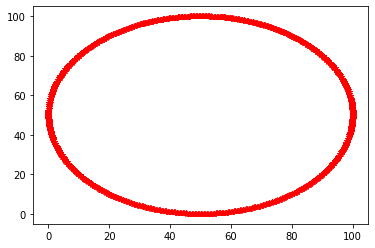

**********************************************************************************

Final parameters:  [2.2569192148478168, 6.2925752712667204, 0.1722816274935553]

Error:  8.719121813226799e-26


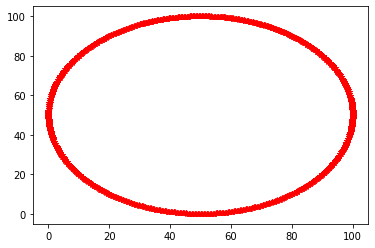

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.540413127044652, 0.1722816274935553]

Error:  7.209557584995871e-26


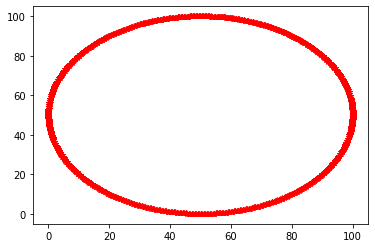

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.540413127044652, 0.2130024049920065]

Error:  8.739316652400457e-26


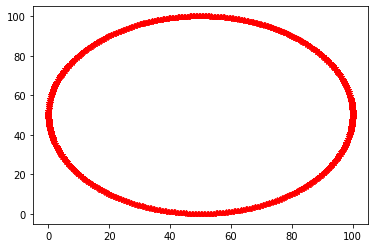

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.540413127044652, 0.13156084999510406]

Error:  8.496978582316562e-26


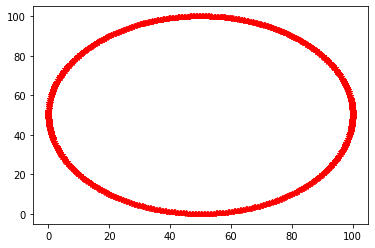

**********************************************************************************

Final parameters:  [2.8324537910432364, 6.540413127044652, 0.1722816274935553]

Error:  1.1354548325389156e-25


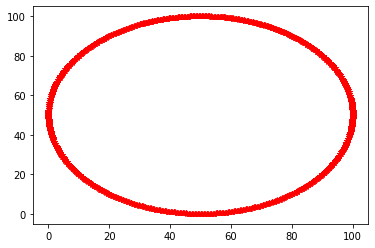

**********************************************************************************

Final parameters:  [2.2872105083317864, 6.540413127044652, 0.1722816274935553]

Error:  7.875987277726582e-26


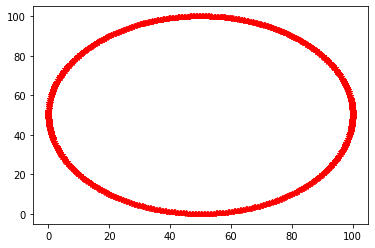

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.813034768400377, 0.1722816274935553]

Error:  8.315225029753641e-26


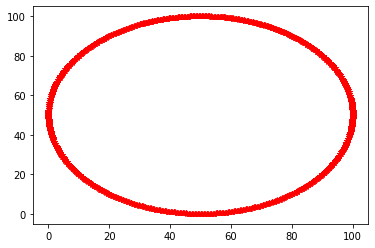

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.267791485688926, 0.1722816274935553]

Error:  8.860485687442405e-26


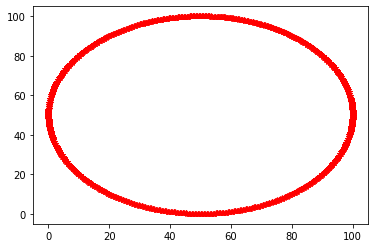

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.540413127044651, 0.2089303272421614]

Error:  8.779706330747773e-26


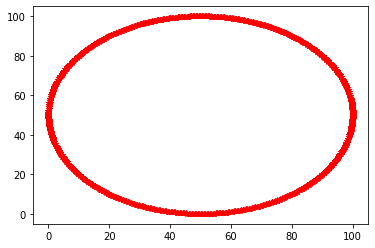

**********************************************************************************

Final parameters:  [2.5598321496875114, 6.540413127044651, 0.1356329277449492]

Error:  8.022399861735602e-26


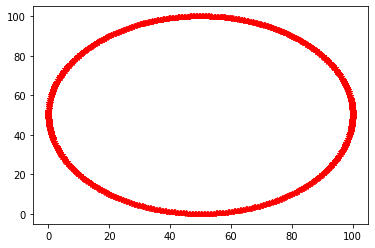

**********************************************************************************

Final parameters:  [2.8051916269076638, 6.540413127044651, 0.1722816274935553]

Error:  9.314869568849707e-26


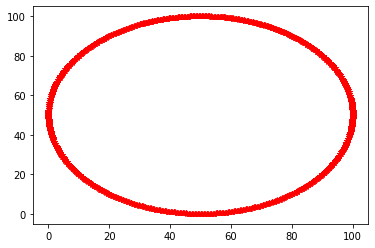

**********************************************************************************

Final parameters:  [2.3144726724673585, 6.540413127044651, 0.1722816274935553]

Error:  8.592904068391437e-26


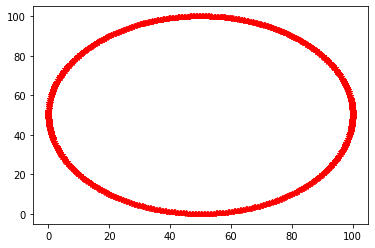

**********************************************************************************

Final parameters:  [2.559832149687511, 6.785772604264804, 0.1722816274935553]

Error:  9.264382470915563e-26


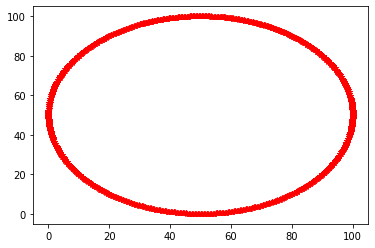

**********************************************************************************

Final parameters:  [2.559832149687511, 6.295053649824498, 0.1722816274935553]

Error:  8.284932770993154e-26


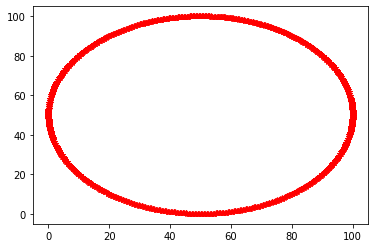

**********************************************************************************

Final parameters:  [2.559832149687511, 6.540413127044651, 0.20526545726730078]

Error:  9.890422485298958e-26


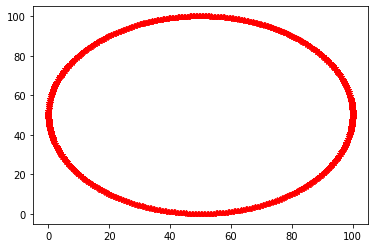

**********************************************************************************

Final parameters:  [2.559832149687511, 6.540413127044651, 0.1392977977198098]

Error:  7.719477274130733e-26


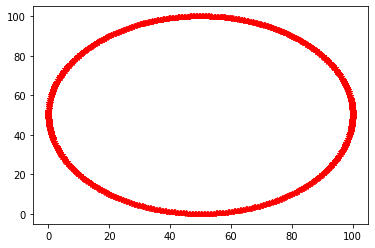

**********************************************************************************

Final parameters:  [2.780655679185648, 6.540413127044651, 0.1722816274935553]

Error:  9.673327964182135e-26


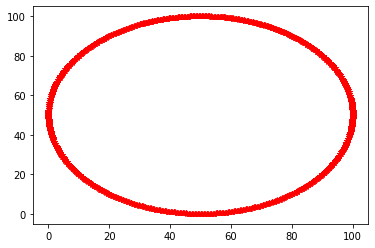

**********************************************************************************

Final parameters:  [2.3390086201893734, 6.540413127044651, 0.1722816274935553]

Error:  8.436394064795589e-26


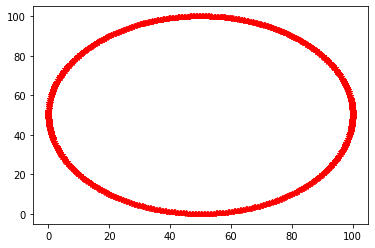

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.761236656542788, 0.1722816274935553]

Error:  8.118325347810477e-26


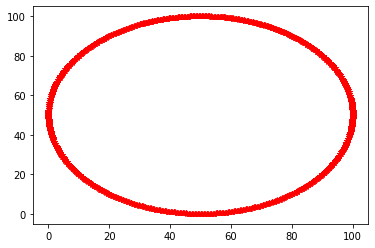

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.319589597546513, 0.1722816274935553]

Error:  9.117969886906543e-26


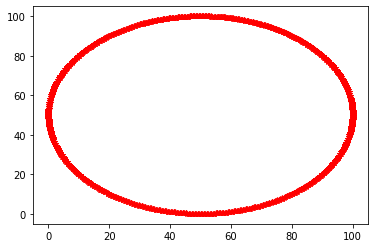

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.54041312704465, 0.20196707428992625]

Error:  1.020849120228407e-25


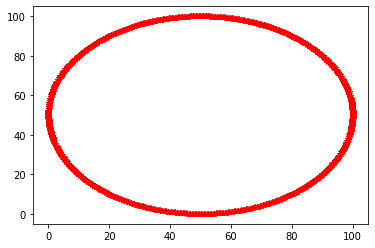

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.54041312704465, 0.14259618069718435]

Error:  9.82478925798457e-26


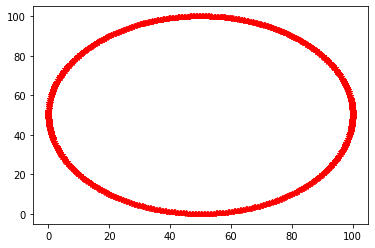

**********************************************************************************

Final parameters:  [2.758573326235834, 6.54041312704465, 0.1722816274935553]

Error:  8.668634715292655e-26


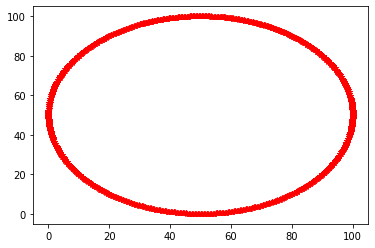

**********************************************************************************

Final parameters:  [2.361090973139187, 6.54041312704465, 0.1722816274935553]

Error:  7.270142102516845e-26


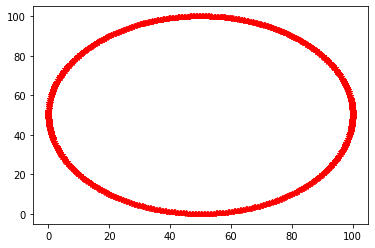

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.739154303592974, 0.1722816274935553]

Error:  8.42629664520876e-26


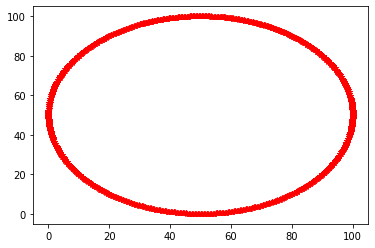

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.341671950496327, 0.1722816274935553]

Error:  8.628245036945339e-26


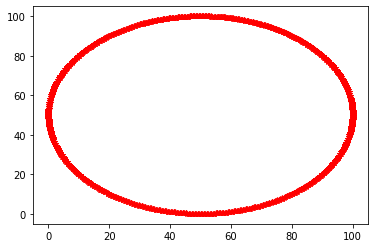

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.54041312704465, 0.19899852961028916]

Error:  8.143568896777549e-26


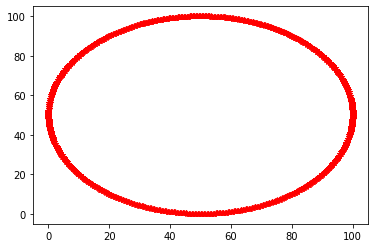

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.54041312704465, 0.14556472537682147]

Error:  8.163763735951207e-26


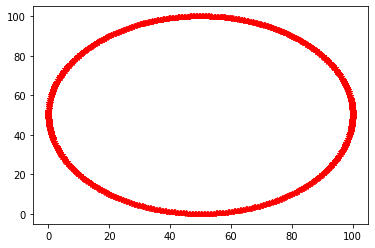

**********************************************************************************

Final parameters:  [2.738699208581002, 6.54041312704465, 0.17228162749355533]

Error:  8.360663417894372e-26


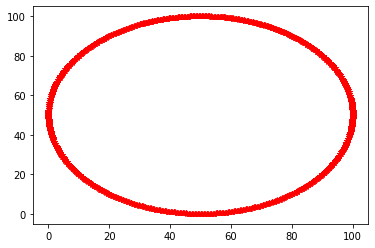

**********************************************************************************

Final parameters:  [2.380965090794019, 6.54041312704465, 0.17228162749355533]

Error:  8.173861155538036e-26


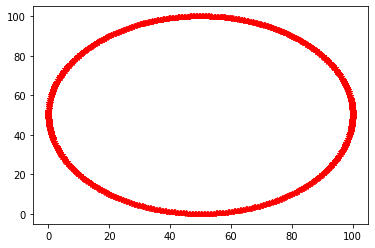

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.719280185938142, 0.17228162749355533]

Error:  9.229041502361661e-26


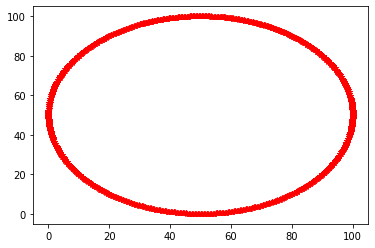

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.361546068151159, 0.17228162749355533]

Error:  8.729219232813628e-26


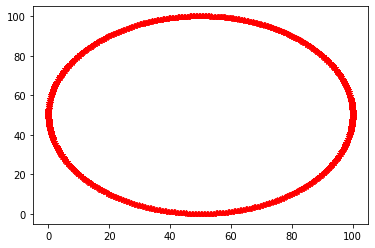

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.54041312704465, 0.19632683939861578]

Error:  9.395648925544339e-26


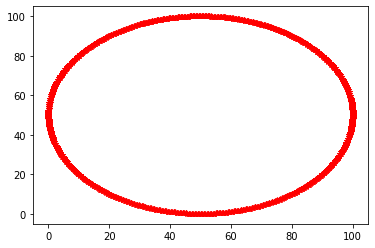

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.54041312704465, 0.14823641558849485]

Error:  9.042239240005326e-26


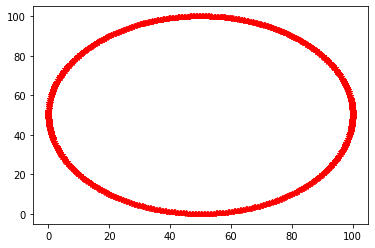

**********************************************************************************

Final parameters:  [2.7208125026916528, 6.54041312704465, 0.1722816274935553]

Error:  9.82478925798457e-26


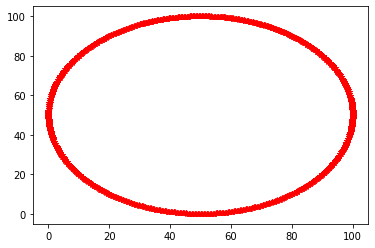

**********************************************************************************

Final parameters:  [2.3988517966833687, 6.54041312704465, 0.1722816274935553]

Error:  7.815402760205608e-26


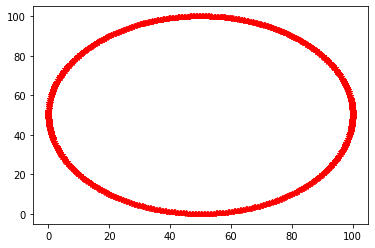

**********************************************************************************

Final parameters:  [2.559832149687511, 6.701393480048792, 0.1722816274935553]

Error:  8.880680526616063e-26


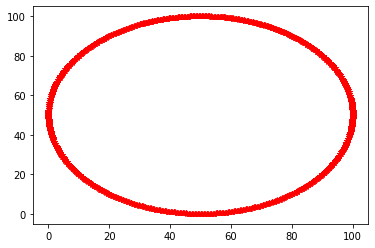

**********************************************************************************

Final parameters:  [2.559832149687511, 6.379432774040508, 0.1722816274935553]

Error:  7.775013081858292e-26


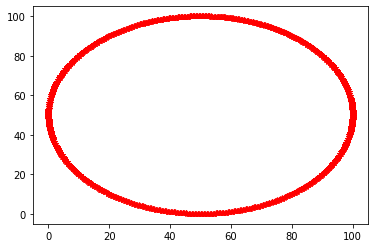

**********************************************************************************

Final parameters:  [2.559832149687511, 6.5404131270446495, 0.19392231820810973]

Error:  9.107872467319714e-26


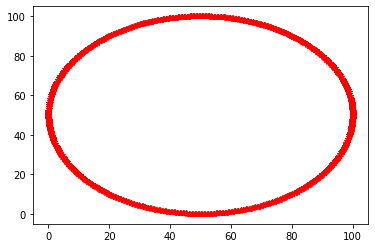

**********************************************************************************

Final parameters:  [2.559832149687511, 6.5404131270446495, 0.1506409367790009]

Error:  1.0385196045053576e-25


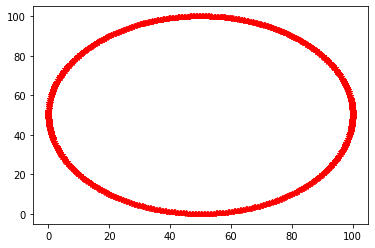

**********************************************************************************

Final parameters:  [2.7047144673912387, 6.5404131270446495, 0.1722816274935553]

Error:  8.693878264259727e-26


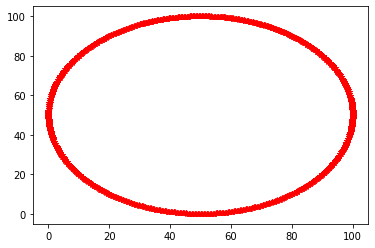

**********************************************************************************

Final parameters:  [2.4149498319837828, 6.5404131270446495, 0.1722816274935553]

Error:  9.425941184304826e-26


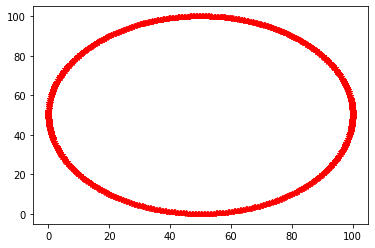

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.685295444748378, 0.1722816274935553]

Error:  9.420892474511411e-26


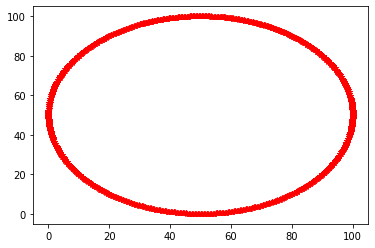

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.395530809340921, 0.1722816274935553]

Error:  8.56261180963095e-26


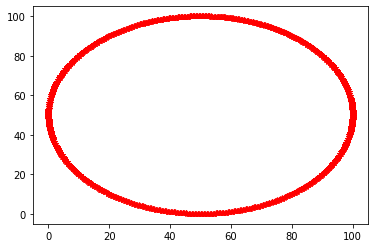

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.5404131270446495, 0.1917582491366543]

Error:  9.274479890502392e-26


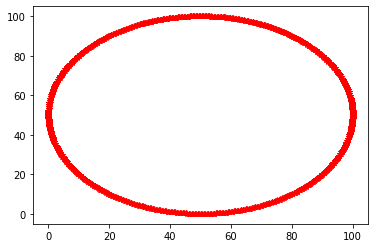

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.5404131270446495, 0.15280500585045634]

Error:  9.072531498765813e-26


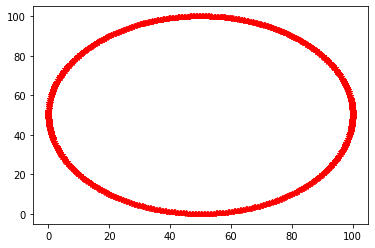

**********************************************************************************

Final parameters:  [2.6902262356208655, 6.5404131270446495, 0.17228162749355533]

Error:  8.567660519424365e-26


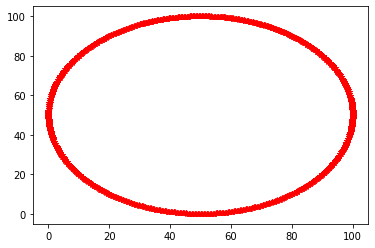

**********************************************************************************

Final parameters:  [2.4294380637541555, 6.5404131270446495, 0.17228162749355533]

Error:  9.900519904885787e-26


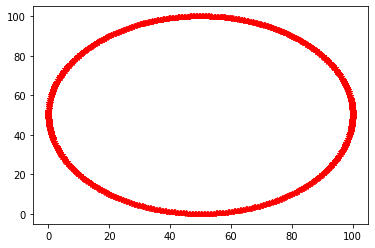

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.670807212978005, 0.17228162749355533]

Error:  1.0072176037861879e-25


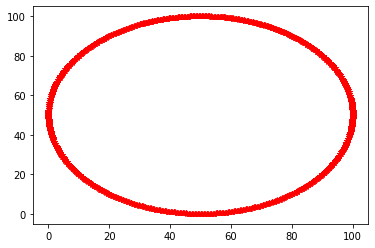

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.410019041111294, 0.17228162749355533]

Error:  9.279528600295806e-26


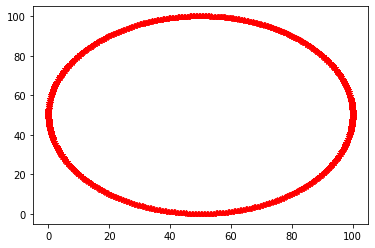

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.5404131270446495, 0.1898105869723444]

Error:  8.173861155538036e-26


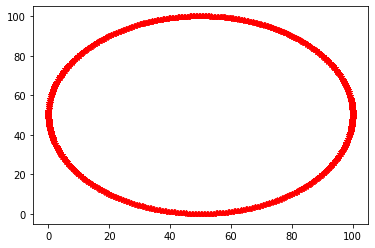

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.5404131270446495, 0.15475266801476623]

Error:  8.284932770993154e-26


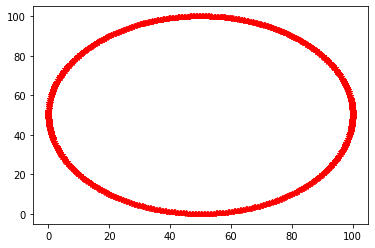

**********************************************************************************

Final parameters:  [2.67718682702753, 6.5404131270446495, 0.1722816274935553]

Error:  7.769964372064878e-26


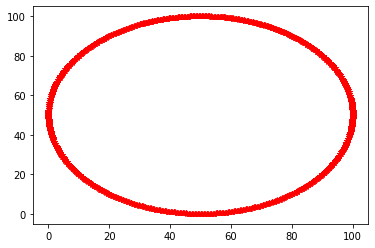

**********************************************************************************

Final parameters:  [2.4424774723474907, 6.5404131270446495, 0.1722816274935553]

Error:  7.881035987519996e-26


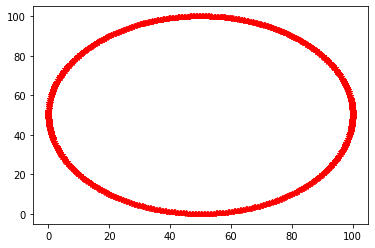

**********************************************************************************

Final parameters:  [2.55983214968751, 6.657767804384669, 0.1722816274935553]

Error:  8.512124711696806e-26


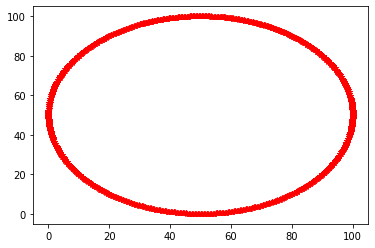

**********************************************************************************

Final parameters:  [2.55983214968751, 6.423058449704629, 0.1722816274935553]

Error:  9.264382470915563e-26


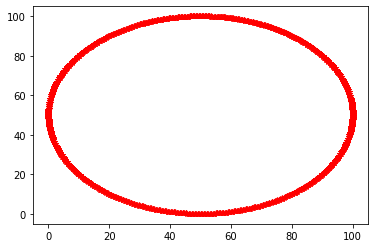

**********************************************************************************

Final parameters:  [2.55983214968751, 6.540413127044649, 0.18805769102446548]

Error:  9.597597317280918e-26


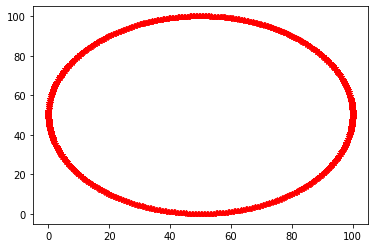

**********************************************************************************

Final parameters:  [2.55983214968751, 6.540413127044649, 0.15650556396264514]

Error:  8.401053096241687e-26


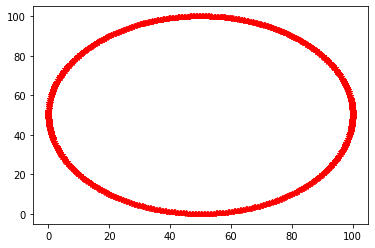

**********************************************************************************

Final parameters:  [2.665451359293528, 6.540413127044649, 0.17228162749355533]

Error:  8.673683425086069e-26


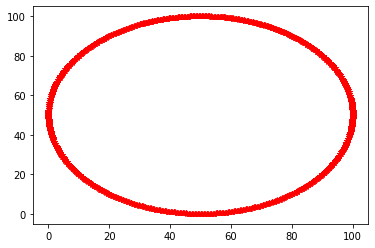

**********************************************************************************

Final parameters:  [2.4542129400814927, 6.540413127044649, 0.17228162749355533]

Error:  7.997156312768529e-26


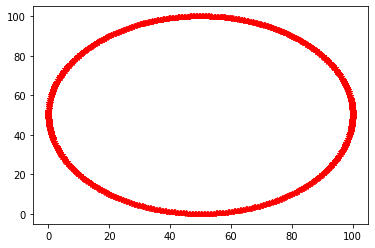

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.646032336650666, 0.17228162749355533]

Error:  8.80999858950826e-26


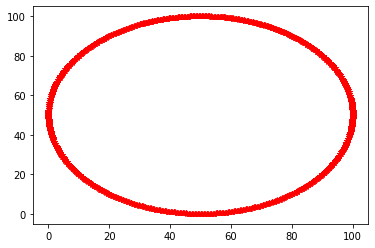

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.434793917438631, 0.17228162749355533]

Error:  9.526915380173115e-26


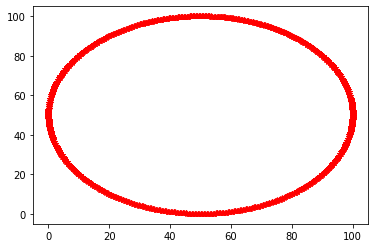

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.540413127044649, 0.18648008467137447]

Error:  8.971557302897523e-26


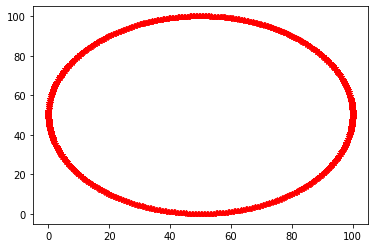

**********************************************************************************

Final parameters:  [2.5598321496875105, 6.540413127044649, 0.15808317031573615]

Error:  8.47173503334949e-26


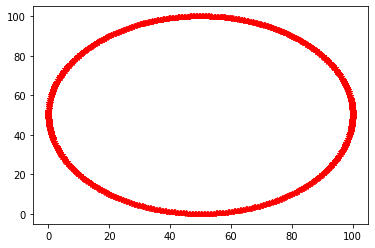

**********************************************************************************

Final parameters:  [2.6548894383329262, 6.540413127044649, 0.1722816274935553]

Error:  9.466330862652142e-26


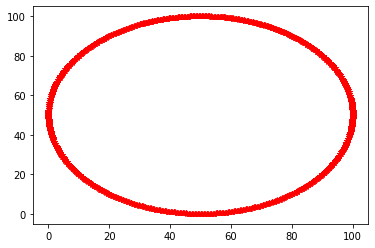

**********************************************************************************

Final parameters:  [2.4647748610420943, 6.540413127044649, 0.1722816274935553]

Error:  1.020849120228407e-25


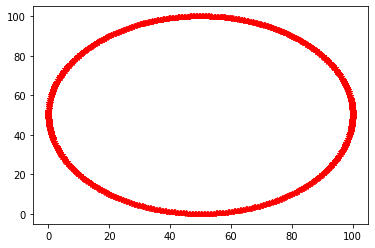

**********************************************************************************

Final parameters:  [2.55983214968751, 6.635470415690064, 0.1722816274935553]

Error:  8.754462781780701e-26


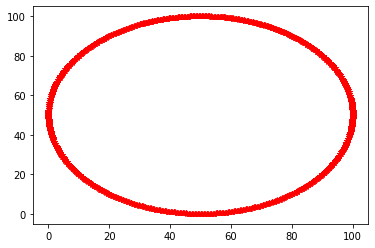

**********************************************************************************

Final parameters:  [2.55983214968751, 6.445355838399232, 0.1722816274935553]

Error:  1.1026382188817215e-25


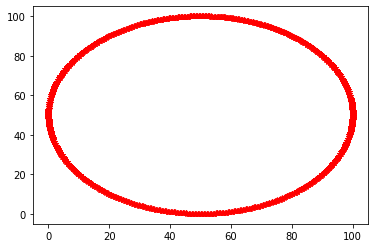

**********************************************************************************

Final parameters:  [2.55983214968751, 6.540413127044648, 0.18506023895359255]

Error:  8.734267942607043e-26


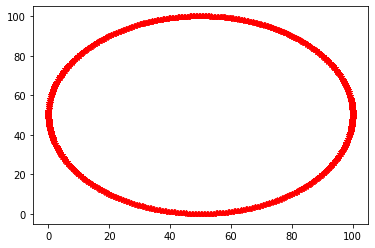

**********************************************************************************

Final parameters:  [2.55983214968751, 6.540413127044648, 0.15950301603351807]

Error:  7.875987277726582e-26
[x=0.00000 y=51.00000 orient=1.57080]
[x=0.00232 y=52.00000 orient=1.56615]
[x=0.01431 y=52.99992 orient=1.55147]
[x=0.04612 y=53.99938 orient=1.52650]
[x=0.10679 y=54.99750 orient=1.49366]
[x=0.20169 y=55.99293 orient=1.45783]
[x=0.33112 y=56.98447 orient=1.42417]
[x=0.49145 y=57.97150 orient=1.39536]
[x=0.67770 y=58.95398 orient=1.37152]
[x=0.88543 y=59.93215 orient=1.35156]
[x=1.11141 y=60.90627 orient=1.33413]
[x=1.35370 y=61.87646 orient=1.31800]
[x=1.61146 y=62.84266 orient=1.30217]
[x=1.88471 y=63.80459 orient=1.28588]
[x=2.17403 y=64.76181 orient=1.26868]
[x=2.48029 y=65.71374 orient=1.25037]
[x=2.80443 y=66.65973 orient=1.23102]
[x=3.14719 y=67.59914 orient=1.21084]
[x=3.50907 y=68.53134 orient=1.19017]
[x=3.89021 y=69.45584 orient=1.16934]
[x=4.29050 y=70.37221 orient=1.14859]
[x=4.7095

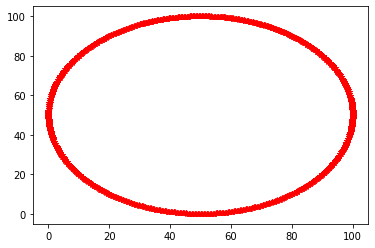

**********************************************************************************

Final parameters:  [2.55983214968751, 6.540413127044648, 0.17228162749355533]

Error:  8.421247935415345e-26


In [ ]:
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#
class robot:
    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
   # modify CTE to a circle with r= 50
    def cte(self, radius):           
         #center = [50, 50] # y, x coordinates of the center of the circle
         center = [radius, radius]
         cte = ((self.x - center[1])**2 + (self.y - center[0])**2)**0.5 - radius
         return cte

# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 1.0 # motion distance is equal to speed (we assume time = 1)
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []
    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error += crosstrack_error
        int_crosstrack_error += crosstrack_error
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)
    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

########twiddle
def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    # PID -> dp [1.0, 1.0, 1.0]
    dp = [1.0, 1.0, 1.0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

    
## changed r to 50
radius = 50.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,True)

#### Diskussion
**PID** 
Final parameters:  [2.55983214968751, 6.540413127044648, 0.17228162749355533]

Error:  8.421247935415345e-26

and diagram of the last N steps can be found above

## Task 2

The car speed is set to 1.0 in the original program. Setting a higher speed may cause the car to
lose control, as shown in the following visualization of the actual trajectory for speed of 10.0,
obtained with plt.plot() (you may or may not get the exact same result)

To keep control, one can either increase track length by increasing circle radius, or reduce timestep
size dt (increase sampling rate). Let’s take the latter approach. (Refer to L6 Control, p. 34 “For
General 𝑑𝑡” for how to add the variable 𝑑𝑡.) Tune a PID controller with twiddle() for speed=10.0. Try
different timestep sizes dt until you achieve low tracking error. (A good heuristic is to reduce dt
proportional to the increasing speed, to keep the distance traveled in each timestep constant.)

(The total number of simulation timesteps is 2N. We compute the average error and record the
trajectory for the last N timesteps, in order to skip initial transient dynamics in the first N timesteps
and focus on the steady state performance. We suggest setting N=1000 to traverse the track multiple
cycles.)

#### dt = 1

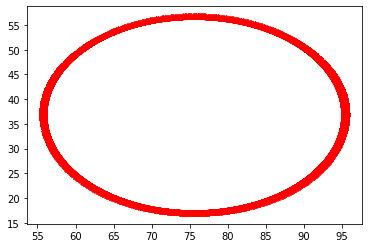

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  487927.8676378622


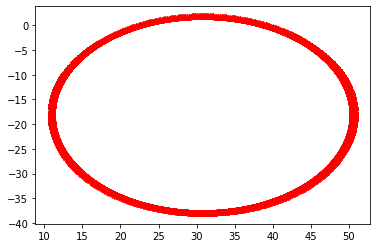

**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  688215.5350304324


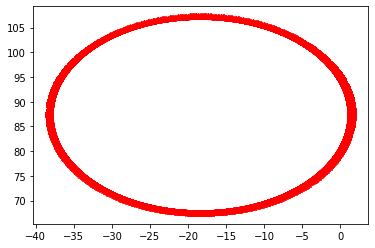

**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  1050255.0988172337


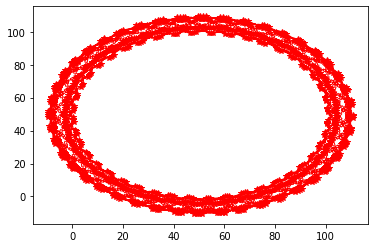

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  44460.78999717269


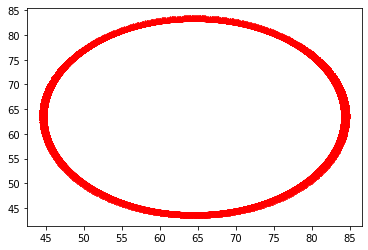

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 1.0]

Error:  755543.9875255255


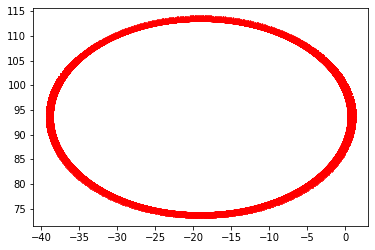

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, -1.0]

Error:  1279829.0364990185


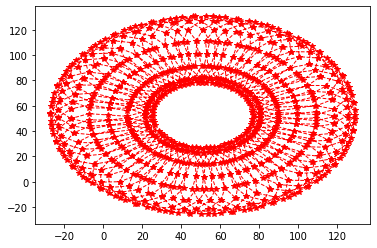

**********************************************************************************

Final parameters:  [1.7999999999999998, 1.0, 0.0]

Error:  350664.31469247537


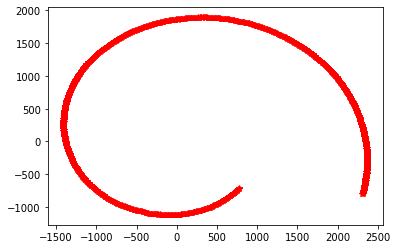

**********************************************************************************

Final parameters:  [-2.220446049250313e-16, 1.0, 0.0]

Error:  2947763656.2102866


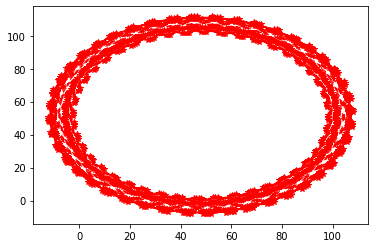

**********************************************************************************

Final parameters:  [0.8999999999999998, 2.1, 0.0]

Error:  48110.290841349764


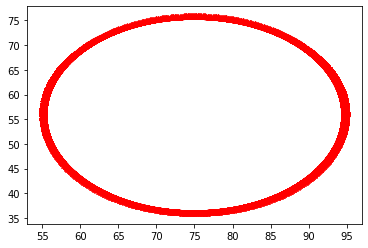

**********************************************************************************

Final parameters:  [0.8999999999999998, -0.10000000000000009, 0.0]

Error:  584356.7786871153


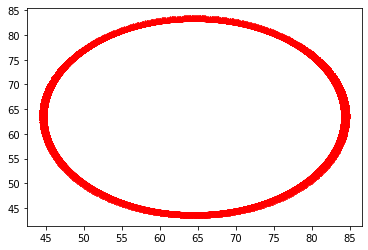

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.0, 0.9]

Error:  755543.9875255255


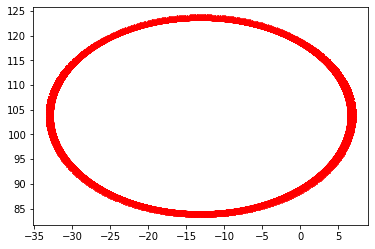

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.0, -0.9]

Error:  1363808.5050535237


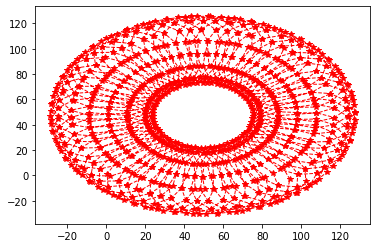

**********************************************************************************

Final parameters:  [1.71, 1.0, 0.0]

Error:  348095.7668440786


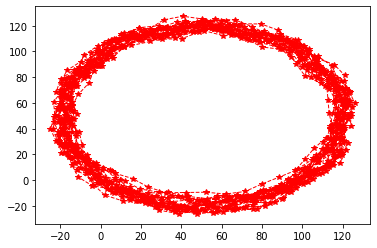

**********************************************************************************

Final parameters:  [0.08999999999999986, 1.0, 0.0]

Error:  389833.12300374627


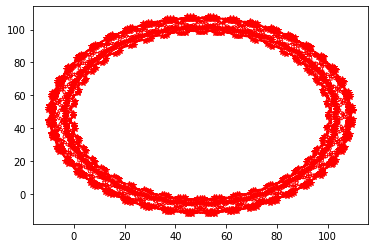

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.9900000000000002, 0.0]

Error:  46323.930772328575


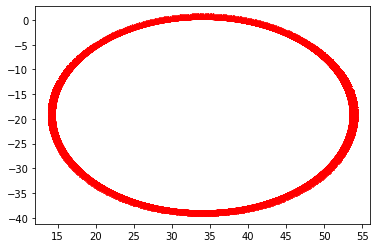

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.010000000000000009, 0.0]

Error:  698106.1680436399


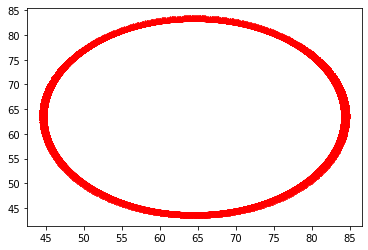

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.81]

Error:  755543.9875255255


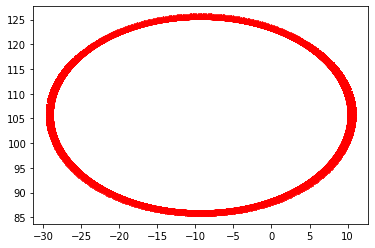

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, -0.81]

Error:  1263667.284597851


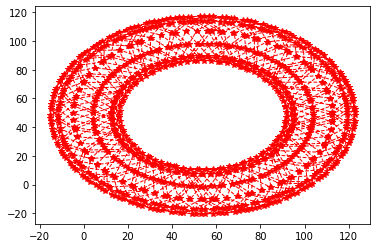

**********************************************************************************

Final parameters:  [1.629, 1.0, 0.0]

Error:  159494.43943174422


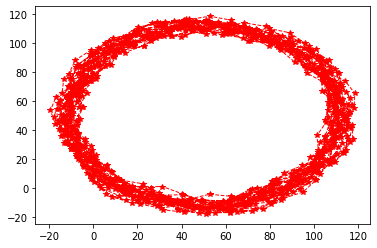

**********************************************************************************

Final parameters:  [0.17099999999999982, 1.0, 0.0]

Error:  149701.64361428336


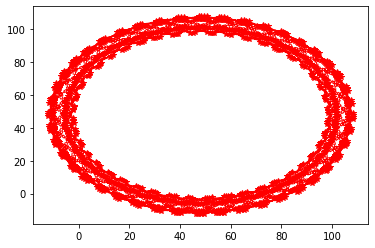

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.891, 0.0]

Error:  49287.73332294075


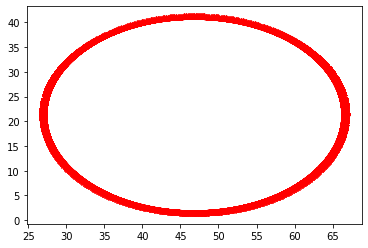

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.10899999999999976, 0.0]

Error:  485229.14216847875


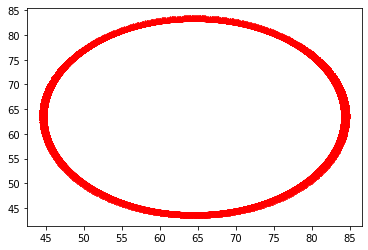

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.7290000000000001]

Error:  755543.9875255255


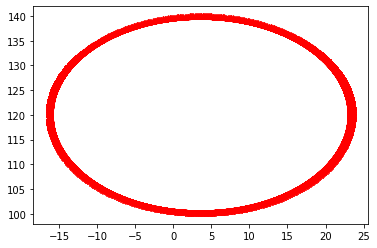

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, -0.7290000000000001]

Error:  1437052.6242877706


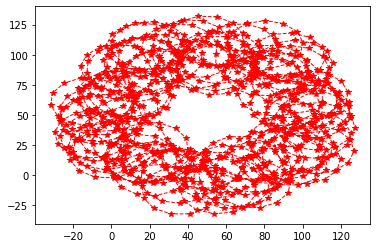

**********************************************************************************

Final parameters:  [1.5561, 0.9999999999999999, 0.0]

Error:  256455.08336777074


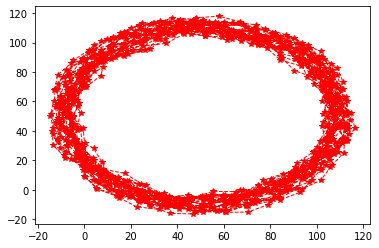

**********************************************************************************

Final parameters:  [0.24389999999999978, 0.9999999999999999, 0.0]

Error:  104537.54819671533


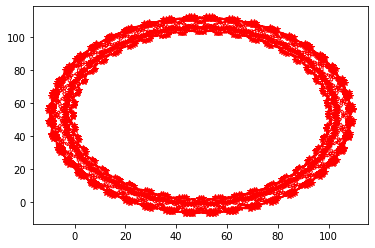

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.8019, 0.0]

Error:  48357.8687832061


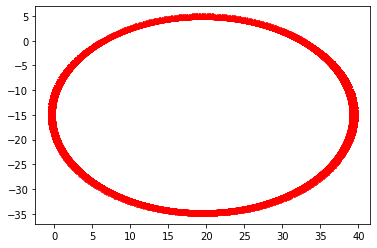

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.19809999999999972, 0.0]

Error:  732983.0753414793


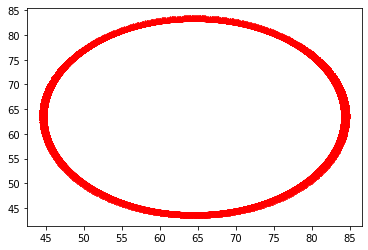

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.6561000000000001]

Error:  755543.9875255255


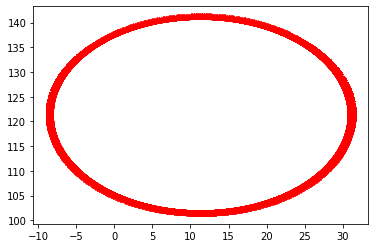

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, -0.6561000000000001]

Error:  1245366.6712465228


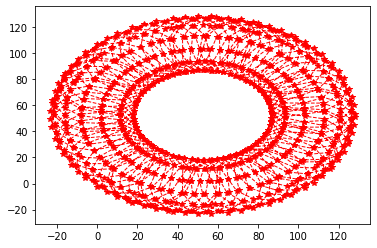

**********************************************************************************

Final parameters:  [1.49049, 0.9999999999999999, 0.0]

Error:  265289.74716933316


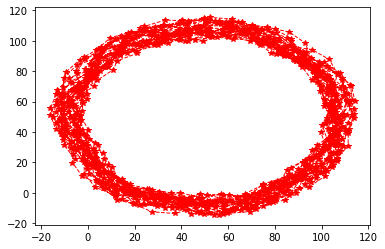

**********************************************************************************

Final parameters:  [0.30950999999999973, 0.9999999999999999, 0.0]

Error:  79147.09194934803


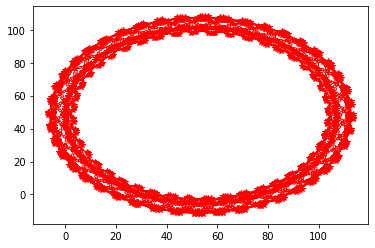

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.72171, 0.0]

Error:  52360.232664761184


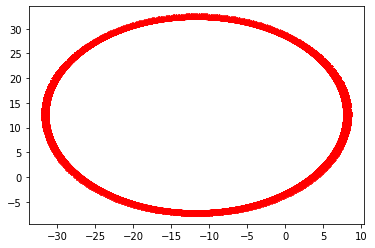

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.2782899999999997, 0.0]

Error:  752428.8902930155


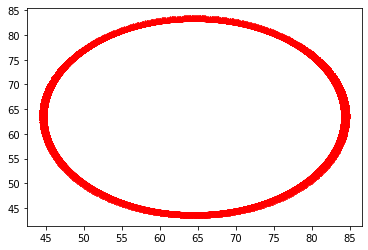

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.5904900000000002]

Error:  755543.9875255255


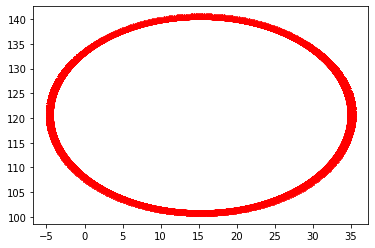

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, -0.5904900000000002]

Error:  1096684.3150964086


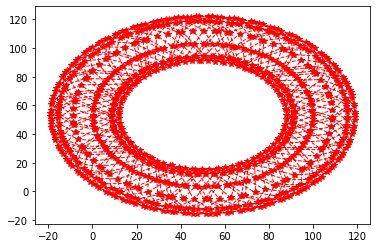

**********************************************************************************

Final parameters:  [1.431441, 0.9999999999999999, 0.0]

Error:  155704.25829714653


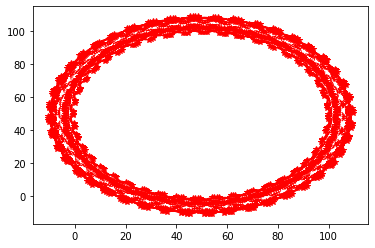

**********************************************************************************

Final parameters:  [0.36855899999999964, 0.9999999999999999, 0.0]

Error:  44482.536814325125


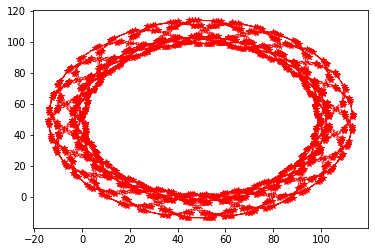

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.649539, 0.0]

Error:  53522.84008486256


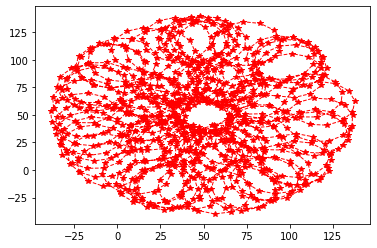

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.3504609999999997, 0.0]

Error:  567853.7826819778


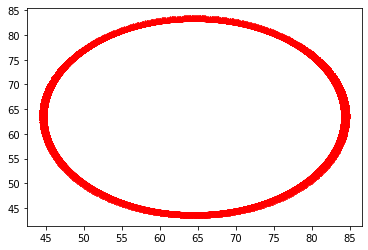

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999999, 0.5314410000000002]

Error:  755543.9875255255


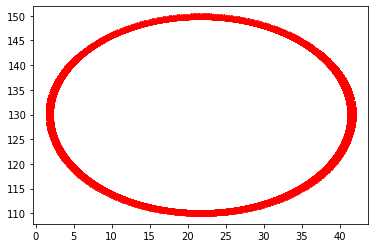

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999999, -0.5314410000000002]

Error:  1489797.153753808


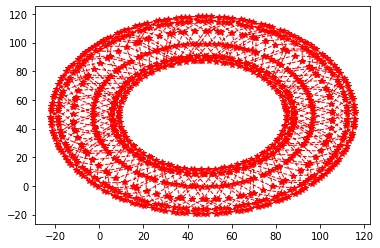

**********************************************************************************

Final parameters:  [1.3782969, 0.9999999999999999, 0.0]

Error:  155256.33721545018


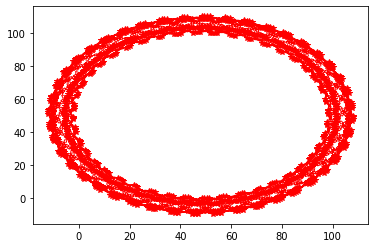

**********************************************************************************

Final parameters:  [0.4217030999999998, 0.9999999999999999, 0.0]

Error:  46535.540901113294


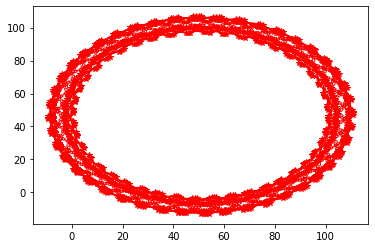

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.5845851, 0.0]

Error:  49867.89906342378


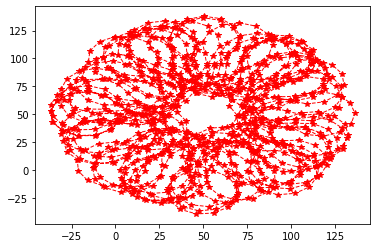

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.4154148999999996, 0.0]

Error:  457890.1660251434


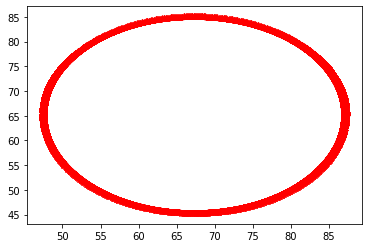

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999998, 0.47829690000000014]

Error:  664367.4635050497


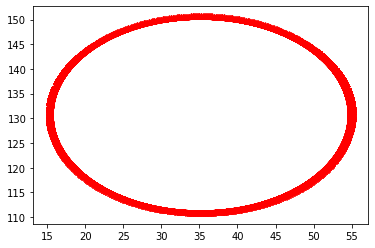

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999998, -0.47829690000000014]

Error:  1300656.6957728486


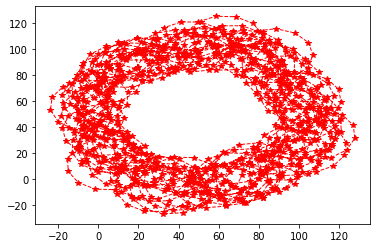

**********************************************************************************

Final parameters:  [1.3304672100000001, 0.9999999999999998, 0.0]

Error:  135625.6496996194


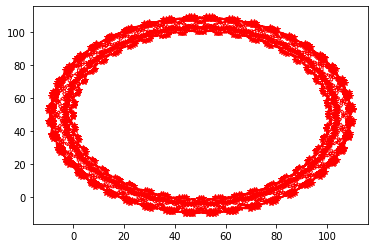

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.9999999999999998, 0.0]

Error:  44030.5053259566


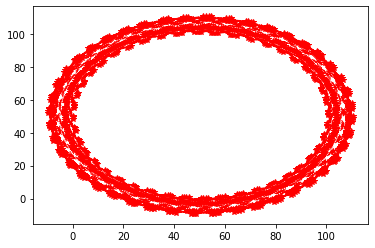

**********************************************************************************

Final parameters:  [0.4695327899999998, 1.52612659, 0.0]

Error:  44415.25344470301


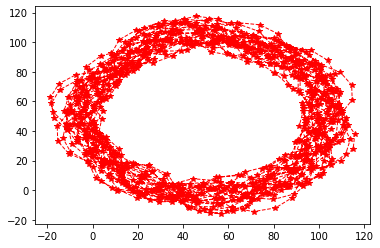

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.4738734099999997, 0.0]

Error:  52856.93881483943


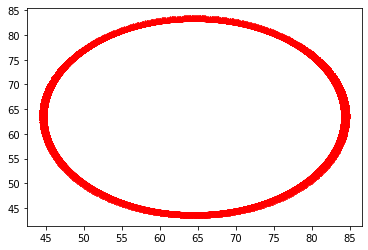

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.9999999999999999, 0.43046721000000016]

Error:  755543.9875255255


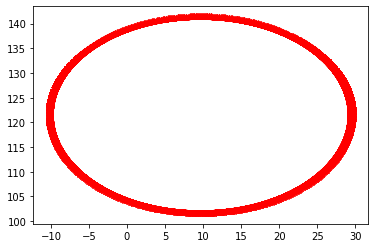

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.9999999999999999, -0.43046721000000016]

Error:  1308500.7052484911


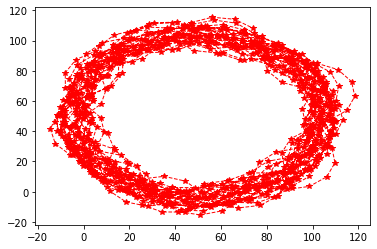

**********************************************************************************

Final parameters:  [0.943046721, 0.9999999999999999, 0.0]

Error:  45972.133964995155


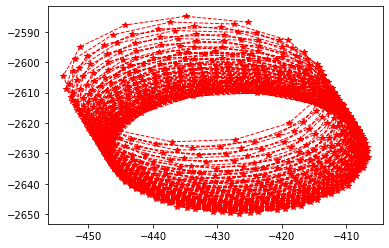

**********************************************************************************

Final parameters:  [-0.0039811410000004654, 0.9999999999999999, 0.0]

Error:  7103015405.3988495


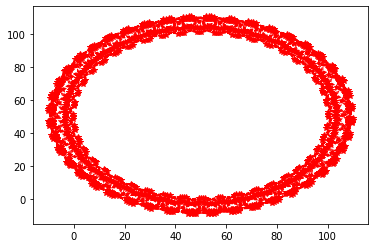

**********************************************************************************

Final parameters:  [0.46953278999999976, 1.473513931, 0.0]

Error:  44252.44138134958


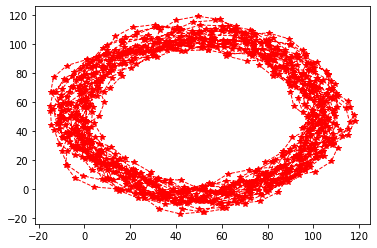

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5264860689999997, 0.0]

Error:  50265.480911089995


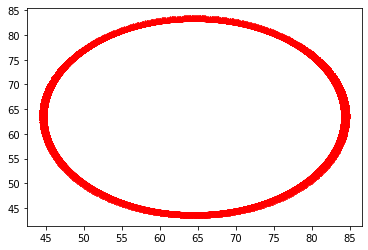

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.9999999999999999, 0.38742048900000015]

Error:  755543.9875255255


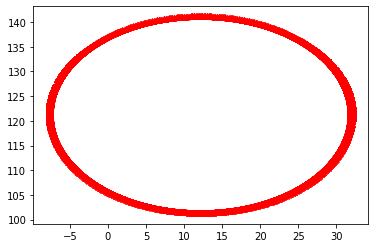

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.9999999999999999, -0.38742048900000015]

Error:  1213163.9852184237


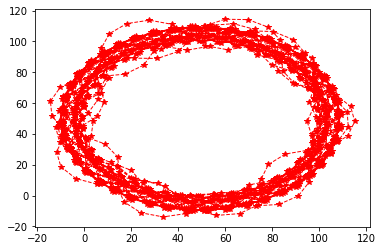

**********************************************************************************

Final parameters:  [0.8956953279, 0.9999999999999999, 0.0]

Error:  47256.69408395509


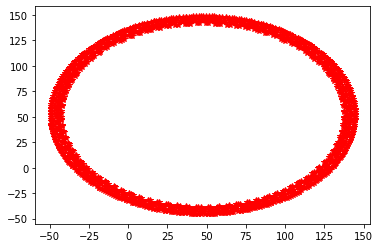

**********************************************************************************

Final parameters:  [0.04337025209999956, 0.9999999999999999, 0.0]

Error:  1960324.659716271


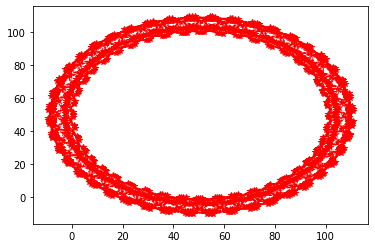

**********************************************************************************

Final parameters:  [0.46953278999999976, 1.4261625379, 0.0]

Error:  44376.974839967006


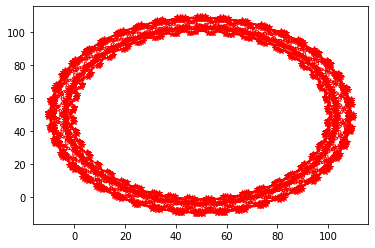

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, 0.0]

Error:  44007.05675360399


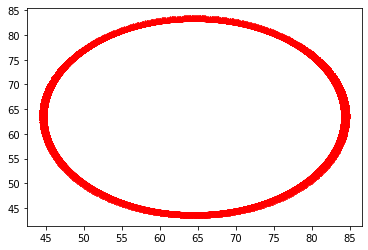

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, 0.34867844010000015]

Error:  755543.9875255255


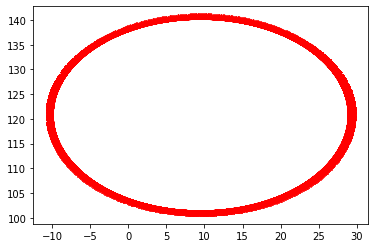

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, -0.34867844010000015]

Error:  1274138.883005818


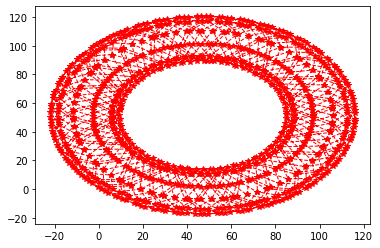

**********************************************************************************

Final parameters:  [0.85307907411, 0.5738374620999998, 0.0]

Error:  156491.07956012362


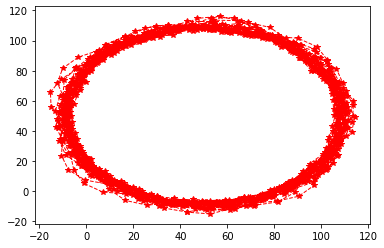

**********************************************************************************

Final parameters:  [0.08598650588999956, 0.5738374620999998, 0.0]

Error:  93909.6459653202


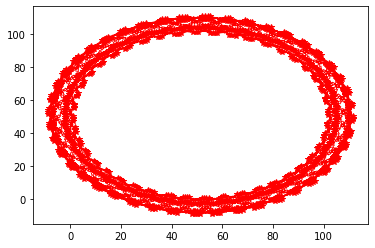

**********************************************************************************

Final parameters:  [0.46953278999999976, 1.04261625379, 0.0]

Error:  45553.83199455626


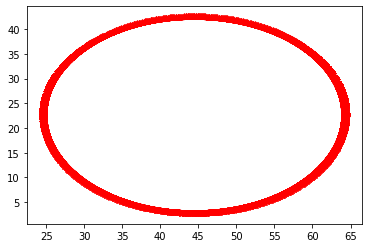

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.1050586704099995, 0.0]

Error:  516295.60251192516


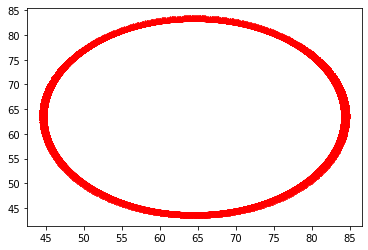

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, 0.31381059609000017]

Error:  755543.9875255255


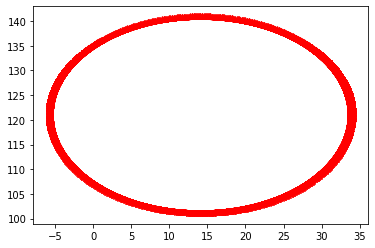

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, -0.31381059609000017]

Error:  1147495.5892296438


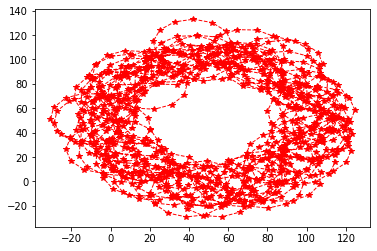

**********************************************************************************

Final parameters:  [0.8147244456989999, 0.5738374620999998, 0.0]

Error:  161868.3549119024


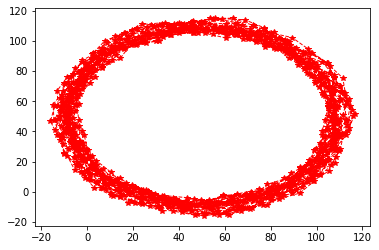

**********************************************************************************

Final parameters:  [0.12434113430099958, 0.5738374620999998, 0.0]

Error:  97761.6436172866


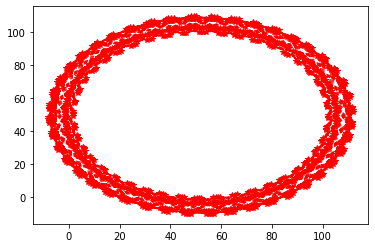

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.995738374621, 0.0]

Error:  45982.51891379704


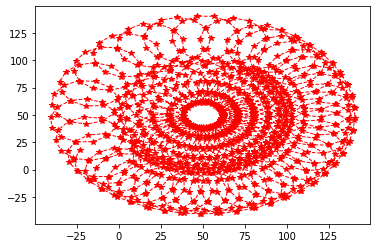

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.1519365495789996, 0.0]

Error:  603629.1008413023


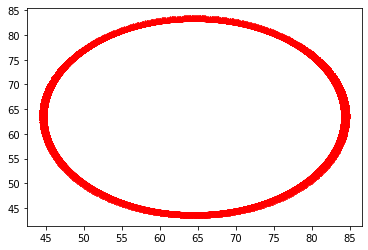

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, 0.28242953648100017]

Error:  755543.9875255255


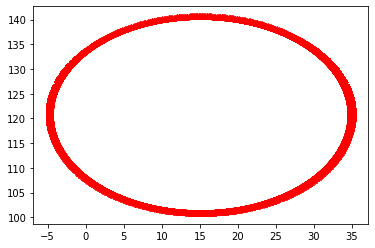

**********************************************************************************

Final parameters:  [0.46953278999999976, 0.5738374620999998, -0.28242953648100017]

Error:  1106177.7733197873


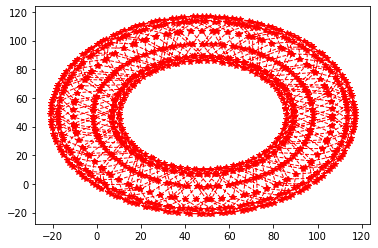

**********************************************************************************

Final parameters:  [0.7802052801291, 0.5738374620999998, 0.0]

Error:  154219.17538256678


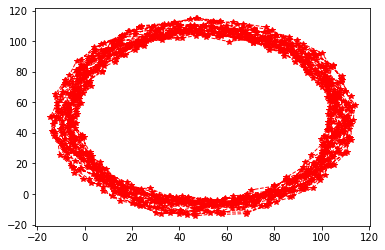

**********************************************************************************

Final parameters:  [0.15886029987089967, 0.5738374620999998, 0.0]

Error:  78249.8943459731


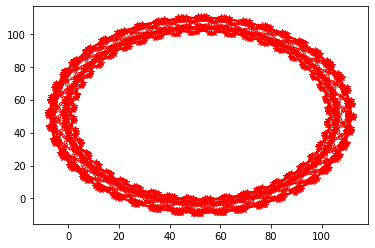

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.9535482833689, 0.0]

Error:  46726.69537740449


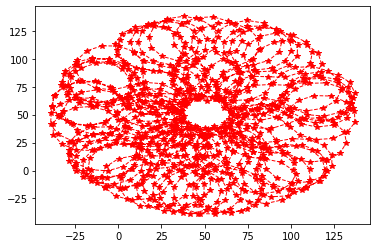

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.19412664083109954, 0.0]

Error:  566326.5000008283


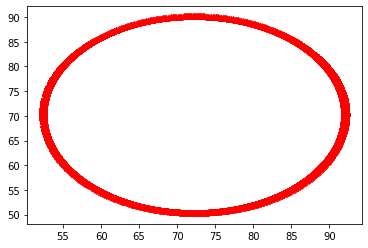

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.5738374620999998, 0.25418658283290013]

Error:  453403.7430086531


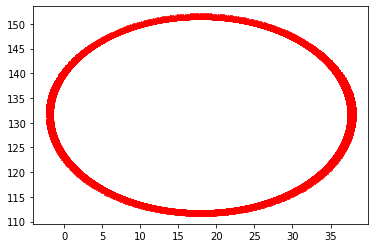

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.5738374620999998, -0.25418658283290013]

Error:  1702118.3670773406


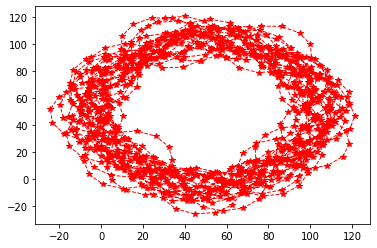

**********************************************************************************

Final parameters:  [0.7491380311161899, 0.5738374620999998, 0.0]

Error:  85091.77128934956


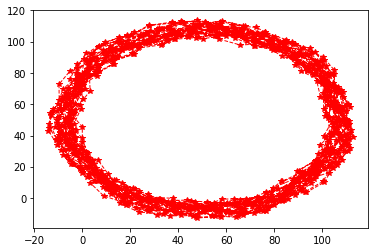

**********************************************************************************

Final parameters:  [0.1899275488838097, 0.5738374620999998, 0.0]

Error:  67108.8329708359


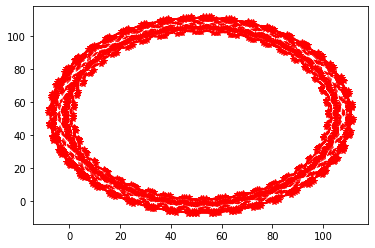

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.91557720124201, 0.0]

Error:  47818.59593354809


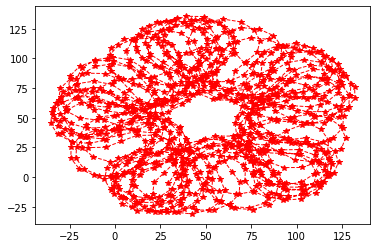

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.23209772295798958, 0.0]

Error:  410325.3746089778


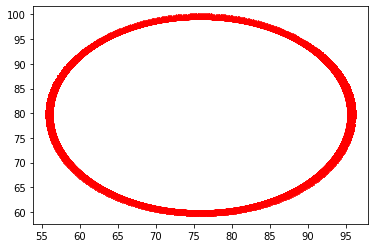

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.5738374620999998, 0.22876792454961012]

Error:  254835.10353662045


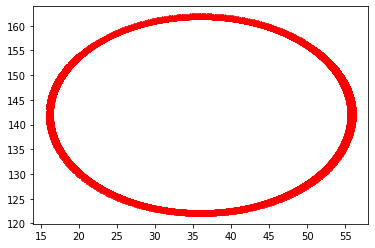

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.5738374620999998, -0.22876792454961012]

Error:  2135696.355239505


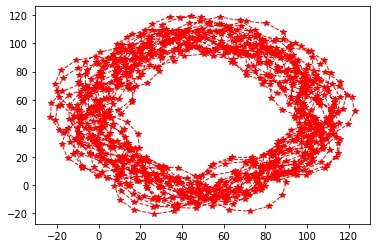

**********************************************************************************

Final parameters:  [0.721177507004571, 0.5738374620999998, 0.0]

Error:  85265.1492973168


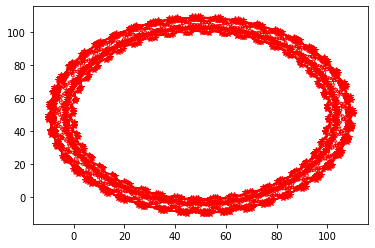

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.5738374620999998, 0.0]

Error:  43982.664173727724


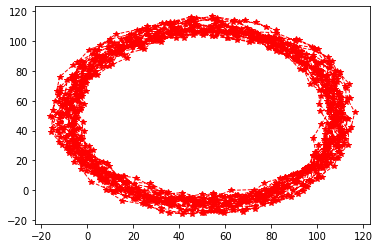

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.881403227327809, 0.0]

Error:  97500.58844713453


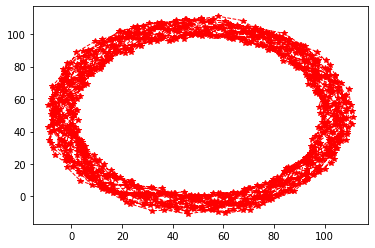

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, 0.0]

Error:  31613.124513257244


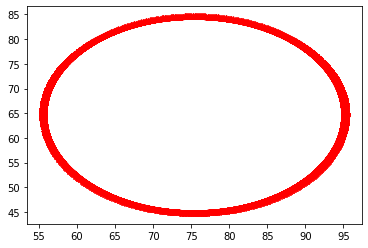

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, 0.2058911320946491]

Error:  472614.82786160626


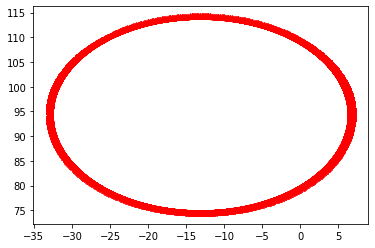

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, -0.2058911320946491]

Error:  1005452.352042852


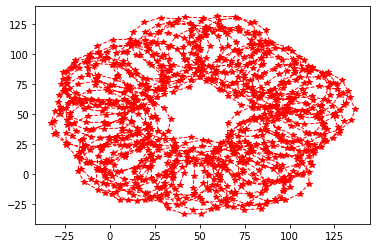

**********************************************************************************

Final parameters:  [0.49469726170045697, 0.26627169687219054, 0.0]

Error:  320445.83759671805


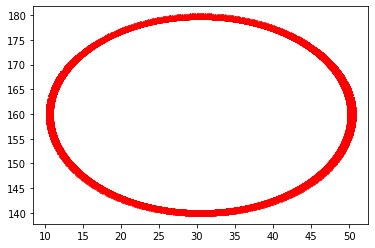

**********************************************************************************

Final parameters:  [-0.058921115709599625, 0.26627169687219054, 0.0]

Error:  4082099.4777557575


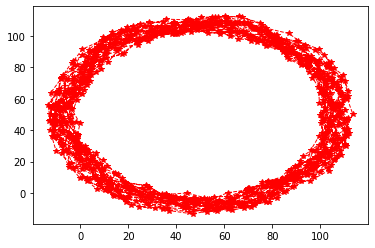

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.6045940386227807, 0.0]

Error:  63738.46907890984


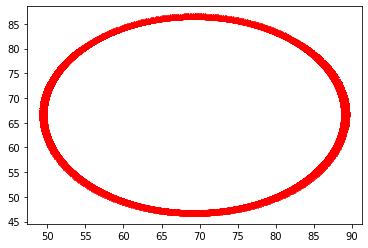

**********************************************************************************

Final parameters:  [0.21788807299542867, -0.07205064487839963, 0.0]

Error:  593469.6087892506


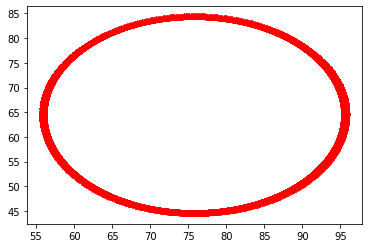

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, 0.1853020188851842]

Error:  466012.0988208105


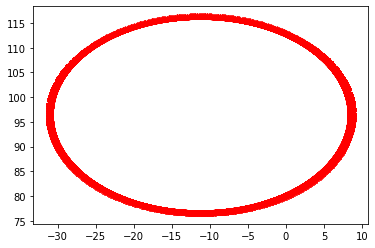

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, -0.1853020188851842]

Error:  989933.5315702865


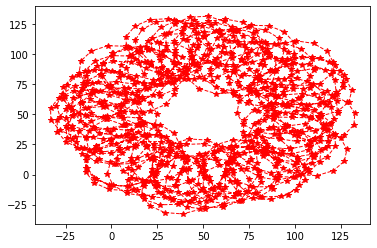

**********************************************************************************

Final parameters:  [0.46701634282995413, 0.26627169687219054, 0.0]

Error:  283509.17635523196


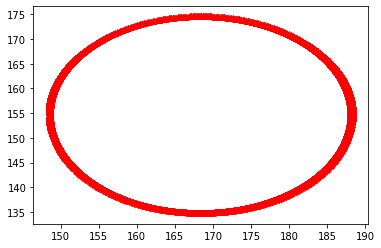

**********************************************************************************

Final parameters:  [-0.03124019683909679, 0.26627169687219054, 0.0]

Error:  11998907.33774593


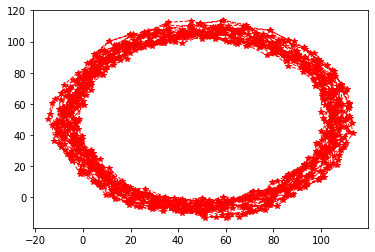

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.5707618044477217, 0.0]

Error:  54963.25153279522


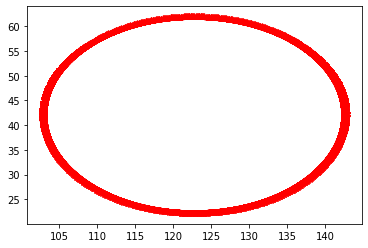

**********************************************************************************

Final parameters:  [0.21788807299542867, -0.038218410703340644, 0.0]

Error:  798868.7579268222


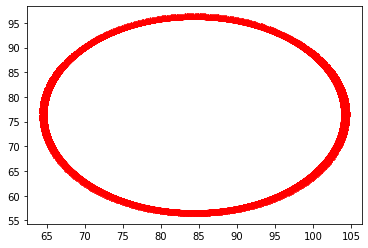

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, 0.16677181699666577]

Error:  210248.19135048537


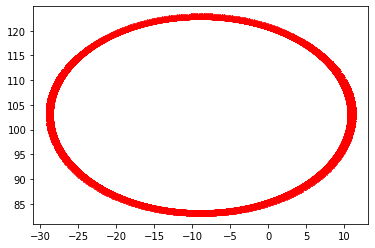

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, -0.16677181699666577]

Error:  1129896.593922491


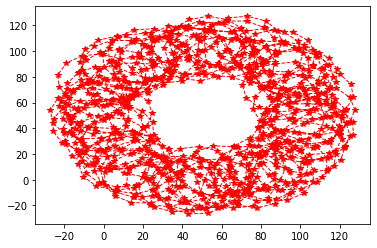

**********************************************************************************

Final parameters:  [0.4421035158465016, 0.26627169687219054, 0.0]

Error:  222562.88713203103


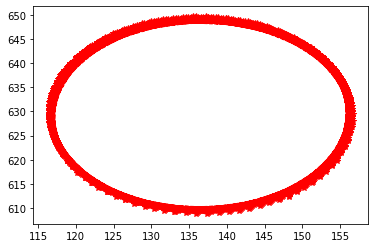

**********************************************************************************

Final parameters:  [-0.006327369855644249, 0.26627169687219054, 0.0]

Error:  287477568.25931185


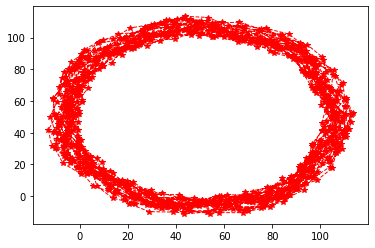

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.5403127936901686, 0.0]

Error:  52904.87574420473


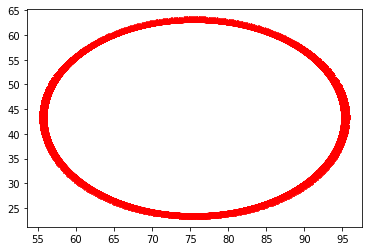

**********************************************************************************

Final parameters:  [0.21788807299542867, -0.007769399945787514, 0.0]

Error:  559694.0527994315


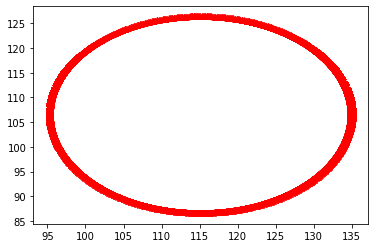

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, 0.1500946352969992]

Error:  1591913.3703962837


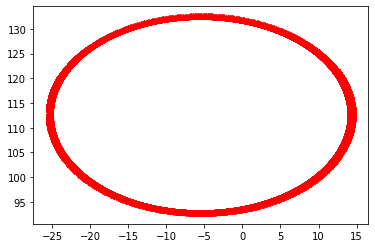

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.26627169687219054, -0.1500946352969992]

Error:  1415320.0566093626


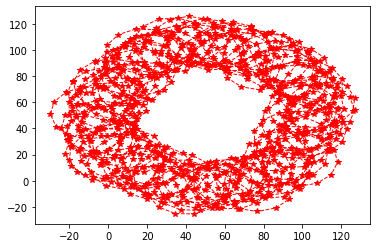

**********************************************************************************

Final parameters:  [0.4196819715613943, 0.26627169687219054, 0.0]

Error:  186954.4619520358


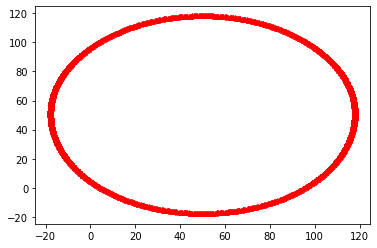

**********************************************************************************

Final parameters:  [0.016094174429463037, 0.26627169687219054, 0.0]

Error:  317501.9672639732


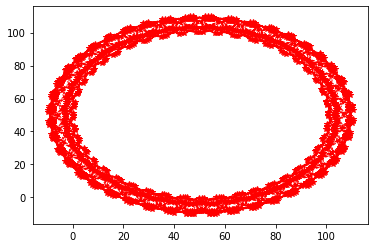

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.5129086840083708, 0.0]

Error:  44163.524439939065


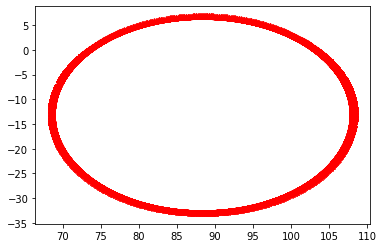

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.019634709736010225, 0.0]

Error:  834234.2061489505


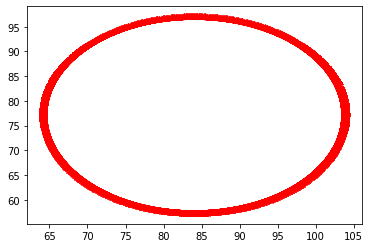

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.2662716968721905, 0.13508517176729928]

Error:  208880.3517554151


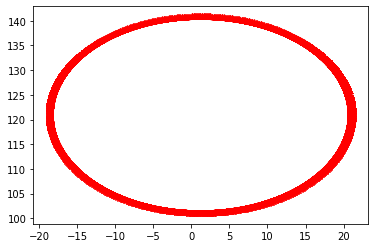

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.2662716968721905, -0.13508517176729928]

Error:  1587356.6021470327


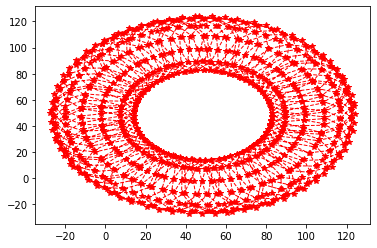

**********************************************************************************

Final parameters:  [0.39950258170479774, 0.2662716968721905, 0.0]

Error:  261267.1832252297


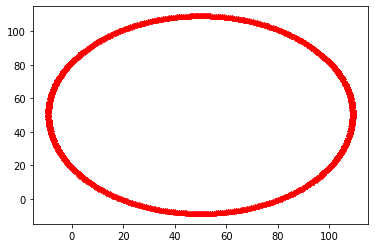

**********************************************************************************

Final parameters:  [0.0362735642860596, 0.2662716968721905, 0.0]

Error:  81158.48784327821


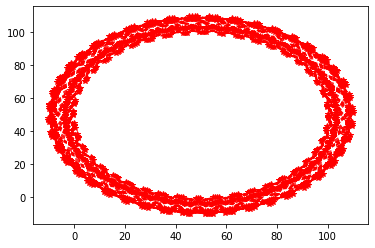

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.48824498529475274, 0.0]

Error:  44047.19102746828


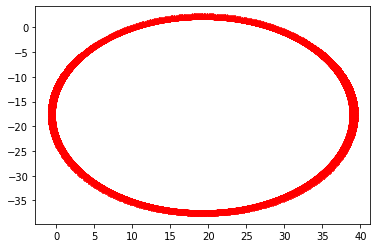

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.044298408449628235, 0.0]

Error:  861872.2358707574


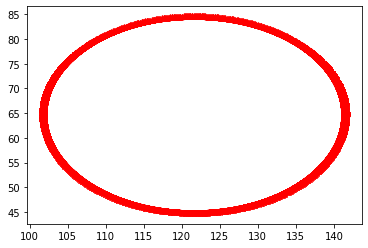

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.2662716968721905, 0.12157665459056936]

Error:  800810.5861296506


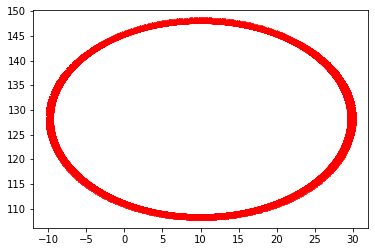

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.2662716968721905, -0.12157665459056936]

Error:  1715807.9866046316


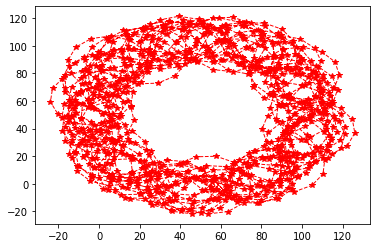

**********************************************************************************

Final parameters:  [0.38134113083386084, 0.2662716968721905, 0.0]

Error:  141047.12098338568


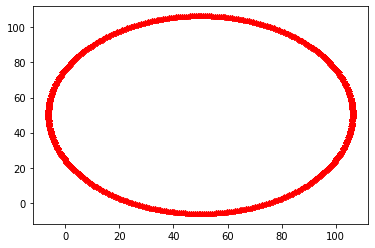

**********************************************************************************

Final parameters:  [0.0544350151569965, 0.2662716968721905, 0.0]

Error:  39353.793149602585


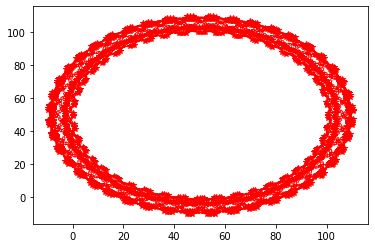

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.4660476564524965, 0.0]

Error:  44002.28829662065


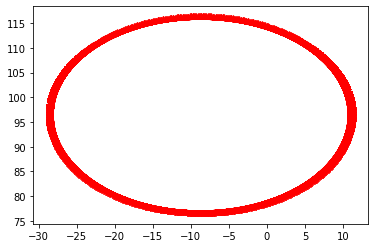

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.06649573729188446, 0.0]

Error:  881497.6095341952


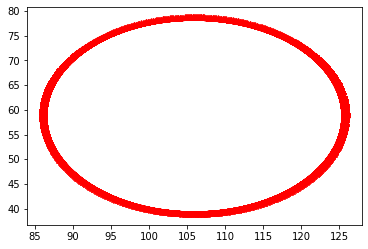

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.2662716968721905, 0.10941898913151243]

Error:  265224.70503116946


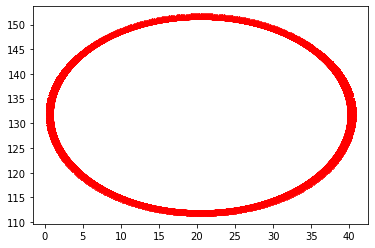

**********************************************************************************

Final parameters:  [0.21788807299542867, 0.2662716968721905, -0.10941898913151243]

Error:  1642635.8543532512


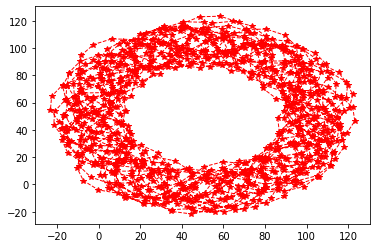

**********************************************************************************

Final parameters:  [0.3649958250500176, 0.2662716968721905, 0.0]

Error:  122146.57805491111


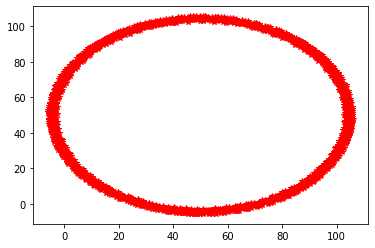

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.2662716968721905, 0.0]

Error:  20423.319834377566


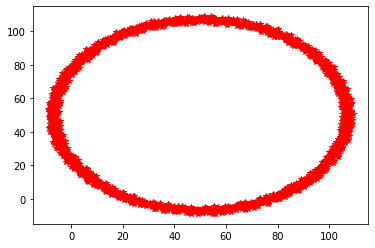

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.44607006049446596, 0.0]

Error:  49690.486545432665


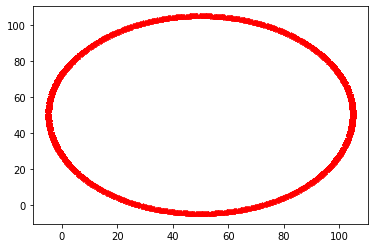

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.08647333324991507, 0.0]

Error:  24334.919347968873


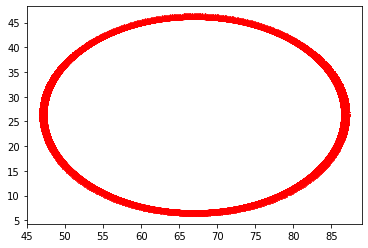

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, 0.0984770902183612]

Error:  481209.76172858773


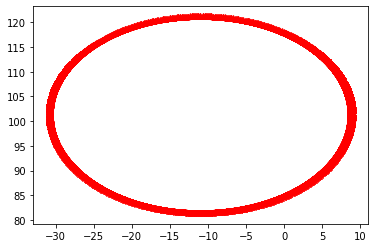

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, -0.0984770902183612]

Error:  1156023.1583320175


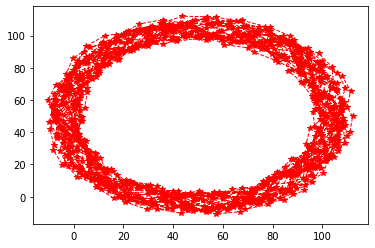

**********************************************************************************

Final parameters:  [0.23259884820088755, 0.26627169687219054, 0.0]

Error:  34711.07417667505


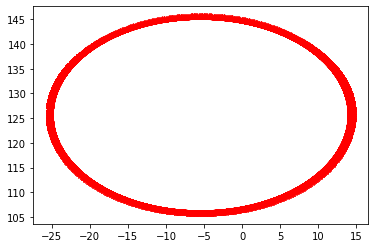

**********************************************************************************

Final parameters:  [-0.09103820631920817, 0.26627169687219054, 0.0]

Error:  2211626.726164108


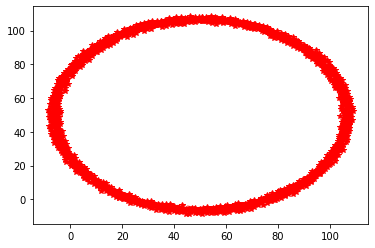

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.4280902241322384, 0.0]

Error:  43805.56101399589


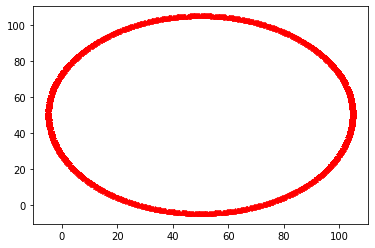

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.10445316961214263, 0.0]

Error:  24334.919347968877


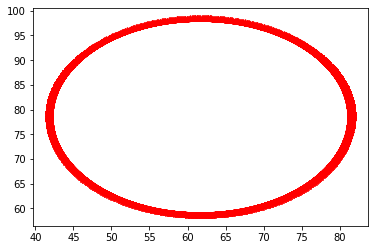

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, 0.08862938119652508]

Error:  436731.62245004234


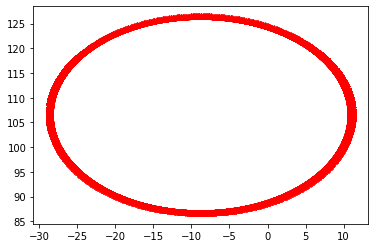

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, -0.08862938119652508]

Error:  1275412.2043055573


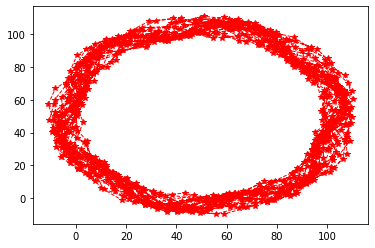

**********************************************************************************

Final parameters:  [0.21641699547488277, 0.26627169687219054, 0.0]

Error:  31575.298101753793


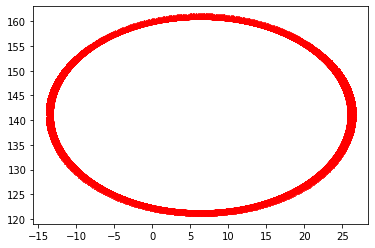

**********************************************************************************

Final parameters:  [-0.07485635359320339, 0.26627169687219054, 0.0]

Error:  2893573.2993838075


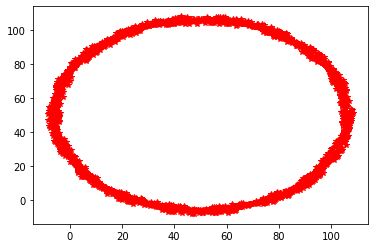

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.41190837140623365, 0.0]

Error:  38982.545181979505


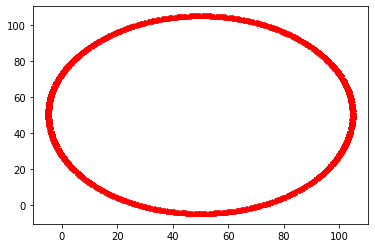

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.12063502233814744, 0.0]

Error:  24334.919347968877


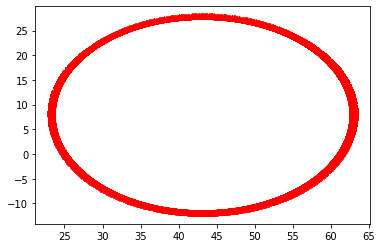

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, 0.07976644307687257]

Error:  215968.77505458336


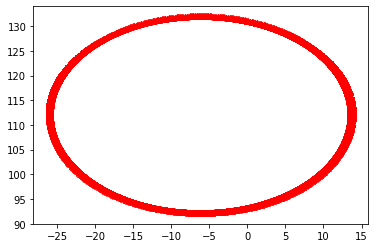

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, -0.07976644307687257]

Error:  1415912.9641684908


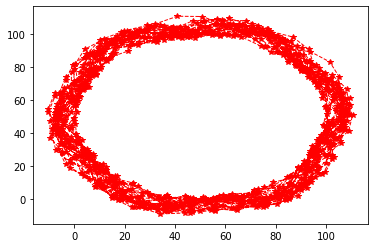

**********************************************************************************

Final parameters:  [0.20185332802147846, 0.26627169687219054, 0.0]

Error:  29844.534037654674


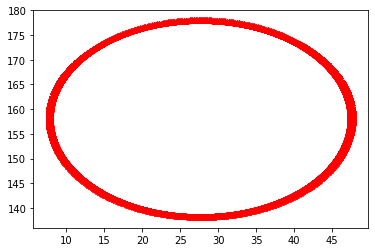

**********************************************************************************

Final parameters:  [-0.06029268613979907, 0.26627169687219054, 0.0]

Error:  3934081.5179893808


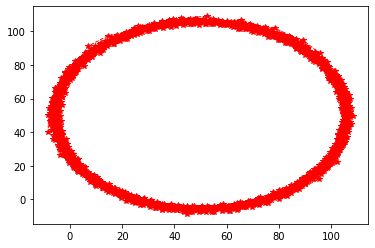

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.39734470395282934, 0.0]

Error:  36739.16691591121


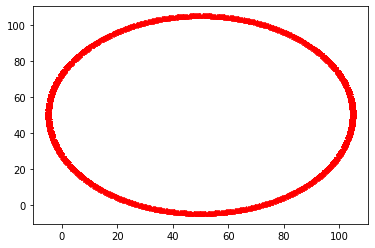

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.13519868979155175, 0.0]

Error:  24334.91934796888


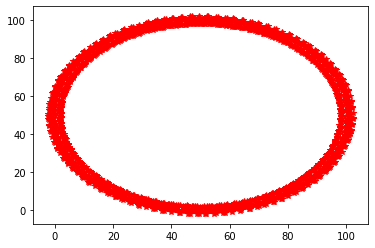

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, 0.07178979876918531]

Error:  2565.375016340514


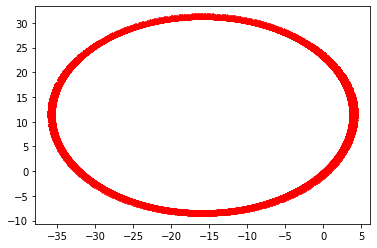

**********************************************************************************

Final parameters:  [0.18874602731341458, 0.26627169687219054, 0.07178979876918531]

Error:  959707.108760628


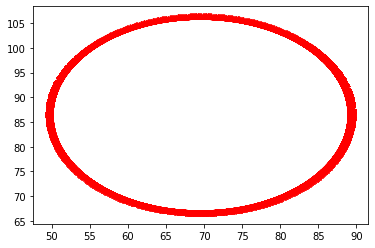

**********************************************************************************

Final parameters:  [-0.0471853854317352, 0.26627169687219054, 0.07178979876918531]

Error:  229446.06973362516


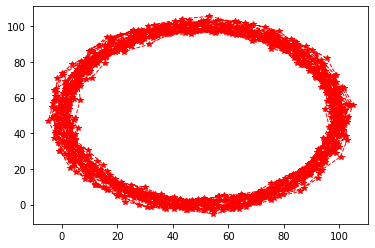

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.38423740324476546, 0.07178979876918531]

Error:  5391.299280430805


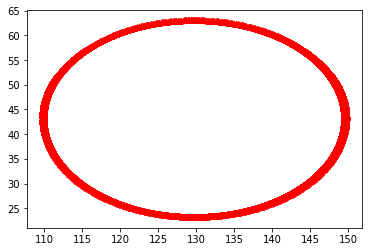

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.14830599049961563, 0.07178979876918531]

Error:  1179689.0709583163


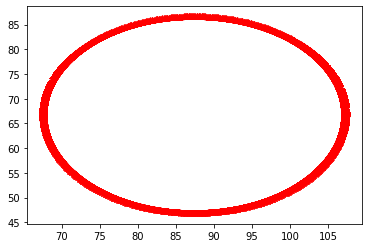

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, 0.15075857741528917]

Error:  232215.90818718408


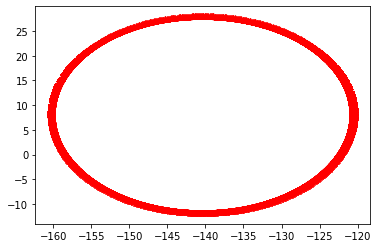

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.26627169687219054, -0.00717897987691854]

Error:  21343854.16911156


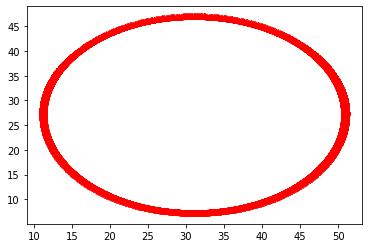

**********************************************************************************

Final parameters:  [0.17694945667615708, 0.26627169687219054, 0.07178979876918531]

Error:  464910.9979125559


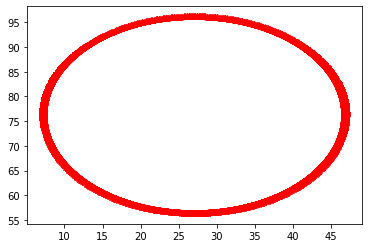

**********************************************************************************

Final parameters:  [-0.035388814794477724, 0.26627169687219054, 0.07178979876918531]

Error:  338260.6538083446


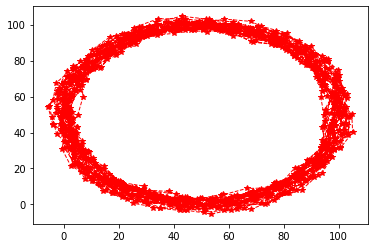

**********************************************************************************

Final parameters:  [0.07078032094083968, 0.372440832607508, 0.07178979876918531]

Error:  5974.454814050655


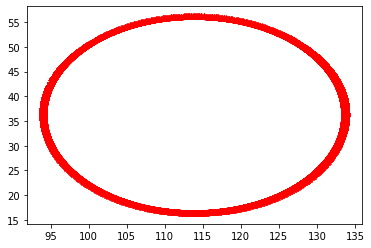

**********************************************************************************

Final parameters:  [0.07078032094083968, 0.16010256113687313, 0.07178979876918531]

Error:  484232.4556086486


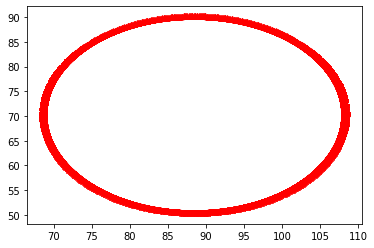

**********************************************************************************

Final parameters:  [0.07078032094083968, 0.26627169687219054, 0.1428616995506788]

Error:  209057.66908502267


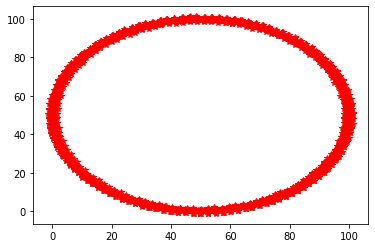

**********************************************************************************

Final parameters:  [0.07078032094083968, 0.26627169687219054, 0.0007178979876918401]

Error:  1031.1257539591659


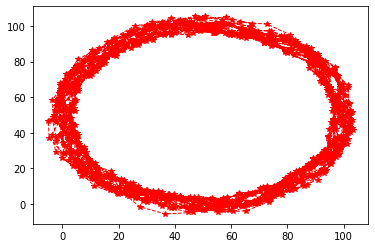

**********************************************************************************

Final parameters:  [0.16633254310262535, 0.26627169687219054, 0.0007178979876918401]

Error:  6762.545261998991


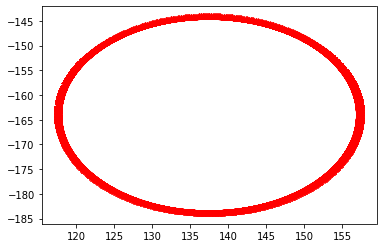

**********************************************************************************

Final parameters:  [-0.02477190122094597, 0.26627169687219054, 0.0007178979876918401]

Error:  33238125.081328657


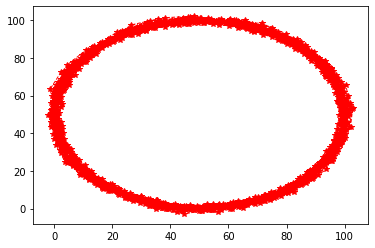

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.36182391903397626, 0.0007178979876918401]

Error:  1378.2930937001606


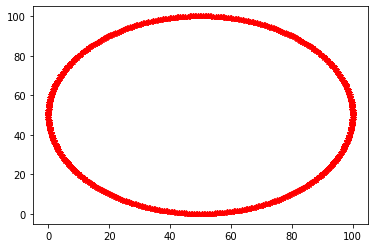

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.17071947471040488, 0.0007178979876918401]

Error:  9.468717347357696e-06


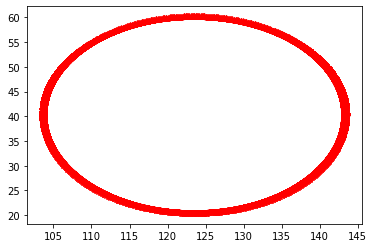

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.17071947471040488, 0.07889698884733466]

Error:  852237.093448889


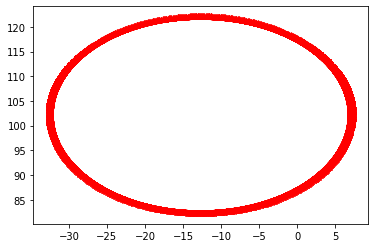

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.17071947471040488, -0.07746119287195098]

Error:  1275580.8595022347


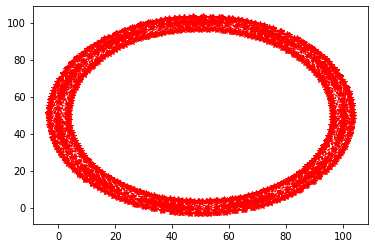

**********************************************************************************

Final parameters:  [0.1567773208864468, 0.17071947471040488, 0.0007178979876918401]

Error:  7863.532039493077


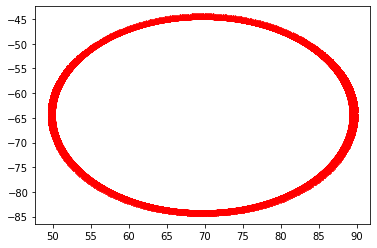

**********************************************************************************

Final parameters:  [-0.015216679004767392, 0.17071947471040488, 0.0007178979876918401]

Error:  4677001.16908327


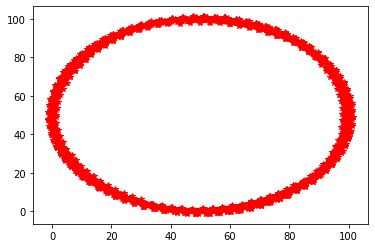

**********************************************************************************

Final parameters:  [0.0707803209408397, 0.27582691908836915, 0.0007178979876918401]

Error:  1116.5392883383752


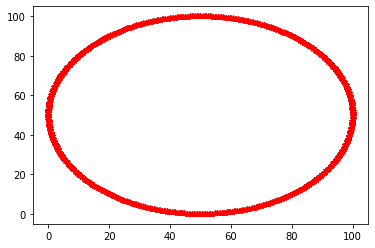

**********************************************************************************

Final parameters:  [0.0707803209408397, 0.06561203033244062, 0.0007178979876918401]

Error:  1.1863017208953365e-05


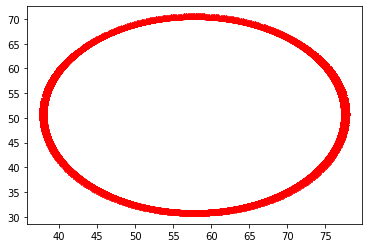

**********************************************************************************

Final parameters:  [0.0707803209408397, 0.17071947471040488, 0.07107907976137039]

Error:  884338.2204718306


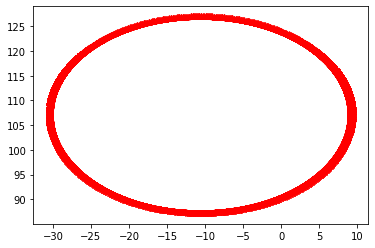

**********************************************************************************

Final parameters:  [0.0707803209408397, 0.17071947471040488, -0.0696432837859867]

Error:  1386843.503114202


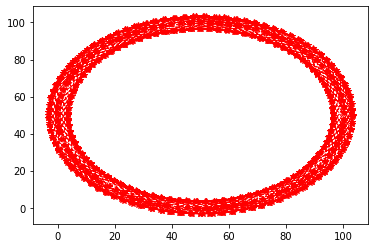

**********************************************************************************

Final parameters:  [0.14817762089188607, 0.17071947471040488, 0.0007178979876918401]

Error:  7821.39652073535


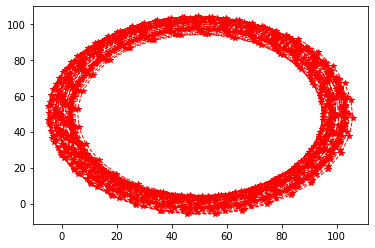

**********************************************************************************

Final parameters:  [-0.006616979010206692, 0.17071947471040488, 0.0007178979876918401]

Error:  9201.273373210997


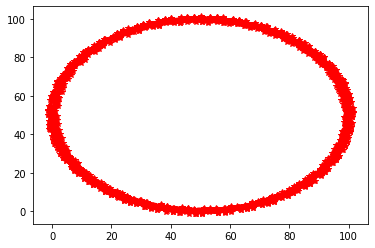

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.2653161746505727, 0.0007178979876918401]

Error:  1019.7407381248213


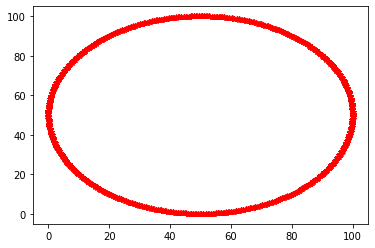

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.07612277477023704, 0.0007178979876918401]

Error:  1.1481230876142503e-05


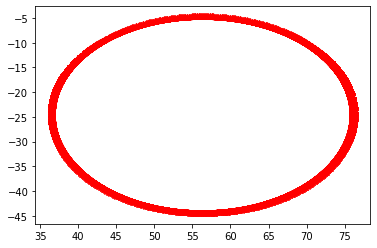

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.17071947471040488, 0.06404296158400254]

Error:  885022.162318636


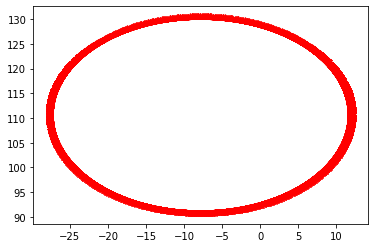

**********************************************************************************

Final parameters:  [0.07078032094083969, 0.17071947471040488, -0.06260716560861886]

Error:  1424473.0814573632


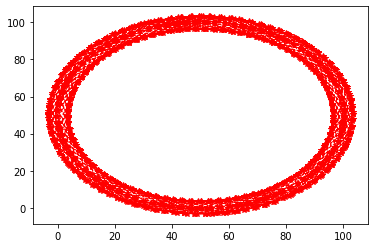

**********************************************************************************

Final parameters:  [0.14043789089678144, 0.17071947471040488, 0.0007178979876918401]

Error:  7802.976925928315


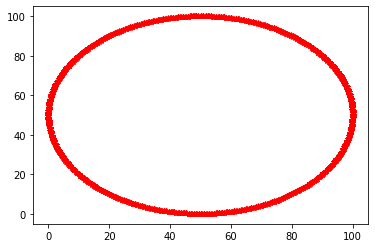

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.17071947471040488, 0.0007178979876918401]

Error:  7.958025540840784e-17


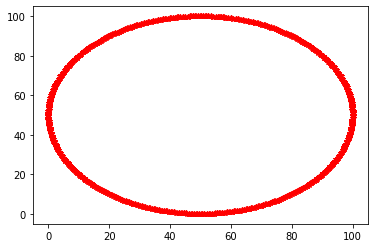

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.25585650465655596, 0.0007178979876918401]

Error:  1.7995723004523973e-10


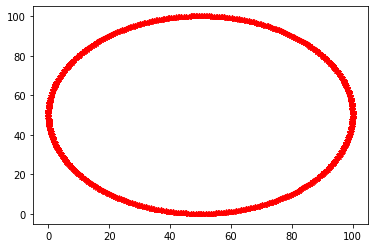

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.08558244476425383, 0.0007178979876918401]

Error:  9.425436313325484e-25


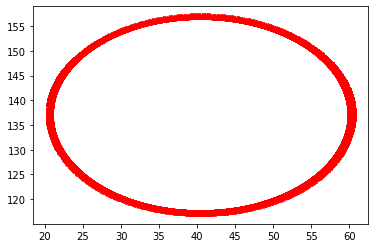

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.08558244476425383, 0.05771045522437147]

Error:  1699389.7077359855


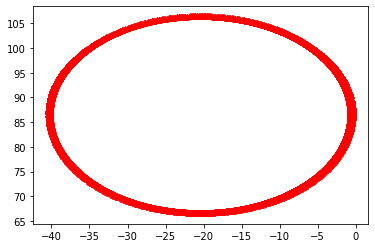

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.08558244476425383, -0.056274659248987786]

Error:  1133338.522995589


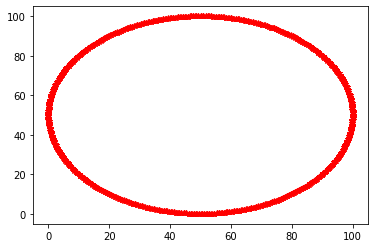

**********************************************************************************

Final parameters:  [0.07774607793643387, 0.08558244476425383, 0.0007178979876918401]

Error:  4.871209674471472e-05


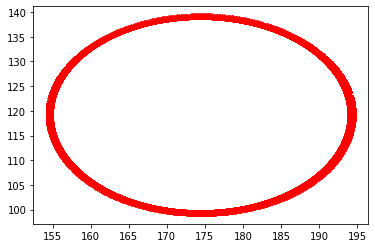

**********************************************************************************

Final parameters:  [-0.07550057596663798, 0.08558244476425383, 0.0007178979876918401]

Error:  8862734.034837365


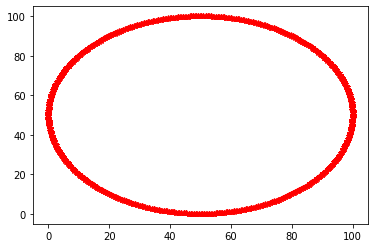

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.17923317770502, 0.0007178979876918401]

Error:  3.2664437479176214e-16


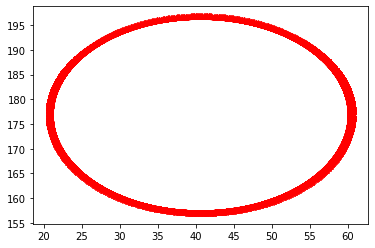

**********************************************************************************

Final parameters:  [0.0011227509848979467, -0.00806828817651234, 0.0007178979876918401]

Error:  6262648.441939798


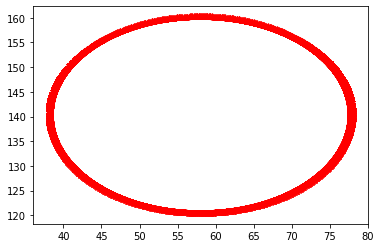

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.08558244476425383, 0.05201119950070351]

Error:  1946891.025148111


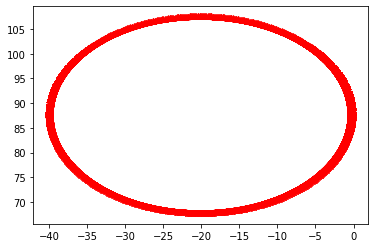

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.08558244476425383, -0.05057540352531983]

Error:  1149460.3743660825
[x=0.00000 y=60.00000 orient=1.57080]
[x=0.21692 y=69.99686 orient=1.52740]
[x=1.24691 y=79.93768 orient=1.40770]
[x=3.68274 y=89.62457 orient=1.24120]
[x=7.75992 y=98.74054 orient=1.05926]
[x=13.41306 y=106.97287 orient=0.87885]
[x=20.42828 y=114.08171 orient=0.70520]
[x=28.54829 y=119.89829 orient=0.53800]
[x=37.51330 y=124.30384 orient=0.37551]
[x=47.06862 y=127.21668 orient=0.21627]
[x=56.96367 y=128.58891 orient=0.05933]
[x=66.95198 y=128.40674 orient=6.18738]
[x=76.79368 y=126.69081 orient=6.03375]
[x=86.25914 y=123.49521 orient=5.88143]
[x=95.13289 y=118.90541 orient=5.73026]
[x=103.21725 y=113.03554 orient=5.58008]
[x=110.33553 y=106.02522 orient=5.43077]
[x=116.33477 y=98.03615 orient=5.28220]
[x=121.08803 y=89.24842 orient=5.13424]
[x=124.49613 y=79.85674 orient=4.98676]
[x=126.488

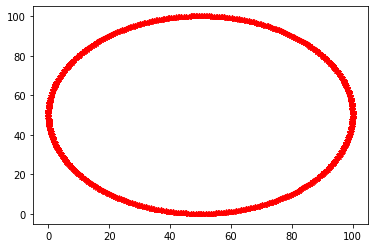

**********************************************************************************

Final parameters:  [0.0011227509848979467, 0.08558244476425383, 0.0007178979876918401]

Error:  9.425436313325484e-25


In [ ]:
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#
class robot:
    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
   # modify CTE to a circle with r= 50
    def cte(self, radius):           
         #center = [50, 50] # y, x coordinates of the center of the circle
         center = [radius, radius]
         cte = ((self.x - center[1])**2 + (self.y - center[0])**2)**0.5 - radius
         return cte

# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 10.0 # increased speed to 10
    dt = 1.0
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []

    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error = (diff_crosstrack_error + crosstrack_error)/dt
        int_crosstrack_error += crosstrack_error*dt                           #added / dt and               *dt here
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed*dt)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)

    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

########twiddle
def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    # PID -> dp [1.0, 1.0, 1.0]
    dp = [1.0, 1.0, 1.0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

    
## changed r to 50
radius = 50.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,True)

Final parameters:  [0.0011227509848979467, 0.08558244476425383, 0.0007178979876918401]

dt=1, Error:  9.425436313325484e-25

#### dt = 1/10

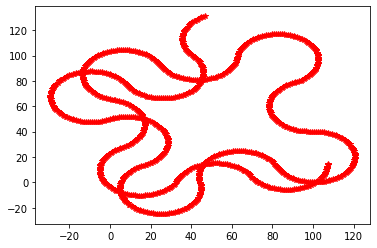

**********************************************************************************

Final parameters:  [0.9, 0.0, 0.0]

Error:  317122.8860246721


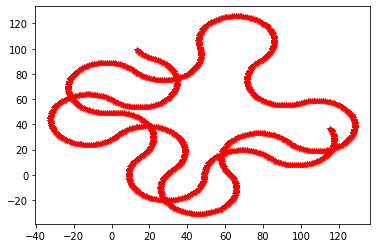

**********************************************************************************

Final parameters:  [1.9, 0.0, 0.0]

Error:  329648.4439749039


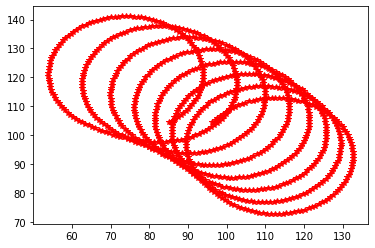

**********************************************************************************

Final parameters:  [-0.10000000000000009, 0.0, 0.0]

Error:  918695.6580140312


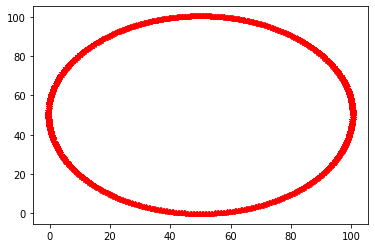

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.0]

Error:  176.05803043864015


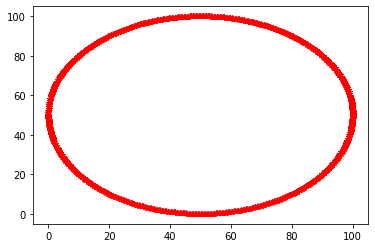

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 1.0]

Error:  5.503093674821778e-26


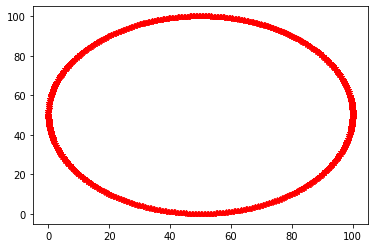

**********************************************************************************

Final parameters:  [1.7999999999999998, 1.0, 1.0]

Error:  6.103890140238101e-26


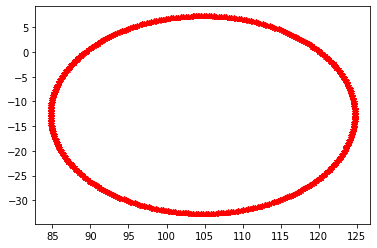

**********************************************************************************

Final parameters:  [-2.220446049250313e-16, 1.0, 1.0]

Error:  1391503.8307472381


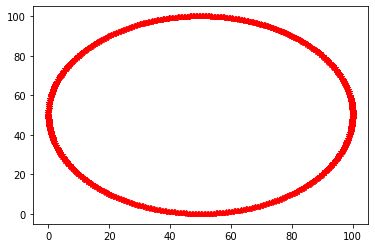

**********************************************************************************

Final parameters:  [0.8999999999999998, 2.1, 1.0]

Error:  2.4120654819628498e-20


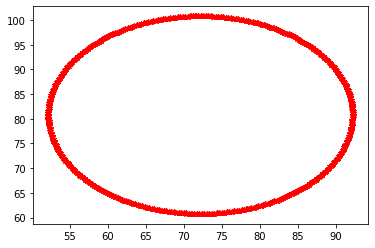

**********************************************************************************

Final parameters:  [0.8999999999999998, -0.10000000000000009, 1.0]

Error:  274210.84209000575


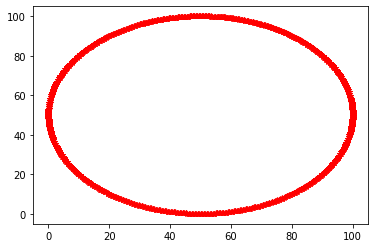

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.0, 2.1]

Error:  6.331082080941752e-26


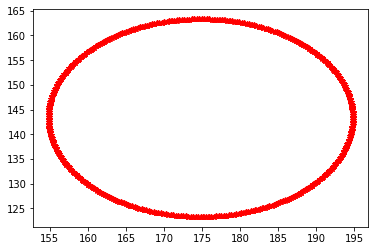

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.0, -0.10000000000000009]

Error:  11517604.708952492


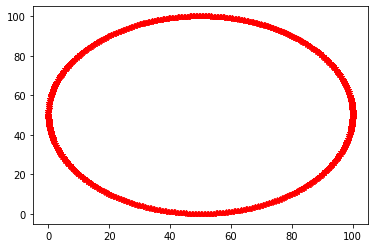

**********************************************************************************

Final parameters:  [1.71, 1.0, 1.0]

Error:  5.599019160896653e-26


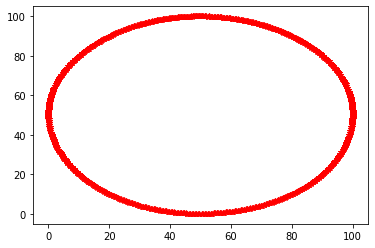

**********************************************************************************

Final parameters:  [0.08999999999999986, 1.0, 1.0]

Error:  2.641096513161532


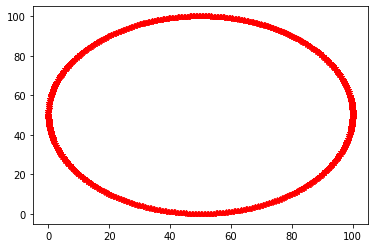

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.9900000000000002, 1.0]

Error:  3.167503675915968e-21


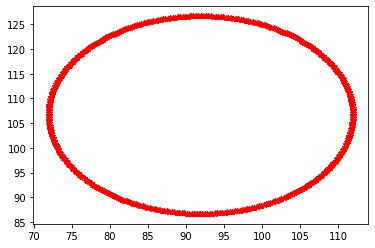

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.010000000000000009, 1.0]

Error:  679951.056091292


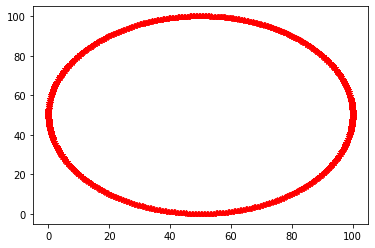

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 1.9900000000000002]

Error:  5.957477556229081e-26


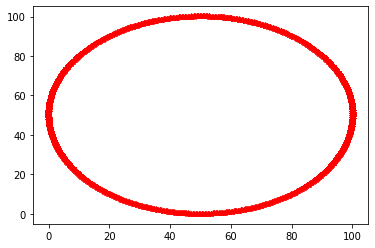

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.0, 0.010000000000000009]

Error:  7.939861500039101


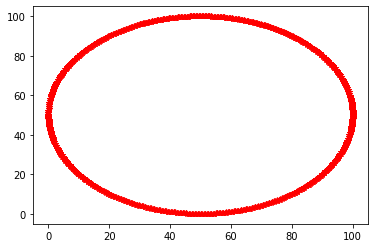

**********************************************************************************

Final parameters:  [1.629, 1.0, 1.0]

Error:  6.563322731438818e-26


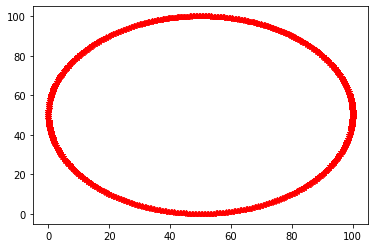

**********************************************************************************

Final parameters:  [0.17099999999999982, 1.0, 1.0]

Error:  0.00017611543168224577


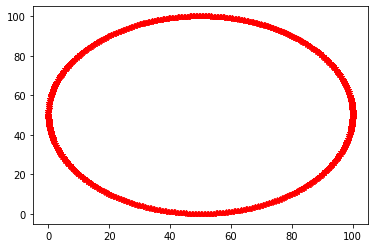

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.891, 1.0]

Error:  2.38648119557182e-22


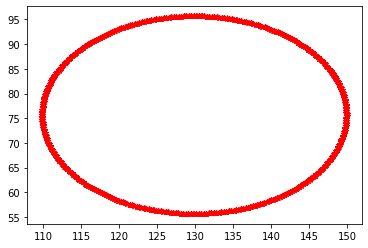

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.10899999999999976, 1.0]

Error:  1425581.9929714508


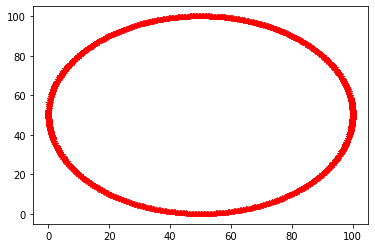

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 1.891]

Error:  5.851454650567377e-26


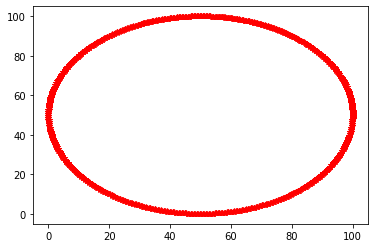

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.10899999999999976]

Error:  7.39972193710401e-12


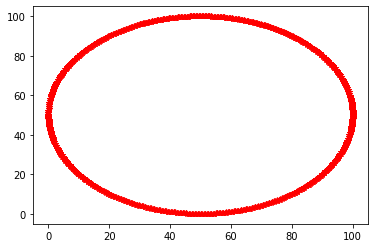

**********************************************************************************

Final parameters:  [1.5561, 0.9999999999999999, 0.9999999999999999]

Error:  5.77572400366616e-26


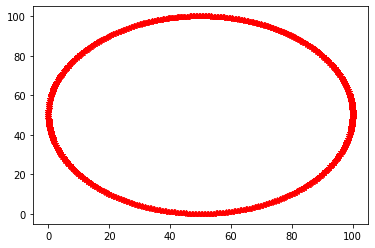

**********************************************************************************

Final parameters:  [0.24389999999999978, 0.9999999999999999, 0.9999999999999999]

Error:  5.567005345826854e-08


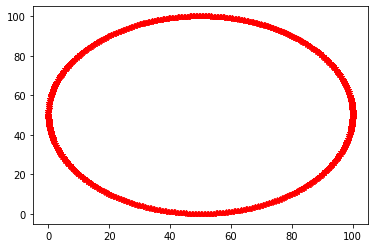

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.8019, 0.9999999999999999]

Error:  2.5816274606037316e-23


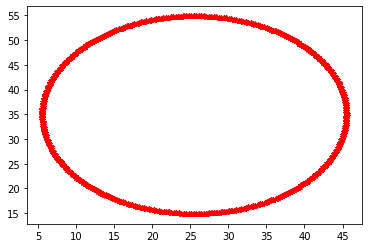

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.19809999999999972, 0.9999999999999999]

Error:  493056.8870781492


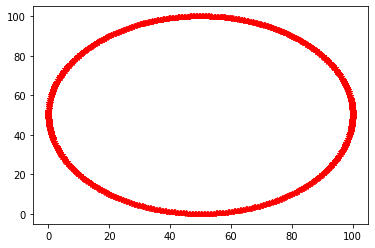

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 1.8019]

Error:  5.957477556229081e-26


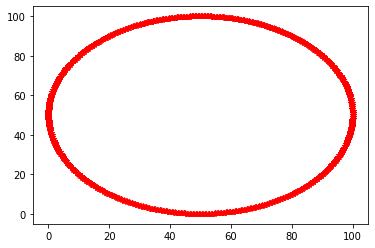

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.19809999999999972]

Error:  4.8366639820910676e-26


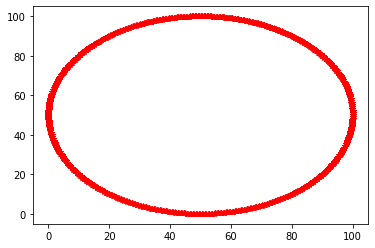

**********************************************************************************

Final parameters:  [1.49049, 0.9999999999999999, 0.19809999999999972]

Error:  8.225898405723731e-13


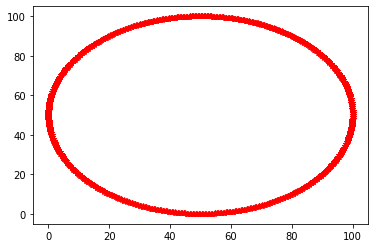

**********************************************************************************

Final parameters:  [0.30950999999999973, 0.9999999999999999, 0.19809999999999972]

Error:  3.4222687523901744e-13


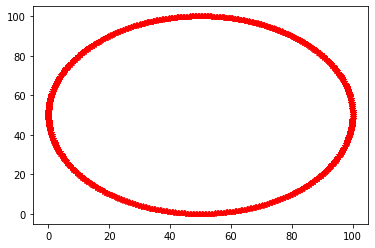

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.72171, 0.19809999999999972]

Error:  1.9062918437974377e-23


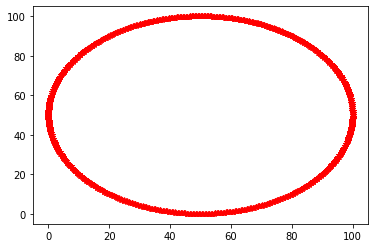

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.2782899999999997, 0.19809999999999972]

Error:  5.1051621641127704e-20


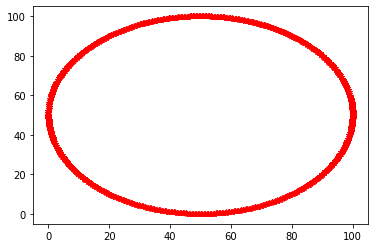

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 1.08019]

Error:  5.336486251639101e-26


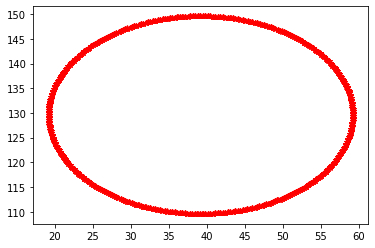

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, -0.6839900000000005]

Error:  1189903.4638366501


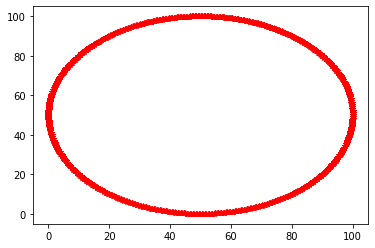

**********************************************************************************

Final parameters:  [1.431441, 0.9999999999999999, 0.19809999999999972]

Error:  2.015413408877197e-13


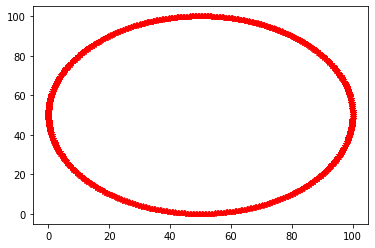

**********************************************************************************

Final parameters:  [0.36855899999999964, 0.9999999999999999, 0.19809999999999972]

Error:  6.096993023472309e-16


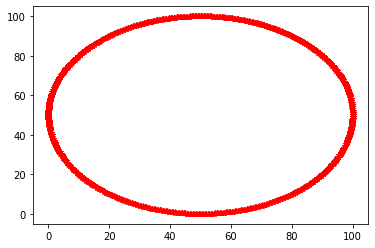

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.649539, 0.19809999999999972]

Error:  3.240817303490686e-24


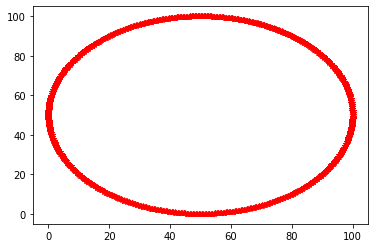

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.3504609999999997, 0.19809999999999972]

Error:  2.0049928580812423e-20


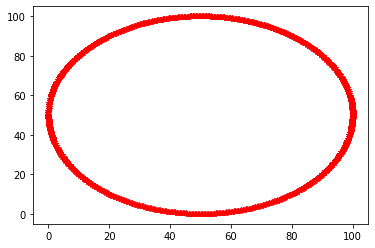

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999999, 0.991981]

Error:  5.644457549037384e-26


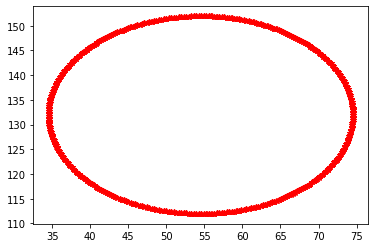

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999999, -0.5957810000000006]

Error:  1306086.2000869128


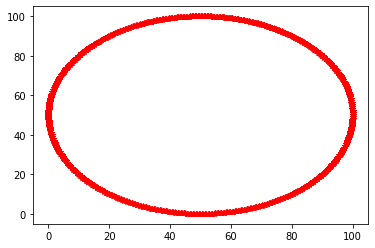

**********************************************************************************

Final parameters:  [1.3782969, 0.9999999999999999, 0.19809999999999972]

Error:  4.9048309605698483e-14


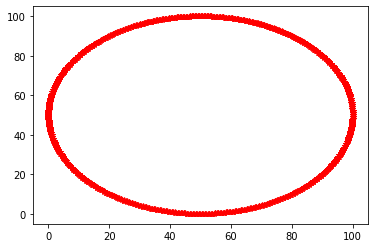

**********************************************************************************

Final parameters:  [0.4217030999999998, 0.9999999999999999, 0.19809999999999972]

Error:  7.005709130008767e-19


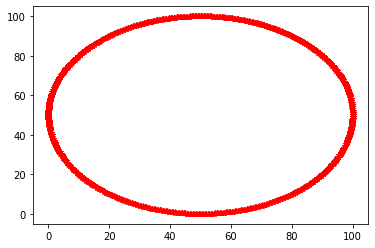

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.5845851, 0.19809999999999972]

Error:  5.066885148670768e-25


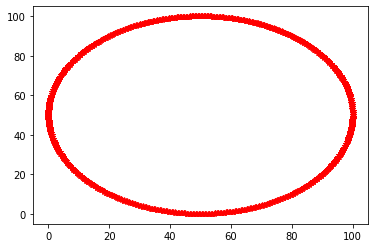

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.4154148999999996, 0.19809999999999972]

Error:  8.05752509892003e-21


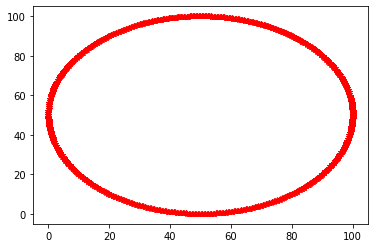

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999998, 0.9125929]

Error:  6.002915944369811e-26


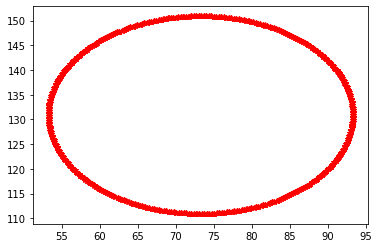

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999998, -0.5163929000000006]

Error:  1453464.7349199676


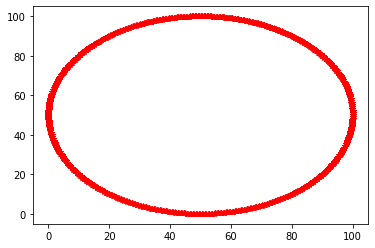

**********************************************************************************

Final parameters:  [1.3304672100000001, 0.9999999999999998, 0.19809999999999972]

Error:  1.1919191137182471e-14


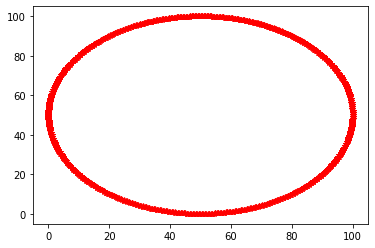

**********************************************************************************

Final parameters:  [0.4695327899999998, 0.9999999999999998, 0.19809999999999972]

Error:  8.91304053495954e-21


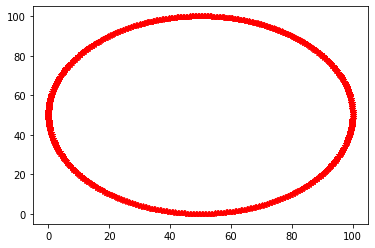

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.52612659, 0.19809999999999972]

Error:  1.0844628636254293e-25


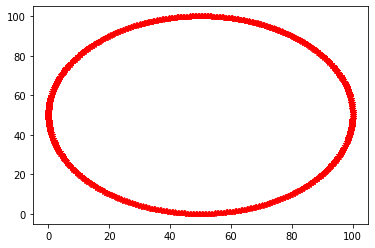

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.4738734099999997, 0.19809999999999972]

Error:  3.306280389285036e-21


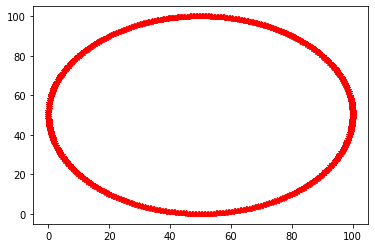

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.84114361]

Error:  5.452606576887634e-26


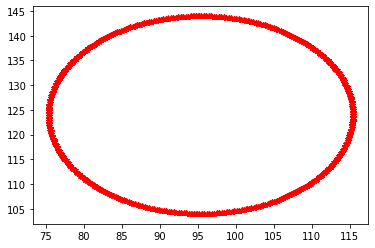

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, -0.4449436100000006]

Error:  1643953.6548286662


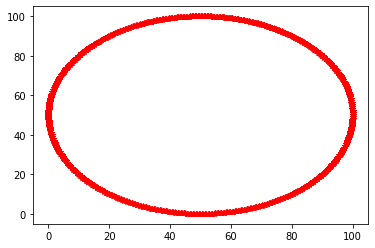

**********************************************************************************

Final parameters:  [1.287420489, 0.9999999999999999, 0.19809999999999972]

Error:  2.907278511490325e-15


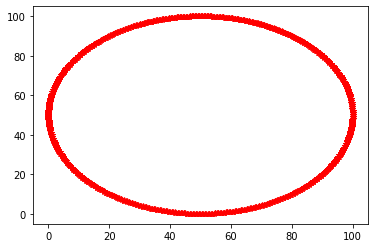

**********************************************************************************

Final parameters:  [0.5125795109999998, 0.9999999999999999, 0.19809999999999972]

Error:  1.8354836889447997e-23


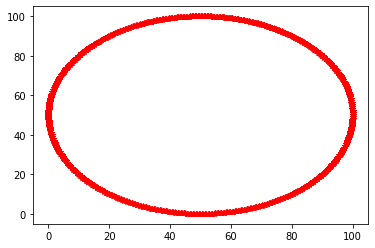

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.473513931, 0.19809999999999972]

Error:  6.199815626312976e-26


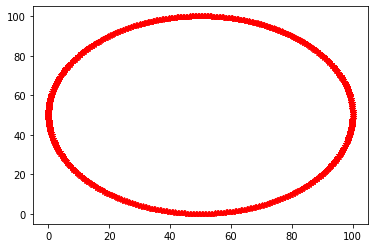

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.5264860689999997, 0.19809999999999972]

Error:  1.387576292460489e-21


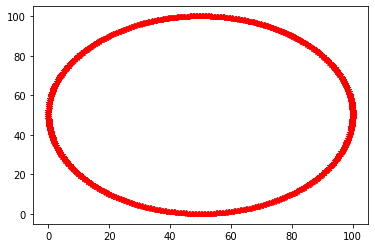

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, 0.776839249]

Error:  5.558629482549338e-26


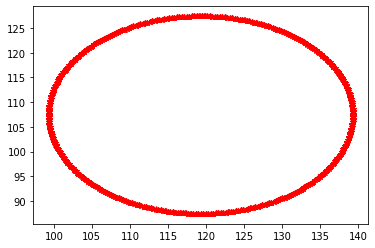

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999999, -0.38063924900000057]

Error:  1893146.6193382756


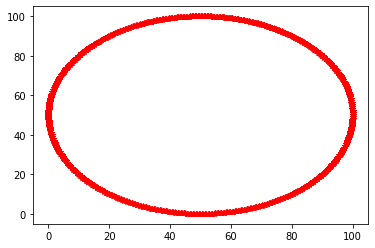

**********************************************************************************

Final parameters:  [1.2486784401, 0.9999999999999999, 0.19809999999999972]

Error:  7.153901743583089e-16


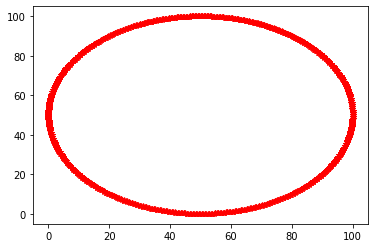

**********************************************************************************

Final parameters:  [0.5513215598999996, 0.9999999999999999, 0.19809999999999972]

Error:  9.300228310448805e-25


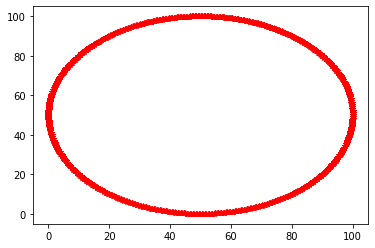

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.4261625379, 0.19809999999999972]

Error:  5.129489150109107e-26


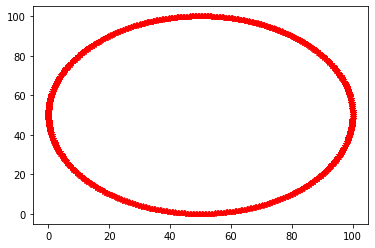

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.5738374620999998, 0.19809999999999972]

Error:  5.956311809137782e-22


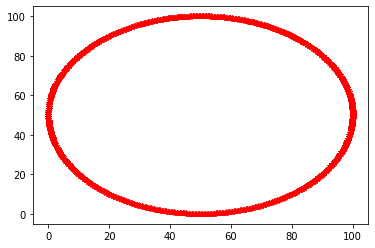

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999999, 0.7189653241]

Error:  5.492996255234949e-26


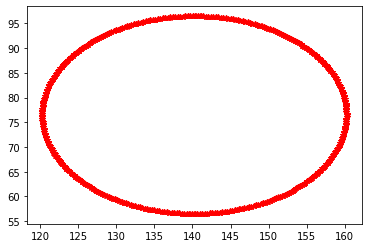

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999999, -0.3227653241000006]

Error:  2228778.5589268017


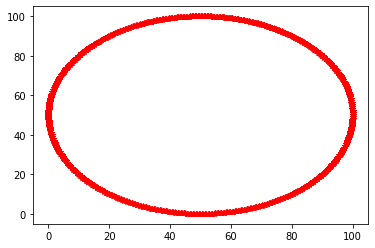

**********************************************************************************

Final parameters:  [1.21381059609, 0.9999999999999999, 0.19809999999999972]

Error:  1.7845891109291348e-16


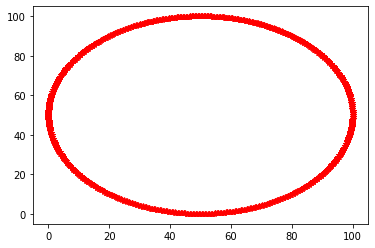

**********************************************************************************

Final parameters:  [0.5861894039099997, 0.9999999999999999, 0.19809999999999972]

Error:  5.341534961432515e-26


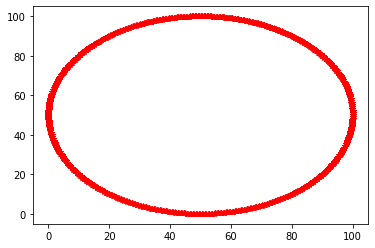

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.38354628411, 0.19809999999999972]

Error:  4.851810111471311e-26


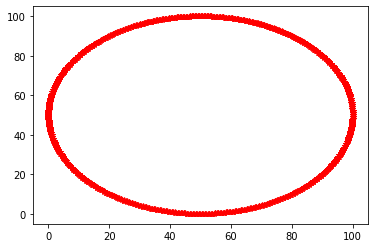

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.6164537158899996, 0.19809999999999972]

Error:  2.61345957585121e-22


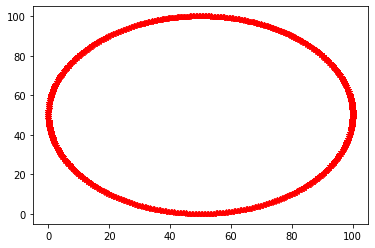

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999998, 0.6668787916900001]

Error:  5.386973349573245e-26


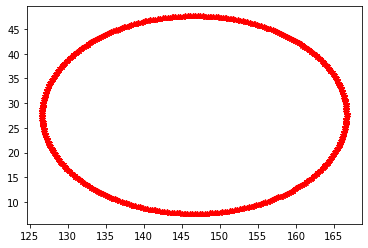

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999998, -0.27067879169000053]

Error:  2712209.7390511874


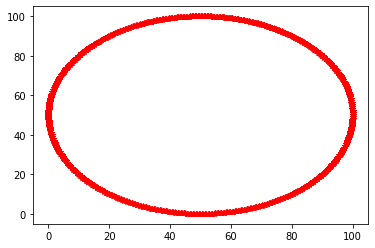

**********************************************************************************

Final parameters:  [1.182429536481, 0.9999999999999998, 0.19809999999999978]

Error:  4.5341665065187283e-17


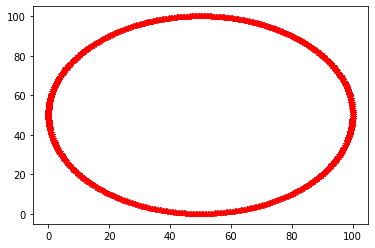

**********************************************************************************

Final parameters:  [0.6175704635189997, 0.9999999999999998, 0.19809999999999978]

Error:  5.780772713459575e-26


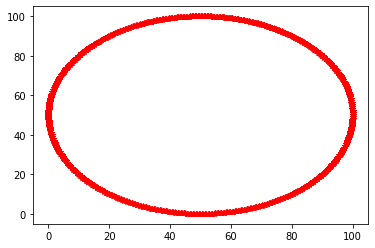

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.3451916556989998, 0.19809999999999978]

Error:  4.9628817269264295e-26


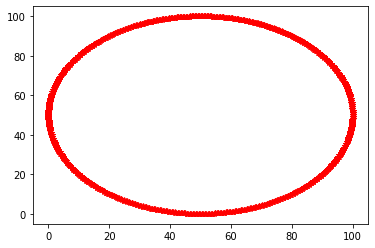

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.6548083443009995, 0.19809999999999978]

Error:  1.182268489227372e-22


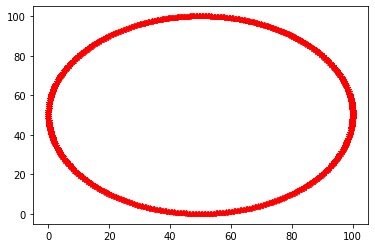

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, 0.620000912521]

Error:  5.487947545441535e-26


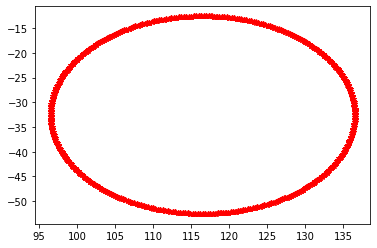

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, -0.22380091252100054]

Error:  3453958.7578417375


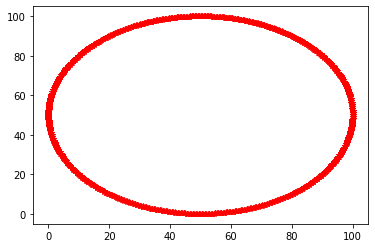

**********************************************************************************

Final parameters:  [1.1541865828329, 0.9999999999999997, 0.19809999999999972]

Error:  1.1784969359498843e-17


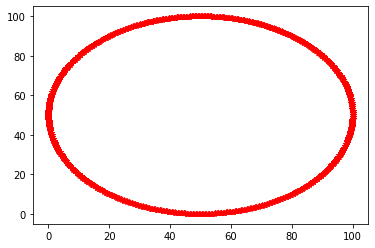

**********************************************************************************

Final parameters:  [0.6458134171670998, 0.9999999999999997, 0.19809999999999972]

Error:  5.235512055770811e-26


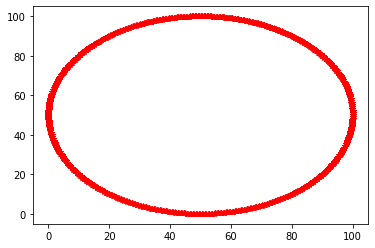

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.3106724901290998, 0.19809999999999972]

Error:  5.397070769160074e-26


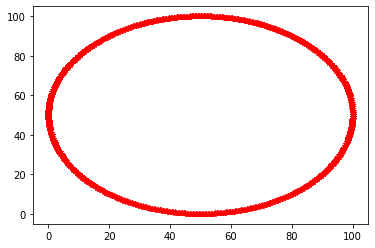

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.6893275098708995, 0.19809999999999972]

Error:  5.49469767043533e-23


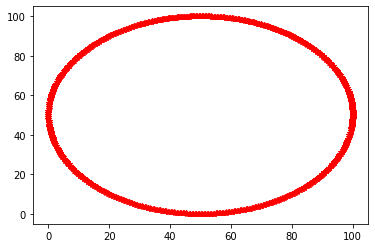

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, 0.5778108212688999]

Error:  5.351632381019344e-26


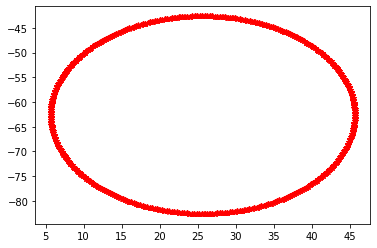

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, -0.1816108212689006]

Error:  4561660.34993538


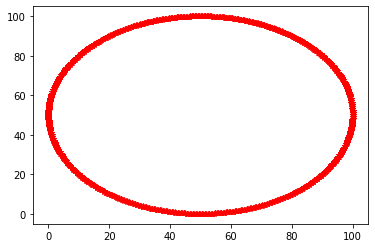

**********************************************************************************

Final parameters:  [1.12876792454961, 0.9999999999999997, 0.19809999999999967]

Error:  3.146389937733553e-18


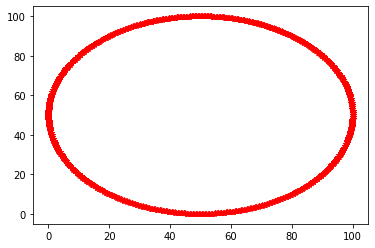

**********************************************************************************

Final parameters:  [0.6712320754503898, 0.9999999999999997, 0.19809999999999967]

Error:  5.139586569695936e-26


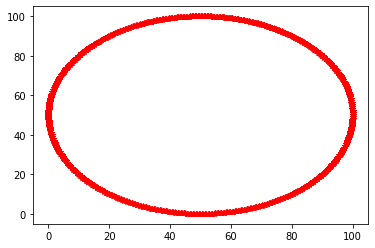

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.2796052411161898, 0.19809999999999967]

Error:  5.351632381019344e-26


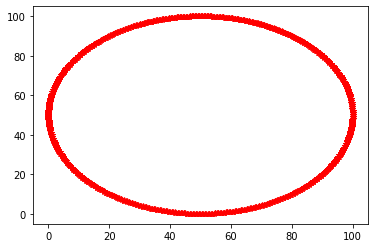

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.7203947588838095, 0.19809999999999967]

Error:  2.6149741887892342e-23


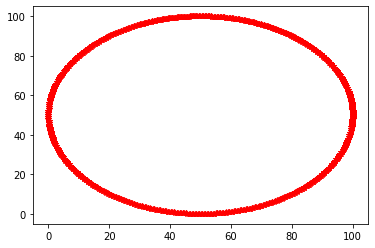

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, 0.5398397391420099]

Error:  5.043661083621061e-26


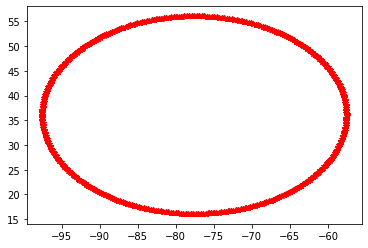

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, -0.14363973914201056]

Error:  6471848.704997357


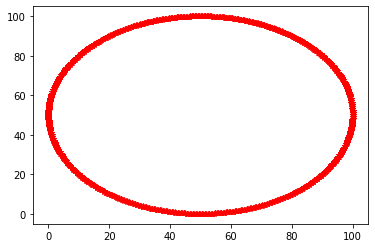

**********************************************************************************

Final parameters:  [1.105891132094649, 0.9999999999999997, 0.19809999999999967]

Error:  8.661217205895107e-19


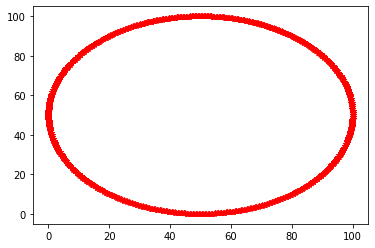

**********************************************************************************

Final parameters:  [0.6941088679053508, 0.9999999999999997, 0.19809999999999967]

Error:  5.280950443911541e-26


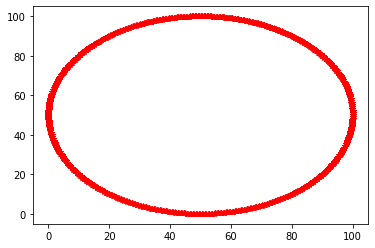

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.2516447170045708, 0.19809999999999967]

Error:  5.912039168088351e-26


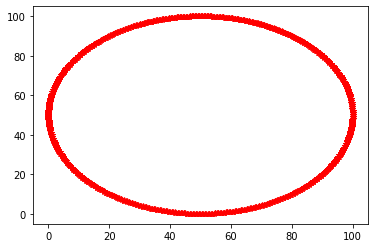

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.7483552829954285, 0.19809999999999967]

Error:  1.2835284420699687e-23


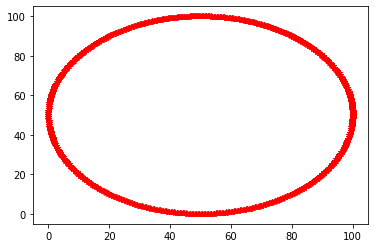

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, 0.5056657652278089]

Error:  5.0386123738276466e-26


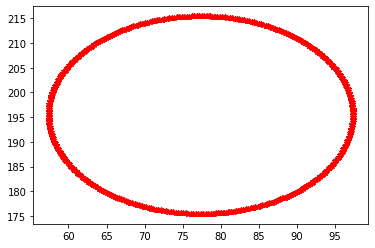

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, -0.10946576522780949]

Error:  9951812.98482107


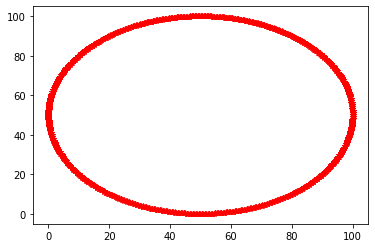

**********************************************************************************

Final parameters:  [1.085302018885184, 0.9999999999999997, 0.19809999999999972]

Error:  2.466764353960793e-19


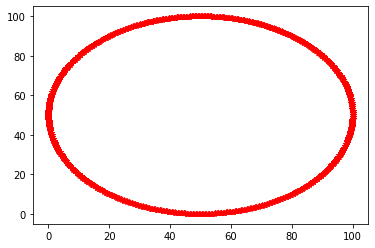

**********************************************************************************

Final parameters:  [0.7146979811148158, 0.9999999999999997, 0.19809999999999972]

Error:  5.397070769160074e-26


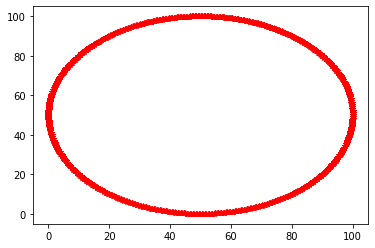

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.2264802453041137, 0.19809999999999972]

Error:  5.639408839243969e-26


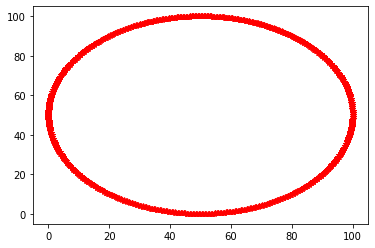

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.7735197546958856, 0.19809999999999972]

Error:  6.5055150043042225e-24


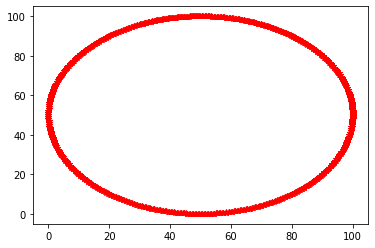

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, 0.474909188705028]

Error:  5.487947545441535e-26


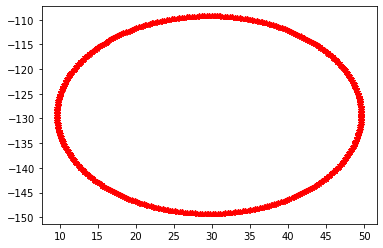

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999997, -0.07870918870502858]

Error:  17354197.555658698


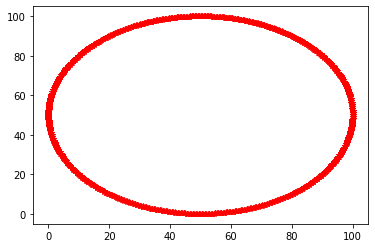

**********************************************************************************

Final parameters:  [1.0667718169966656, 0.9999999999999997, 0.19809999999999972]

Error:  7.290299687260937e-20


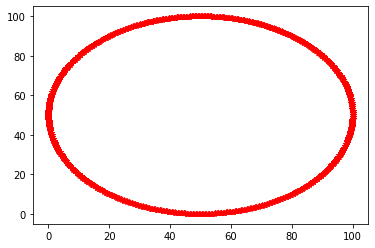

**********************************************************************************

Final parameters:  [0.733228183003334, 0.9999999999999997, 0.19809999999999972]

Error:  5.427363027920561e-26


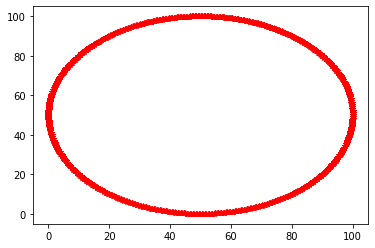

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.2038322207737022, 0.19809999999999972]

Error:  5.397070769160074e-26


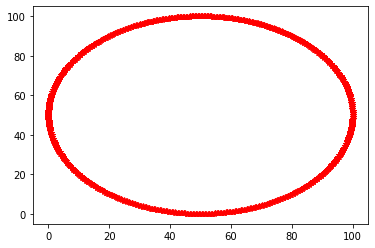

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.7961677792262969, 0.19809999999999972]

Error:  3.429941972351992e-24


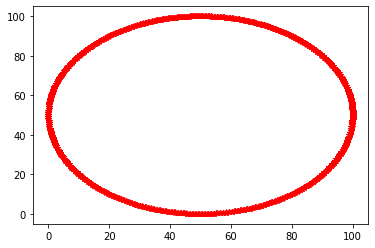

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999996, 0.4472282698345252]

Error:  5.24560947535764e-26


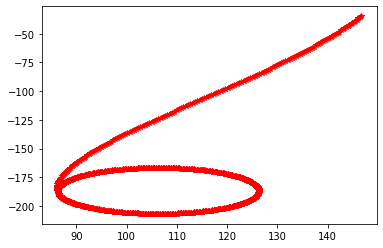

**********************************************************************************

Final parameters:  [0.8999999999999998, 0.9999999999999996, -0.05102826983452574]

Error:  34558915.31829215


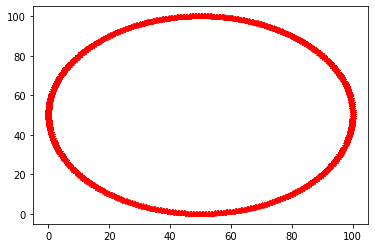

**********************************************************************************

Final parameters:  [1.050094635296999, 0.9999999999999996, 0.19809999999999972]

Error:  2.2417744847739284e-20


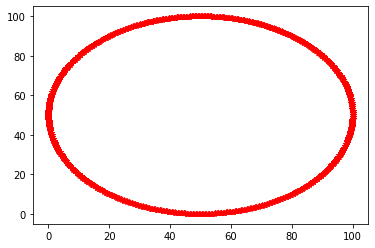

**********************************************************************************

Final parameters:  [0.7499053647030007, 0.9999999999999996, 0.19809999999999972]

Error:  5.402119478953489e-26


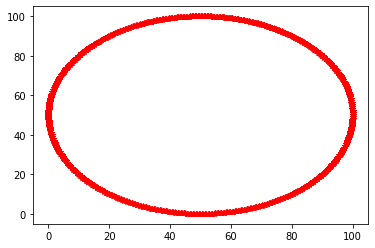

**********************************************************************************

Final parameters:  [0.8999999999999999, 1.183448998696332, 0.19809999999999972]

Error:  5.523288513995436e-26


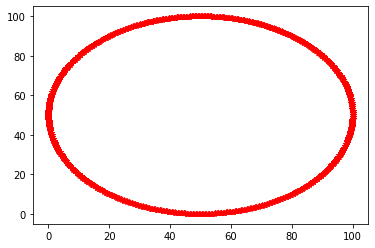

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.8165510013036672, 0.19809999999999972]

Error:  1.8556532845694905e-24


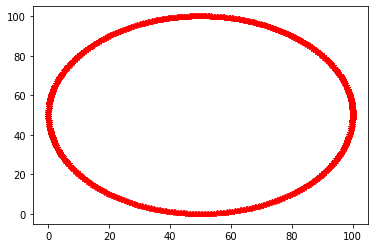

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999996, 0.42231544285107264]

Error:  4.998222695480331e-26


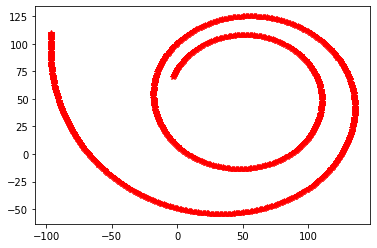

**********************************************************************************

Final parameters:  [0.8999999999999999, 0.9999999999999996, -0.0261154428510732]

Error:  2049912.8994904845


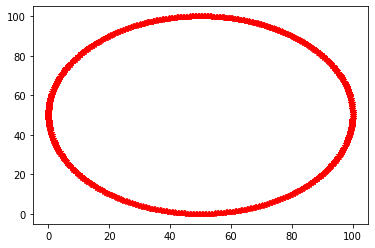

**********************************************************************************

Final parameters:  [1.035085171767299, 0.9999999999999996, 0.19809999999999972]

Error:  7.190552827694717e-21


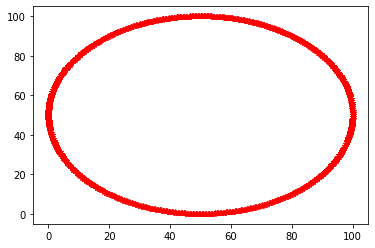

**********************************************************************************

Final parameters:  [0.7649148282327005, 0.9999999999999996, 0.19809999999999972]

Error:  4.957833017133015e-26


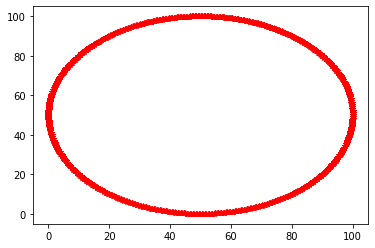

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.1651040988266987, 0.19809999999999972]

Error:  4.553936233659857e-26


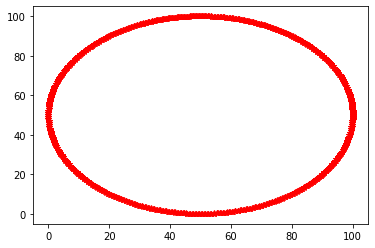

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.1651040988266987, 0.39989389856596536]

Error:  5.336486251639101e-26


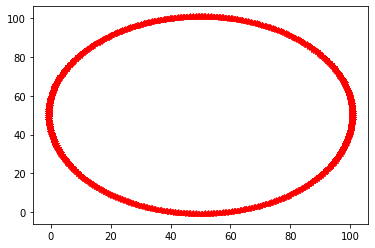

**********************************************************************************

Final parameters:  [0.8999999999999998, 1.1651040988266987, -0.003693898565965914]

Error:  598.0048993515794


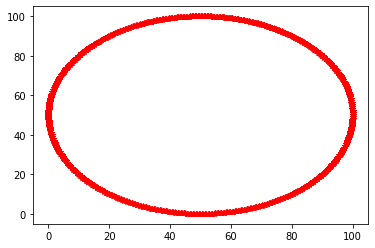

**********************************************************************************

Final parameters:  [1.0215766545905691, 1.1651040988266987, 0.19809999999999972]

Error:  4.041386166722626e-23


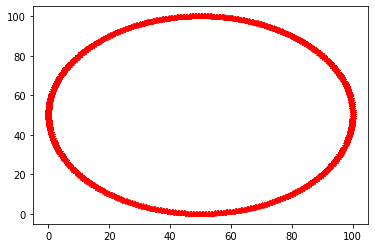

**********************************************************************************

Final parameters:  [0.7784233454094304, 1.1651040988266987, 0.19809999999999972]

Error:  4.690251398082048e-26


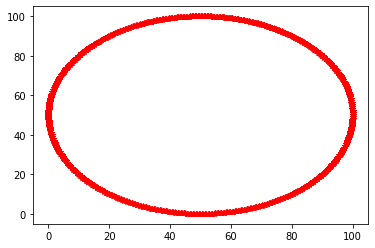

**********************************************************************************

Final parameters:  [0.8999999999999997, 1.3467186075360678, 0.19809999999999972]

Error:  5.447557867094219e-26


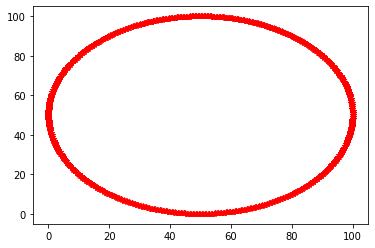

**********************************************************************************

Final parameters:  [0.8999999999999997, 0.9834895901173295, 0.19809999999999972]

Error:  5.523288513995436e-26


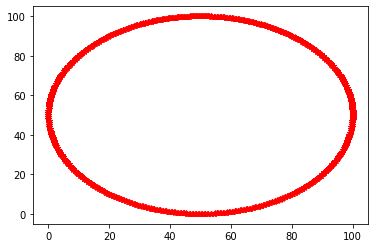

**********************************************************************************

Final parameters:  [0.8999999999999997, 1.1651040988266985, 0.3797145087093688]

Error:  5.1345378599025216e-26


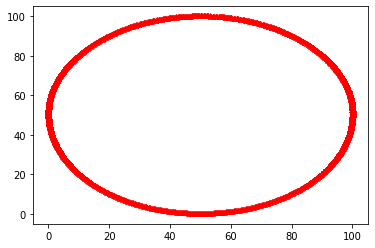

**********************************************************************************

Final parameters:  [0.8999999999999997, 1.1651040988266985, 0.01648549129063065]

Error:  1.2306967633428507


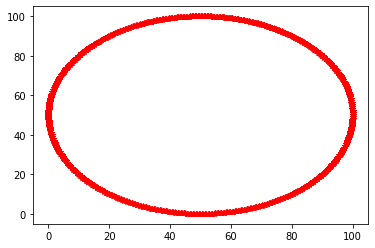

**********************************************************************************

Final parameters:  [1.0094189891315122, 1.1651040988266985, 0.19809999999999972]

Error:  9.161843175011315e-24


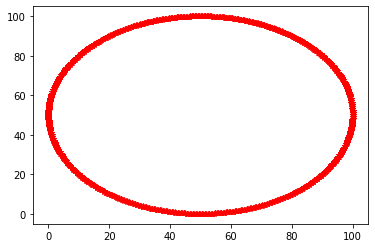

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266985, 0.19809999999999972]

Error:  4.4529620377915674e-26


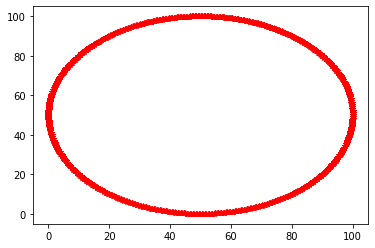

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.3285571566651306, 0.19809999999999972]

Error:  5.962526266022496e-26


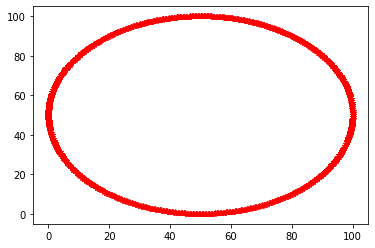

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.0016510409882662, 0.19809999999999972]

Error:  5.270853024324712e-26


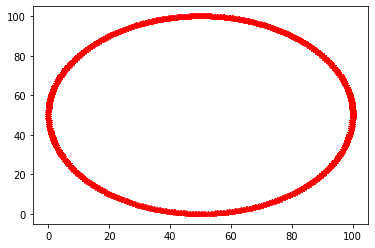

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266983, 0.3615530578384319]

Error:  5.492996255234949e-26


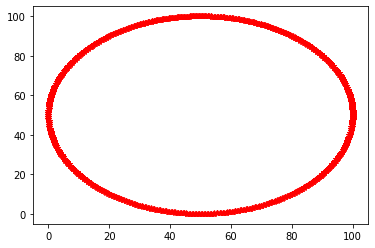

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266983, 0.03464694216156755]

Error:  0.0029873150623518185


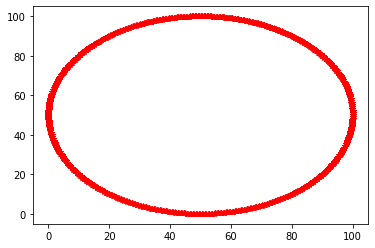

**********************************************************************************

Final parameters:  [0.910941898913151, 1.1651040988266983, 0.19809999999999972]

Error:  5.084050761968377e-26


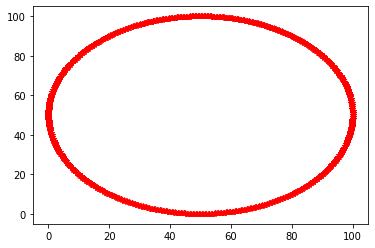

**********************************************************************************

Final parameters:  [0.6702201228238236, 1.1651040988266983, 0.19809999999999972]

Error:  1.305091481597642e-25


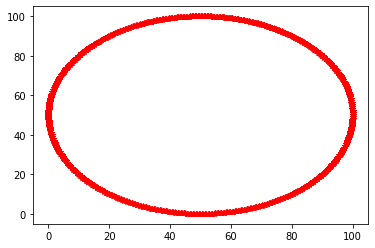

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.3122118508812872, 0.19809999999999972]

Error:  5.765626584079331e-26


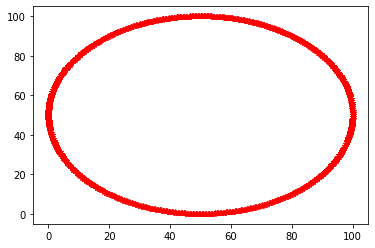

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.0179963467721094, 0.19809999999999972]

Error:  5.962526266022496e-26


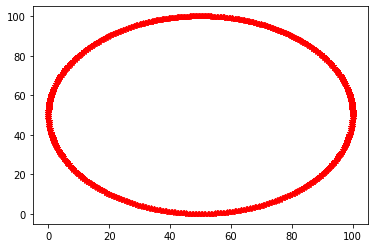

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266983, 0.34520775205458865]

Error:  5.518239804202022e-26


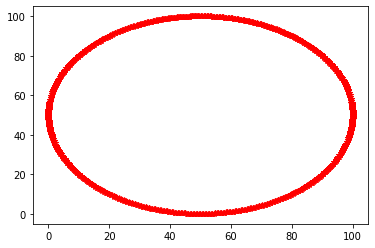

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266983, 0.05099224794541074]

Error:  1.7048863486840332e-05


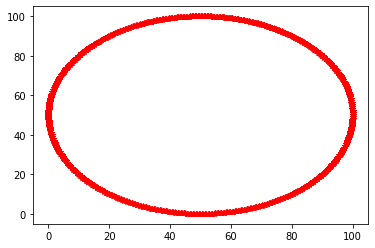

**********************************************************************************

Final parameters:  [0.8989058101086846, 1.1651040988266983, 0.1980999999999997]

Error:  5.644457549037384e-26


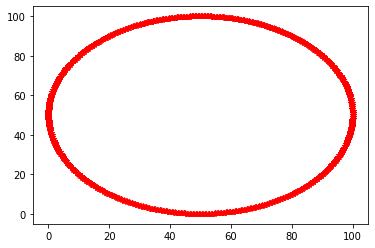

**********************************************************************************

Final parameters:  [0.68225621162829, 1.1651040988266983, 0.1980999999999997]

Error:  7.41150597673245e-26


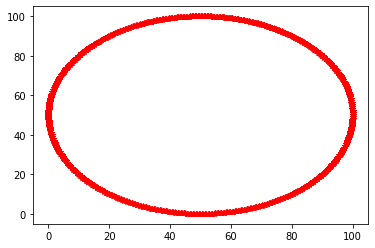

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.2975010756758283, 0.1980999999999997]

Error:  5.210268506803739e-26


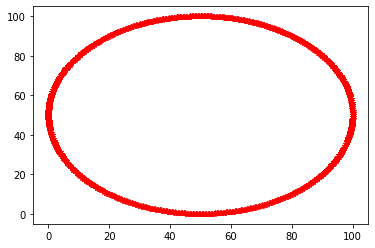

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.032707121977568, 0.1980999999999997]

Error:  5.0790020521749624e-26


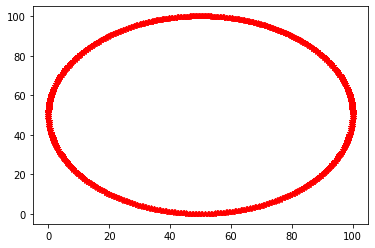

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266983, 0.33049697684912976]

Error:  4.8568588212647255e-26


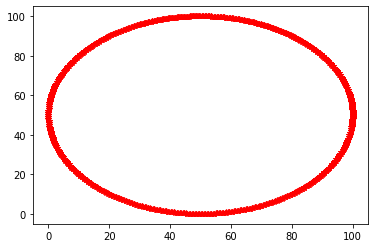

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.1651040988266983, 0.06570302315086962]

Error:  1.2401018204333244e-07


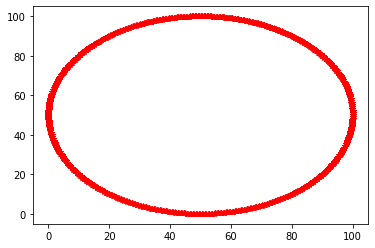

**********************************************************************************

Final parameters:  [0.8880733301846649, 1.1651040988266983, 0.1980999999999997]

Error:  5.220365926390568e-26


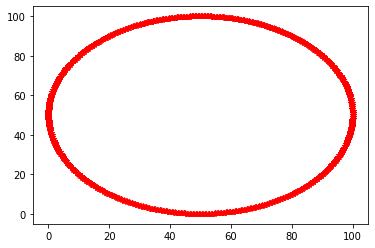

**********************************************************************************

Final parameters:  [0.6930886915523098, 1.1651040988266983, 0.1980999999999997]

Error:  5.568726902136167e-26


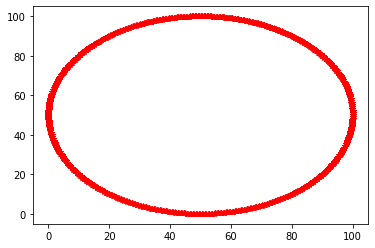

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.2842613779909153, 0.1980999999999997]

Error:  5.659603678417627e-26


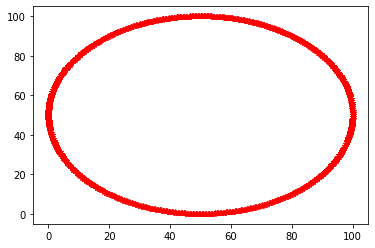

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.0459468196624813, 0.1980999999999997]

Error:  5.084050761968377e-26


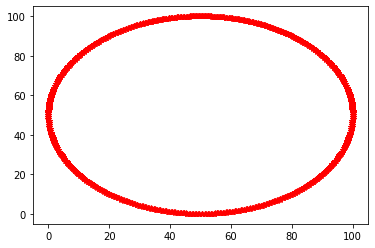

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.1651040988266983, 0.31725727916421675]

Error:  5.386973349573245e-26


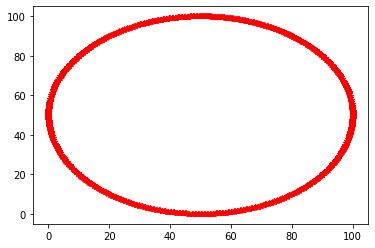

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.1651040988266983, 0.07894272083578263]

Error:  1.0507534800133458e-09


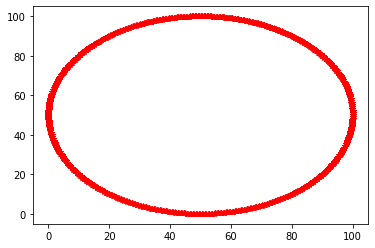

**********************************************************************************

Final parameters:  [0.8783240982530472, 1.1651040988266983, 0.1980999999999997]

Error:  5.280950443911541e-26


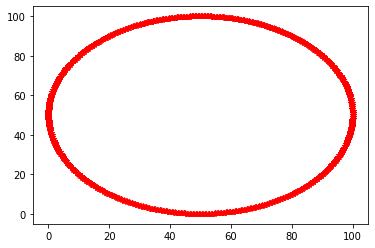

**********************************************************************************

Final parameters:  [0.7028379234839276, 1.1651040988266983, 0.1980999999999997]

Error:  4.9830765661000874e-26


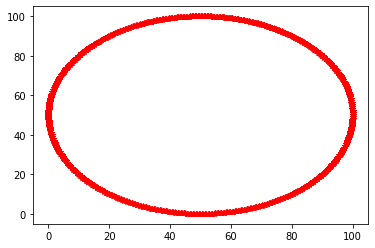

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.2723456500744936, 0.1980999999999997]

Error:  5.447557867094219e-26


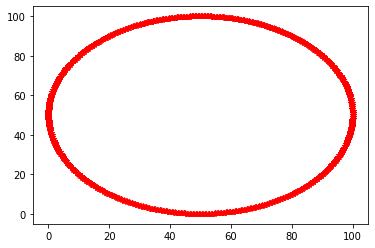

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.0578625475789027, 0.1980999999999997]

Error:  5.275901734118127e-26


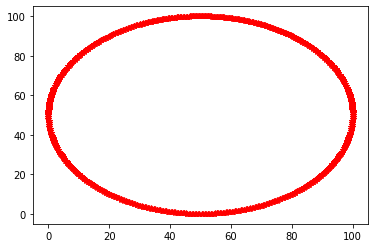

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.165104098826698, 0.30534155124779505]

Error:  5.523288513995436e-26


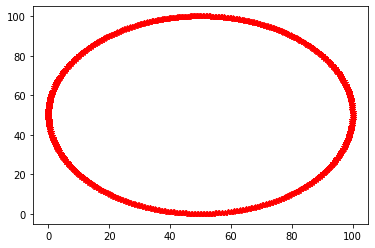

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.165104098826698, 0.09085844875220433]

Error:  9.77230560833776e-12


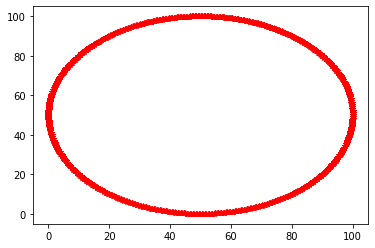

**********************************************************************************

Final parameters:  [0.8695497895145913, 1.165104098826698, 0.1980999999999997]

Error:  5.599019160896653e-26


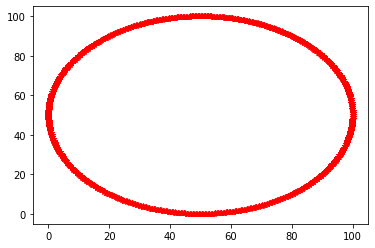

**********************************************************************************

Final parameters:  [0.7116122322223836, 1.165104098826698, 0.1980999999999997]

Error:  5.174927538249837e-26


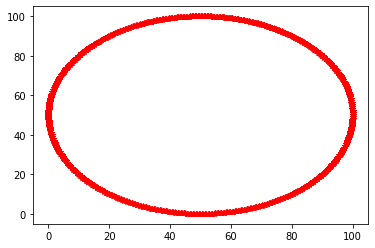

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.261621494949714, 0.1980999999999997]

Error:  5.013368824860574e-26


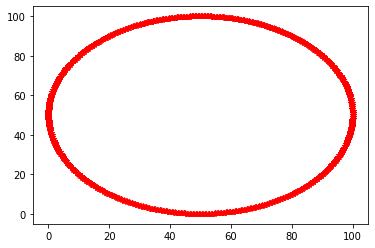

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.0685867027036822, 0.1980999999999997]

Error:  5.230463345977397e-26


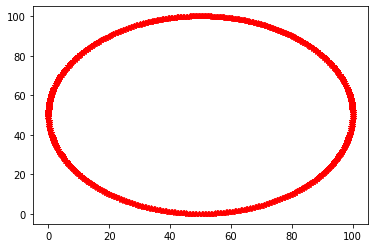

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.165104098826698, 0.2946173961230155]

Error:  4.9426868877527716e-26


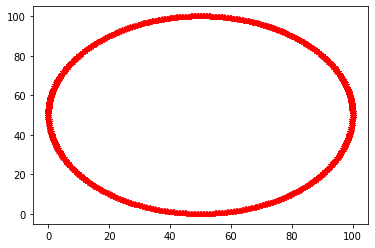

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.165104098826698, 0.10158260387698387]

Error:  9.435200038451099e-14


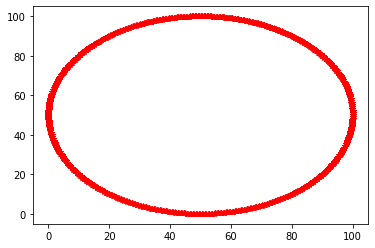

**********************************************************************************

Final parameters:  [0.8616529116499809, 1.165104098826698, 0.1980999999999997]

Error:  4.690251398082048e-26


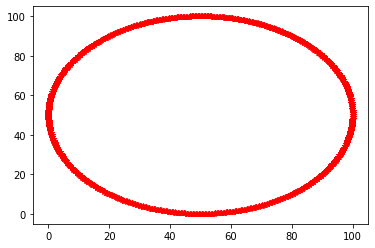

**********************************************************************************

Final parameters:  [0.7195091100869939, 1.165104098826698, 0.1980999999999997]

Error:  5.720188195938601e-26


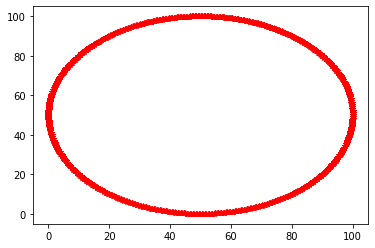

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.2519697553374123, 0.1980999999999997]

Error:  5.230463345977397e-26


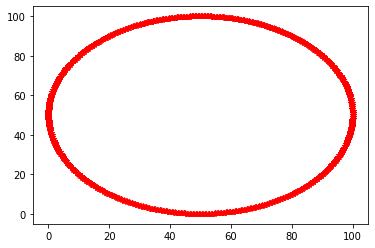

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.0782384423159836, 0.1980999999999997]

Error:  5.48289883564812e-26


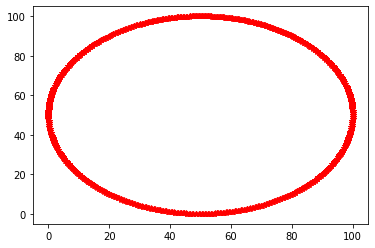

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.1651040988266979, 0.2849656565107139]

Error:  5.311242702672028e-26


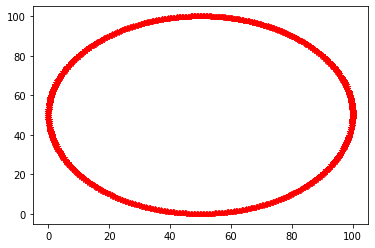

**********************************************************************************

Final parameters:  [0.7905810108684874, 1.1651040988266979, 0.11123434348928543]

Error:  8.856513880390293e-16


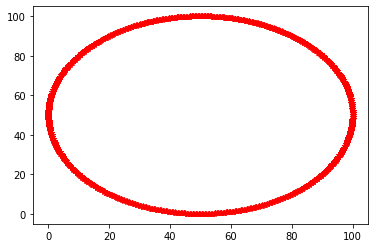

**********************************************************************************

Final parameters:  [0.8545457215718315, 1.1651040988266979, 0.19809999999999967]

Error:  5.614165290276897e-26


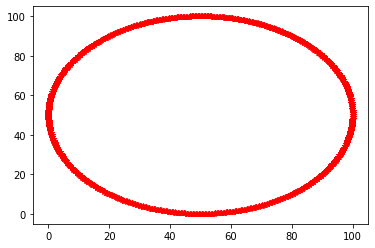

**********************************************************************************

Final parameters:  [0.7266163001651432, 1.1651040988266979, 0.19809999999999967]

Error:  5.341534961432515e-26


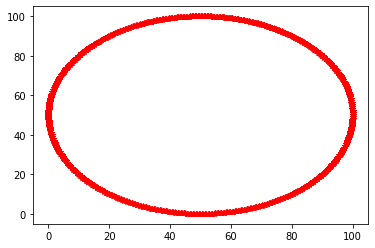

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.2432831896863408, 0.19809999999999967]

Error:  5.119391730522278e-26


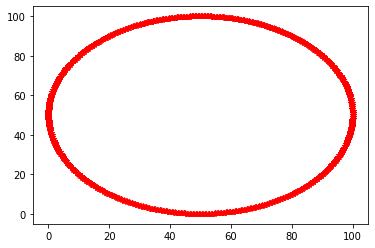

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.0869250079670552, 0.19809999999999967]

Error:  5.179976248043252e-26


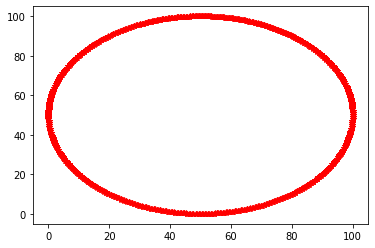

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.165104098826698, 0.2762790908596425]

Error:  5.62931141965714e-26


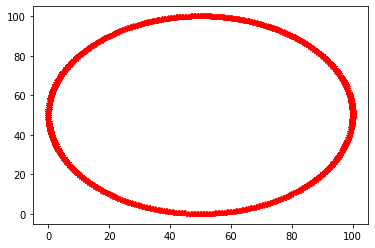

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.165104098826698, 0.11992090914035683]

Error:  7.372500273887283e-18
[x=0.00000 y=51.00000 orient=1.57080]
[x=0.00313 y=51.99999 orient=1.56453]
[x=0.01832 y=52.99986 orient=1.54668]
[x=0.05494 y=53.99917 orient=1.52165]
[x=0.11691 y=54.99722 orient=1.49593]
[x=0.20333 y=55.99345 orient=1.47259]
[x=0.31203 y=56.98751 orient=1.45117]
[x=0.44174 y=57.97904 orient=1.43026]
[x=0.59231 y=58.96762 orient=1.40905]
[x=0.76396 y=59.95276 orient=1.38752]
[x=0.95682 y=60.93397 orient=1.36592]
[x=1.17075 y=61.91080 orient=1.34447]
[x=1.40550 y=62.88283 orient=1.32318]
[x=1.66083 y=63.84967 orient=1.30202]
[x=1.93653 y=64.81089 orient=1.28094]
[x=2.23240 y=65.76610 orient=1.25991]
[x=2.54826 y=66.71489 orient=1.23894]
[x=2.88392 y=67.65685 orient=1.21803]
[x=3.23916 y=68.59161 orient=1.19719]
[x=3.61378 y=69.51877 orient=1.17642]
[x=4.00755 y=70.43796 orient=1.15570]
[x=4.42

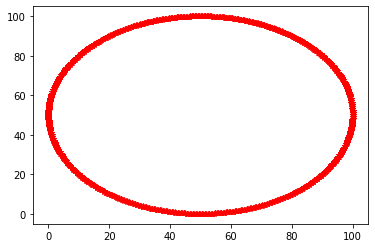

**********************************************************************************

Final parameters:  [0.7905810108684873, 1.165104098826698, 0.19809999999999967]

Error:  6.144279818585417e-26


In [ ]:
from math import *
import random
import matplotlib.pyplot as plt

# ------------------------------------------------
# 
# this is the robot class
#
class robot:
    # --------
    # init: 
    #    creates robot and initializes location/orientation to 0, 0, 0
    #

    def __init__(self, length = 20.0):
        self.x = 0.0
        self.y = 0.0
        self.orientation = 0.0
        self.length = length
        self.steering_noise = 0.0
        self.distance_noise = 0.0
        self.steering_drift = 0.0

    # --------
    # set: 
    #	sets a robot coordinate
    #

    def set(self, new_x, new_y, new_orientation):

        self.x = float(new_x)
        self.y = float(new_y)
        self.orientation = float(new_orientation) % (2.0 * pi)


    # --------
    # set_noise: 
    #	sets the noise parameters
    #

    def set_noise(self, new_s_noise, new_d_noise):
        # makes it possible to change the noise parameters
        # this is often useful in particle filters
        self.steering_noise = float(new_s_noise)
        self.distance_noise = float(new_d_noise)

    # --------
    # set_steering_drift: 
    #	sets the systematical steering drift parameter
    #

    def set_steering_drift(self, drift):
        self.steering_drift = drift
        
    # --------
    # move: 
    #    steering = front wheel steering angle, limited by max_steering_angle
    #    distance = total distance driven, most be non-negative

    def move(self, steering, distance, 
             tolerance = 0.001, max_steering_angle = pi / 4.0):

        if steering > max_steering_angle:
            steering = max_steering_angle
        if steering < -max_steering_angle:
            steering = -max_steering_angle
        if distance < 0.0:
            distance = 0.0


        # make a new copy
        res = robot()
        res.length         = self.length
        res.steering_noise = self.steering_noise
        res.distance_noise = self.distance_noise
        res.steering_drift = self.steering_drift

        # apply noise
        steering2 = random.gauss(steering, self.steering_noise)
        distance2 = random.gauss(distance, self.distance_noise)

        # apply steering drift
        steering2 += self.steering_drift

        # Execute motion
        turn = tan(steering2) * distance2 / res.length

        if abs(turn) < tolerance:

            # approximate by straight line motion

            res.x = self.x + (distance2 * cos(self.orientation))
            res.y = self.y + (distance2 * sin(self.orientation))
            res.orientation = (self.orientation + turn) % (2.0 * pi)

        else:

            # approximate bicycle model for motion

            radius = distance2 / turn
            cx = self.x - (sin(self.orientation) * radius)
            cy = self.y + (cos(self.orientation) * radius)
            res.orientation = (self.orientation + turn) % (2.0 * pi)
            res.x = cx + (sin(res.orientation) * radius)
            res.y = cy - (cos(res.orientation) * radius)

        return res

    def __repr__(self):
        return '[x=%.5f y=%.5f orient=%.5f]'  % (self.x, self.y, self.orientation)
   
   # modify CTE to a circle with r= 50
    def cte(self, radius):           
         #center = [50, 50] # y, x coordinates of the center of the circle
         center = [radius, radius]
         cte = ((self.x - center[1])**2 + (self.y - center[0])**2)**0.5 - radius
         return cte

# ------------------------------------------------------------------------
#
# run - does a single control run.


def run(params, radius, printflag = False):
    myrobot = robot()
    myrobot.set(0.0, radius, pi / 2.0)
    speed = 10.0 # increased speed to 10
    dt = 1/10
    err = 0.0
    int_crosstrack_error = 0.0
    N = 1000
    crosstrack_error = myrobot.cte(radius)
    x_trajectory = []
    y_trajectory = []

    for i in range(N*2):
        diff_crosstrack_error = - crosstrack_error
        crosstrack_error = myrobot.cte(radius)
        diff_crosstrack_error = (diff_crosstrack_error + crosstrack_error)/dt
        int_crosstrack_error += crosstrack_error*dt                           #added / dt and               *dt here
        steer = -params[0] * crosstrack_error - params[1] * diff_crosstrack_error - params[2] * int_crosstrack_error
        myrobot = myrobot.move(steer, speed*dt)

        if i >= N:
            err += crosstrack_error ** 2
            x_trajectory.append(myrobot.x)
            y_trajectory.append(myrobot.y)
        if printflag:
            print (myrobot)

    plt.plot(x_trajectory,y_trajectory, color="r", linestyle="--", marker="*", linewidth=1.0)
    plt.show()
    print('**********************************************************************************')
    print('\nFinal parameters: ', params)
    print('\nError: ', err)
    return err / float(N)  

########twiddle
def twiddle(radius,tol=0.2):  
    p = [0.9, 0.0, 0.0]
    # PID -> dp [1.0, 1.0, 1.0]
    dp = [1.0, 1.0, 1.0]
    best_err = run(p, radius)
    it = 0
    while sum(dp) > tol:
        # print("Iteration {}, best error = {}".format(it, best_err))
        for i in range(len(p)):
            p[i] += dp[i]
            err = run(p, radius)
            if err < best_err:
                best_err = err
                dp[i] *= 1.1
            else:
                p[i] -= 2 * dp[i]
                err = run(p, radius)
                if err < best_err:
                    best_err = err
                    dp[i] *= 1.1
                else:
                    p[i] += dp[i]
                    dp[i] *= 0.9
        it += 1
    return p, best_err

    
## changed r to 50
radius = 50.0
#params = [10.0, 15.0, 0]
params,err = twiddle(radius)
err = run(params, radius,True)

#### Diskussion
dt = 1, Error:  9.425436313325484e-25 

dt = 1/10, Eror: 6.144279818585417e-26

So I got a somewhat better error when using dt=1/10, but also got an already good error when dt = 1


for dt = 1/10 the PID gains where: [0.7905810108684873, 1.165104098826698, 0.19809999999999967]

and the diagram of the last N steps can be found above